# Mult. Regression: with Catboost and Grid Search

In [1]:
#Import libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import shap

%matplotlib inline
sns.set_style('ticks')
plt.style.use('tableau-colorblind10')

In [2]:
# Import data file
dataset=pd.read_csv('insurance.csv')
dataset.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [3]:
dataset.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


### Histogram of charges (label)

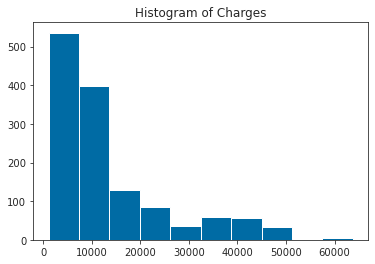

In [4]:
plt.hist(dataset['charges'])
plt.title("Histogram of Charges")
plt.show() 

Response is skewed to the right. Will perform regression analysis as is.

### Create X and y arrays

In [5]:
# Create X set and y set. They are arrays and vectors
#X=dataset.iloc[:,0].values
X = dataset.drop('charges', axis=1)
y = dataset.charges
print(X.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
dtypes: float64(1), int64(2), object(3)
memory usage: 62.8+ KB
None


### Defining categorical indices

Catboost takes care of categorical features automatically.

In [6]:
print("Types are:")
print(X.dtypes)

cat_feat_indices = np.where(X.dtypes == object)[0]
print("Categorical indices are:", cat_feat_indices)

Types are:
age           int64
sex          object
bmi         float64
children      int64
smoker       object
region       object
dtype: object
Categorical indices are: [1 4 5]


### Creating Training-Validation and Test Data Sets

In [7]:
from sklearn.model_selection import train_test_split
X_tv, X_test, y_tv, y_test=train_test_split(X,y, test_size=0.2, random_state=44)

In [8]:
print(X_tv)

      age     sex     bmi  children smoker     region
708    31  female  30.495         3     no  northeast
1252   20    male  27.300         0    yes  southwest
916    43  female  26.885         0    yes  northwest
722    62    male  37.400         0     no  southwest
642    61    male  33.915         0     no  northeast
...   ...     ...     ...       ...    ...        ...
84     37  female  34.800         2    yes  southwest
96     54  female  30.800         3     no  southwest
571    18  female  37.290         1     no  southeast
1197   41    male  33.550         0     no  southeast
753    58  female  22.770         0     no  southeast

[1070 rows x 6 columns]


In [9]:
print(y_tv)

708      6113.23105
1252    16232.84700
916     21774.32215
722     12979.35800
642     13143.86485
           ...     
84      39836.51900
96      12105.32000
571      2219.44510
1197     5699.83750
753     11833.78230
Name: charges, Length: 1070, dtype: float64


In [10]:
X_train, X_validate, y_train, y_validate=train_test_split(X_tv,y_tv, test_size=0.2, random_state=44)
print(X_train)
print(y_train)

      age     sex     bmi  children smoker     region
1170   18    male  27.360         1    yes  northeast
967    44    male  25.365         1     no  northwest
751    21    male  28.975         0     no  northwest
850    37  female  30.780         0    yes  northeast
858    25  female  32.230         1     no  southeast
...   ...     ...     ...       ...    ...        ...
1035   54  female  23.000         3     no  southwest
951    51    male  42.900         2    yes  southeast
619    55  female  37.100         0     no  southwest
302    56  female  37.510         2     no  southeast
364    21  female  21.890         2     no  southeast

[856 rows x 6 columns]
1170    17178.68240
967      7518.02535
751      1906.35825
850     37270.15120
858     18218.16139
           ...     
1035    12094.47800
951     47462.89400
619     10713.64400
302     12265.50690
364      3180.51010
Name: charges, Length: 856, dtype: float64


### Training Multiple Linear Regression on Training set: Baseline model with RMSE as loss function.

In [11]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance

from catboost import CatBoostRegressor, Pool
from sklearn.model_selection import train_test_split
from catboost.utils import eval_metric

In [12]:
model_RMSE=CatBoostRegressor(iterations=200, loss_function='RMSE')
model_RMSE.fit(X_train, y_train,cat_features=cat_feat_indices,eval_set=(X_validate, y_validate),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.12195
0:	learn: 11222.1069188	test: 10931.9933002	best: 10931.9933002 (0)	total: 46.8ms	remaining: 9.31s
1:	learn: 10196.8023121	test: 9901.0271370	best: 9901.0271370 (1)	total: 47.6ms	remaining: 4.71s
2:	learn: 9405.6064115	test: 9116.6487734	best: 9116.6487734 (2)	total: 48.3ms	remaining: 3.17s
3:	learn: 8694.1224977	test: 8394.9967804	best: 8394.9967804 (3)	total: 53ms	remaining: 2.6s
4:	learn: 8081.1490184	test: 7835.1613684	best: 7835.1613684 (4)	total: 53.7ms	remaining: 2.1s
5:	learn: 7555.5429354	test: 7372.2942302	best: 7372.2942302 (5)	total: 54.4ms	remaining: 1.76s
6:	learn: 7042.7475234	test: 6840.1427612	best: 6840.1427612 (6)	total: 54.8ms	remaining: 1.51s
7:	learn: 6653.6888002	test: 6498.8090937	best: 6498.8090937 (7)	total: 55ms	remaining: 1.32s
8:	learn: 6342.7907142	test: 6203.9820743	best: 6203.9820743 (8)	total: 55.5ms	remaining: 1.18s
9:	learn: 6021.9185009	test: 5913.8248704	best: 5913.8248704 (9)	total: 55.8ms	remaining: 1.06s
10:	learn: 57

117:	learn: 3780.9755057	test: 4583.6128560	best: 4580.0722960 (74)	total: 117ms	remaining: 81.6ms
118:	learn: 3779.6952583	test: 4585.1108884	best: 4580.0722960 (74)	total: 118ms	remaining: 80.3ms
119:	learn: 3772.3594570	test: 4588.1306002	best: 4580.0722960 (74)	total: 118ms	remaining: 79ms
120:	learn: 3762.9295877	test: 4593.3280764	best: 4580.0722960 (74)	total: 119ms	remaining: 77.6ms
121:	learn: 3753.2660259	test: 4593.6607277	best: 4580.0722960 (74)	total: 120ms	remaining: 76.5ms
122:	learn: 3746.6658419	test: 4594.3445461	best: 4580.0722960 (74)	total: 120ms	remaining: 75.2ms
123:	learn: 3738.3137064	test: 4596.4257910	best: 4580.0722960 (74)	total: 121ms	remaining: 74.1ms
124:	learn: 3724.3179221	test: 4599.8124165	best: 4580.0722960 (74)	total: 122ms	remaining: 73.1ms
125:	learn: 3721.6891348	test: 4600.6199543	best: 4580.0722960 (74)	total: 123ms	remaining: 72.1ms
126:	learn: 3718.0903137	test: 4601.7715698	best: 4580.0722960 (74)	total: 124ms	remaining: 71ms
127:	learn: 37

### Predicting Test set results

In [13]:
y_pred=model_RMSE.predict(X_test)

In [14]:
np.set_printoptions(precision=2) 
#  To display with two decimal points all printed values

### Representation of Y_pred vs Y_test in simple scatter plot and line representation.
The gold line represents an ideal model y_pred=y_test

The blue line represents the actual match between y_pred and y_test.

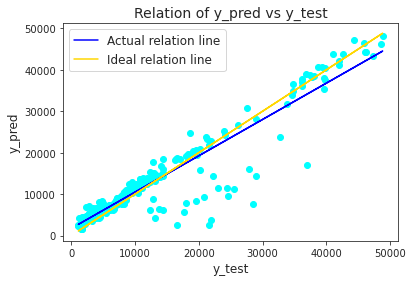

Slope: m= 0.88
Intercept: b= 1706.64


In [15]:
plt.scatter(y_test, y_pred,  color='cyan')
m, b = np.polyfit(y_test, y_pred, 1) # 1 is the degree of the polynomial to fit.
plt.plot(y_test, m*y_test+b, color='blue', label="Actual relation line")
plt.plot(y_test, y_test, color='gold', label="Ideal relation line")
plt.title("Relation of y_pred vs y_test", fontsize=14)
plt.xlabel("y_test", fontsize=12)
plt.ylabel("y_pred", fontsize=12)
plt.legend(fontsize=12)
plt.show()
print("Slope: m=","{:.2f}".format(m))
print("Intercept: b=","{:.2f}".format(b))

### Calculating model's Aspect Ratio: AR
The aspect ratio is the length along the 45 degree line divided bythe width of the data points at the middle of the scatterplot.

A good aspect ratio will be at least 7:1 or greater.

Note: This assumes that the scatter plots are not exhibiting bias.

In [16]:
#Calculating aspect ratio with correlation coefficient and R^2 between Y_pred and Y_test
correlation_matrix = np.corrcoef(y_test, y_pred)
correlation_xy = correlation_matrix[0,1]
r_squared = correlation_xy**2
print("R-squared between y_pred and y_test: ", "{:.2f}".format(r_squared))

R-squared between y_pred and y_test:  0.87


In [17]:
# Aspect ratio calculation (precision)
AR=(1-correlation_xy)**(0.5-1)
print(" 'Aspect Ratio': ", "{:.2f}".format(AR))

 'Aspect Ratio':  3.90


A good correlation coefficient between y_pred and y_test is >=0.98, yielding an aspect ratio of 7 to 1 (minimum suggested when comparing results of a model against real values (y_test).


In [18]:
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))
r2 = r2_score(y_test, y_pred)
print('Testing performance of baseline model')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance of baseline model
RMSE: 4096.48
R2: 0.87


### Feature Importance and Shap values

Text(0.5, 0, 'CatBoost Feature Importance')

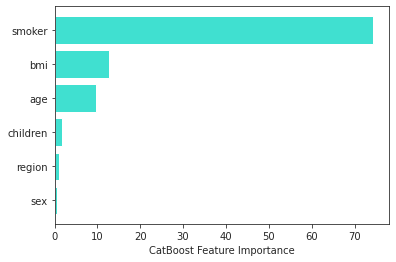

In [19]:
sorted_feature_importance = model_RMSE.feature_importances_.argsort()
plt.barh(dataset.columns[sorted_feature_importance], 
        model_RMSE.feature_importances_[sorted_feature_importance], 
        color='turquoise')
plt.xlabel("CatBoost Feature Importance")

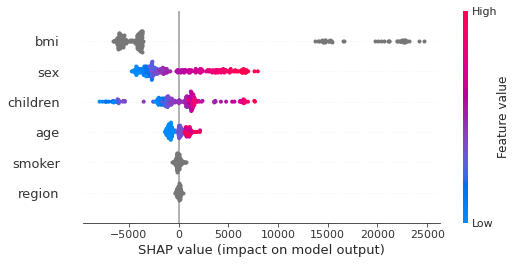

In [20]:
explainer = shap.TreeExplainer(model_RMSE)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names = dataset.columns[sorted_feature_importance])

SHapley Additive exPlanations (SHAP) plots explain the output of our ML model assigning an importance value to each feature for a given prediction. SHAP values tell which features are driving the prediction of our target/label.

Colors represent the feature value (red high, blue low). The higher the SHAP value, the larger the predictor’s attribution. This is: SHAP values represent a predictor’s responsibility for a change in the model output.

### Catboost with transformed label


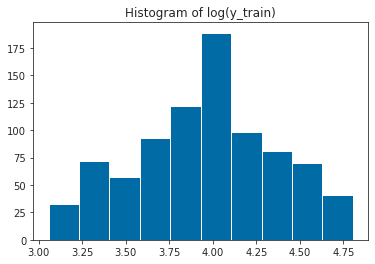

In [21]:
y_train_t=np.log10(y_train)
y_test_t=np.log10(y_test)
y_validate_t=np.log10(y_validate)
plt.hist(y_train_t)
plt.title("Histogram of log(y_train)")
plt.show() 

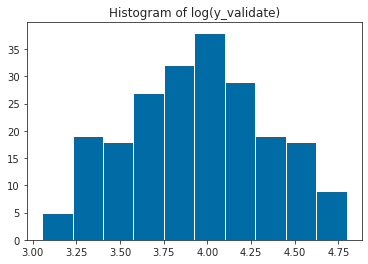

In [22]:
plt.hist(y_validate_t)
plt.title("Histogram of log(y_validate)")
plt.show() 

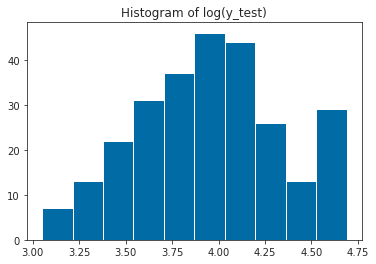

In [23]:
plt.hist(y_test_t)
plt.title("Histogram of log(y_test)")
plt.show() 

In [24]:
model_rmse_t=CatBoostRegressor(iterations=200, loss_function='RMSE')
model_rmse_t.fit(X_train, y_train_t,cat_features=cat_feat_indices,eval_set=(X_validate, y_validate_t),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.12195
0:	learn: 0.3713920	test: 0.3647709	best: 0.3647709 (0)	total: 938us	remaining: 187ms
1:	learn: 0.3419756	test: 0.3351884	best: 0.3351884 (1)	total: 1.59ms	remaining: 158ms
2:	learn: 0.3170050	test: 0.3097466	best: 0.3097466 (2)	total: 2.61ms	remaining: 171ms
3:	learn: 0.2956202	test: 0.2877245	best: 0.2877245 (3)	total: 3.36ms	remaining: 165ms
4:	learn: 0.2758370	test: 0.2674537	best: 0.2674537 (4)	total: 4.15ms	remaining: 162ms
5:	learn: 0.2585451	test: 0.2490971	best: 0.2490971 (5)	total: 4.85ms	remaining: 157ms
6:	learn: 0.2430085	test: 0.2326252	best: 0.2326252 (6)	total: 5.68ms	remaining: 157ms
7:	learn: 0.2305474	test: 0.2188623	best: 0.2188623 (7)	total: 6.46ms	remaining: 155ms
8:	learn: 0.2202741	test: 0.2084807	best: 0.2084807 (8)	total: 7.4ms	remaining: 157ms
9:	learn: 0.2120209	test: 0.1994193	best: 0.1994193 (9)	total: 7.93ms	remaining: 151ms
10:	learn: 0.2052318	test: 0.1923387	best: 0.1923387 (10)	total: 8.31ms	remaining: 143ms
11:	learn: 0.1

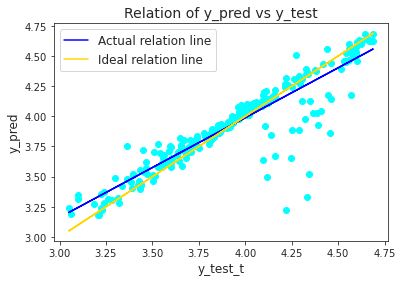

Slope: m= 0.83
Intercept: b= 0.68


In [25]:
y_pred=model_rmse_t.predict(X_test)
plt.scatter(y_test_t, y_pred,  color='cyan')
m, b = np.polyfit(y_test_t, y_pred, 1) # 1 is the degree of the polynomial to fit.
plt.plot(y_test_t, m*y_test_t+b, color='blue', label="Actual relation line")
plt.plot(y_test_t, y_test_t, color='gold', label="Ideal relation line")
plt.title("Relation of y_pred vs y_test", fontsize=14)
plt.xlabel("y_test_t", fontsize=12)
plt.ylabel("y_pred", fontsize=12)
plt.legend(fontsize=12)
plt.show()
print("Slope: m=","{:.2f}".format(m))
print("Intercept: b=","{:.2f}".format(b))

In [26]:
#Calculating aspect rati with correlation coefficient and R^2 between Y_pred and Y_test
correlation_matrix = np.corrcoef(y_test_t, y_pred)
correlation_xy = correlation_matrix[0,1]
r_squared = correlation_xy**2
print("R-squared between y_pred and y_test: ", "{:.2f}".format(r_squared))

R-squared between y_pred and y_test:  0.82


In [27]:
# Aspect ratio calculation (precision)
AR=(1-correlation_xy)**(0.5-1)
print(" 'Aspect Ratio': ", "{:.2f}".format(AR))

 'Aspect Ratio':  3.27


In [28]:
rmse = (np.sqrt(mean_squared_error(y_test_t, y_pred)))
r2 = r2_score(y_test_t, y_pred)
print('Testing performance of baseline model')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance of baseline model
RMSE: 0.16
R2: 0.82


### Grid search of Catboost baseline model

In [29]:
from catboost import CatBoost
param_grid = {'iterations': [100, 150, 200, 500, 1000],
        'learning_rate': [0.01, 0.02, 0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3, 5]}
model_rmse=CatBoostRegressor(loss_function='RMSE', cat_features=cat_feat_indices)

In [30]:
Grid_search_result=model_rmse.grid_search(param_grid,
            X_tv,
            y_tv,
            cv=3,
            partition_random_seed=0,
            calc_cv_statistics=False,
            search_by_train_test_split=False, #Disabled for small dataset
            refit=True,
            shuffle=True,
            stratified=None, #Only true for classification
            train_size=0.8,
            verbose=0,
            plot=True)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 17982.6219974	test: 17969.4651807	best: 17969.4651807 (0)
1:	learn: 17830.5843900	test: 17817.4701947	best: 17817.4701947 (1)
2:	learn: 17674.9671028	test: 17660.9964153	best: 17660.9964153 (2)
3:	learn: 17529.9632910	test: 17515.6201283	best: 17515.6201283 (3)
4:	learn: 17377.9234384	test: 17364.4024801	best: 17364.4024801 (4)
5:	learn: 17234.5989119	test: 17221.7990290	best: 17221.7990290 (5)
6:	learn: 17087.3241268	test: 17075.4853917	best: 17075.4853917 (6)
7:	learn: 16942.1802217	test: 16930.1568269	best: 16930.1568269 (7)
8:	learn: 16796.3382237	test: 16786.3357651	best: 16786.3357651 (8)
9:	learn: 16653.8766064	test: 16643.4399340	best: 16643.4399340 (9)
10:	learn: 16509.9779591	test: 16499.5957437	best: 16499.5957437 (10)
11:	learn: 16377.9361983	test: 16367.6276549	best: 16367.6276549 (11)
12:	learn: 16247.7521955	test: 16237.7883434	best: 16237.7883434 (12)
13:	learn: 16107.5827351	test: 16097.6607616	best: 16097.6607616 (13)
14:	learn: 15975.2701778	test: 15962.706

0:	learn: 17675.9311822	test: 17663.8650692	best: 17663.8650692 (0)
1:	learn: 17230.6416675	test: 17218.7488731	best: 17218.7488731 (1)
2:	learn: 16784.1250200	test: 16769.6337601	best: 16769.6337601 (2)
3:	learn: 16374.5402543	test: 16360.1816026	best: 16360.1816026 (3)
4:	learn: 15957.1819050	test: 15945.1785150	best: 15945.1785150 (4)
5:	learn: 15574.8079127	test: 15564.9392208	best: 15564.9392208 (5)
6:	learn: 15188.5520445	test: 15181.6897262	best: 15181.6897262 (6)
7:	learn: 14816.2732864	test: 14808.9970100	best: 14808.9970100 (7)
8:	learn: 14449.5743811	test: 14448.4650326	best: 14448.4650326 (8)
9:	learn: 14100.6296731	test: 14098.4356686	best: 14098.4356686 (9)
10:	learn: 13754.6599304	test: 13752.7465526	best: 13752.7465526 (10)
11:	learn: 13451.3084042	test: 13449.8601889	best: 13449.8601889 (11)
12:	learn: 13149.3305323	test: 13150.5685659	best: 13150.5685659 (12)
13:	learn: 12834.1048848	test: 12835.5930144	best: 12835.5930144 (13)
14:	learn: 12543.7261430	test: 12550.249

0:	learn: 17983.1669619	test: 17970.0065696	best: 17970.0065696 (0)
1:	learn: 17831.4718215	test: 17818.3475720	best: 17818.3475720 (1)
2:	learn: 17676.4170542	test: 17662.4476249	best: 17662.4476249 (2)
3:	learn: 17531.9330809	test: 17517.6019330	best: 17517.6019330 (3)
4:	learn: 17380.3604663	test: 17366.8476267	best: 17366.8476267 (4)
5:	learn: 17237.3487743	test: 17224.5391822	best: 17224.5391822 (5)
6:	learn: 17090.5294857	test: 17078.6821315	best: 17078.6821315 (6)
7:	learn: 16945.8564438	test: 16933.8295186	best: 16933.8295186 (7)
8:	learn: 16800.5092532	test: 16790.4905882	best: 16790.4905882 (8)
9:	learn: 16658.4777047	test: 16648.0262363	best: 16648.0262363 (9)
10:	learn: 16516.4370718	test: 16506.3568566	best: 16506.3568566 (10)
11:	learn: 16384.7728852	test: 16374.7430328	best: 16374.7430328 (11)
12:	learn: 16254.8576852	test: 16245.1554094	best: 16245.1554094 (12)
13:	learn: 16115.0353442	test: 16105.3671494	best: 16105.3671494 (13)
14:	learn: 15983.1893213	test: 15971.005

0:	learn: 17677.5610100	test: 17665.4844505	best: 17665.4844505 (0)
1:	learn: 17233.2380033	test: 17221.3155455	best: 17221.3155455 (1)
2:	learn: 16788.2813037	test: 16773.7939134	best: 16773.7939134 (2)
3:	learn: 16380.0519691	test: 16365.7396009	best: 16365.7396009 (3)
4:	learn: 15963.8501757	test: 15951.8821795	best: 15951.8821795 (4)
5:	learn: 15582.1564376	test: 15572.2804164	best: 15572.2804164 (5)
6:	learn: 15196.9268575	test: 15190.0590328	best: 15190.0590328 (6)
7:	learn: 14825.6657122	test: 14818.3958970	best: 14818.3958970 (7)
8:	learn: 14460.0066640	test: 14458.8663281	best: 14458.8663281 (8)
9:	learn: 14111.8762730	test: 14109.6536273	best: 14109.6536273 (9)
10:	learn: 13766.7458099	test: 13764.8083272	best: 13764.8083272 (10)
11:	learn: 13463.9539943	test: 13462.4320343	best: 13462.4320343 (11)
12:	learn: 13162.2632626	test: 13163.3935321	best: 13163.3935321 (12)
13:	learn: 12847.6283934	test: 12849.0133010	best: 12849.0133010 (13)
14:	learn: 12557.8218828	test: 12564.232

0:	learn: 17984.0648310	test: 17970.8985424	best: 17970.8985424 (0)
1:	learn: 17832.9363359	test: 17819.7955698	best: 17819.7955698 (1)
2:	learn: 17678.8087412	test: 17664.8412868	best: 17664.8412868 (2)
3:	learn: 17535.1701673	test: 17520.8590399	best: 17520.8590399 (3)
4:	learn: 17384.3691813	test: 17370.8699368	best: 17370.8699368 (4)
5:	learn: 17241.8653825	test: 17229.0485566	best: 17229.0485566 (5)
6:	learn: 17095.7980532	test: 17083.9451252	best: 17083.9451252 (6)
7:	learn: 16951.9023068	test: 16939.8780544	best: 16939.8780544 (7)
8:	learn: 16807.3710903	test: 16797.3342521	best: 16797.3342521 (8)
9:	learn: 16666.0501924	test: 16655.5828570	best: 16655.5828570 (9)
10:	learn: 16524.7633832	test: 16514.6689201	best: 16514.6689201 (10)
11:	learn: 16393.6941535	test: 16383.6220364	best: 16383.6220364 (11)
12:	learn: 16264.1970451	test: 16254.4336214	best: 16254.4336214 (12)
13:	learn: 16125.0359841	test: 16115.3107097	best: 16115.3107097 (13)
14:	learn: 15994.0068302	test: 15981.956

0:	learn: 17987.5319149	test: 17974.3428171	best: 17974.3428171 (0)
1:	learn: 17838.6197547	test: 17825.4158208	best: 17825.4158208 (1)
2:	learn: 17688.0764958	test: 17674.1155573	best: 17674.1155573 (2)
3:	learn: 17547.6004812	test: 17533.3679784	best: 17533.3679784 (3)
4:	learn: 17399.7998828	test: 17386.3544172	best: 17386.3544172 (4)
5:	learn: 17259.2438940	test: 17246.4299792	best: 17246.4299792 (5)
6:	learn: 17116.0962711	test: 17104.2512991	best: 17104.2512991 (6)
7:	learn: 16975.2174546	test: 16963.2320743	best: 16963.2320743 (7)
8:	learn: 16833.8443617	test: 16823.7665443	best: 16823.7665443 (8)
9:	learn: 16695.2904475	test: 16684.7910377	best: 16684.7910377 (9)
10:	learn: 16556.9289689	test: 16546.8074778	best: 16546.8074778 (10)
11:	learn: 16428.1004861	test: 16417.9662439	best: 16417.9662439 (11)
12:	learn: 16300.2104588	test: 16290.3378909	best: 16290.3378909 (12)
13:	learn: 16163.6307451	test: 16153.8112521	best: 16153.8112521 (13)
14:	learn: 16035.6559521	test: 16024.155

0:	learn: 17990.8134213	test: 17977.6027216	best: 17977.6027216 (0)
1:	learn: 17844.0406632	test: 17830.7779425	best: 17830.7779425 (1)
2:	learn: 17696.8951258	test: 17682.9388138	best: 17682.9388138 (2)
3:	learn: 17559.3075660	test: 17545.1493723	best: 17545.1493723 (3)
4:	learn: 17414.3762389	test: 17400.9815842	best: 17400.9815842 (4)
5:	learn: 17275.6837172	test: 17262.8827250	best: 17262.8827250 (5)
6:	learn: 17135.3217244	test: 17123.4926114	best: 17123.4926114 (6)
7:	learn: 16997.3189190	test: 16985.3776338	best: 16985.3776338 (7)
8:	learn: 16858.9443301	test: 16848.8361443	best: 16848.8361443 (8)
9:	learn: 16723.0412079	test: 16712.5200130	best: 16712.5200130 (9)
10:	learn: 16587.4684321	test: 16577.3284001	best: 16577.3284001 (10)
11:	learn: 16460.7364669	test: 16450.5987997	best: 16450.5987997 (11)
12:	learn: 16334.3909080	test: 16324.4796073	best: 16324.4796073 (12)
13:	learn: 16200.2926126	test: 16190.4477125	best: 16190.4477125 (13)
14:	learn: 16073.5388326	test: 16063.155

0:	learn: 16691.4144752	test: 16682.5475831	best: 16682.5475831 (0)
1:	learn: 15373.4936895	test: 15364.8676087	best: 15364.8676087 (1)
2:	learn: 14170.8907384	test: 14154.8335886	best: 14154.8335886 (2)
3:	learn: 13145.4655208	test: 13124.5634243	best: 13124.5634243 (3)
4:	learn: 12175.1712142	test: 12160.4006791	best: 12160.4006791 (4)
5:	learn: 11365.6990530	test: 11357.6519950	best: 11357.6519950 (5)
6:	learn: 10607.4045419	test: 10610.7066056	best: 10610.7066056 (6)
7:	learn: 9937.5195754	test: 9941.7831176	best: 9941.7831176 (7)
8:	learn: 9310.5208380	test: 9315.0420304	best: 9315.0420304 (8)
9:	learn: 8784.1970151	test: 8787.6751839	best: 8787.6751839 (9)
10:	learn: 8299.8131296	test: 8309.9233556	best: 8309.9233556 (10)
11:	learn: 7924.7154764	test: 7943.0271238	best: 7943.0271238 (11)
12:	learn: 7543.2382880	test: 7563.0215711	best: 7563.0215711 (12)
13:	learn: 7203.5781316	test: 7225.6569697	best: 7225.6569697 (13)
14:	learn: 6954.8459371	test: 6990.8780826	best: 6990.8780826

0:	learn: 17675.9311822	test: 17663.8650692	best: 17663.8650692 (0)
1:	learn: 17230.6416675	test: 17218.7488731	best: 17218.7488731 (1)
2:	learn: 16784.1250200	test: 16769.6337601	best: 16769.6337601 (2)
3:	learn: 16374.5402543	test: 16360.1816026	best: 16360.1816026 (3)
4:	learn: 15957.1819050	test: 15945.1785150	best: 15945.1785150 (4)
5:	learn: 15574.8079127	test: 15564.9392208	best: 15564.9392208 (5)
6:	learn: 15188.5520445	test: 15181.6897262	best: 15181.6897262 (6)
7:	learn: 14816.2732864	test: 14808.9970100	best: 14808.9970100 (7)
8:	learn: 14449.5743811	test: 14448.4650326	best: 14448.4650326 (8)
9:	learn: 14100.6296731	test: 14098.4356686	best: 14098.4356686 (9)
10:	learn: 13754.6599304	test: 13752.7465526	best: 13752.7465526 (10)
11:	learn: 13451.3084042	test: 13449.8601889	best: 13449.8601889 (11)
12:	learn: 13149.3305323	test: 13150.5685659	best: 13150.5685659 (12)
13:	learn: 12834.1048848	test: 12835.5930144	best: 12835.5930144 (13)
14:	learn: 12543.7261430	test: 12550.249

0:	learn: 17830.2440852	test: 17817.6276465	best: 17817.6276465 (0)
1:	learn: 17530.4378746	test: 17517.9088355	best: 17517.9088355 (1)
2:	learn: 17227.0928736	test: 17212.8636578	best: 17212.8636578 (2)
3:	learn: 16948.2138141	test: 16933.2593914	best: 16933.2593914 (3)
4:	learn: 16658.1354132	test: 16644.7809168	best: 16644.7809168 (4)
5:	learn: 16388.2342127	test: 16376.2897961	best: 16376.2897961 (5)
6:	learn: 16113.4889905	test: 16103.5137089	best: 16103.5137089 (6)
7:	learn: 15845.6198109	test: 15835.3524627	best: 15835.3524627 (7)
8:	learn: 15579.2250976	test: 15573.0162120	best: 15573.0162120 (8)
9:	learn: 15322.2050647	test: 15315.2043773	best: 15315.2043773 (9)
10:	learn: 15064.9898111	test: 15058.1470998	best: 15058.1470998 (10)
11:	learn: 14833.9376264	test: 14827.2966250	best: 14827.2966250 (11)
12:	learn: 14608.9903501	test: 14602.9877011	best: 14602.9877011 (12)
13:	learn: 14366.2793106	test: 14360.4224002	best: 14360.4224002 (13)
14:	learn: 14140.4410104	test: 14133.134

0:	learn: 17984.0648310	test: 17970.8985424	best: 17970.8985424 (0)
1:	learn: 17832.9363359	test: 17819.7955698	best: 17819.7955698 (1)
2:	learn: 17678.8087412	test: 17664.8412868	best: 17664.8412868 (2)
3:	learn: 17535.1701673	test: 17520.8590399	best: 17520.8590399 (3)
4:	learn: 17384.3691813	test: 17370.8699368	best: 17370.8699368 (4)
5:	learn: 17241.8653825	test: 17229.0485566	best: 17229.0485566 (5)
6:	learn: 17095.7980532	test: 17083.9451252	best: 17083.9451252 (6)
7:	learn: 16951.9023068	test: 16939.8780544	best: 16939.8780544 (7)
8:	learn: 16807.3710903	test: 16797.3342521	best: 16797.3342521 (8)
9:	learn: 16666.0501924	test: 16655.5828570	best: 16655.5828570 (9)
10:	learn: 16524.7633832	test: 16514.6689201	best: 16514.6689201 (10)
11:	learn: 16393.6941535	test: 16383.6220364	best: 16383.6220364 (11)
12:	learn: 16264.1970451	test: 16254.4336214	best: 16254.4336214 (12)
13:	learn: 16125.0359841	test: 16115.3107097	best: 16115.3107097 (13)
14:	learn: 15994.0068302	test: 15981.956

0:	learn: 16624.8895294	test: 16616.4154952	best: 16616.4154952 (0)
1:	learn: 15274.6433784	test: 15267.1505462	best: 15267.1505462 (1)
2:	learn: 14024.4044585	test: 14008.2056434	best: 14008.2056434 (2)
3:	learn: 12969.2020130	test: 12946.6414714	best: 12946.6414714 (3)
4:	learn: 11978.3660891	test: 11962.2768358	best: 11962.2768358 (4)
5:	learn: 11167.4888600	test: 11158.5399755	best: 11158.5399755 (5)
6:	learn: 10399.9605271	test: 10402.5845225	best: 10402.5845225 (6)
7:	learn: 9724.0126147	test: 9727.5736730	best: 9727.5736730 (7)
8:	learn: 9091.9324847	test: 9095.6378155	best: 9095.6378155 (8)
9:	learn: 8569.1464590	test: 8572.0230921	best: 8572.0230921 (9)
10:	learn: 8095.1143617	test: 8104.7011336	best: 8104.7011336 (10)
11:	learn: 7726.2467411	test: 7742.2209706	best: 7742.2209706 (11)
12:	learn: 7346.9935194	test: 7364.4195464	best: 7364.4195464 (12)
13:	learn: 7014.2409057	test: 7033.2559699	best: 7033.2559699 (13)
14:	learn: 6775.4524518	test: 6808.5988294	best: 6808.5988294

133:	learn: 5300.1046296	test: 5388.6837439	best: 5388.6837439 (133)
134:	learn: 5286.5907265	test: 5375.4492984	best: 5375.4492984 (134)
135:	learn: 5270.6703443	test: 5360.3689293	best: 5360.3689293 (135)
136:	learn: 5255.6115246	test: 5346.3749991	best: 5346.3749991 (136)
137:	learn: 5245.1601852	test: 5335.2896323	best: 5335.2896323 (137)
138:	learn: 5232.3295198	test: 5321.6502256	best: 5321.6502256 (138)
139:	learn: 5222.3081384	test: 5311.6476035	best: 5311.6476035 (139)
140:	learn: 5213.0196525	test: 5303.2544779	best: 5303.2544779 (140)
141:	learn: 5201.2800004	test: 5293.5973432	best: 5293.5973432 (141)
142:	learn: 5188.5900561	test: 5283.1482427	best: 5283.1482427 (142)
143:	learn: 5175.6980585	test: 5272.0103550	best: 5272.0103550 (143)
144:	learn: 5165.4116067	test: 5261.3218570	best: 5261.3218570 (144)
145:	learn: 5156.7697542	test: 5252.7891420	best: 5252.7891420 (145)
146:	learn: 5147.4480944	test: 5243.9429790	best: 5243.9429790 (146)
147:	learn: 5134.0216758	test: 523

0:	learn: 16659.0536481	test: 16650.3787940	best: 16650.3787940 (0)
1:	learn: 15325.1661711	test: 15317.0882292	best: 15317.0882292 (1)
2:	learn: 14099.2742357	test: 14083.1544541	best: 14083.1544541 (2)
3:	learn: 13059.6055048	test: 13037.9013091	best: 13037.9013091 (3)
4:	learn: 12079.0158262	test: 12063.6117642	best: 12063.6117642 (4)
5:	learn: 11268.6582417	test: 11260.1845460	best: 11260.1845460 (5)
6:	learn: 10505.6127358	test: 10508.6064171	best: 10508.6064171 (6)
7:	learn: 9832.5199062	test: 9836.4690149	best: 9836.4690149 (7)
8:	learn: 9202.8563759	test: 9206.9963417	best: 9206.9963417 (8)
9:	learn: 8678.0406711	test: 8681.2447836	best: 8681.2447836 (9)
10:	learn: 8201.7706018	test: 8211.6994990	best: 8211.6994990 (10)
11:	learn: 7831.3852796	test: 7849.3715846	best: 7849.3715846 (11)
12:	learn: 7448.1423042	test: 7467.2490962	best: 7467.2490962 (12)
13:	learn: 7108.9730865	test: 7129.7653950	best: 7129.7653950 (13)
14:	learn: 6867.0245782	test: 6901.8910664	best: 6901.8910664

0:	learn: 17700.4337422	test: 17688.2098799	best: 17688.2098799 (0)
1:	learn: 17270.0357923	test: 17257.7041857	best: 17257.7041857 (1)
2:	learn: 16847.0560550	test: 16832.6100951	best: 16832.6100951 (2)
3:	learn: 16456.8339329	test: 16443.1707151	best: 16443.1707151 (3)
4:	learn: 16057.2057629	test: 16045.7317668	best: 16045.7317668 (4)
5:	learn: 15685.0009193	test: 15675.3412741	best: 15675.3412741 (5)
6:	learn: 15314.4920739	test: 15307.8461894	best: 15307.8461894 (6)
7:	learn: 14957.8477352	test: 14950.9510374	best: 14950.9510374 (7)
8:	learn: 14607.0333499	test: 14605.7431714	best: 14605.7431714 (8)
9:	learn: 14270.7412019	test: 14268.3980451	best: 14268.3980451 (9)
10:	learn: 13937.7860191	test: 13935.7816132	best: 13935.7816132 (10)
11:	learn: 13642.5702000	test: 13640.8792778	best: 13640.8792778 (11)
12:	learn: 13345.0091700	test: 13345.6921498	best: 13345.6921498 (12)
13:	learn: 13039.1378578	test: 13040.1251965	best: 13040.1251965 (13)
14:	learn: 12757.6484322	test: 12763.492

0:	learn: 17982.6219974	test: 17969.4651807	best: 17969.4651807 (0)
1:	learn: 17833.5976360	test: 17820.0365973	best: 17820.0365973 (1)
2:	learn: 17684.7935478	test: 17672.8618259	best: 17672.8618259 (2)
3:	learn: 17530.7887535	test: 17518.3247658	best: 17518.3247658 (3)
4:	learn: 17379.5036198	test: 17367.4270576	best: 17367.4270576 (4)
5:	learn: 17232.3535381	test: 17220.3432471	best: 17220.3432471 (5)
6:	learn: 17085.6993551	test: 17074.1855735	best: 17074.1855735 (6)
7:	learn: 16941.0603043	test: 16930.0197352	best: 16930.0197352 (7)
8:	learn: 16802.7313750	test: 16792.4259833	best: 16792.4259833 (8)
9:	learn: 16664.5763986	test: 16656.2836515	best: 16656.2836515 (9)
10:	learn: 16523.8895755	test: 16515.3244349	best: 16515.3244349 (10)
11:	learn: 16383.9648850	test: 16378.6763494	best: 16378.6763494 (11)
12:	learn: 16244.4089847	test: 16238.2565871	best: 16238.2565871 (12)
13:	learn: 16110.8472016	test: 16104.8880230	best: 16104.8880230 (13)
14:	learn: 15978.3198775	test: 15972.906

0:	learn: 17675.9311822	test: 17663.8650692	best: 17663.8650692 (0)
1:	learn: 17239.8811943	test: 17226.6095057	best: 17226.6095057 (1)
2:	learn: 16814.3156382	test: 16806.0153570	best: 16806.0153570 (2)
3:	learn: 16381.7010772	test: 16371.7963775	best: 16371.7963775 (3)
4:	learn: 15966.4459869	test: 15957.8191560	best: 15957.8191560 (4)
5:	learn: 15572.2706045	test: 15563.8086969	best: 15563.8086969 (5)
6:	learn: 15188.3115463	test: 15181.4528782	best: 15181.4528782 (6)
7:	learn: 14818.7484263	test: 14813.3158857	best: 14813.3158857 (7)
8:	learn: 14475.7131104	test: 14472.5239596	best: 14472.5239596 (8)
9:	learn: 14140.4629915	test: 14143.3615887	best: 14143.3615887 (9)
10:	learn: 13802.7773883	test: 13804.9100623	best: 13804.9100623 (10)
11:	learn: 13469.2937093	test: 13474.3572961	best: 13474.3572961 (11)
12:	learn: 13148.8569442	test: 13151.8770715	best: 13151.8770715 (12)
13:	learn: 12852.8277120	test: 12856.7016980	best: 12856.7016980 (13)
14:	learn: 12565.9028385	test: 12571.436

0:	learn: 17983.1669619	test: 17970.0065696	best: 17970.0065696 (0)
1:	learn: 17834.6852639	test: 17821.1272614	best: 17821.1272614 (1)
2:	learn: 17686.4113798	test: 17674.4860841	best: 17674.4860841 (2)
3:	learn: 17532.9476997	test: 17520.5010755	best: 17520.5010755 (3)
4:	learn: 17382.2077634	test: 17370.1449306	best: 17370.1449306 (4)
5:	learn: 17235.5164866	test: 17223.5328838	best: 17223.5328838 (5)
6:	learn: 17089.3582492	test: 17077.8659908	best: 17077.8659908 (6)
7:	learn: 16945.1811977	test: 16934.1633194	best: 16934.1633194 (7)
8:	learn: 16807.3174212	test: 16797.0249863	best: 16797.0249863 (8)
9:	learn: 16669.5433200	test: 16661.2395379	best: 16661.2395379 (9)
10:	learn: 16529.2690375	test: 16520.6964683	best: 16520.6964683 (10)
11:	learn: 16389.8243871	test: 16384.5013574	best: 16384.5013574 (11)
12:	learn: 16250.6752987	test: 16244.4976195	best: 16244.4976195 (12)
13:	learn: 16117.4657238	test: 16111.4733484	best: 16111.4733484 (13)
14:	learn: 15985.2703452	test: 15979.816

0:	learn: 17677.5610100	test: 17665.4844505	best: 17665.4844505 (0)
1:	learn: 17243.0625788	test: 17229.7995115	best: 17229.7995115 (1)
2:	learn: 16818.9451573	test: 16810.6590583	best: 16810.6590583 (2)
3:	learn: 16387.7550538	test: 16377.8960970	best: 16377.8960970 (3)
4:	learn: 15973.8696544	test: 15965.2751167	best: 15965.2751167 (4)
5:	learn: 15580.7582376	test: 15572.3630927	best: 15572.3630927 (5)
6:	learn: 15197.9108498	test: 15191.1032395	best: 15191.1032395 (6)
7:	learn: 14829.3113249	test: 14823.9322209	best: 14823.9322209 (7)
8:	learn: 14487.2026641	test: 14484.0392522	best: 14484.0392522 (8)
9:	learn: 14152.6138486	test: 14155.4817391	best: 14155.4817391 (9)
10:	learn: 13815.6435126	test: 13817.7515784	best: 13817.7515784 (10)
11:	learn: 13482.8818179	test: 13487.8945000	best: 13487.8945000 (11)
12:	learn: 13163.0671906	test: 13166.0564222	best: 13166.0564222 (12)
13:	learn: 12867.4734591	test: 12871.2946087	best: 12871.2946087 (13)
14:	learn: 12580.9043533	test: 12586.365

0:	learn: 17984.0648310	test: 17970.8985424	best: 17970.8985424 (0)
1:	learn: 17836.4738740	test: 17822.9210405	best: 17822.9210405 (1)
2:	learn: 17689.0675626	test: 17677.1517061	best: 17677.1517061 (2)
3:	learn: 17536.4960588	test: 17524.0767445	best: 17524.0767445 (3)
4:	learn: 17386.6546030	test: 17374.6131592	best: 17374.6131592 (4)
5:	learn: 17240.7202087	test: 17228.7791300	best: 17228.7791300 (5)
6:	learn: 17095.3797113	test: 17083.9215109	best: 17083.9215109 (6)
7:	learn: 16951.9652184	test: 16940.9832640	best: 16940.9832640 (7)
8:	learn: 16814.8680541	test: 16804.5957529	best: 16804.5957529 (8)
9:	learn: 16677.7146886	test: 16669.3999703	best: 16669.3999703 (9)
10:	learn: 16538.1223397	test: 16529.5447597	best: 16529.5447597 (10)
11:	learn: 16399.4678956	test: 16394.0955526	best: 16394.0955526 (11)
12:	learn: 16260.9911389	test: 16254.7792475	best: 16254.7792475 (12)
13:	learn: 16128.3634408	test: 16122.3238766	best: 16122.3238766 (13)
14:	learn: 15996.7153889	test: 15991.202

0:	learn: 17680.2463669	test: 17668.1525738	best: 17668.1525738 (0)
1:	learn: 17248.2952121	test: 17235.0468602	best: 17235.0468602 (1)
2:	learn: 16826.5481979	test: 16818.2825456	best: 16818.2825456 (2)
3:	learn: 16397.7090334	test: 16387.9221717	best: 16387.9221717 (3)
4:	learn: 15986.0838356	test: 15977.5395560	best: 15977.5395560 (4)
5:	learn: 15594.7311729	test: 15586.4426639	best: 15586.4426639 (5)
6:	learn: 15213.7208843	test: 15206.9942197	best: 15206.9942197 (6)
7:	learn: 14846.7165406	test: 14841.4222502	best: 14841.4222502 (7)
8:	learn: 14506.1392184	test: 14503.0156736	best: 14503.0156736 (8)
9:	learn: 14172.6315622	test: 14175.4624598	best: 14175.4624598 (9)
10:	learn: 13836.8497762	test: 13838.9309761	best: 13838.9309761 (10)
11:	learn: 13505.2872264	test: 13510.2299655	best: 13510.2299655 (11)
12:	learn: 13186.5073865	test: 13189.4594226	best: 13189.4594226 (12)
13:	learn: 12891.6402754	test: 12895.3878601	best: 12895.3878601 (13)
14:	learn: 12605.6640323	test: 12611.019

0:	learn: 17987.5319149	test: 17974.3428171	best: 17974.3428171 (0)
1:	learn: 17843.3453902	test: 17829.8142399	best: 17829.8142399 (1)
2:	learn: 17699.2274704	test: 17687.3362340	best: 17687.3362340 (2)
3:	learn: 17550.1082318	test: 17537.7807654	best: 17537.7807654 (3)
4:	learn: 17403.7384946	test: 17391.7667888	best: 17391.7667888 (4)
5:	learn: 17260.7379534	test: 17248.9456794	best: 17248.9456794 (5)
6:	learn: 17118.5622266	test: 17107.2206452	best: 17107.2206452 (6)
7:	learn: 16978.1080298	test: 16967.2492079	best: 16967.2492079 (7)
8:	learn: 16843.9738751	test: 16833.7665335	best: 16833.7665335 (8)
9:	learn: 16709.2042371	test: 16700.8674410	best: 16700.8674410 (9)
10:	learn: 16572.2700571	test: 16563.6931713	best: 16563.6931713 (10)
11:	learn: 16436.6588026	test: 16431.1194777	best: 16431.1194777 (11)
12:	learn: 16300.8010908	test: 16294.4798866	best: 16294.4798866 (12)
13:	learn: 16170.4371820	test: 16164.2395907	best: 16164.2395907 (13)
14:	learn: 16040.9073511	test: 16035.193

0:	learn: 17690.6168437	test: 17678.4563052	best: 17678.4563052 (0)
1:	learn: 17268.4074312	test: 17255.2212108	best: 17255.2212108 (1)
2:	learn: 16855.6546156	test: 16847.4377275	best: 16847.4377275 (2)
3:	learn: 16435.9385686	test: 16426.3956119	best: 16426.3956119 (3)
4:	learn: 16033.0802182	test: 16024.6990581	best: 16024.6990581 (4)
5:	learn: 15648.5854130	test: 15640.6726369	best: 15640.6726369 (5)
6:	learn: 15274.7318279	test: 15268.2837033	best: 15268.2837033 (6)
7:	learn: 14913.9740113	test: 14908.9723842	best: 14908.9723842 (7)
8:	learn: 14579.3629324	test: 14576.3661874	best: 14576.3661874 (8)
9:	learn: 14250.0560928	test: 14252.7815421	best: 14252.7815421 (9)
10:	learn: 13918.9753742	test: 13920.9916391	best: 13920.9916391 (10)
11:	learn: 13592.1493974	test: 13596.8641596	best: 13596.8641596 (11)
12:	learn: 13277.4723157	test: 13280.3221847	best: 13280.3221847 (12)
13:	learn: 12985.5055974	test: 12989.0127644	best: 12989.0127644 (13)
14:	learn: 12701.8882331	test: 12706.879

0:	learn: 17990.8134213	test: 17977.6027216	best: 17977.6027216 (0)
1:	learn: 17849.8054280	test: 17836.2968664	best: 17836.2968664 (1)
2:	learn: 17708.7253782	test: 17696.8431558	best: 17696.8431558 (2)
3:	learn: 17562.8831558	test: 17550.6256703	best: 17550.6256703 (3)
4:	learn: 17419.8018271	test: 17407.8802243	best: 17407.8802243 (4)
5:	learn: 17279.5942272	test: 17267.9231102	best: 17267.9231102 (5)
6:	learn: 17140.4236696	test: 17129.1735212	best: 17129.1735212 (6)
7:	learn: 17002.7933939	test: 16992.0311234	best: 16992.0311234 (7)
8:	learn: 16871.4676928	test: 16861.3057548	best: 16861.3057548 (8)
9:	learn: 16738.9680560	test: 16730.6095108	best: 16730.6095108 (9)
10:	learn: 16604.5849083	test: 16596.0076607	best: 16596.0076607 (10)
11:	learn: 16471.8434011	test: 16466.1498867	best: 16466.1498867 (11)
12:	learn: 16338.4967176	test: 16332.0750118	best: 16332.0750118 (12)
13:	learn: 16210.2997784	test: 16203.9578954	best: 16203.9578954 (13)
14:	learn: 16082.7842880	test: 16076.887

0:	learn: 17700.4337422	test: 17688.2098799	best: 17688.2098799 (0)
1:	learn: 17287.3284973	test: 17274.2074912	best: 17274.2074912 (1)
2:	learn: 16882.8986895	test: 16874.6912905	best: 16874.6912905 (2)
3:	learn: 16471.8789664	test: 16462.5235125	best: 16462.5235125 (3)
4:	learn: 16077.3712038	test: 16069.1058245	best: 16069.1058245 (4)
5:	learn: 15699.4622247	test: 15691.8585180	best: 15691.8585180 (5)
6:	learn: 15332.4703869	test: 15326.2420238	best: 15326.2420238 (6)
7:	learn: 14977.7479850	test: 14972.9778961	best: 14972.9778961 (7)
8:	learn: 14648.8600327	test: 14645.9484273	best: 14645.9484273 (8)
9:	learn: 14323.6300318	test: 14326.2522072	best: 14326.2522072 (9)
10:	learn: 13997.1569243	test: 13999.1102579	best: 13999.1102579 (10)
11:	learn: 13674.9642356	test: 13679.4666544	best: 13679.4666544 (11)
12:	learn: 13364.3221190	test: 13367.0783795	best: 13367.0783795 (12)
13:	learn: 13075.2341170	test: 13078.5220773	best: 13078.5220773 (13)
14:	learn: 12793.9514988	test: 12798.613

0:	learn: 17982.6219974	test: 17969.4651807	best: 17969.4651807 (0)
1:	learn: 17833.5976360	test: 17820.0365973	best: 17820.0365973 (1)
2:	learn: 17684.7935478	test: 17672.8618259	best: 17672.8618259 (2)
3:	learn: 17530.7887535	test: 17518.3247658	best: 17518.3247658 (3)
4:	learn: 17379.5036198	test: 17367.4270576	best: 17367.4270576 (4)
5:	learn: 17232.3535381	test: 17220.3432471	best: 17220.3432471 (5)
6:	learn: 17085.6993551	test: 17074.1855735	best: 17074.1855735 (6)
7:	learn: 16941.0603043	test: 16930.0197352	best: 16930.0197352 (7)
8:	learn: 16802.7313750	test: 16792.4259833	best: 16792.4259833 (8)
9:	learn: 16664.5763986	test: 16656.2836515	best: 16656.2836515 (9)
10:	learn: 16523.8895755	test: 16515.3244349	best: 16515.3244349 (10)
11:	learn: 16383.9648850	test: 16378.6763494	best: 16378.6763494 (11)
12:	learn: 16244.4089847	test: 16238.2565871	best: 16238.2565871 (12)
13:	learn: 16110.8472016	test: 16104.8880230	best: 16104.8880230 (13)
14:	learn: 15978.3198775	test: 15972.906

0:	learn: 17829.1558230	test: 17816.5464430	best: 17816.5464430 (0)
1:	learn: 17534.7775001	test: 17521.3620417	best: 17521.3620417 (1)
2:	learn: 17244.1459385	test: 17234.0168123	best: 17234.0168123 (2)
3:	learn: 16946.0297539	test: 16934.8337203	best: 16934.8337203 (3)
4:	learn: 16656.5097669	test: 16646.1269052	best: 16646.1269052 (4)
5:	learn: 16378.2723948	test: 16368.0107761	best: 16368.0107761 (5)
6:	learn: 16104.0763069	test: 16094.8456389	best: 16094.8456389 (6)
7:	learn: 15836.8611553	test: 15828.5790255	best: 15828.5790255 (7)
8:	learn: 15584.9986736	test: 15578.2010997	best: 15578.2010997 (8)
9:	learn: 15336.1211470	test: 15333.3689226	best: 15333.3689226 (9)
10:	learn: 15084.1450148	test: 15080.8650528	best: 15080.8650528 (10)
11:	learn: 14832.8450823	test: 14831.5232190	best: 14831.5232190 (11)
12:	learn: 14588.2629313	test: 14585.4010071	best: 14585.4010071 (12)
13:	learn: 14358.0898945	test: 14355.7074020	best: 14355.7074020 (13)
14:	learn: 14132.2893541	test: 14131.013

0:	learn: 17675.9311822	test: 17663.8650692	best: 17663.8650692 (0)
1:	learn: 17239.8811943	test: 17226.6095057	best: 17226.6095057 (1)
2:	learn: 16814.3156382	test: 16806.0153570	best: 16806.0153570 (2)
3:	learn: 16381.7010772	test: 16371.7963775	best: 16371.7963775 (3)
4:	learn: 15966.4459869	test: 15957.8191560	best: 15957.8191560 (4)
5:	learn: 15572.2706045	test: 15563.8086969	best: 15563.8086969 (5)
6:	learn: 15188.3115463	test: 15181.4528782	best: 15181.4528782 (6)
7:	learn: 14818.7484263	test: 14813.3158857	best: 14813.3158857 (7)
8:	learn: 14475.7131104	test: 14472.5239596	best: 14472.5239596 (8)
9:	learn: 14140.4629915	test: 14143.3615887	best: 14143.3615887 (9)
10:	learn: 13802.7773883	test: 13804.9100623	best: 13804.9100623 (10)
11:	learn: 13469.2937093	test: 13474.3572961	best: 13474.3572961 (11)
12:	learn: 13148.8569442	test: 13151.8770715	best: 13151.8770715 (12)
13:	learn: 12852.8277120	test: 12856.7016980	best: 12856.7016980 (13)
14:	learn: 12565.9028385	test: 12571.436

0:	learn: 16610.6806429	test: 16602.2893866	best: 16602.2893866 (0)
1:	learn: 15287.0791539	test: 15274.7515901	best: 15274.7515901 (1)
2:	learn: 14047.3152980	test: 14037.3317283	best: 14037.3317283 (2)
3:	learn: 12911.3769779	test: 12918.4565456	best: 12918.4565456 (3)
4:	learn: 11922.8554195	test: 11934.9251247	best: 11934.9251247 (4)
5:	learn: 11066.0063582	test: 11078.3603191	best: 11078.3603191 (5)
6:	learn: 10306.7142277	test: 10326.0469705	best: 10326.0469705 (6)
7:	learn: 9648.2612956	test: 9672.5424733	best: 9672.5424733 (7)
8:	learn: 8994.4827433	test: 9025.9899723	best: 9025.9899723 (8)
9:	learn: 8439.3746989	test: 8481.9565055	best: 8481.9565055 (9)
10:	learn: 8015.8419880	test: 8055.9682157	best: 8055.9682157 (10)
11:	learn: 7582.6994764	test: 7624.3690681	best: 7624.3690681 (11)
12:	learn: 7227.3784703	test: 7268.2174364	best: 7268.2174364 (12)
13:	learn: 6929.8337219	test: 6991.7374732	best: 6991.7374732 (13)
14:	learn: 6694.5025035	test: 6757.3862223	best: 6757.3862223

0:	learn: 17983.1669619	test: 17970.0065696	best: 17970.0065696 (0)
1:	learn: 17834.6852639	test: 17821.1272614	best: 17821.1272614 (1)
2:	learn: 17686.4113798	test: 17674.4860841	best: 17674.4860841 (2)
3:	learn: 17532.9476997	test: 17520.5010755	best: 17520.5010755 (3)
4:	learn: 17382.2077634	test: 17370.1449306	best: 17370.1449306 (4)
5:	learn: 17235.5164866	test: 17223.5328838	best: 17223.5328838 (5)
6:	learn: 17089.3582492	test: 17077.8659908	best: 17077.8659908 (6)
7:	learn: 16945.1811977	test: 16934.1633194	best: 16934.1633194 (7)
8:	learn: 16807.3174212	test: 16797.0249863	best: 16797.0249863 (8)
9:	learn: 16669.5433200	test: 16661.2395379	best: 16661.2395379 (9)
10:	learn: 16529.2690375	test: 16520.6964683	best: 16520.6964683 (10)
11:	learn: 16389.8243871	test: 16384.5013574	best: 16384.5013574 (11)
12:	learn: 16250.6752987	test: 16244.4976195	best: 16244.4976195 (12)
13:	learn: 16117.4657238	test: 16111.4733484	best: 16111.4733484 (13)
14:	learn: 15985.2703452	test: 15979.816

0:	learn: 17830.2440852	test: 17817.6276465	best: 17817.6276465 (0)
1:	learn: 17536.9256573	test: 17523.5161072	best: 17523.5161072 (1)
2:	learn: 17247.3067343	test: 17237.1887578	best: 17237.1887578 (2)
3:	learn: 16950.2055374	test: 16939.0421058	best: 16939.0421058 (3)
4:	learn: 16661.6854861	test: 16651.3270982	best: 16651.3270982 (4)
5:	learn: 16384.2585154	test: 16374.0458042	best: 16374.0458042 (5)
6:	learn: 16110.9244772	test: 16101.7323145	best: 16101.7323145 (6)
7:	learn: 15844.4863878	test: 15836.2447246	best: 15836.2447246 (7)
8:	learn: 15593.3899382	test: 15586.6138432	best: 15586.6138432 (8)
9:	learn: 15345.1038247	test: 15342.3305415	best: 15342.3305415 (9)
10:	learn: 15093.7662877	test: 15090.4708251	best: 15090.4708251 (10)
11:	learn: 14843.1232226	test: 14841.7676988	best: 14841.7676988 (11)
12:	learn: 14599.1387007	test: 14596.2589541	best: 14596.2589541 (12)
13:	learn: 14369.4431344	test: 14367.0276146	best: 14367.0276146 (13)
14:	learn: 14144.0704806	test: 14142.748

0:	learn: 17677.5610100	test: 17665.4844505	best: 17665.4844505 (0)
1:	learn: 17243.0625788	test: 17229.7995115	best: 17229.7995115 (1)
2:	learn: 16818.9451573	test: 16810.6590583	best: 16810.6590583 (2)
3:	learn: 16387.7550538	test: 16377.8960970	best: 16377.8960970 (3)
4:	learn: 15973.8696544	test: 15965.2751167	best: 15965.2751167 (4)
5:	learn: 15580.7582376	test: 15572.3630927	best: 15572.3630927 (5)
6:	learn: 15197.9108498	test: 15191.1032395	best: 15191.1032395 (6)
7:	learn: 14829.3113249	test: 14823.9322209	best: 14823.9322209 (7)
8:	learn: 14487.2026641	test: 14484.0392522	best: 14484.0392522 (8)
9:	learn: 14152.6138486	test: 14155.4817391	best: 14155.4817391 (9)
10:	learn: 13815.6435126	test: 13817.7515784	best: 13817.7515784 (10)
11:	learn: 13482.8818179	test: 13487.8945000	best: 13487.8945000 (11)
12:	learn: 13163.0671906	test: 13166.0564222	best: 13166.0564222 (12)
13:	learn: 12867.4734591	test: 12871.2946087	best: 12871.2946087 (13)
14:	learn: 12580.9043533	test: 12586.365

0:	learn: 16616.0467911	test: 16607.6243301	best: 16607.6243301 (0)
1:	learn: 15296.7100894	test: 15284.4061346	best: 15284.4061346 (1)
2:	learn: 14060.0933164	test: 14050.2118937	best: 14050.2118937 (2)
3:	learn: 12926.6058332	test: 12933.7412032	best: 12933.7412032 (3)
4:	learn: 11940.0870141	test: 11952.1686550	best: 11952.1686550 (4)
5:	learn: 11084.0637941	test: 11096.5172328	best: 11096.5172328 (5)
6:	learn: 10325.3836280	test: 10344.7786643	best: 10344.7786643 (6)
7:	learn: 9666.9317100	test: 9691.2919656	best: 9691.2919656 (7)
8:	learn: 9013.1421139	test: 9044.7032343	best: 9044.7032343 (8)
9:	learn: 8457.6526676	test: 8500.2291286	best: 8500.2291286 (9)
10:	learn: 8033.3105163	test: 8073.4551934	best: 8073.4551934 (10)
11:	learn: 7602.0449158	test: 7642.4107907	best: 7642.4107907 (11)
12:	learn: 7245.4958042	test: 7285.0933303	best: 7285.0933303 (12)
13:	learn: 6947.1772202	test: 7007.9567491	best: 7007.9567491 (13)
14:	learn: 6711.0651610	test: 6773.0560366	best: 6773.0560366

0:	learn: 17984.0648310	test: 17970.8985424	best: 17970.8985424 (0)
1:	learn: 17836.4738740	test: 17822.9210405	best: 17822.9210405 (1)
2:	learn: 17689.0675626	test: 17677.1517061	best: 17677.1517061 (2)
3:	learn: 17536.4960588	test: 17524.0767445	best: 17524.0767445 (3)
4:	learn: 17386.6546030	test: 17374.6131592	best: 17374.6131592 (4)
5:	learn: 17240.7202087	test: 17228.7791300	best: 17228.7791300 (5)
6:	learn: 17095.3797113	test: 17083.9215109	best: 17083.9215109 (6)
7:	learn: 16951.9652184	test: 16940.9832640	best: 16940.9832640 (7)
8:	learn: 16814.8680541	test: 16804.5957529	best: 16804.5957529 (8)
9:	learn: 16677.7146886	test: 16669.3999703	best: 16669.3999703 (9)
10:	learn: 16538.1223397	test: 16529.5447597	best: 16529.5447597 (10)
11:	learn: 16399.4678956	test: 16394.0955526	best: 16394.0955526 (11)
12:	learn: 16260.9911389	test: 16254.7792475	best: 16254.7792475 (12)
13:	learn: 16128.3634408	test: 16122.3238766	best: 16122.3238766 (13)
14:	learn: 15996.7153889	test: 15991.202

0:	learn: 17832.0371087	test: 17819.4090274	best: 17819.4090274 (0)
1:	learn: 17540.4585889	test: 17527.0591104	best: 17527.0591104 (1)
2:	learn: 17252.4969253	test: 17242.3951979	best: 17242.3951979 (2)
3:	learn: 16957.0700130	test: 16945.9579085	best: 16945.9579085 (3)
4:	learn: 16670.1988724	test: 16659.8785944	best: 16659.8785944 (4)
5:	learn: 16394.1100569	test: 16383.9753590	best: 16383.9753590 (5)
6:	learn: 16122.1988772	test: 16113.0676944	best: 16113.0676944 (6)
7:	learn: 15857.0450828	test: 15848.8675557	best: 15848.8675557 (7)
8:	learn: 15607.2126499	test: 15600.4698830	best: 15600.4698830 (8)
9:	learn: 15359.8917309	test: 15357.0953103	best: 15357.0953103 (9)
10:	learn: 15109.6121755	test: 15106.3027429	best: 15106.3027429 (10)
11:	learn: 14860.0567840	test: 14858.6575572	best: 14858.6575572 (11)
12:	learn: 14617.0625111	test: 14614.1649957	best: 14614.1649957 (12)
13:	learn: 14388.1586190	test: 14385.7002531	best: 14385.7002531 (13)
14:	learn: 14163.4940636	test: 14162.106

0:	learn: 17680.2463669	test: 17668.1525738	best: 17668.1525738 (0)
1:	learn: 17248.2952121	test: 17235.0468602	best: 17235.0468602 (1)
2:	learn: 16826.5481979	test: 16818.2825456	best: 16818.2825456 (2)
3:	learn: 16397.7090334	test: 16387.9221717	best: 16387.9221717 (3)
4:	learn: 15986.0838356	test: 15977.5395560	best: 15977.5395560 (4)
5:	learn: 15594.7311729	test: 15586.4426639	best: 15586.4426639 (5)
6:	learn: 15213.7208843	test: 15206.9942197	best: 15206.9942197 (6)
7:	learn: 14846.7165406	test: 14841.4222502	best: 14841.4222502 (7)
8:	learn: 14506.1392184	test: 14503.0156736	best: 14503.0156736 (8)
9:	learn: 14172.6315622	test: 14175.4624598	best: 14175.4624598 (9)
10:	learn: 13836.8497762	test: 13838.9309761	best: 13838.9309761 (10)
11:	learn: 13505.2872264	test: 13510.2299655	best: 13510.2299655 (11)
12:	learn: 13186.5073865	test: 13189.4594226	best: 13189.4594226 (12)
13:	learn: 12891.6402754	test: 12895.3878601	best: 12895.3878601 (13)
14:	learn: 12605.6640323	test: 12611.019

0:	learn: 16624.8895294	test: 16616.4154952	best: 16616.4154952 (0)
1:	learn: 15312.5610507	test: 15300.2978113	best: 15300.2978113 (1)
2:	learn: 14081.1438796	test: 14071.4289892	best: 14071.4289892 (2)
3:	learn: 12951.7279462	test: 12958.9526200	best: 12958.9526200 (3)
4:	learn: 11968.5394483	test: 11980.6380948	best: 11980.6380948 (4)
5:	learn: 11113.9093181	test: 11126.5227468	best: 11126.5227468 (5)
6:	learn: 10356.2708571	test: 10375.7636757	best: 10375.7636757 (6)
7:	learn: 9697.8529810	test: 9722.3375296	best: 9722.3375296 (7)
8:	learn: 9044.0745750	test: 9075.7187031	best: 9075.7187031 (8)
9:	learn: 8487.9813020	test: 8530.5431490	best: 8530.5431490 (9)
10:	learn: 8062.3239137	test: 8102.4930691	best: 8102.4930691 (10)
11:	learn: 7629.5754330	test: 7669.9501867	best: 7669.9501867 (11)
12:	learn: 7271.3793188	test: 7310.9936782	best: 7310.9936782 (12)
13:	learn: 6971.7265767	test: 7032.2299430	best: 7032.2299430 (13)
14:	learn: 6734.1218889	test: 6795.7668505	best: 6795.7668505

0:	learn: 17987.5319149	test: 17974.3428171	best: 17974.3428171 (0)
1:	learn: 17843.3453902	test: 17829.8142399	best: 17829.8142399 (1)
2:	learn: 17699.2274704	test: 17687.3362340	best: 17687.3362340 (2)
3:	learn: 17550.1082318	test: 17537.7807654	best: 17537.7807654 (3)
4:	learn: 17403.7384946	test: 17391.7667888	best: 17391.7667888 (4)
5:	learn: 17260.7379534	test: 17248.9456794	best: 17248.9456794 (5)
6:	learn: 17118.5622266	test: 17107.2206452	best: 17107.2206452 (6)
7:	learn: 16978.1080298	test: 16967.2492079	best: 16967.2492079 (7)
8:	learn: 16843.9738751	test: 16833.7665335	best: 16833.7665335 (8)
9:	learn: 16709.2042371	test: 16700.8674410	best: 16700.8674410 (9)
10:	learn: 16572.2700571	test: 16563.6931713	best: 16563.6931713 (10)
11:	learn: 16436.6588026	test: 16431.1194777	best: 16431.1194777 (11)
12:	learn: 16300.8010908	test: 16294.4798866	best: 16294.4798866 (12)
13:	learn: 16170.4371820	test: 16164.2395907	best: 16164.2395907 (13)
14:	learn: 16040.9073511	test: 16035.193

0:	learn: 17838.9611490	test: 17826.2880043	best: 17826.2880043 (0)
1:	learn: 17554.0345891	test: 17540.6774949	best: 17540.6774949 (1)
2:	learn: 17272.3577296	test: 17262.2968617	best: 17262.2968617 (2)
3:	learn: 16983.4184086	test: 16972.4794056	best: 16972.4794056 (3)
4:	learn: 16702.9302207	test: 16692.7339432	best: 16692.7339432 (4)
5:	learn: 16432.0426712	test: 16422.1818244	best: 16422.1818244 (5)
6:	learn: 16165.6548434	test: 16156.7329100	best: 16156.7329100 (6)
7:	learn: 15905.5062797	test: 15897.5492236	best: 15897.5492236 (7)
8:	learn: 15660.5769351	test: 15653.9410314	best: 15653.9410314 (8)
9:	learn: 15416.9810980	test: 15414.1271842	best: 15414.1271842 (9)
10:	learn: 15170.8514823	test: 15167.5203459	best: 15167.5203459 (10)
11:	learn: 14925.5558728	test: 14924.0225470	best: 14924.0225470 (11)
12:	learn: 14686.4467988	test: 14683.5144302	best: 14683.5144302 (12)
13:	learn: 14460.6522792	test: 14458.0642765	best: 14458.0642765 (13)
14:	learn: 14238.7547311	test: 14237.152

0:	learn: 17690.6168437	test: 17678.4563052	best: 17678.4563052 (0)
1:	learn: 17268.4074312	test: 17255.2212108	best: 17255.2212108 (1)
2:	learn: 16855.6546156	test: 16847.4377275	best: 16847.4377275 (2)
3:	learn: 16435.9385686	test: 16426.3956119	best: 16426.3956119 (3)
4:	learn: 16033.0802182	test: 16024.6990581	best: 16024.6990581 (4)
5:	learn: 15648.5854130	test: 15640.6726369	best: 15640.6726369 (5)
6:	learn: 15274.7318279	test: 15268.2837033	best: 15268.2837033 (6)
7:	learn: 14913.9740113	test: 14908.9723842	best: 14908.9723842 (7)
8:	learn: 14579.3629324	test: 14576.3661874	best: 14576.3661874 (8)
9:	learn: 14250.0560928	test: 14252.7815421	best: 14252.7815421 (9)
10:	learn: 13918.9753742	test: 13920.9916391	best: 13920.9916391 (10)
11:	learn: 13592.1493974	test: 13596.8641596	best: 13596.8641596 (11)
12:	learn: 13277.4723157	test: 13280.3221847	best: 13280.3221847 (12)
13:	learn: 12985.5055974	test: 12989.0127644	best: 12989.0127644 (13)
14:	learn: 12701.8882331	test: 12706.879

0:	learn: 16659.0536481	test: 16650.3787940	best: 16650.3787940 (0)
1:	learn: 15373.6029126	test: 15361.5159632	best: 15361.5159632 (1)
2:	learn: 14162.4389479	test: 14153.3471111	best: 14153.3471111 (2)
3:	learn: 13049.1307140	test: 13056.6708042	best: 13056.6708042 (3)
4:	learn: 12079.1523289	test: 12091.2877306	best: 12091.2877306 (4)
5:	learn: 11230.2790298	test: 11243.4672733	best: 11243.4672733 (5)
6:	learn: 10477.0495221	test: 10496.8669948	best: 10496.8669948 (6)
7:	learn: 9819.1417343	test: 9844.0406544	best: 9844.0406544 (7)
8:	learn: 9165.7531401	test: 9197.6547037	best: 9197.6547037 (8)
9:	learn: 8607.6202399	test: 8650.0624939	best: 8650.0624939 (9)
10:	learn: 8177.1055420	test: 8217.3050909	best: 8217.3050909 (10)
11:	learn: 7738.8283368	test: 7779.1740896	best: 7779.1740896 (11)
12:	learn: 7374.4142593	test: 7414.0302724	best: 7414.0302724 (12)
13:	learn: 7071.2918044	test: 7130.1823735	best: 7130.1823735 (13)
14:	learn: 6822.1304053	test: 6880.0864473	best: 6880.0864473

0:	learn: 17990.8134213	test: 17977.6027216	best: 17977.6027216 (0)
1:	learn: 17849.8054280	test: 17836.2968664	best: 17836.2968664 (1)
2:	learn: 17708.7253782	test: 17696.8431558	best: 17696.8431558 (2)
3:	learn: 17562.8831558	test: 17550.6256703	best: 17550.6256703 (3)
4:	learn: 17419.8018271	test: 17407.8802243	best: 17407.8802243 (4)
5:	learn: 17279.5942272	test: 17267.9231102	best: 17267.9231102 (5)
6:	learn: 17140.4236696	test: 17129.1735212	best: 17129.1735212 (6)
7:	learn: 17002.7933939	test: 16992.0311234	best: 16992.0311234 (7)
8:	learn: 16871.4676928	test: 16861.3057548	best: 16861.3057548 (8)
9:	learn: 16738.9680560	test: 16730.6095108	best: 16730.6095108 (9)
10:	learn: 16604.5849083	test: 16596.0076607	best: 16596.0076607 (10)
11:	learn: 16471.8434011	test: 16466.1498867	best: 16466.1498867 (11)
12:	learn: 16338.4967176	test: 16332.0750118	best: 16332.0750118 (12)
13:	learn: 16210.2997784	test: 16203.9578954	best: 16203.9578954 (13)
14:	learn: 16082.7842880	test: 16076.887

0:	learn: 17845.5150711	test: 17832.7992113	best: 17832.7992113 (0)
1:	learn: 17566.8020175	test: 17553.4892420	best: 17553.4892420 (1)
2:	learn: 17290.9359053	test: 17280.8872068	best: 17280.8872068 (2)
3:	learn: 17008.1672813	test: 16997.3607233	best: 16997.3607233 (3)
4:	learn: 16733.7411596	test: 16723.6334901	best: 16723.6334901 (4)
5:	learn: 16467.8252388	test: 16458.1884110	best: 16458.1884110 (5)
6:	learn: 16206.7056837	test: 16197.9482565	best: 16197.9482565 (6)
7:	learn: 15951.3594779	test: 15943.5759694	best: 15943.5759694 (7)
8:	learn: 15711.1026128	test: 15704.5401611	best: 15704.5401611 (8)
9:	learn: 15471.0828191	test: 15468.1722053	best: 15468.1722053 (9)
10:	learn: 15228.9723106	test: 15225.6189074	best: 15225.6189074 (10)
11:	learn: 14987.7926732	test: 14986.1343069	best: 14986.1343069 (11)
12:	learn: 14752.4476120	test: 14749.4831101	best: 14749.4831101 (12)
13:	learn: 14529.6702815	test: 14526.9644608	best: 14526.9644608 (13)
14:	learn: 14310.4416344	test: 14308.645

0:	learn: 17700.4337422	test: 17688.2098799	best: 17688.2098799 (0)
1:	learn: 17287.3284973	test: 17274.2074912	best: 17274.2074912 (1)
2:	learn: 16882.8986895	test: 16874.6912905	best: 16874.6912905 (2)
3:	learn: 16471.8789664	test: 16462.5235125	best: 16462.5235125 (3)
4:	learn: 16077.3712038	test: 16069.1058245	best: 16069.1058245 (4)
5:	learn: 15699.4622247	test: 15691.8585180	best: 15691.8585180 (5)
6:	learn: 15332.4703869	test: 15326.2420238	best: 15326.2420238 (6)
7:	learn: 14977.7479850	test: 14972.9778961	best: 14972.9778961 (7)
8:	learn: 14648.8600327	test: 14645.9484273	best: 14645.9484273 (8)
9:	learn: 14323.6300318	test: 14326.2522072	best: 14326.2522072 (9)
10:	learn: 13997.1569243	test: 13999.1102579	best: 13999.1102579 (10)
11:	learn: 13674.9642356	test: 13679.4666544	best: 13679.4666544 (11)
12:	learn: 13364.3221190	test: 13367.0783795	best: 13367.0783795 (12)
13:	learn: 13075.2341170	test: 13078.5220773	best: 13078.5220773 (13)
14:	learn: 12793.9514988	test: 12798.613

88:	learn: 4526.4652294	test: 4748.3508291	best: 4748.3508291 (88)
89:	learn: 4523.8369365	test: 4747.8407739	best: 4747.8407739 (89)
90:	learn: 4522.4674152	test: 4747.4030231	best: 4747.4030231 (90)
91:	learn: 4521.8425913	test: 4747.7891097	best: 4747.4030231 (90)
92:	learn: 4519.3944963	test: 4747.1412774	best: 4747.1412774 (92)
93:	learn: 4515.3666433	test: 4745.2297095	best: 4745.2297095 (93)
94:	learn: 4514.1319294	test: 4744.4574377	best: 4744.4574377 (94)
95:	learn: 4513.5787866	test: 4744.1112456	best: 4744.1112456 (95)
96:	learn: 4512.4084044	test: 4744.1819558	best: 4744.1112456 (95)
97:	learn: 4511.2191075	test: 4744.8252150	best: 4744.1112456 (95)
98:	learn: 4509.6994921	test: 4745.4948708	best: 4744.1112456 (95)
99:	learn: 4507.7885786	test: 4745.2510363	best: 4744.1112456 (95)
100:	learn: 4507.1535300	test: 4745.8717532	best: 4744.1112456 (95)
101:	learn: 4502.4100074	test: 4742.5938045	best: 4742.5938045 (101)
102:	learn: 4500.5910079	test: 4742.3260015	best: 4742.3260

0:	learn: 17982.6219974	test: 17969.4651807	best: 17969.4651807 (0)
1:	learn: 17833.5976360	test: 17820.0365973	best: 17820.0365973 (1)
2:	learn: 17684.7935478	test: 17672.8618259	best: 17672.8618259 (2)
3:	learn: 17530.7887535	test: 17518.3247658	best: 17518.3247658 (3)
4:	learn: 17379.5036198	test: 17367.4270576	best: 17367.4270576 (4)
5:	learn: 17232.3535381	test: 17220.3432471	best: 17220.3432471 (5)
6:	learn: 17085.6993551	test: 17074.1855735	best: 17074.1855735 (6)
7:	learn: 16941.0603043	test: 16930.0197352	best: 16930.0197352 (7)
8:	learn: 16802.7313750	test: 16792.4259833	best: 16792.4259833 (8)
9:	learn: 16664.5763986	test: 16656.2836515	best: 16656.2836515 (9)
10:	learn: 16523.8895755	test: 16515.3244349	best: 16515.3244349 (10)
11:	learn: 16383.9648850	test: 16378.6763494	best: 16378.6763494 (11)
12:	learn: 16244.4089847	test: 16238.2565871	best: 16238.2565871 (12)
13:	learn: 16110.8472016	test: 16104.8880230	best: 16104.8880230 (13)
14:	learn: 15978.3198775	test: 15972.906

850:	learn: 4469.2700381	test: 4706.5648160	best: 4706.5648160 (850)
851:	learn: 4468.4912658	test: 4705.7065829	best: 4705.7065829 (851)
852:	learn: 4467.9115695	test: 4706.0650414	best: 4705.7065829 (851)
853:	learn: 4467.5785321	test: 4705.9779569	best: 4705.7065829 (851)
854:	learn: 4467.3305832	test: 4706.1886451	best: 4705.7065829 (851)
855:	learn: 4466.8532464	test: 4706.1347792	best: 4705.7065829 (851)
856:	learn: 4466.6313103	test: 4706.1731710	best: 4705.7065829 (851)
857:	learn: 4466.3784907	test: 4706.1032817	best: 4705.7065829 (851)
858:	learn: 4465.9679348	test: 4706.1723962	best: 4705.7065829 (851)
859:	learn: 4465.6813533	test: 4706.1217825	best: 4705.7065829 (851)
860:	learn: 4465.4124242	test: 4706.0743048	best: 4705.7065829 (851)
861:	learn: 4465.1904819	test: 4706.0230304	best: 4705.7065829 (851)
862:	learn: 4464.8573784	test: 4705.7208641	best: 4705.7065829 (851)
863:	learn: 4464.4266626	test: 4705.7442108	best: 4705.7065829 (851)
864:	learn: 4464.1126047	test: 470

0:	learn: 17829.1558230	test: 17816.5464430	best: 17816.5464430 (0)
1:	learn: 17534.7775001	test: 17521.3620417	best: 17521.3620417 (1)
2:	learn: 17244.1459385	test: 17234.0168123	best: 17234.0168123 (2)
3:	learn: 16946.0297539	test: 16934.8337203	best: 16934.8337203 (3)
4:	learn: 16656.5097669	test: 16646.1269052	best: 16646.1269052 (4)
5:	learn: 16378.2723948	test: 16368.0107761	best: 16368.0107761 (5)
6:	learn: 16104.0763069	test: 16094.8456389	best: 16094.8456389 (6)
7:	learn: 15836.8611553	test: 15828.5790255	best: 15828.5790255 (7)
8:	learn: 15584.9986736	test: 15578.2010997	best: 15578.2010997 (8)
9:	learn: 15336.1211470	test: 15333.3689226	best: 15333.3689226 (9)
10:	learn: 15084.1450148	test: 15080.8650528	best: 15080.8650528 (10)
11:	learn: 14832.8450823	test: 14831.5232190	best: 14831.5232190 (11)
12:	learn: 14588.2629313	test: 14585.4010071	best: 14585.4010071 (12)
13:	learn: 14358.0898945	test: 14355.7074020	best: 14355.7074020 (13)
14:	learn: 14132.2893541	test: 14131.013

0:	learn: 17675.9311822	test: 17663.8650692	best: 17663.8650692 (0)
1:	learn: 17239.8811943	test: 17226.6095057	best: 17226.6095057 (1)
2:	learn: 16814.3156382	test: 16806.0153570	best: 16806.0153570 (2)
3:	learn: 16381.7010772	test: 16371.7963775	best: 16371.7963775 (3)
4:	learn: 15966.4459869	test: 15957.8191560	best: 15957.8191560 (4)
5:	learn: 15572.2706045	test: 15563.8086969	best: 15563.8086969 (5)
6:	learn: 15188.3115463	test: 15181.4528782	best: 15181.4528782 (6)
7:	learn: 14818.7484263	test: 14813.3158857	best: 14813.3158857 (7)
8:	learn: 14475.7131104	test: 14472.5239596	best: 14472.5239596 (8)
9:	learn: 14140.4629915	test: 14143.3615887	best: 14143.3615887 (9)
10:	learn: 13802.7773883	test: 13804.9100623	best: 13804.9100623 (10)
11:	learn: 13469.2937093	test: 13474.3572961	best: 13474.3572961 (11)
12:	learn: 13148.8569442	test: 13151.8770715	best: 13151.8770715 (12)
13:	learn: 12852.8277120	test: 12856.7016980	best: 12856.7016980 (13)
14:	learn: 12565.9028385	test: 12571.436

0:	learn: 16610.6806429	test: 16602.2893866	best: 16602.2893866 (0)
1:	learn: 15287.0791539	test: 15274.7515901	best: 15274.7515901 (1)
2:	learn: 14047.3152980	test: 14037.3317283	best: 14037.3317283 (2)
3:	learn: 12911.3769779	test: 12918.4565456	best: 12918.4565456 (3)
4:	learn: 11922.8554195	test: 11934.9251247	best: 11934.9251247 (4)
5:	learn: 11066.0063582	test: 11078.3603191	best: 11078.3603191 (5)
6:	learn: 10306.7142277	test: 10326.0469705	best: 10326.0469705 (6)
7:	learn: 9648.2612956	test: 9672.5424733	best: 9672.5424733 (7)
8:	learn: 8994.4827433	test: 9025.9899723	best: 9025.9899723 (8)
9:	learn: 8439.3746989	test: 8481.9565055	best: 8481.9565055 (9)
10:	learn: 8015.8419880	test: 8055.9682157	best: 8055.9682157 (10)
11:	learn: 7582.6994764	test: 7624.3690681	best: 7624.3690681 (11)
12:	learn: 7227.3784703	test: 7268.2174364	best: 7268.2174364 (12)
13:	learn: 6929.8337219	test: 6991.7374732	best: 6991.7374732 (13)
14:	learn: 6694.5025035	test: 6757.3862223	best: 6757.3862223

0:	learn: 17983.1669619	test: 17970.0065696	best: 17970.0065696 (0)
1:	learn: 17834.6852639	test: 17821.1272614	best: 17821.1272614 (1)
2:	learn: 17686.4113798	test: 17674.4860841	best: 17674.4860841 (2)
3:	learn: 17532.9476997	test: 17520.5010755	best: 17520.5010755 (3)
4:	learn: 17382.2077634	test: 17370.1449306	best: 17370.1449306 (4)
5:	learn: 17235.5164866	test: 17223.5328838	best: 17223.5328838 (5)
6:	learn: 17089.3582492	test: 17077.8659908	best: 17077.8659908 (6)
7:	learn: 16945.1811977	test: 16934.1633194	best: 16934.1633194 (7)
8:	learn: 16807.3174212	test: 16797.0249863	best: 16797.0249863 (8)
9:	learn: 16669.5433200	test: 16661.2395379	best: 16661.2395379 (9)
10:	learn: 16529.2690375	test: 16520.6964683	best: 16520.6964683 (10)
11:	learn: 16389.8243871	test: 16384.5013574	best: 16384.5013574 (11)
12:	learn: 16250.6752987	test: 16244.4976195	best: 16244.4976195 (12)
13:	learn: 16117.4657238	test: 16111.4733484	best: 16111.4733484 (13)
14:	learn: 15985.2703452	test: 15979.816

0:	learn: 17830.2440852	test: 17817.6276465	best: 17817.6276465 (0)
1:	learn: 17536.9256573	test: 17523.5161072	best: 17523.5161072 (1)
2:	learn: 17247.3067343	test: 17237.1887578	best: 17237.1887578 (2)
3:	learn: 16950.2055374	test: 16939.0421058	best: 16939.0421058 (3)
4:	learn: 16661.6854861	test: 16651.3270982	best: 16651.3270982 (4)
5:	learn: 16384.2585154	test: 16374.0458042	best: 16374.0458042 (5)
6:	learn: 16110.9244772	test: 16101.7323145	best: 16101.7323145 (6)
7:	learn: 15844.4863878	test: 15836.2447246	best: 15836.2447246 (7)
8:	learn: 15593.3899382	test: 15586.6138432	best: 15586.6138432 (8)
9:	learn: 15345.1038247	test: 15342.3305415	best: 15342.3305415 (9)
10:	learn: 15093.7662877	test: 15090.4708251	best: 15090.4708251 (10)
11:	learn: 14843.1232226	test: 14841.7676988	best: 14841.7676988 (11)
12:	learn: 14599.1387007	test: 14596.2589541	best: 14596.2589541 (12)
13:	learn: 14369.4431344	test: 14367.0276146	best: 14367.0276146 (13)
14:	learn: 14144.0704806	test: 14142.748

0:	learn: 17677.5610100	test: 17665.4844505	best: 17665.4844505 (0)
1:	learn: 17243.0625788	test: 17229.7995115	best: 17229.7995115 (1)
2:	learn: 16818.9451573	test: 16810.6590583	best: 16810.6590583 (2)
3:	learn: 16387.7550538	test: 16377.8960970	best: 16377.8960970 (3)
4:	learn: 15973.8696544	test: 15965.2751167	best: 15965.2751167 (4)
5:	learn: 15580.7582376	test: 15572.3630927	best: 15572.3630927 (5)
6:	learn: 15197.9108498	test: 15191.1032395	best: 15191.1032395 (6)
7:	learn: 14829.3113249	test: 14823.9322209	best: 14823.9322209 (7)
8:	learn: 14487.2026641	test: 14484.0392522	best: 14484.0392522 (8)
9:	learn: 14152.6138486	test: 14155.4817391	best: 14155.4817391 (9)
10:	learn: 13815.6435126	test: 13817.7515784	best: 13817.7515784 (10)
11:	learn: 13482.8818179	test: 13487.8945000	best: 13487.8945000 (11)
12:	learn: 13163.0671906	test: 13166.0564222	best: 13166.0564222 (12)
13:	learn: 12867.4734591	test: 12871.2946087	best: 12871.2946087 (13)
14:	learn: 12580.9043533	test: 12586.365

0:	learn: 16616.0467911	test: 16607.6243301	best: 16607.6243301 (0)
1:	learn: 15296.7100894	test: 15284.4061346	best: 15284.4061346 (1)
2:	learn: 14060.0933164	test: 14050.2118937	best: 14050.2118937 (2)
3:	learn: 12926.6058332	test: 12933.7412032	best: 12933.7412032 (3)
4:	learn: 11940.0870141	test: 11952.1686550	best: 11952.1686550 (4)
5:	learn: 11084.0637941	test: 11096.5172328	best: 11096.5172328 (5)
6:	learn: 10325.3836280	test: 10344.7786643	best: 10344.7786643 (6)
7:	learn: 9666.9317100	test: 9691.2919656	best: 9691.2919656 (7)
8:	learn: 9013.1421139	test: 9044.7032343	best: 9044.7032343 (8)
9:	learn: 8457.6526676	test: 8500.2291286	best: 8500.2291286 (9)
10:	learn: 8033.3105163	test: 8073.4551934	best: 8073.4551934 (10)
11:	learn: 7602.0449158	test: 7642.4107907	best: 7642.4107907 (11)
12:	learn: 7245.4958042	test: 7285.0933303	best: 7285.0933303 (12)
13:	learn: 6947.1772202	test: 7007.9567491	best: 7007.9567491 (13)
14:	learn: 6711.0651610	test: 6773.0560366	best: 6773.0560366

642:	learn: 3752.9246940	test: 4883.8981752	best: 4735.9673500 (81)
643:	learn: 3752.5092151	test: 4883.6639389	best: 4735.9673500 (81)
644:	learn: 3751.9016093	test: 4883.9128360	best: 4735.9673500 (81)
645:	learn: 3751.6178969	test: 4884.3599412	best: 4735.9673500 (81)
646:	learn: 3751.2607887	test: 4884.1506723	best: 4735.9673500 (81)
647:	learn: 3750.9018950	test: 4884.2063627	best: 4735.9673500 (81)
648:	learn: 3750.3298066	test: 4884.1564395	best: 4735.9673500 (81)
649:	learn: 3749.2089770	test: 4883.7636977	best: 4735.9673500 (81)
650:	learn: 3748.5352764	test: 4883.6418879	best: 4735.9673500 (81)
651:	learn: 3747.5165040	test: 4882.6989188	best: 4735.9673500 (81)
652:	learn: 3745.9696425	test: 4882.6301615	best: 4735.9673500 (81)
653:	learn: 3744.7428007	test: 4885.5329273	best: 4735.9673500 (81)
654:	learn: 3744.0295582	test: 4885.6211568	best: 4735.9673500 (81)
655:	learn: 3742.7402575	test: 4887.4391949	best: 4735.9673500 (81)
656:	learn: 3742.5720472	test: 4887.5144586	best

0:	learn: 17984.0648310	test: 17970.8985424	best: 17970.8985424 (0)
1:	learn: 17836.4738740	test: 17822.9210405	best: 17822.9210405 (1)
2:	learn: 17689.0675626	test: 17677.1517061	best: 17677.1517061 (2)
3:	learn: 17536.4960588	test: 17524.0767445	best: 17524.0767445 (3)
4:	learn: 17386.6546030	test: 17374.6131592	best: 17374.6131592 (4)
5:	learn: 17240.7202087	test: 17228.7791300	best: 17228.7791300 (5)
6:	learn: 17095.3797113	test: 17083.9215109	best: 17083.9215109 (6)
7:	learn: 16951.9652184	test: 16940.9832640	best: 16940.9832640 (7)
8:	learn: 16814.8680541	test: 16804.5957529	best: 16804.5957529 (8)
9:	learn: 16677.7146886	test: 16669.3999703	best: 16669.3999703 (9)
10:	learn: 16538.1223397	test: 16529.5447597	best: 16529.5447597 (10)
11:	learn: 16399.4678956	test: 16394.0955526	best: 16394.0955526 (11)
12:	learn: 16260.9911389	test: 16254.7792475	best: 16254.7792475 (12)
13:	learn: 16128.3634408	test: 16122.3238766	best: 16122.3238766 (13)
14:	learn: 15996.7153889	test: 15991.202

494:	learn: 4663.4474989	test: 4807.0377171	best: 4807.0377171 (494)
495:	learn: 4662.8456480	test: 4806.5403339	best: 4806.5403339 (495)
496:	learn: 4662.2269169	test: 4806.0578918	best: 4806.0578918 (496)
497:	learn: 4661.4168750	test: 4805.5142847	best: 4805.5142847 (497)
498:	learn: 4660.5236206	test: 4805.2231896	best: 4805.2231896 (498)
499:	learn: 4659.2798749	test: 4803.9417427	best: 4803.9417427 (499)
500:	learn: 4658.7576977	test: 4803.5772444	best: 4803.5772444 (500)
501:	learn: 4657.7418438	test: 4802.5615036	best: 4802.5615036 (501)
502:	learn: 4656.2112702	test: 4801.2872625	best: 4801.2872625 (502)
503:	learn: 4655.4070652	test: 4800.5082813	best: 4800.5082813 (503)
504:	learn: 4654.3869274	test: 4800.0411793	best: 4800.0411793 (504)
505:	learn: 4653.4750298	test: 4799.4131973	best: 4799.4131973 (505)
506:	learn: 4652.8771080	test: 4798.8257291	best: 4798.8257291 (506)
507:	learn: 4652.3681744	test: 4798.4601400	best: 4798.4601400 (507)
508:	learn: 4651.2752646	test: 479

0:	learn: 17832.0371087	test: 17819.4090274	best: 17819.4090274 (0)
1:	learn: 17540.4585889	test: 17527.0591104	best: 17527.0591104 (1)
2:	learn: 17252.4969253	test: 17242.3951979	best: 17242.3951979 (2)
3:	learn: 16957.0700130	test: 16945.9579085	best: 16945.9579085 (3)
4:	learn: 16670.1988724	test: 16659.8785944	best: 16659.8785944 (4)
5:	learn: 16394.1100569	test: 16383.9753590	best: 16383.9753590 (5)
6:	learn: 16122.1988772	test: 16113.0676944	best: 16113.0676944 (6)
7:	learn: 15857.0450828	test: 15848.8675557	best: 15848.8675557 (7)
8:	learn: 15607.2126499	test: 15600.4698830	best: 15600.4698830 (8)
9:	learn: 15359.8917309	test: 15357.0953103	best: 15357.0953103 (9)
10:	learn: 15109.6121755	test: 15106.3027429	best: 15106.3027429 (10)
11:	learn: 14860.0567840	test: 14858.6575572	best: 14858.6575572 (11)
12:	learn: 14617.0625111	test: 14614.1649957	best: 14614.1649957 (12)
13:	learn: 14388.1586190	test: 14385.7002531	best: 14385.7002531 (13)
14:	learn: 14163.4940636	test: 14162.106

0:	learn: 17680.2463669	test: 17668.1525738	best: 17668.1525738 (0)
1:	learn: 17248.2952121	test: 17235.0468602	best: 17235.0468602 (1)
2:	learn: 16826.5481979	test: 16818.2825456	best: 16818.2825456 (2)
3:	learn: 16397.7090334	test: 16387.9221717	best: 16387.9221717 (3)
4:	learn: 15986.0838356	test: 15977.5395560	best: 15977.5395560 (4)
5:	learn: 15594.7311729	test: 15586.4426639	best: 15586.4426639 (5)
6:	learn: 15213.7208843	test: 15206.9942197	best: 15206.9942197 (6)
7:	learn: 14846.7165406	test: 14841.4222502	best: 14841.4222502 (7)
8:	learn: 14506.1392184	test: 14503.0156736	best: 14503.0156736 (8)
9:	learn: 14172.6315622	test: 14175.4624598	best: 14175.4624598 (9)
10:	learn: 13836.8497762	test: 13838.9309761	best: 13838.9309761 (10)
11:	learn: 13505.2872264	test: 13510.2299655	best: 13510.2299655 (11)
12:	learn: 13186.5073865	test: 13189.4594226	best: 13189.4594226 (12)
13:	learn: 12891.6402754	test: 12895.3878601	best: 12895.3878601 (13)
14:	learn: 12605.6640323	test: 12611.019

0:	learn: 16624.8895294	test: 16616.4154952	best: 16616.4154952 (0)
1:	learn: 15312.5610507	test: 15300.2978113	best: 15300.2978113 (1)
2:	learn: 14081.1438796	test: 14071.4289892	best: 14071.4289892 (2)
3:	learn: 12951.7279462	test: 12958.9526200	best: 12958.9526200 (3)
4:	learn: 11968.5394483	test: 11980.6380948	best: 11980.6380948 (4)
5:	learn: 11113.9093181	test: 11126.5227468	best: 11126.5227468 (5)
6:	learn: 10356.2708571	test: 10375.7636757	best: 10375.7636757 (6)
7:	learn: 9697.8529810	test: 9722.3375296	best: 9722.3375296 (7)
8:	learn: 9044.0745750	test: 9075.7187031	best: 9075.7187031 (8)
9:	learn: 8487.9813020	test: 8530.5431490	best: 8530.5431490 (9)
10:	learn: 8062.3239137	test: 8102.4930691	best: 8102.4930691 (10)
11:	learn: 7629.5754330	test: 7669.9501867	best: 7669.9501867 (11)
12:	learn: 7271.3793188	test: 7310.9936782	best: 7310.9936782 (12)
13:	learn: 6971.7265767	test: 7032.2299430	best: 7032.2299430 (13)
14:	learn: 6734.1218889	test: 6795.7668505	best: 6795.7668505

0:	learn: 17987.5319149	test: 17974.3428171	best: 17974.3428171 (0)
1:	learn: 17843.3453902	test: 17829.8142399	best: 17829.8142399 (1)
2:	learn: 17699.2274704	test: 17687.3362340	best: 17687.3362340 (2)
3:	learn: 17550.1082318	test: 17537.7807654	best: 17537.7807654 (3)
4:	learn: 17403.7384946	test: 17391.7667888	best: 17391.7667888 (4)
5:	learn: 17260.7379534	test: 17248.9456794	best: 17248.9456794 (5)
6:	learn: 17118.5622266	test: 17107.2206452	best: 17107.2206452 (6)
7:	learn: 16978.1080298	test: 16967.2492079	best: 16967.2492079 (7)
8:	learn: 16843.9738751	test: 16833.7665335	best: 16833.7665335 (8)
9:	learn: 16709.2042371	test: 16700.8674410	best: 16700.8674410 (9)
10:	learn: 16572.2700571	test: 16563.6931713	best: 16563.6931713 (10)
11:	learn: 16436.6588026	test: 16431.1194777	best: 16431.1194777 (11)
12:	learn: 16300.8010908	test: 16294.4798866	best: 16294.4798866 (12)
13:	learn: 16170.4371820	test: 16164.2395907	best: 16164.2395907 (13)
14:	learn: 16040.9073511	test: 16035.193

0:	learn: 17838.9611490	test: 17826.2880043	best: 17826.2880043 (0)
1:	learn: 17554.0345891	test: 17540.6774949	best: 17540.6774949 (1)
2:	learn: 17272.3577296	test: 17262.2968617	best: 17262.2968617 (2)
3:	learn: 16983.4184086	test: 16972.4794056	best: 16972.4794056 (3)
4:	learn: 16702.9302207	test: 16692.7339432	best: 16692.7339432 (4)
5:	learn: 16432.0426712	test: 16422.1818244	best: 16422.1818244 (5)
6:	learn: 16165.6548434	test: 16156.7329100	best: 16156.7329100 (6)
7:	learn: 15905.5062797	test: 15897.5492236	best: 15897.5492236 (7)
8:	learn: 15660.5769351	test: 15653.9410314	best: 15653.9410314 (8)
9:	learn: 15416.9810980	test: 15414.1271842	best: 15414.1271842 (9)
10:	learn: 15170.8514823	test: 15167.5203459	best: 15167.5203459 (10)
11:	learn: 14925.5558728	test: 14924.0225470	best: 14924.0225470 (11)
12:	learn: 14686.4467988	test: 14683.5144302	best: 14683.5144302 (12)
13:	learn: 14460.6522792	test: 14458.0642765	best: 14458.0642765 (13)
14:	learn: 14238.7547311	test: 14237.152

0:	learn: 17690.6168437	test: 17678.4563052	best: 17678.4563052 (0)
1:	learn: 17268.4074312	test: 17255.2212108	best: 17255.2212108 (1)
2:	learn: 16855.6546156	test: 16847.4377275	best: 16847.4377275 (2)
3:	learn: 16435.9385686	test: 16426.3956119	best: 16426.3956119 (3)
4:	learn: 16033.0802182	test: 16024.6990581	best: 16024.6990581 (4)
5:	learn: 15648.5854130	test: 15640.6726369	best: 15640.6726369 (5)
6:	learn: 15274.7318279	test: 15268.2837033	best: 15268.2837033 (6)
7:	learn: 14913.9740113	test: 14908.9723842	best: 14908.9723842 (7)
8:	learn: 14579.3629324	test: 14576.3661874	best: 14576.3661874 (8)
9:	learn: 14250.0560928	test: 14252.7815421	best: 14252.7815421 (9)
10:	learn: 13918.9753742	test: 13920.9916391	best: 13920.9916391 (10)
11:	learn: 13592.1493974	test: 13596.8641596	best: 13596.8641596 (11)
12:	learn: 13277.4723157	test: 13280.3221847	best: 13280.3221847 (12)
13:	learn: 12985.5055974	test: 12989.0127644	best: 12989.0127644 (13)
14:	learn: 12701.8882331	test: 12706.879

0:	learn: 16659.0536481	test: 16650.3787940	best: 16650.3787940 (0)
1:	learn: 15373.6029126	test: 15361.5159632	best: 15361.5159632 (1)
2:	learn: 14162.4389479	test: 14153.3471111	best: 14153.3471111 (2)
3:	learn: 13049.1307140	test: 13056.6708042	best: 13056.6708042 (3)
4:	learn: 12079.1523289	test: 12091.2877306	best: 12091.2877306 (4)
5:	learn: 11230.2790298	test: 11243.4672733	best: 11243.4672733 (5)
6:	learn: 10477.0495221	test: 10496.8669948	best: 10496.8669948 (6)
7:	learn: 9819.1417343	test: 9844.0406544	best: 9844.0406544 (7)
8:	learn: 9165.7531401	test: 9197.6547037	best: 9197.6547037 (8)
9:	learn: 8607.6202399	test: 8650.0624939	best: 8650.0624939 (9)
10:	learn: 8177.1055420	test: 8217.3050909	best: 8217.3050909 (10)
11:	learn: 7738.8283368	test: 7779.1740896	best: 7779.1740896 (11)
12:	learn: 7374.4142593	test: 7414.0302724	best: 7414.0302724 (12)
13:	learn: 7071.2918044	test: 7130.1823735	best: 7130.1823735 (13)
14:	learn: 6822.1304053	test: 6880.0864473	best: 6880.0864473

0:	learn: 17990.8134213	test: 17977.6027216	best: 17977.6027216 (0)
1:	learn: 17849.8054280	test: 17836.2968664	best: 17836.2968664 (1)
2:	learn: 17708.7253782	test: 17696.8431558	best: 17696.8431558 (2)
3:	learn: 17562.8831558	test: 17550.6256703	best: 17550.6256703 (3)
4:	learn: 17419.8018271	test: 17407.8802243	best: 17407.8802243 (4)
5:	learn: 17279.5942272	test: 17267.9231102	best: 17267.9231102 (5)
6:	learn: 17140.4236696	test: 17129.1735212	best: 17129.1735212 (6)
7:	learn: 17002.7933939	test: 16992.0311234	best: 16992.0311234 (7)
8:	learn: 16871.4676928	test: 16861.3057548	best: 16861.3057548 (8)
9:	learn: 16738.9680560	test: 16730.6095108	best: 16730.6095108 (9)
10:	learn: 16604.5849083	test: 16596.0076607	best: 16596.0076607 (10)
11:	learn: 16471.8434011	test: 16466.1498867	best: 16466.1498867 (11)
12:	learn: 16338.4967176	test: 16332.0750118	best: 16332.0750118 (12)
13:	learn: 16210.2997784	test: 16203.9578954	best: 16203.9578954 (13)
14:	learn: 16082.7842880	test: 16076.887

0:	learn: 17845.5150711	test: 17832.7992113	best: 17832.7992113 (0)
1:	learn: 17566.8020175	test: 17553.4892420	best: 17553.4892420 (1)
2:	learn: 17290.9359053	test: 17280.8872068	best: 17280.8872068 (2)
3:	learn: 17008.1672813	test: 16997.3607233	best: 16997.3607233 (3)
4:	learn: 16733.7411596	test: 16723.6334901	best: 16723.6334901 (4)
5:	learn: 16467.8252388	test: 16458.1884110	best: 16458.1884110 (5)
6:	learn: 16206.7056837	test: 16197.9482565	best: 16197.9482565 (6)
7:	learn: 15951.3594779	test: 15943.5759694	best: 15943.5759694 (7)
8:	learn: 15711.1026128	test: 15704.5401611	best: 15704.5401611 (8)
9:	learn: 15471.0828191	test: 15468.1722053	best: 15468.1722053 (9)
10:	learn: 15228.9723106	test: 15225.6189074	best: 15225.6189074 (10)
11:	learn: 14987.7926732	test: 14986.1343069	best: 14986.1343069 (11)
12:	learn: 14752.4476120	test: 14749.4831101	best: 14749.4831101 (12)
13:	learn: 14529.6702815	test: 14526.9644608	best: 14526.9644608 (13)
14:	learn: 14310.4416344	test: 14308.645

0:	learn: 17700.4337422	test: 17688.2098799	best: 17688.2098799 (0)
1:	learn: 17287.3284973	test: 17274.2074912	best: 17274.2074912 (1)
2:	learn: 16882.8986895	test: 16874.6912905	best: 16874.6912905 (2)
3:	learn: 16471.8789664	test: 16462.5235125	best: 16462.5235125 (3)
4:	learn: 16077.3712038	test: 16069.1058245	best: 16069.1058245 (4)
5:	learn: 15699.4622247	test: 15691.8585180	best: 15691.8585180 (5)
6:	learn: 15332.4703869	test: 15326.2420238	best: 15326.2420238 (6)
7:	learn: 14977.7479850	test: 14972.9778961	best: 14972.9778961 (7)
8:	learn: 14648.8600327	test: 14645.9484273	best: 14645.9484273 (8)
9:	learn: 14323.6300318	test: 14326.2522072	best: 14326.2522072 (9)
10:	learn: 13997.1569243	test: 13999.1102579	best: 13999.1102579 (10)
11:	learn: 13674.9642356	test: 13679.4666544	best: 13679.4666544 (11)
12:	learn: 13364.3221190	test: 13367.0783795	best: 13367.0783795 (12)
13:	learn: 13075.2341170	test: 13078.5220773	best: 13078.5220773 (13)
14:	learn: 12793.9514988	test: 12798.613

0:	learn: 16691.4144752	test: 16682.5475831	best: 16682.5475831 (0)
1:	learn: 15431.1937127	test: 15419.2970876	best: 15419.2970876 (1)
2:	learn: 14239.4659538	test: 14230.9356068	best: 14230.9356068 (2)
3:	learn: 13141.9528907	test: 13149.7510331	best: 13149.7510331 (3)
4:	learn: 12184.9738950	test: 12197.1059760	best: 12197.1059760 (4)
5:	learn: 11342.0989706	test: 11355.7734859	best: 11355.7734859 (5)
6:	learn: 10593.5997864	test: 10613.6544249	best: 10613.6544249 (6)
7:	learn: 9936.7308198	test: 9961.9346844	best: 9961.9346844 (7)
8:	learn: 9284.2265484	test: 9316.2881864	best: 9316.2881864 (8)
9:	learn: 8724.6028226	test: 8766.8487054	best: 8766.8487054 (9)
10:	learn: 8289.8308985	test: 8329.9753037	best: 8329.9753037 (10)
11:	learn: 7846.6289727	test: 7886.8652982	best: 7886.8652982 (11)
12:	learn: 7476.5558482	test: 7516.0921967	best: 7516.0921967 (12)
13:	learn: 7168.3680078	test: 7225.9954105	best: 7225.9954105 (13)
14:	learn: 6914.1979911	test: 6970.8158674	best: 6970.8158674

0:	learn: 17808.9119437	test: 17797.1326447	best: 17797.1326447 (0)
1:	learn: 17504.9488072	test: 17498.7884831	best: 17498.7884831 (1)
2:	learn: 17195.2756510	test: 17190.8091333	best: 17190.8091333 (2)
3:	learn: 16902.5181946	test: 16901.8088408	best: 16901.8088408 (3)
4:	learn: 16604.7016222	test: 16605.4614320	best: 16605.4614320 (4)
5:	learn: 16308.9659862	test: 16312.0023216	best: 16312.0023216 (5)
6:	learn: 16032.5945437	test: 16038.7043422	best: 16038.7043422 (6)
7:	learn: 15751.6181162	test: 15759.5412478	best: 15759.5412478 (7)
8:	learn: 15492.5168499	test: 15498.7058283	best: 15498.7058283 (8)
9:	learn: 15230.7273938	test: 15239.6765698	best: 15239.6765698 (9)
10:	learn: 14967.3314301	test: 14977.4345801	best: 14977.4345801 (10)
11:	learn: 14703.2621452	test: 14715.6557852	best: 14715.6557852 (11)
12:	learn: 14461.0483207	test: 14478.5627077	best: 14478.5627077 (12)
13:	learn: 14217.0163414	test: 14234.4147519	best: 14234.4147519 (13)
14:	learn: 13970.7564818	test: 13992.524

0:	learn: 16505.8478320	test: 16502.0068936	best: 16502.0068936 (0)
1:	learn: 15125.8838707	test: 15149.2787335	best: 15149.2787335 (1)
2:	learn: 13839.9877917	test: 13862.7321329	best: 13862.7321329 (2)
3:	learn: 12668.3154199	test: 12686.6925439	best: 12686.6925439 (3)
4:	learn: 11622.5747175	test: 11670.1964699	best: 11670.1964699 (4)
5:	learn: 10693.9738457	test: 10752.4352332	best: 10752.4352332 (5)
6:	learn: 9885.9226994	test: 9961.5674004	best: 9961.5674004 (6)
7:	learn: 9193.3710477	test: 9274.6026492	best: 9274.6026492 (7)
8:	learn: 8555.8378059	test: 8634.9401724	best: 8634.9401724 (8)
9:	learn: 7994.9439544	test: 8078.2621696	best: 8078.2621696 (9)
10:	learn: 7557.1259366	test: 7649.2731092	best: 7649.2731092 (10)
11:	learn: 7147.9535460	test: 7236.6491354	best: 7236.6491354 (11)
12:	learn: 6779.6090449	test: 6872.1044121	best: 6872.1044121 (12)
13:	learn: 6455.7918961	test: 6551.4198696	best: 6551.4198696 (13)
14:	learn: 6150.7152571	test: 6253.2788771	best: 6253.2788771 (1

0:	learn: 17649.5777898	test: 17638.8449141	best: 17638.8449141 (0)
1:	learn: 17201.9552255	test: 17199.3328447	best: 17199.3328447 (1)
2:	learn: 16753.0346525	test: 16753.2272474	best: 16753.2272474 (2)
3:	learn: 16327.6723752	test: 16329.0350397	best: 16329.0350397 (3)
4:	learn: 15897.8408281	test: 15907.9659567	best: 15907.9659567 (4)
5:	learn: 15480.5979612	test: 15493.8014690	best: 15493.8014690 (5)
6:	learn: 15077.1393426	test: 15091.8487620	best: 15091.8487620 (6)
7:	learn: 14691.4763190	test: 14709.1373168	best: 14709.1373168 (7)
8:	learn: 14338.5891153	test: 14354.1054788	best: 14354.1054788 (8)
9:	learn: 13985.0828040	test: 14004.6929773	best: 14004.6929773 (9)
10:	learn: 13633.6003763	test: 13654.9646528	best: 13654.9646528 (10)
11:	learn: 13284.5041107	test: 13309.3602303	best: 13309.3602303 (11)
12:	learn: 12968.9566773	test: 13000.8745487	best: 13000.8745487 (12)
13:	learn: 12654.7918715	test: 12686.7768839	best: 12686.7768839 (13)
14:	learn: 12337.0259924	test: 12372.996

0:	learn: 17816.1450156	test: 17804.4875220	best: 17804.4875220 (0)
1:	learn: 17517.5911758	test: 17511.0440056	best: 17511.0440056 (1)
2:	learn: 17217.9389706	test: 17213.5920356	best: 17213.5920356 (2)
3:	learn: 16929.1386685	test: 16928.3536449	best: 16928.3536449 (3)
4:	learn: 16638.0035701	test: 16639.4797388	best: 16639.4797388 (4)
5:	learn: 16348.2639763	test: 16351.6039305	best: 16351.6039305 (5)
6:	learn: 16078.0344359	test: 16084.2756941	best: 16084.2756941 (6)
7:	learn: 15805.6020903	test: 15813.8920271	best: 15813.8920271 (7)
8:	learn: 15552.2484446	test: 15559.2348451	best: 15559.2348451 (8)
9:	learn: 15293.4546771	test: 15302.8178052	best: 15302.8178052 (9)
10:	learn: 15035.1831428	test: 15045.7603466	best: 15045.7603466 (10)
11:	learn: 14776.1151601	test: 14789.6501304	best: 14789.6501304 (11)
12:	learn: 14538.3153566	test: 14557.1070898	best: 14557.1070898 (12)
13:	learn: 14299.2208910	test: 14317.8161586	best: 14317.8161586 (13)
14:	learn: 14060.1876503	test: 14084.841

0:	learn: 17984.3654850	test: 17971.7815661	best: 17971.7815661 (0)
1:	learn: 17839.2006541	test: 17828.6035750	best: 17828.6035750 (1)
2:	learn: 17697.4263747	test: 17688.4223243	best: 17688.4223243 (2)
3:	learn: 17553.2750889	test: 17545.8506742	best: 17545.8506742 (3)
4:	learn: 17409.1119130	test: 17403.2724004	best: 17403.2724004 (4)
5:	learn: 17263.6457198	test: 17258.5900880	best: 17258.5900880 (5)
6:	learn: 17127.0349098	test: 17123.4306673	best: 17123.4306673 (6)
7:	learn: 16991.0650746	test: 16988.7084066	best: 16988.7084066 (7)
8:	learn: 16861.1680865	test: 16858.1197486	best: 16858.1197486 (8)
9:	learn: 16723.1157068	test: 16721.1990542	best: 16721.1990542 (9)
10:	learn: 16586.5906546	test: 16585.3389975	best: 16585.3389975 (10)
11:	learn: 16448.8060816	test: 16449.3184204	best: 16449.3184204 (11)
12:	learn: 16319.3917370	test: 16322.7939673	best: 16322.7939673 (12)
13:	learn: 16188.5866485	test: 16192.0232214	best: 16192.0232214 (13)
14:	learn: 16061.1818575	test: 16067.525

0:	learn: 17680.8533924	test: 17670.5346229	best: 17670.5346229 (0)
1:	learn: 17254.5573533	test: 17250.1687029	best: 17250.1687029 (1)
2:	learn: 16846.1355410	test: 16846.4153462	best: 16846.4153462 (2)
3:	learn: 16436.0773807	test: 16436.9545352	best: 16436.9545352 (3)
4:	learn: 16030.7124929	test: 16040.4851148	best: 16040.4851148 (4)
5:	learn: 15635.2219429	test: 15647.3213744	best: 15647.3213744 (5)
6:	learn: 15254.7108608	test: 15267.8037192	best: 15267.8037192 (6)
7:	learn: 14900.4714171	test: 14917.2821030	best: 14917.2821030 (7)
8:	learn: 14566.8372769	test: 14582.7526335	best: 14582.7526335 (8)
9:	learn: 14222.2889205	test: 14241.4633959	best: 14241.4633959 (9)
10:	learn: 13887.3728678	test: 13908.3697010	best: 13908.3697010 (10)
11:	learn: 13554.8035381	test: 13579.7939701	best: 13579.7939701 (11)
12:	learn: 13252.2069879	test: 13284.3764365	best: 13284.3764365 (12)
13:	learn: 12951.6201095	test: 12983.9174666	best: 12983.9174666 (13)
14:	learn: 12654.7832220	test: 12692.572

0:	learn: 17846.9555774	test: 17835.6194802	best: 17835.6194802 (0)
1:	learn: 17569.1807278	test: 17560.8520229	best: 17560.8520229 (1)
2:	learn: 17309.4184426	test: 17304.8750815	best: 17304.8750815 (2)
3:	learn: 17038.3006459	test: 17036.5126546	best: 17036.5126546 (3)
4:	learn: 16773.5767453	test: 16775.2203920	best: 16775.2203920 (4)
5:	learn: 16507.0172028	test: 16510.0879954	best: 16510.0879954 (5)
6:	learn: 16255.5692057	test: 16258.2029908	best: 16258.2029908 (6)
7:	learn: 16017.4111267	test: 16022.8292159	best: 16022.8292159 (7)
8:	learn: 15789.3955518	test: 15793.8563642	best: 15793.8563642 (8)
9:	learn: 15543.4717659	test: 15549.9656686	best: 15549.9656686 (9)
10:	learn: 15305.4718196	test: 15313.2345363	best: 15313.2345363 (10)
11:	learn: 15067.7920557	test: 15078.4293016	best: 15078.4293016 (11)
12:	learn: 14846.7737509	test: 14862.6539097	best: 14862.6539097 (12)
13:	learn: 14624.9697201	test: 14641.2292447	best: 14641.2292447 (13)
14:	learn: 14408.4709681	test: 14428.628

0:	learn: 17972.5421432	test: 17959.7957513	best: 17959.7957513 (0)
1:	learn: 17818.8234197	test: 17808.8966002	best: 17808.8966002 (1)
2:	learn: 17660.6254070	test: 17651.5524341	best: 17651.5524341 (2)
3:	learn: 17509.3020847	test: 17502.1291258	best: 17502.1291258 (3)
4:	learn: 17353.8271148	test: 17347.4002431	best: 17347.4002431 (4)
5:	learn: 17198.0358320	test: 17192.7649038	best: 17192.7649038 (5)
6:	learn: 17050.4342118	test: 17046.7578846	best: 17046.7578846 (6)
7:	learn: 16899.1279101	test: 16896.3429422	best: 16896.3429422 (7)
8:	learn: 16757.5827321	test: 16753.8444040	best: 16753.8444040 (8)
9:	learn: 16613.1755547	test: 16610.9289949	best: 16610.9289949 (9)
10:	learn: 16466.6324507	test: 16464.9788543	best: 16464.9788543 (10)
11:	learn: 16318.4893491	test: 16318.1675105	best: 16318.1675105 (11)
12:	learn: 16180.1783034	test: 16182.6477673	best: 16182.6477673 (12)
13:	learn: 16039.7956946	test: 16042.0861243	best: 16042.0861243 (13)
14:	learn: 15900.3653442	test: 15904.717

0:	learn: 17645.4371498	test: 17634.6302469	best: 17634.6302469 (0)
1:	learn: 17194.7108098	test: 17192.3017410	best: 17192.3017410 (1)
2:	learn: 16740.2018717	test: 16740.3122435	best: 16740.3122435 (2)
3:	learn: 16312.9008782	test: 16314.2596246	best: 16314.2596246 (3)
4:	learn: 15879.5846344	test: 15889.5603127	best: 15889.5603127 (4)
5:	learn: 15459.1862924	test: 15472.5379937	best: 15472.5379937 (5)
6:	learn: 15052.5591531	test: 15067.5910012	best: 15067.5910012 (6)
7:	learn: 14662.5962995	test: 14680.4542419	best: 14680.4542419 (7)
8:	learn: 14306.9085647	test: 14322.4006332	best: 14322.4006332 (8)
9:	learn: 13952.1763840	test: 13972.0533262	best: 13972.0533262 (9)
10:	learn: 13598.3838702	test: 13619.9790405	best: 13619.9790405 (10)
11:	learn: 13247.1420221	test: 13271.7580116	best: 13271.7580116 (11)
12:	learn: 12929.6511065	test: 12961.2445827	best: 12961.2445827 (12)
13:	learn: 12613.2921721	test: 12645.1144194	best: 12645.1144194 (13)
14:	learn: 12292.5153705	test: 12327.832

0:	learn: 17973.9247308	test: 17961.2029878	best: 17961.2029878 (0)
1:	learn: 17821.2924126	test: 17811.2932879	best: 17811.2932879 (1)
2:	learn: 17665.0918371	test: 17656.0483979	best: 17656.0483979 (2)
3:	learn: 17514.5887957	test: 17507.4073742	best: 17507.4073742 (3)
4:	learn: 17360.5408535	test: 17354.2983785	best: 17354.2983785 (4)
5:	learn: 17206.0632797	test: 17200.8681293	best: 17200.8681293 (5)
6:	learn: 17059.8204877	test: 17056.1710381	best: 17056.1710381 (6)
7:	learn: 16910.3859432	test: 16907.6786163	best: 16907.6786163 (7)
8:	learn: 16770.1790965	test: 16766.6209972	best: 16766.6209972 (8)
9:	learn: 16626.5545787	test: 16624.3822245	best: 16624.3822245 (9)
10:	learn: 16481.2622902	test: 16479.7002403	best: 16479.7002403 (10)
11:	learn: 16334.3589598	test: 16334.3449791	best: 16334.3449791 (11)
12:	learn: 16197.2032056	test: 16200.0269713	best: 16200.0269713 (12)
13:	learn: 16058.1256836	test: 16060.7550338	best: 16060.7550338 (13)
14:	learn: 15920.2430241	test: 15925.229

0:	learn: 17649.5777898	test: 17638.8449141	best: 17638.8449141 (0)
1:	learn: 17201.9552255	test: 17199.3328447	best: 17199.3328447 (1)
2:	learn: 16753.0346525	test: 16753.2272474	best: 16753.2272474 (2)
3:	learn: 16327.6723752	test: 16329.0350397	best: 16329.0350397 (3)
4:	learn: 15897.8408281	test: 15907.9659567	best: 15907.9659567 (4)
5:	learn: 15480.5979612	test: 15493.8014690	best: 15493.8014690 (5)
6:	learn: 15077.1393426	test: 15091.8487620	best: 15091.8487620 (6)
7:	learn: 14691.4763190	test: 14709.1373168	best: 14709.1373168 (7)
8:	learn: 14338.5891153	test: 14354.1054788	best: 14354.1054788 (8)
9:	learn: 13985.0828040	test: 14004.6929773	best: 14004.6929773 (9)
10:	learn: 13633.6003763	test: 13654.9646528	best: 13654.9646528 (10)
11:	learn: 13284.5041107	test: 13309.3602303	best: 13309.3602303 (11)
12:	learn: 12968.9566773	test: 13000.8745487	best: 13000.8745487 (12)
13:	learn: 12654.7918715	test: 12686.7768839	best: 12686.7768839 (13)
14:	learn: 12337.0259924	test: 12372.996

0:	learn: 17976.1616577	test: 17963.4761301	best: 17963.4761301 (0)
1:	learn: 17825.2138549	test: 17815.0920134	best: 17815.0920134 (1)
2:	learn: 17672.2001658	test: 17663.1895809	best: 17663.1895809 (2)
3:	learn: 17523.0350323	test: 17515.8252319	best: 17515.8252319 (3)
4:	learn: 17371.1897467	test: 17365.1399208	best: 17365.1399208 (4)
5:	learn: 17218.7416042	test: 17213.6322369	best: 17213.6322369 (5)
6:	learn: 17074.6275548	test: 17071.0204464	best: 17071.0204464 (6)
7:	learn: 16928.1744646	test: 16925.5857266	best: 16925.5857266 (7)
8:	learn: 16790.0488856	test: 16786.7565990	best: 16786.7565990 (8)
9:	learn: 16647.6380379	test: 16645.6267035	best: 16645.6267035 (9)
10:	learn: 16504.3122088	test: 16502.9325066	best: 16502.9325066 (10)
11:	learn: 16359.3911580	test: 16359.7305036	best: 16359.7305036 (11)
12:	learn: 16223.9915258	test: 16227.2072592	best: 16227.2072592 (12)
13:	learn: 16086.8654348	test: 16089.9101475	best: 16089.9101475 (13)
14:	learn: 15951.3739454	test: 15957.043

0:	learn: 17656.2775713	test: 17645.6534911	best: 17645.6534911 (0)
1:	learn: 17213.4659033	test: 17210.4813892	best: 17210.4813892 (1)
2:	learn: 16773.4722565	test: 16773.7543278	best: 16773.7543278 (2)
3:	learn: 16351.2924929	test: 16352.6189059	best: 16352.6189059 (3)
4:	learn: 15926.8806451	test: 15937.0991519	best: 15937.0991519 (4)
5:	learn: 15514.5153816	test: 15527.5144950	best: 15527.5144950 (5)
6:	learn: 15116.0547089	test: 15130.3731296	best: 15130.3731296 (6)
7:	learn: 14737.2818385	test: 14754.7415829	best: 14754.7415829 (7)
8:	learn: 14388.7619312	test: 14404.3968157	best: 14404.3968157 (8)
9:	learn: 14037.1516700	test: 14056.5721641	best: 14056.5721641 (9)
10:	learn: 13689.3315648	test: 13710.5445723	best: 13710.5445723 (10)
11:	learn: 13343.7234256	test: 13368.8072429	best: 13368.8072429 (11)
12:	learn: 13031.0960222	test: 13063.3125982	best: 13063.3125982 (12)
13:	learn: 12720.1619901	test: 12752.3445400	best: 12752.3445400 (13)
14:	learn: 12407.1082282	test: 12443.847

0:	learn: 17984.3654850	test: 17971.7815661	best: 17971.7815661 (0)
1:	learn: 17839.2006541	test: 17828.6035750	best: 17828.6035750 (1)
2:	learn: 17697.4263747	test: 17688.4223243	best: 17688.4223243 (2)
3:	learn: 17553.2750889	test: 17545.8506742	best: 17545.8506742 (3)
4:	learn: 17409.1119130	test: 17403.2724004	best: 17403.2724004 (4)
5:	learn: 17263.6457198	test: 17258.5900880	best: 17258.5900880 (5)
6:	learn: 17127.0349098	test: 17123.4306673	best: 17123.4306673 (6)
7:	learn: 16991.0650746	test: 16988.7084066	best: 16988.7084066 (7)
8:	learn: 16861.1680865	test: 16858.1197486	best: 16858.1197486 (8)
9:	learn: 16723.1157068	test: 16721.1990542	best: 16721.1990542 (9)
10:	learn: 16586.5906546	test: 16585.3389975	best: 16585.3389975 (10)
11:	learn: 16448.8060816	test: 16449.3184204	best: 16449.3184204 (11)
12:	learn: 16319.3917370	test: 16322.7939673	best: 16322.7939673 (12)
13:	learn: 16188.5866485	test: 16192.0232214	best: 16192.0232214 (13)
14:	learn: 16061.1818575	test: 16067.525

0:	learn: 17680.8533924	test: 17670.5346229	best: 17670.5346229 (0)
1:	learn: 17254.5573533	test: 17250.1687029	best: 17250.1687029 (1)
2:	learn: 16846.1355410	test: 16846.4153462	best: 16846.4153462 (2)
3:	learn: 16436.0773807	test: 16436.9545352	best: 16436.9545352 (3)
4:	learn: 16030.7124929	test: 16040.4851148	best: 16040.4851148 (4)
5:	learn: 15635.2219429	test: 15647.3213744	best: 15647.3213744 (5)
6:	learn: 15254.7108608	test: 15267.8037192	best: 15267.8037192 (6)
7:	learn: 14900.4714171	test: 14917.2821030	best: 14917.2821030 (7)
8:	learn: 14566.8372769	test: 14582.7526335	best: 14582.7526335 (8)
9:	learn: 14222.2889205	test: 14241.4633959	best: 14241.4633959 (9)
10:	learn: 13887.3728678	test: 13908.3697010	best: 13908.3697010 (10)
11:	learn: 13554.8035381	test: 13579.7939701	best: 13579.7939701 (11)
12:	learn: 13252.2069879	test: 13284.3764365	best: 13284.3764365 (12)
13:	learn: 12951.6201095	test: 12983.9174666	best: 12983.9174666 (13)
14:	learn: 12654.7832220	test: 12692.572

0:	learn: 17991.5771669	test: 17979.0522362	best: 17979.0522362 (0)
1:	learn: 17851.2713070	test: 17840.2523728	best: 17840.2523728 (1)
2:	learn: 17718.8454211	test: 17709.7416245	best: 17709.7416245 (2)
3:	learn: 17579.2343667	test: 17571.5211705	best: 17571.5211705 (3)
4:	learn: 17441.6712957	test: 17435.7241125	best: 17435.7241125 (4)
5:	learn: 17302.0766944	test: 17296.8476461	best: 17296.8476461 (5)
6:	learn: 17171.8890603	test: 17168.0881371	best: 17168.0881371 (6)
7:	learn: 17044.6373982	test: 17042.2351301	best: 17042.2351301 (7)
8:	learn: 16921.3721669	test: 16918.4965660	best: 16918.4965660 (8)
9:	learn: 16787.3028511	test: 16785.5187652	best: 16785.5187652 (9)
10:	learn: 16656.4903449	test: 16655.3659351	best: 16655.3659351 (10)
11:	learn: 16524.9235185	test: 16525.4227410	best: 16525.4227410 (11)
12:	learn: 16400.5859932	test: 16403.9359055	best: 16403.9359055 (12)
13:	learn: 16274.8671351	test: 16278.4345418	best: 16278.4345418 (13)
14:	learn: 16151.8823766	test: 16156.509

0:	learn: 17702.4618618	test: 17692.3201748	best: 17692.3201748 (0)
1:	learn: 17290.0596988	test: 17284.4220051	best: 17284.4220051 (1)
2:	learn: 16907.9910962	test: 16907.9640649	best: 16907.9640649 (2)
3:	learn: 16509.1442833	test: 16509.3426610	best: 16509.3426610 (3)
4:	learn: 16120.3344400	test: 16129.1886899	best: 16129.1886899 (4)
5:	learn: 15739.1861823	test: 15750.1702627	best: 15750.1702627 (5)
6:	learn: 15374.4294340	test: 15386.2711953	best: 15386.2711953 (6)
7:	learn: 15040.9061251	test: 15056.8495744	best: 15056.8495744 (7)
8:	learn: 14724.7643649	test: 14739.2356099	best: 14739.2356099 (8)
9:	learn: 14387.2199965	test: 14404.5661756	best: 14404.5661756 (9)
10:	learn: 14063.2758321	test: 14082.4011884	best: 14082.4011884 (10)
11:	learn: 13742.3985684	test: 13765.2412834	best: 13765.2412834 (11)
12:	learn: 13448.3920066	test: 13478.3514753	best: 13478.3514753 (12)
13:	learn: 13156.0766521	test: 13186.4387306	best: 13186.4387306 (13)
14:	learn: 12872.6499826	test: 12908.679

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17824.3099496	test: 17812.0514121	best: 17812.0514121 (1)
2:	learn: 17664.1621928	test: 17651.1601819	best: 17651.1601819 (2)
3:	learn: 17509.0744346	test: 17495.7693267	best: 17495.7693267 (3)
4:	learn: 17348.9941253	test: 17335.5922508	best: 17335.5922508 (4)
5:	learn: 17197.2831197	test: 17182.7792989	best: 17182.7792989 (5)
6:	learn: 17046.7737184	test: 17033.0012806	best: 17033.0012806 (6)
7:	learn: 16904.5970324	test: 16891.3334889	best: 16891.3334889 (7)
8:	learn: 16753.6657586	test: 16740.9095523	best: 16740.9095523 (8)
9:	learn: 16615.0334092	test: 16603.7670368	best: 16603.7670368 (9)
10:	learn: 16468.0490446	test: 16457.9362691	best: 16457.9362691 (10)
11:	learn: 16330.6859082	test: 16319.7644785	best: 16319.7644785 (11)
12:	learn: 16188.4161762	test: 16178.5864199	best: 16178.5864199 (12)
13:	learn: 16048.3833342	test: 16039.7760359	best: 16039.7760359 (13)
14:	learn: 15911.5631374	test: 15904.376

27:	learn: 11347.4821216	test: 11372.7155518	best: 11372.7155518 (27)
28:	learn: 11173.1551047	test: 11200.6833888	best: 11200.6833888 (28)
29:	learn: 11004.7906274	test: 11034.1464654	best: 11034.1464654 (29)
30:	learn: 10851.0544308	test: 10881.3013238	best: 10881.3013238 (30)
31:	learn: 10701.5081017	test: 10732.7774058	best: 10732.7774058 (31)
32:	learn: 10547.8570755	test: 10580.7027090	best: 10580.7027090 (32)
33:	learn: 10400.2153486	test: 10433.5336931	best: 10433.5336931 (33)
34:	learn: 10238.2019179	test: 10272.4983117	best: 10272.4983117 (34)
35:	learn: 10098.0297890	test: 10133.0315119	best: 10133.0315119 (35)
36:	learn: 9967.2475791	test: 10004.8758810	best: 10004.8758810 (36)
37:	learn: 9826.0236717	test: 9864.6197462	best: 9864.6197462 (37)
38:	learn: 9680.5940434	test: 9723.8262118	best: 9723.8262118 (38)
39:	learn: 9550.5206134	test: 9591.8604832	best: 9591.8604832 (39)
40:	learn: 9410.7123974	test: 9452.6204802	best: 9452.6204802 (40)
41:	learn: 9271.8535099	test: 931

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17211.2576397	test: 17201.9193897	best: 17201.9193897 (1)
2:	learn: 16747.5104986	test: 16736.4190379	best: 16736.4190379 (2)
3:	learn: 16311.7234701	test: 16299.9570343	best: 16299.9570343 (3)
4:	learn: 15870.0921303	test: 15858.1742277	best: 15858.1742277 (4)
5:	learn: 15462.6502946	test: 15447.8923133	best: 15447.8923133 (5)
6:	learn: 15067.2862810	test: 15054.6858409	best: 15054.6858409 (6)
7:	learn: 14702.4511380	test: 14691.4252020	best: 14691.4252020 (7)
8:	learn: 14321.2392601	test: 14311.9363601	best: 14311.9363601 (8)
9:	learn: 13982.9678394	test: 13977.9134287	best: 13977.9134287 (9)
10:	learn: 13626.5213211	test: 13623.3016740	best: 13623.3016740 (10)
11:	learn: 13304.6528758	test: 13299.2430012	best: 13299.2430012 (11)
12:	learn: 12976.8614011	test: 12974.6944376	best: 12974.6944376 (12)
13:	learn: 12659.7442433	test: 12663.6403302	best: 12663.6403302 (13)
14:	learn: 12359.3357470	test: 12367.234

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15182.1356187	test: 15183.2662642	best: 15183.2662642 (1)
2:	learn: 13861.5949857	test: 13859.1812374	best: 13859.1812374 (2)
3:	learn: 12725.1626655	test: 12723.1862132	best: 12723.1862132 (3)
4:	learn: 11650.9669690	test: 11650.4105120	best: 11650.4105120 (4)
5:	learn: 10747.2125927	test: 10751.7626326	best: 10751.7626326 (5)
6:	learn: 9945.0289574	test: 9962.2884742	best: 9962.2884742 (6)
7:	learn: 9254.4520883	test: 9278.4261661	best: 9278.4261661 (7)
8:	learn: 8604.6761718	test: 8630.1033153	best: 8630.1033153 (8)
9:	learn: 8072.7771728	test: 8107.0723792	best: 8107.0723792 (9)
10:	learn: 7567.7405511	test: 7613.4950063	best: 7613.4950063 (10)
11:	learn: 7177.2097031	test: 7220.2851900	best: 7220.2851900 (11)
12:	learn: 6815.8767262	test: 6874.9729084	best: 6874.9729084 (12)
13:	learn: 6481.8510490	test: 6552.2497309	best: 6552.2497309 (13)
14:	learn: 6187.9646322	test: 6277.2737356	best: 6277.2737356 (1

100:	learn: 8431.6407582	test: 8485.5476145	best: 8485.5476145 (100)
101:	learn: 8379.9302859	test: 8434.3012893	best: 8434.3012893 (101)
102:	learn: 8324.0116723	test: 8378.6447748	best: 8378.6447748 (102)
103:	learn: 8279.6037565	test: 8334.6552020	best: 8334.6552020 (103)
104:	learn: 8235.0614402	test: 8289.9943863	best: 8289.9943863 (104)
105:	learn: 8183.3487595	test: 8238.9563056	best: 8238.9563056 (105)
106:	learn: 8134.2867340	test: 8191.5515928	best: 8191.5515928 (106)
107:	learn: 8088.5053115	test: 8146.1969491	best: 8146.1969491 (107)
108:	learn: 8037.3051232	test: 8094.9985805	best: 8094.9985805 (108)
109:	learn: 7989.9317606	test: 8048.3224809	best: 8048.3224809 (109)
110:	learn: 7943.0465639	test: 8001.3838127	best: 8001.3838127 (110)
111:	learn: 7892.5548177	test: 7951.1804608	best: 7951.1804608 (111)
112:	learn: 7844.5331900	test: 7904.1634910	best: 7904.1634910 (112)
113:	learn: 7798.3226749	test: 7858.5054577	best: 7858.5054577 (113)
114:	learn: 7754.2023593	test: 781

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17216.8332356	test: 17207.5168796	best: 17207.5168796 (1)
2:	learn: 16757.2552863	test: 16746.1128421	best: 16746.1128421 (2)
3:	learn: 16326.5097092	test: 16315.0739052	best: 16315.0739052 (3)
4:	learn: 15889.4034854	test: 15878.2178922	best: 15878.2178922 (4)
5:	learn: 15485.8953387	test: 15472.1031910	best: 15472.1031910 (5)
6:	learn: 15092.8954811	test: 15081.1786279	best: 15081.1786279 (6)
7:	learn: 14731.3100204	test: 14721.4382752	best: 14721.4382752 (7)
8:	learn: 14352.7641907	test: 14344.8336717	best: 14344.8336717 (8)
9:	learn: 14015.9084779	test: 14012.1723225	best: 14012.1723225 (9)
10:	learn: 13662.4629567	test: 13660.8856796	best: 13660.8856796 (10)
11:	learn: 13341.8232771	test: 13338.1673589	best: 13338.1673589 (11)
12:	learn: 13016.6864106	test: 13016.6080413	best: 13016.6080413 (12)
13:	learn: 12702.1039156	test: 12708.0363777	best: 12708.0363777 (13)
14:	learn: 12402.7632558	test: 12412.658

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15199.2774252	test: 15200.4422719	best: 15200.4422719 (1)
2:	learn: 13889.0779180	test: 13886.4277484	best: 13886.4277484 (2)
3:	learn: 12763.7405524	test: 12762.4921170	best: 12762.4921170 (3)
4:	learn: 11697.3337979	test: 11698.3387550	best: 11698.3387550 (4)
5:	learn: 10797.7376617	test: 10804.1358052	best: 10804.1358052 (5)
6:	learn: 9997.2870928	test: 10016.0962233	best: 10016.0962233 (6)
7:	learn: 9309.0506115	test: 9334.7418541	best: 9334.7418541 (7)
8:	learn: 8659.1117895	test: 8686.5185861	best: 8686.5185861 (8)
9:	learn: 8125.4430680	test: 8161.1539664	best: 8161.1539664 (9)
10:	learn: 7620.6239103	test: 7667.6710858	best: 7667.6710858 (10)
11:	learn: 7226.9055048	test: 7271.3542945	best: 7271.3542945 (11)
12:	learn: 6861.0327633	test: 6915.9778980	best: 6915.9778980 (12)
13:	learn: 6524.9970256	test: 6592.1270929	best: 6592.1270929 (13)
14:	learn: 6228.4118393	test: 6314.7059208	best: 6314.7059208 

106:	learn: 8190.1653730	test: 8244.9805460	best: 8244.9805460 (106)
107:	learn: 8140.2962538	test: 8195.0754282	best: 8195.0754282 (107)
108:	learn: 8093.0911926	test: 8148.1411203	best: 8148.1411203 (108)
109:	learn: 8048.0209577	test: 8103.7678392	best: 8103.7678392 (109)
110:	learn: 8000.5083368	test: 8056.1911380	best: 8056.1911380 (110)
111:	learn: 7950.6571115	test: 8007.8219332	best: 8007.8219332 (111)
112:	learn: 7905.4855826	test: 7964.2499069	best: 7964.2499069 (112)
113:	learn: 7859.6467325	test: 7919.8824671	best: 7919.8824671 (113)
114:	learn: 7812.7749373	test: 7873.5216531	best: 7873.5216531 (114)
115:	learn: 7769.3477346	test: 7831.3320051	best: 7831.3320051 (115)
116:	learn: 7723.8960071	test: 7786.2569205	best: 7786.2569205 (116)
117:	learn: 7680.4146130	test: 7742.3826303	best: 7742.3826303 (117)
118:	learn: 7639.8284331	test: 7703.1921189	best: 7703.1921189 (118)
119:	learn: 7595.7022906	test: 7659.9954972	best: 7659.9954972 (119)
120:	learn: 7551.3608359	test: 761

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17225.7922468	test: 17216.4890112	best: 17216.4890112 (1)
2:	learn: 16772.8931660	test: 16761.6467009	best: 16761.6467009 (2)
3:	learn: 16350.1880644	test: 16339.2161016	best: 16339.2161016 (3)
4:	learn: 15920.3439783	test: 15910.2325237	best: 15910.2325237 (4)
5:	learn: 15523.1562813	test: 15510.7916490	best: 15510.7916490 (5)
6:	learn: 15133.7263211	test: 15123.2982106	best: 15123.2982106 (6)
7:	learn: 14777.3996210	test: 14769.2325280	best: 14769.2325280 (7)
8:	learn: 14402.9839233	test: 14397.0296049	best: 14397.0296049 (8)
9:	learn: 14068.4819060	test: 14066.6548010	best: 14066.6548010 (9)
10:	learn: 13719.8238253	test: 13720.5898975	best: 13720.5898975 (10)
11:	learn: 13401.1241747	test: 13399.9832088	best: 13399.9832088 (11)
12:	learn: 13080.2407681	test: 13083.1943220	best: 13083.1943220 (12)
13:	learn: 12769.6044955	test: 12778.4162952	best: 12778.4162952 (13)
14:	learn: 12472.0345643	test: 12484.745

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15226.8432386	test: 15228.0006966	best: 15228.0006966 (1)
2:	learn: 13933.2994558	test: 13930.2104476	best: 13930.2104476 (2)
3:	learn: 12825.7437519	test: 12825.4955878	best: 12825.4955878 (3)
4:	learn: 11772.0538353	test: 11775.3476201	best: 11775.3476201 (4)
5:	learn: 10879.3801427	test: 10888.4948647	best: 10888.4948647 (5)
6:	learn: 10081.3336581	test: 10102.3672542	best: 10102.3672542 (6)
7:	learn: 9397.1940049	test: 9425.3896029	best: 9425.3896029 (7)
8:	learn: 8746.9491882	test: 8777.1580628	best: 8777.1580628 (8)
9:	learn: 8226.6266987	test: 8266.0228865	best: 8266.0228865 (9)
10:	learn: 7721.3414771	test: 7772.0999428	best: 7772.0999428 (10)
11:	learn: 7321.0020060	test: 7370.0401446	best: 7370.0401446 (11)
12:	learn: 6950.8743320	test: 7016.3613613	best: 7016.3613613 (12)
13:	learn: 6611.3756605	test: 6684.5969611	best: 6684.5969611 (13)
14:	learn: 6299.5092619	test: 6391.0262064	best: 6391.0262064

0:	learn: 17987.1484127	test: 17973.7599674	best: 17973.7599674 (0)
1:	learn: 17840.3275804	test: 17828.0586226	best: 17828.0586226 (1)
2:	learn: 17691.5352641	test: 17678.4406112	best: 17678.4406112 (2)
3:	learn: 17551.7383017	test: 17539.2774351	best: 17539.2774351 (3)
4:	learn: 17406.2370808	test: 17394.7420694	best: 17394.7420694 (4)
5:	learn: 17267.9474788	test: 17256.0091988	best: 17256.0091988 (5)
6:	learn: 17125.6289861	test: 17114.1761986	best: 17114.1761986 (6)
7:	learn: 16995.7815552	test: 16985.6337775	best: 16985.6337775 (7)
8:	learn: 16855.0983300	test: 16845.9198694	best: 16845.9198694 (8)
9:	learn: 16723.9366289	test: 16716.1796644	best: 16716.1796644 (9)
10:	learn: 16588.3290214	test: 16581.7301278	best: 16581.7301278 (10)
11:	learn: 16457.7843380	test: 16450.7044329	best: 16450.7044329 (11)
12:	learn: 16327.5978119	test: 16322.7032065	best: 16322.7032065 (12)
13:	learn: 16197.1391725	test: 16193.3819956	best: 16193.3819956 (13)
14:	learn: 16068.1923005	test: 16065.778

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17547.6507594	test: 17536.8222643	best: 17536.8222643 (1)
2:	learn: 17255.9202566	test: 17243.4968957	best: 17243.4968957 (2)
3:	learn: 16984.7550598	test: 16973.6076179	best: 16973.6076179 (3)
4:	learn: 16704.7939405	test: 16695.5204006	best: 16695.5204006 (4)
5:	learn: 16441.9322242	test: 16431.8220504	best: 16431.8220504 (5)
6:	learn: 16174.0646141	test: 16164.9205391	best: 16164.9205391 (6)
7:	learn: 15932.3158939	test: 15925.6616275	best: 15925.6616275 (7)
8:	learn: 15672.1692614	test: 15667.4218947	best: 15667.4218947 (8)
9:	learn: 15433.4277691	test: 15431.4209498	best: 15431.4209498 (9)
10:	learn: 15187.5626708	test: 15187.8285213	best: 15187.8285213 (10)
11:	learn: 14954.3281085	test: 14953.6419166	best: 14953.6419166 (11)
12:	learn: 14723.6185779	test: 14727.0284759	best: 14727.0284759 (12)
13:	learn: 14495.1677013	test: 14498.6170530	best: 14498.6170530 (13)
14:	learn: 14271.3265763	test: 14277.357

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15327.0525121	test: 15327.8107692	best: 15327.8107692 (1)
2:	learn: 14094.1993319	test: 14089.3383556	best: 14089.3383556 (2)
3:	learn: 13050.2389728	test: 13052.4371792	best: 13052.4371792 (3)
4:	learn: 12044.0893125	test: 12053.9382578	best: 12053.9382578 (4)
5:	learn: 11178.7036514	test: 11195.6022991	best: 11195.6022991 (5)
6:	learn: 10391.4515344	test: 10413.2934260	best: 10413.2934260 (6)
7:	learn: 9726.9847892	test: 9756.8940222	best: 9756.8940222 (7)
8:	learn: 9077.1522176	test: 9115.2729598	best: 9115.2729598 (8)
9:	learn: 8564.6905787	test: 8607.2674494	best: 8607.2674494 (9)
10:	learn: 8059.8837119	test: 8113.2727420	best: 8113.2727420 (10)
11:	learn: 7641.1657890	test: 7692.1573595	best: 7692.1573595 (11)
12:	learn: 7263.6237903	test: 7327.6549427	best: 7327.6549427 (12)
13:	learn: 6912.2673525	test: 6984.0047646	best: 6984.0047646 (13)
14:	learn: 6589.8752480	test: 6680.6709685	best: 6680.6709685

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17566.8489065	test: 17555.9237301	best: 17555.9237301 (1)
2:	learn: 17289.4105188	test: 17276.7594460	best: 17276.7594460 (2)
3:	learn: 17034.8408992	test: 17024.1791221	best: 17024.1791221 (3)
4:	learn: 16770.7120277	test: 16762.7914256	best: 16762.7914256 (4)
5:	learn: 16522.1749871	test: 16513.9381289	best: 16513.9381289 (5)
6:	learn: 16261.9729341	test: 16254.4653965	best: 16254.4653965 (6)
7:	learn: 16032.9680536	test: 16028.5935038	best: 16028.5935038 (7)
8:	learn: 15782.4973830	test: 15780.3185196	best: 15780.3185196 (8)
9:	learn: 15551.4782118	test: 15551.9829304	best: 15551.9829304 (9)
10:	learn: 15316.8297908	test: 15319.5603993	best: 15319.5603993 (10)
11:	learn: 15089.5452473	test: 15091.5231478	best: 15091.5231478 (11)
12:	learn: 14869.7446734	test: 14876.6893048	best: 14876.6893048 (12)
13:	learn: 14650.5061742	test: 14657.0222727	best: 14657.0222727 (13)
14:	learn: 14433.6290049	test: 14442.661

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15415.0937568	test: 15415.2948545	best: 15415.2948545 (1)
2:	learn: 14235.5228802	test: 14229.2488285	best: 14229.2488285 (2)
3:	learn: 13245.6925697	test: 13249.1383897	best: 13249.1383897 (3)
4:	learn: 12282.1588711	test: 12296.1425104	best: 12296.1425104 (4)
5:	learn: 11443.0251722	test: 11464.7724905	best: 11464.7724905 (5)
6:	learn: 10656.1782995	test: 10681.7510954	best: 10681.7510954 (6)
7:	learn: 10010.1405174	test: 10044.5146114	best: 10044.5146114 (7)
8:	learn: 9361.5498360	test: 9404.8538812	best: 9404.8538812 (8)
9:	learn: 8845.8174689	test: 8893.0940112	best: 8893.0940112 (9)
10:	learn: 8345.7838400	test: 8402.7243363	best: 8402.7243363 (10)
11:	learn: 7912.6473075	test: 7967.3578549	best: 7967.3578549 (11)
12:	learn: 7513.0867360	test: 7579.5068969	best: 7579.5068969 (12)
13:	learn: 7156.6899575	test: 7230.3791865	best: 7230.3791865 (13)
14:	learn: 6827.5849804	test: 6915.6574763	best: 6915.6574

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17824.3099496	test: 17812.0514121	best: 17812.0514121 (1)
2:	learn: 17664.1621928	test: 17651.1601819	best: 17651.1601819 (2)
3:	learn: 17509.0744346	test: 17495.7693267	best: 17495.7693267 (3)
4:	learn: 17348.9941253	test: 17335.5922508	best: 17335.5922508 (4)
5:	learn: 17197.2831197	test: 17182.7792989	best: 17182.7792989 (5)
6:	learn: 17046.7737184	test: 17033.0012806	best: 17033.0012806 (6)
7:	learn: 16904.5970324	test: 16891.3334889	best: 16891.3334889 (7)
8:	learn: 16753.6657586	test: 16740.9095523	best: 16740.9095523 (8)
9:	learn: 16615.0334092	test: 16603.7670368	best: 16603.7670368 (9)
10:	learn: 16468.0490446	test: 16457.9362691	best: 16457.9362691 (10)
11:	learn: 16330.6859082	test: 16319.7644785	best: 16319.7644785 (11)
12:	learn: 16188.4161762	test: 16178.5864199	best: 16178.5864199 (12)
13:	learn: 16048.3833342	test: 16039.7760359	best: 16039.7760359 (13)
14:	learn: 15911.5631374	test: 15904.376

0:	learn: 17815.3891253	test: 17802.0107828	best: 17802.0107828 (0)
1:	learn: 17515.9506833	test: 17505.1487366	best: 17505.1487366 (1)
2:	learn: 17200.1264826	test: 17188.0930681	best: 17188.0930681 (2)
3:	learn: 16899.8761787	test: 16887.3209748	best: 16887.3209748 (3)
4:	learn: 16592.7718228	test: 16580.0658138	best: 16580.0658138 (4)
5:	learn: 16305.5580917	test: 16290.8037493	best: 16290.8037493 (5)
6:	learn: 16023.7052178	test: 16010.3978730	best: 16010.3978730 (6)
7:	learn: 15760.5064093	test: 15748.2280556	best: 15748.2280556 (7)
8:	learn: 15483.3031586	test: 15472.1022950	best: 15472.1022950 (8)
9:	learn: 15232.9033977	test: 15224.6046854	best: 15224.6046854 (9)
10:	learn: 14968.4585353	test: 14962.4393233	best: 14962.4393233 (10)
11:	learn: 14725.2753357	test: 14717.7234300	best: 14717.7234300 (11)
12:	learn: 14475.4739945	test: 14470.1057789	best: 14470.1057789 (12)
13:	learn: 14231.4306675	test: 14230.0833735	best: 14230.0833735 (13)
14:	learn: 13996.7389896	test: 13998.140

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17211.2576397	test: 17201.9193897	best: 17201.9193897 (1)
2:	learn: 16747.5104986	test: 16736.4190379	best: 16736.4190379 (2)
3:	learn: 16311.7234701	test: 16299.9570343	best: 16299.9570343 (3)
4:	learn: 15870.0921303	test: 15858.1742277	best: 15858.1742277 (4)
5:	learn: 15462.6502946	test: 15447.8923133	best: 15447.8923133 (5)
6:	learn: 15067.2862810	test: 15054.6858409	best: 15054.6858409 (6)
7:	learn: 14702.4511380	test: 14691.4252020	best: 14691.4252020 (7)
8:	learn: 14321.2392601	test: 14311.9363601	best: 14311.9363601 (8)
9:	learn: 13982.9678394	test: 13977.9134287	best: 13977.9134287 (9)
10:	learn: 13626.5213211	test: 13623.3016740	best: 13623.3016740 (10)
11:	learn: 13304.6528758	test: 13299.2430012	best: 13299.2430012 (11)
12:	learn: 12976.8614011	test: 12974.6944376	best: 12974.6944376 (12)
13:	learn: 12659.7442433	test: 12663.6403302	best: 12663.6403302 (13)
14:	learn: 12359.3357470	test: 12367.234

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15182.1356187	test: 15183.2662642	best: 15183.2662642 (1)
2:	learn: 13861.5949857	test: 13859.1812374	best: 13859.1812374 (2)
3:	learn: 12725.1626655	test: 12723.1862132	best: 12723.1862132 (3)
4:	learn: 11650.9669690	test: 11650.4105120	best: 11650.4105120 (4)
5:	learn: 10747.2125927	test: 10751.7626326	best: 10751.7626326 (5)
6:	learn: 9945.0289574	test: 9962.2884742	best: 9962.2884742 (6)
7:	learn: 9254.4520883	test: 9278.4261661	best: 9278.4261661 (7)
8:	learn: 8604.6761718	test: 8630.1033153	best: 8630.1033153 (8)
9:	learn: 8072.7771728	test: 8107.0723792	best: 8107.0723792 (9)
10:	learn: 7567.7405511	test: 7613.4950063	best: 7613.4950063 (10)
11:	learn: 7177.2097031	test: 7220.2851900	best: 7220.2851900 (11)
12:	learn: 6815.8767262	test: 6874.9729084	best: 6874.9729084 (12)
13:	learn: 6481.8510490	test: 6552.2497309	best: 6552.2497309 (13)
14:	learn: 6187.9646322	test: 6277.2737356	best: 6277.2737356 (1

0:	learn: 17977.1472845	test: 17963.6296899	best: 17963.6296899 (0)
1:	learn: 17826.2091305	test: 17813.9589281	best: 17813.9589281 (1)
2:	learn: 17667.6805350	test: 17654.7606592	best: 17654.7606592 (2)
3:	learn: 17514.4549946	test: 17501.3685662	best: 17501.3685662 (3)
4:	learn: 17356.1295815	test: 17343.0964285	best: 17343.0964285 (4)
5:	learn: 17206.0286408	test: 17191.9873995	best: 17191.9873995 (5)
6:	learn: 17056.6020560	test: 17043.2638130	best: 17043.2638130 (6)
7:	learn: 16915.8976396	test: 16903.1790950	best: 16903.1790950 (7)
8:	learn: 16766.2750848	test: 16754.1546830	best: 16754.1546830 (8)
9:	learn: 16628.4941489	test: 16617.8482011	best: 16617.8482011 (9)
10:	learn: 16482.8666417	test: 16473.3706317	best: 16473.3706317 (10)
11:	learn: 16346.3441282	test: 16336.0859529	best: 16336.0859529 (11)
12:	learn: 16205.5557781	test: 16196.5381566	best: 16196.5381566 (12)
13:	learn: 16066.6850115	test: 16058.9284218	best: 16058.9284218 (13)
14:	learn: 15930.7883316	test: 15924.441

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17519.7084560	test: 17508.9221497	best: 17508.9221497 (1)
2:	learn: 17206.7701454	test: 17194.7044206	best: 17194.7044206 (2)
3:	learn: 16910.0613443	test: 16897.7374849	best: 16897.7374849 (3)
4:	learn: 16606.2166909	test: 16594.0256047	best: 16594.0256047 (4)
5:	learn: 16321.9175208	test: 16307.8492296	best: 16307.8492296 (5)
6:	learn: 16041.9258134	test: 16029.2487522	best: 16029.2487522 (6)
7:	learn: 15781.2675248	test: 15769.8200952	best: 15769.8200952 (7)
8:	learn: 15506.2416462	test: 15496.0350604	best: 15496.0350604 (8)
9:	learn: 15257.1427769	test: 15249.8049717	best: 15249.8049717 (9)
10:	learn: 14994.8921258	test: 14989.8261641	best: 14989.8261641 (10)
11:	learn: 14752.9280583	test: 14746.4132193	best: 14746.4132193 (11)
12:	learn: 14505.4489636	test: 14501.3766869	best: 14501.3766869 (12)
13:	learn: 14263.6653149	test: 14263.5867646	best: 14263.5867646 (13)
14:	learn: 14030.1992882	test: 14032.845

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17216.8332356	test: 17207.5168796	best: 17207.5168796 (1)
2:	learn: 16757.2552863	test: 16746.1128421	best: 16746.1128421 (2)
3:	learn: 16326.5097092	test: 16315.0739052	best: 16315.0739052 (3)
4:	learn: 15889.4034854	test: 15878.2178922	best: 15878.2178922 (4)
5:	learn: 15485.8953387	test: 15472.1031910	best: 15472.1031910 (5)
6:	learn: 15092.8954811	test: 15081.1786279	best: 15081.1786279 (6)
7:	learn: 14731.3100204	test: 14721.4382752	best: 14721.4382752 (7)
8:	learn: 14352.7641907	test: 14344.8336717	best: 14344.8336717 (8)
9:	learn: 14015.9084779	test: 14012.1723225	best: 14012.1723225 (9)
10:	learn: 13662.4629567	test: 13660.8856796	best: 13660.8856796 (10)
11:	learn: 13341.8232771	test: 13338.1673589	best: 13338.1673589 (11)
12:	learn: 13016.6864106	test: 13016.6080413	best: 13016.6080413 (12)
13:	learn: 12702.1039156	test: 12708.0363777	best: 12708.0363777 (13)
14:	learn: 12402.7632558	test: 12412.658

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15199.2774252	test: 15200.4422719	best: 15200.4422719 (1)
2:	learn: 13889.0779180	test: 13886.4277484	best: 13886.4277484 (2)
3:	learn: 12763.7405524	test: 12762.4921170	best: 12762.4921170 (3)
4:	learn: 11697.3337979	test: 11698.3387550	best: 11698.3387550 (4)
5:	learn: 10797.7376617	test: 10804.1358052	best: 10804.1358052 (5)
6:	learn: 9997.2870928	test: 10016.0962233	best: 10016.0962233 (6)
7:	learn: 9309.0506115	test: 9334.7418541	best: 9334.7418541 (7)
8:	learn: 8659.1117895	test: 8686.5185861	best: 8686.5185861 (8)
9:	learn: 8125.4430680	test: 8161.1539664	best: 8161.1539664 (9)
10:	learn: 7620.6239103	test: 7667.6710858	best: 7667.6710858 (10)
11:	learn: 7226.9055048	test: 7271.3542945	best: 7271.3542945 (11)
12:	learn: 6861.0327633	test: 6915.9778980	best: 6915.9778980 (12)
13:	learn: 6524.9970256	test: 6592.1270929	best: 6592.1270929 (13)
14:	learn: 6228.4118393	test: 6314.7059208	best: 6314.7059208 

0:	learn: 17979.3439008	test: 17965.8630058	best: 17965.8630058 (0)
1:	learn: 17829.2602139	test: 17817.0157652	best: 17817.0157652 (1)
2:	learn: 17671.8819947	test: 17658.9290549	best: 17658.9290549 (2)
3:	learn: 17521.6364525	test: 17508.7268387	best: 17508.7268387 (3)
4:	learn: 17366.1327256	test: 17353.5002257	best: 17353.5002257 (4)
5:	learn: 17218.6306111	test: 17205.1307240	best: 17205.1307240 (5)
6:	learn: 17070.8614276	test: 17058.0154657	best: 17058.0154657 (6)
7:	learn: 16932.5185294	test: 16920.4581441	best: 16920.4581441 (7)
8:	learn: 16784.9426994	test: 16773.5928064	best: 16773.5928064 (8)
9:	learn: 16648.5454804	test: 16638.6516636	best: 16638.6516636 (9)
10:	learn: 16505.1019562	test: 16496.3637921	best: 16496.3637921 (10)
11:	learn: 16369.8996431	test: 16360.4726737	best: 16360.4726737 (11)
12:	learn: 16231.4756812	test: 16223.5224644	best: 16223.5224644 (12)
13:	learn: 16094.4562865	test: 16087.7806251	best: 16087.7806251 (13)
14:	learn: 15960.0391332	test: 15954.754

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17525.7459669	test: 17514.9697961	best: 17514.9697961 (1)
2:	learn: 17217.4279348	test: 17205.2952007	best: 17205.2952007 (2)
3:	learn: 16926.3642035	test: 16914.3655234	best: 16914.3655234 (3)
4:	learn: 16627.7427995	test: 16616.3069641	best: 16616.3069641 (4)
5:	learn: 16348.1181914	test: 16335.0634548	best: 16335.0634548 (5)
6:	learn: 16070.9482433	test: 16059.1906954	best: 16059.1906954 (6)
7:	learn: 15814.3844898	test: 15804.1634673	best: 15804.1634673 (7)
8:	learn: 15542.7310580	test: 15533.9545374	best: 15533.9545374 (8)
9:	learn: 15295.7685710	test: 15289.8214850	best: 15289.8214850 (9)
10:	learn: 15037.0493081	test: 15033.3740151	best: 15033.3740151 (10)
11:	learn: 14797.0067004	test: 14792.0124136	best: 14792.0124136 (11)
12:	learn: 14553.2322071	test: 14551.0782785	best: 14551.0782785 (12)
13:	learn: 14314.3049475	test: 14314.7851546	best: 14314.7851546 (13)
14:	learn: 14082.9233166	test: 14086.096

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17225.7922468	test: 17216.4890112	best: 17216.4890112 (1)
2:	learn: 16772.8931660	test: 16761.6467009	best: 16761.6467009 (2)
3:	learn: 16350.1880644	test: 16339.2161016	best: 16339.2161016 (3)
4:	learn: 15920.3439783	test: 15910.2325237	best: 15910.2325237 (4)
5:	learn: 15523.1562813	test: 15510.7916490	best: 15510.7916490 (5)
6:	learn: 15133.7263211	test: 15123.2982106	best: 15123.2982106 (6)
7:	learn: 14777.3996210	test: 14769.2325280	best: 14769.2325280 (7)
8:	learn: 14402.9839233	test: 14397.0296049	best: 14397.0296049 (8)
9:	learn: 14068.4819060	test: 14066.6548010	best: 14066.6548010 (9)
10:	learn: 13719.8238253	test: 13720.5898975	best: 13720.5898975 (10)
11:	learn: 13401.1241747	test: 13399.9832088	best: 13399.9832088 (11)
12:	learn: 13080.2407681	test: 13083.1943220	best: 13083.1943220 (12)
13:	learn: 12769.6044955	test: 12778.4162952	best: 12778.4162952 (13)
14:	learn: 12472.0345643	test: 12484.745

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15226.8432386	test: 15228.0006966	best: 15228.0006966 (1)
2:	learn: 13933.2994558	test: 13930.2104476	best: 13930.2104476 (2)
3:	learn: 12825.7437519	test: 12825.4955878	best: 12825.4955878 (3)
4:	learn: 11772.0538353	test: 11775.3476201	best: 11775.3476201 (4)
5:	learn: 10879.3801427	test: 10888.4948647	best: 10888.4948647 (5)
6:	learn: 10081.3336581	test: 10102.3672542	best: 10102.3672542 (6)
7:	learn: 9397.1940049	test: 9425.3896029	best: 9425.3896029 (7)
8:	learn: 8746.9491882	test: 8777.1580628	best: 8777.1580628 (8)
9:	learn: 8226.6266987	test: 8266.0228865	best: 8266.0228865 (9)
10:	learn: 7721.3414771	test: 7772.0999428	best: 7772.0999428 (10)
11:	learn: 7321.0020060	test: 7370.0401446	best: 7370.0401446 (11)
12:	learn: 6950.8743320	test: 7016.3613613	best: 7016.3613613 (12)
13:	learn: 6611.3756605	test: 6684.5969611	best: 6684.5969611 (13)
14:	learn: 6299.5092619	test: 6391.0262064	best: 6391.0262064

0:	learn: 17987.1484127	test: 17973.7599674	best: 17973.7599674 (0)
1:	learn: 17840.3275804	test: 17828.0586226	best: 17828.0586226 (1)
2:	learn: 17691.5352641	test: 17678.4406112	best: 17678.4406112 (2)
3:	learn: 17551.7383017	test: 17539.2774351	best: 17539.2774351 (3)
4:	learn: 17406.2370808	test: 17394.7420694	best: 17394.7420694 (4)
5:	learn: 17267.9474788	test: 17256.0091988	best: 17256.0091988 (5)
6:	learn: 17125.6289861	test: 17114.1761986	best: 17114.1761986 (6)
7:	learn: 16995.7815552	test: 16985.6337775	best: 16985.6337775 (7)
8:	learn: 16855.0983300	test: 16845.9198694	best: 16845.9198694 (8)
9:	learn: 16723.9366289	test: 16716.1796644	best: 16716.1796644 (9)
10:	learn: 16588.3290214	test: 16581.7301278	best: 16581.7301278 (10)
11:	learn: 16457.7843380	test: 16450.7044329	best: 16450.7044329 (11)
12:	learn: 16327.5978119	test: 16322.7032065	best: 16322.7032065 (12)
13:	learn: 16197.1391725	test: 16193.3819956	best: 16193.3819956 (13)
14:	learn: 16068.1923005	test: 16065.778

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17547.6507594	test: 17536.8222643	best: 17536.8222643 (1)
2:	learn: 17255.9202566	test: 17243.4968957	best: 17243.4968957 (2)
3:	learn: 16984.7550598	test: 16973.6076179	best: 16973.6076179 (3)
4:	learn: 16704.7939405	test: 16695.5204006	best: 16695.5204006 (4)
5:	learn: 16441.9322242	test: 16431.8220504	best: 16431.8220504 (5)
6:	learn: 16174.0646141	test: 16164.9205391	best: 16164.9205391 (6)
7:	learn: 15932.3158939	test: 15925.6616275	best: 15925.6616275 (7)
8:	learn: 15672.1692614	test: 15667.4218947	best: 15667.4218947 (8)
9:	learn: 15433.4277691	test: 15431.4209498	best: 15431.4209498 (9)
10:	learn: 15187.5626708	test: 15187.8285213	best: 15187.8285213 (10)
11:	learn: 14954.3281085	test: 14953.6419166	best: 14953.6419166 (11)
12:	learn: 14723.6185779	test: 14727.0284759	best: 14727.0284759 (12)
13:	learn: 14495.1677013	test: 14498.6170530	best: 14498.6170530 (13)
14:	learn: 14271.3265763	test: 14277.357

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17258.3036265	test: 17248.9169027	best: 17248.9169027 (1)
2:	learn: 16829.4188980	test: 16817.7254418	best: 16817.7254418 (2)
3:	learn: 16435.0985046	test: 16425.3343725	best: 16425.3343725 (3)
4:	learn: 16031.2991085	test: 16024.2643010	best: 16024.2643010 (4)
5:	learn: 15656.8842312	test: 15648.6734833	best: 15648.6734833 (5)
6:	learn: 15279.1712456	test: 15272.4073476	best: 15272.4073476 (6)
7:	learn: 14942.0515306	test: 14938.8555125	best: 14938.8555125 (7)
8:	learn: 14581.7890296	test: 14581.4197871	best: 14581.4197871 (8)
9:	learn: 14256.6133819	test: 14260.2107684	best: 14260.2107684 (9)
10:	learn: 13922.9120801	test: 13929.8657255	best: 13929.8657255 (10)
11:	learn: 13611.2325139	test: 13616.7839958	best: 13616.7839958 (11)
12:	learn: 13305.5402951	test: 13316.8611610	best: 13316.8611610 (12)
13:	learn: 13005.6943456	test: 13017.4407723	best: 13017.4407723 (13)
14:	learn: 12715.4493199	test: 12730.939

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15327.0525121	test: 15327.8107692	best: 15327.8107692 (1)
2:	learn: 14094.1993319	test: 14089.3383556	best: 14089.3383556 (2)
3:	learn: 13050.2389728	test: 13052.4371792	best: 13052.4371792 (3)
4:	learn: 12044.0893125	test: 12053.9382578	best: 12053.9382578 (4)
5:	learn: 11178.7036514	test: 11195.6022991	best: 11195.6022991 (5)
6:	learn: 10391.4515344	test: 10413.2934260	best: 10413.2934260 (6)
7:	learn: 9726.9847892	test: 9756.8940222	best: 9756.8940222 (7)
8:	learn: 9077.1522176	test: 9115.2729598	best: 9115.2729598 (8)
9:	learn: 8564.6905787	test: 8607.2674494	best: 8607.2674494 (9)
10:	learn: 8059.8837119	test: 8113.2727420	best: 8113.2727420 (10)
11:	learn: 7641.1657890	test: 7692.1573595	best: 7692.1573595 (11)
12:	learn: 7263.6237903	test: 7327.6549427	best: 7327.6549427 (12)
13:	learn: 6912.2673525	test: 6984.0047646	best: 6984.0047646 (13)
14:	learn: 6589.8752480	test: 6680.6709685	best: 6680.6709685

283:	learn: 3631.9848683	test: 4765.6205662	best: 4652.1505071 (79)
284:	learn: 3628.1224874	test: 4766.4249781	best: 4652.1505071 (79)
285:	learn: 3626.2919483	test: 4766.5767908	best: 4652.1505071 (79)
286:	learn: 3623.0334341	test: 4767.8964410	best: 4652.1505071 (79)
287:	learn: 3620.3725834	test: 4767.7444294	best: 4652.1505071 (79)
288:	learn: 3615.9653424	test: 4770.3930405	best: 4652.1505071 (79)
289:	learn: 3611.6742214	test: 4771.1882679	best: 4652.1505071 (79)
290:	learn: 3609.5562089	test: 4771.9374730	best: 4652.1505071 (79)
291:	learn: 3608.0186938	test: 4773.0975401	best: 4652.1505071 (79)
292:	learn: 3603.3281215	test: 4773.8375302	best: 4652.1505071 (79)
293:	learn: 3602.0023385	test: 4773.6554161	best: 4652.1505071 (79)
294:	learn: 3598.0222056	test: 4773.4612235	best: 4652.1505071 (79)
295:	learn: 3597.1206212	test: 4773.2220989	best: 4652.1505071 (79)
296:	learn: 3594.9489604	test: 4773.2653021	best: 4652.1505071 (79)
297:	learn: 3593.0606977	test: 4773.5271617	best

0:	learn: 17993.8066346	test: 17980.4777974	best: 17980.4777974 (0)
1:	learn: 17850.0248112	test: 17837.7084085	best: 17837.7084085 (1)
2:	learn: 17708.6166553	test: 17695.4113730	best: 17695.4113730 (2)
3:	learn: 17577.5163799	test: 17565.3132243	best: 17565.3132243 (3)
4:	learn: 17440.4632398	test: 17429.6787385	best: 17429.6787385 (4)
5:	learn: 17310.0000538	test: 17299.0518628	best: 17299.0518628 (5)
6:	learn: 17172.1593568	test: 17161.5769793	best: 17161.5769793 (6)
7:	learn: 17049.5479916	test: 17040.6158956	best: 17040.6158956 (7)
8:	learn: 16914.6068558	test: 16906.8049191	best: 16906.8049191 (8)
9:	learn: 16788.2433011	test: 16781.8398686	best: 16781.8398686 (9)
10:	learn: 16659.3816455	test: 16654.1111147	best: 16654.1111147 (10)
11:	learn: 16532.8412753	test: 16527.2029565	best: 16527.2029565 (11)
12:	learn: 16409.4572252	test: 16406.4883975	best: 16406.4883975 (12)
13:	learn: 16285.2832037	test: 16281.9834861	best: 16281.9834861 (13)
14:	learn: 16161.2135120	test: 16159.227

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17566.8489065	test: 17555.9237301	best: 17555.9237301 (1)
2:	learn: 17289.4105188	test: 17276.7594460	best: 17276.7594460 (2)
3:	learn: 17034.8408992	test: 17024.1791221	best: 17024.1791221 (3)
4:	learn: 16770.7120277	test: 16762.7914256	best: 16762.7914256 (4)
5:	learn: 16522.1749871	test: 16513.9381289	best: 16513.9381289 (5)
6:	learn: 16261.9729341	test: 16254.4653965	best: 16254.4653965 (6)
7:	learn: 16032.9680536	test: 16028.5935038	best: 16028.5935038 (7)
8:	learn: 15782.4973830	test: 15780.3185196	best: 15780.3185196 (8)
9:	learn: 15551.4782118	test: 15551.9829304	best: 15551.9829304 (9)
10:	learn: 15316.8297908	test: 15319.5603993	best: 15319.5603993 (10)
11:	learn: 15089.5452473	test: 15091.5231478	best: 15091.5231478 (11)
12:	learn: 14869.7446734	test: 14876.6893048	best: 14876.6893048 (12)
13:	learn: 14650.5061742	test: 14657.0222727	best: 14657.0222727 (13)
14:	learn: 14433.6290049	test: 14442.661

0:	learn: 17709.2358854	test: 17696.6686933	best: 17696.6686933 (0)
1:	learn: 17286.8056277	test: 17277.2711776	best: 17277.2711776 (1)
2:	learn: 16878.6520955	test: 16866.6072566	best: 16866.6072566 (2)
3:	learn: 16508.0546980	test: 16498.9745090	best: 16498.9745090 (3)
4:	learn: 16126.4610557	test: 16121.3543512	best: 16121.3543512 (4)
5:	learn: 15771.6320898	test: 15766.0730182	best: 15766.0730182 (5)
6:	learn: 15403.6062194	test: 15399.1416621	best: 15399.1416621 (6)
7:	learn: 15083.1947631	test: 15083.1938673	best: 15083.1938673 (7)
8:	learn: 14734.9658584	test: 14738.1769120	best: 14738.1769120 (8)
9:	learn: 14418.8485187	test: 14425.9253486	best: 14425.9253486 (9)
10:	learn: 14098.9221955	test: 14109.2883436	best: 14109.2883436 (10)
11:	learn: 13793.4862882	test: 13802.7100353	best: 13802.7100353 (11)
12:	learn: 13500.6242905	test: 13516.7857120	best: 13516.7857120 (12)
13:	learn: 13211.1312931	test: 13226.9985562	best: 13226.9985562 (13)
14:	learn: 12927.8050645	test: 12947.302

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15415.0937568	test: 15415.2948545	best: 15415.2948545 (1)
2:	learn: 14235.5228802	test: 14229.2488285	best: 14229.2488285 (2)
3:	learn: 13245.6925697	test: 13249.1383897	best: 13249.1383897 (3)
4:	learn: 12282.1588711	test: 12296.1425104	best: 12296.1425104 (4)
5:	learn: 11443.0251722	test: 11464.7724905	best: 11464.7724905 (5)
6:	learn: 10656.1782995	test: 10681.7510954	best: 10681.7510954 (6)
7:	learn: 10010.1405174	test: 10044.5146114	best: 10044.5146114 (7)
8:	learn: 9361.5498360	test: 9404.8538812	best: 9404.8538812 (8)
9:	learn: 8845.8174689	test: 8893.0940112	best: 8893.0940112 (9)
10:	learn: 8345.7838400	test: 8402.7243363	best: 8402.7243363 (10)
11:	learn: 7912.6473075	test: 7967.3578549	best: 7967.3578549 (11)
12:	learn: 7513.0867360	test: 7579.5068969	best: 7579.5068969 (12)
13:	learn: 7156.6899575	test: 7230.3791865	best: 7230.3791865 (13)
14:	learn: 6827.5849804	test: 6915.6574763	best: 6915.6574

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17824.3099496	test: 17812.0514121	best: 17812.0514121 (1)
2:	learn: 17664.1621928	test: 17651.1601819	best: 17651.1601819 (2)
3:	learn: 17509.0744346	test: 17495.7693267	best: 17495.7693267 (3)
4:	learn: 17348.9941253	test: 17335.5922508	best: 17335.5922508 (4)
5:	learn: 17197.2831197	test: 17182.7792989	best: 17182.7792989 (5)
6:	learn: 17046.7737184	test: 17033.0012806	best: 17033.0012806 (6)
7:	learn: 16904.5970324	test: 16891.3334889	best: 16891.3334889 (7)
8:	learn: 16753.6657586	test: 16740.9095523	best: 16740.9095523 (8)
9:	learn: 16615.0334092	test: 16603.7670368	best: 16603.7670368 (9)
10:	learn: 16468.0490446	test: 16457.9362691	best: 16457.9362691 (10)
11:	learn: 16330.6859082	test: 16319.7644785	best: 16319.7644785 (11)
12:	learn: 16188.4161762	test: 16178.5864199	best: 16178.5864199 (12)
13:	learn: 16048.3833342	test: 16039.7760359	best: 16039.7760359 (13)
14:	learn: 15911.5631374	test: 15904.376

0:	learn: 17815.3891253	test: 17802.0107828	best: 17802.0107828 (0)
1:	learn: 17515.9506833	test: 17505.1487366	best: 17505.1487366 (1)
2:	learn: 17200.1264826	test: 17188.0930681	best: 17188.0930681 (2)
3:	learn: 16899.8761787	test: 16887.3209748	best: 16887.3209748 (3)
4:	learn: 16592.7718228	test: 16580.0658138	best: 16580.0658138 (4)
5:	learn: 16305.5580917	test: 16290.8037493	best: 16290.8037493 (5)
6:	learn: 16023.7052178	test: 16010.3978730	best: 16010.3978730 (6)
7:	learn: 15760.5064093	test: 15748.2280556	best: 15748.2280556 (7)
8:	learn: 15483.3031586	test: 15472.1022950	best: 15472.1022950 (8)
9:	learn: 15232.9033977	test: 15224.6046854	best: 15224.6046854 (9)
10:	learn: 14968.4585353	test: 14962.4393233	best: 14962.4393233 (10)
11:	learn: 14725.2753357	test: 14717.7234300	best: 14717.7234300 (11)
12:	learn: 14475.4739945	test: 14470.1057789	best: 14470.1057789 (12)
13:	learn: 14231.4306675	test: 14230.0833735	best: 14230.0833735 (13)
14:	learn: 13996.7389896	test: 13998.140

751:	learn: 3683.4180160	test: 4694.0777542	best: 4610.2741868 (398)
752:	learn: 3682.0702101	test: 4694.2015904	best: 4610.2741868 (398)
753:	learn: 3680.8788897	test: 4694.3847391	best: 4610.2741868 (398)
754:	learn: 3680.3292525	test: 4694.5463633	best: 4610.2741868 (398)
755:	learn: 3679.7481618	test: 4694.5354718	best: 4610.2741868 (398)
756:	learn: 3678.4890166	test: 4696.1947659	best: 4610.2741868 (398)
757:	learn: 3677.4828970	test: 4696.7586949	best: 4610.2741868 (398)
758:	learn: 3675.8098456	test: 4697.3337421	best: 4610.2741868 (398)
759:	learn: 3674.7566297	test: 4697.8148343	best: 4610.2741868 (398)
760:	learn: 3674.2903981	test: 4697.8433081	best: 4610.2741868 (398)
761:	learn: 3673.6011517	test: 4698.1401623	best: 4610.2741868 (398)
762:	learn: 3672.9021333	test: 4698.1264608	best: 4610.2741868 (398)
763:	learn: 3672.1070739	test: 4698.5088000	best: 4610.2741868 (398)
764:	learn: 3671.1963129	test: 4698.6704914	best: 4610.2741868 (398)
765:	learn: 3670.7991889	test: 469

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17211.2576397	test: 17201.9193897	best: 17201.9193897 (1)
2:	learn: 16747.5104986	test: 16736.4190379	best: 16736.4190379 (2)
3:	learn: 16311.7234701	test: 16299.9570343	best: 16299.9570343 (3)
4:	learn: 15870.0921303	test: 15858.1742277	best: 15858.1742277 (4)
5:	learn: 15462.6502946	test: 15447.8923133	best: 15447.8923133 (5)
6:	learn: 15067.2862810	test: 15054.6858409	best: 15054.6858409 (6)
7:	learn: 14702.4511380	test: 14691.4252020	best: 14691.4252020 (7)
8:	learn: 14321.2392601	test: 14311.9363601	best: 14311.9363601 (8)
9:	learn: 13982.9678394	test: 13977.9134287	best: 13977.9134287 (9)
10:	learn: 13626.5213211	test: 13623.3016740	best: 13623.3016740 (10)
11:	learn: 13304.6528758	test: 13299.2430012	best: 13299.2430012 (11)
12:	learn: 12976.8614011	test: 12974.6944376	best: 12974.6944376 (12)
13:	learn: 12659.7442433	test: 12663.6403302	best: 12663.6403302 (13)
14:	learn: 12359.3357470	test: 12367.234

411:	learn: 3831.1427953	test: 4674.7392297	best: 4620.4849107 (268)
412:	learn: 3830.3236556	test: 4675.1916368	best: 4620.4849107 (268)
413:	learn: 3828.3830674	test: 4675.5353643	best: 4620.4849107 (268)
414:	learn: 3824.7973658	test: 4676.3080802	best: 4620.4849107 (268)
415:	learn: 3823.0688555	test: 4676.6591327	best: 4620.4849107 (268)
416:	learn: 3821.8333993	test: 4677.6833620	best: 4620.4849107 (268)
417:	learn: 3818.7106582	test: 4677.9918656	best: 4620.4849107 (268)
418:	learn: 3816.8788596	test: 4678.4689660	best: 4620.4849107 (268)
419:	learn: 3815.3842334	test: 4678.5393074	best: 4620.4849107 (268)
420:	learn: 3812.8810360	test: 4679.3177687	best: 4620.4849107 (268)
421:	learn: 3811.2318543	test: 4680.3976591	best: 4620.4849107 (268)
422:	learn: 3809.6737048	test: 4680.2866253	best: 4620.4849107 (268)
423:	learn: 3806.5429833	test: 4679.7860513	best: 4620.4849107 (268)
424:	learn: 3806.2095517	test: 4679.7623977	best: 4620.4849107 (268)
425:	learn: 3803.0926809	test: 467

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15182.1356187	test: 15183.2662642	best: 15183.2662642 (1)
2:	learn: 13861.5949857	test: 13859.1812374	best: 13859.1812374 (2)
3:	learn: 12725.1626655	test: 12723.1862132	best: 12723.1862132 (3)
4:	learn: 11650.9669690	test: 11650.4105120	best: 11650.4105120 (4)
5:	learn: 10747.2125927	test: 10751.7626326	best: 10751.7626326 (5)
6:	learn: 9945.0289574	test: 9962.2884742	best: 9962.2884742 (6)
7:	learn: 9254.4520883	test: 9278.4261661	best: 9278.4261661 (7)
8:	learn: 8604.6761718	test: 8630.1033153	best: 8630.1033153 (8)
9:	learn: 8072.7771728	test: 8107.0723792	best: 8107.0723792 (9)
10:	learn: 7567.7405511	test: 7613.4950063	best: 7613.4950063 (10)
11:	learn: 7177.2097031	test: 7220.2851900	best: 7220.2851900 (11)
12:	learn: 6815.8767262	test: 6874.9729084	best: 6874.9729084 (12)
13:	learn: 6481.8510490	test: 6552.2497309	best: 6552.2497309 (13)
14:	learn: 6187.9646322	test: 6277.2737356	best: 6277.2737356 (1

0:	learn: 17977.1472845	test: 17963.6296899	best: 17963.6296899 (0)
1:	learn: 17826.2091305	test: 17813.9589281	best: 17813.9589281 (1)
2:	learn: 17667.6805350	test: 17654.7606592	best: 17654.7606592 (2)
3:	learn: 17514.4549946	test: 17501.3685662	best: 17501.3685662 (3)
4:	learn: 17356.1295815	test: 17343.0964285	best: 17343.0964285 (4)
5:	learn: 17206.0286408	test: 17191.9873995	best: 17191.9873995 (5)
6:	learn: 17056.6020560	test: 17043.2638130	best: 17043.2638130 (6)
7:	learn: 16915.8976396	test: 16903.1790950	best: 16903.1790950 (7)
8:	learn: 16766.2750848	test: 16754.1546830	best: 16754.1546830 (8)
9:	learn: 16628.4941489	test: 16617.8482011	best: 16617.8482011 (9)
10:	learn: 16482.8666417	test: 16473.3706317	best: 16473.3706317 (10)
11:	learn: 16346.3441282	test: 16336.0859529	best: 16336.0859529 (11)
12:	learn: 16205.5557781	test: 16196.5381566	best: 16196.5381566 (12)
13:	learn: 16066.6850115	test: 16058.9284218	best: 16058.9284218 (13)
14:	learn: 15930.7883316	test: 15924.441

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17519.7084560	test: 17508.9221497	best: 17508.9221497 (1)
2:	learn: 17206.7701454	test: 17194.7044206	best: 17194.7044206 (2)
3:	learn: 16910.0613443	test: 16897.7374849	best: 16897.7374849 (3)
4:	learn: 16606.2166909	test: 16594.0256047	best: 16594.0256047 (4)
5:	learn: 16321.9175208	test: 16307.8492296	best: 16307.8492296 (5)
6:	learn: 16041.9258134	test: 16029.2487522	best: 16029.2487522 (6)
7:	learn: 15781.2675248	test: 15769.8200952	best: 15769.8200952 (7)
8:	learn: 15506.2416462	test: 15496.0350604	best: 15496.0350604 (8)
9:	learn: 15257.1427769	test: 15249.8049717	best: 15249.8049717 (9)
10:	learn: 14994.8921258	test: 14989.8261641	best: 14989.8261641 (10)
11:	learn: 14752.9280583	test: 14746.4132193	best: 14746.4132193 (11)
12:	learn: 14505.4489636	test: 14501.3766869	best: 14501.3766869 (12)
13:	learn: 14263.6653149	test: 14263.5867646	best: 14263.5867646 (13)
14:	learn: 14030.1992882	test: 14032.845

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17216.8332356	test: 17207.5168796	best: 17207.5168796 (1)
2:	learn: 16757.2552863	test: 16746.1128421	best: 16746.1128421 (2)
3:	learn: 16326.5097092	test: 16315.0739052	best: 16315.0739052 (3)
4:	learn: 15889.4034854	test: 15878.2178922	best: 15878.2178922 (4)
5:	learn: 15485.8953387	test: 15472.1031910	best: 15472.1031910 (5)
6:	learn: 15092.8954811	test: 15081.1786279	best: 15081.1786279 (6)
7:	learn: 14731.3100204	test: 14721.4382752	best: 14721.4382752 (7)
8:	learn: 14352.7641907	test: 14344.8336717	best: 14344.8336717 (8)
9:	learn: 14015.9084779	test: 14012.1723225	best: 14012.1723225 (9)
10:	learn: 13662.4629567	test: 13660.8856796	best: 13660.8856796 (10)
11:	learn: 13341.8232771	test: 13338.1673589	best: 13338.1673589 (11)
12:	learn: 13016.6864106	test: 13016.6080413	best: 13016.6080413 (12)
13:	learn: 12702.1039156	test: 12708.0363777	best: 12708.0363777 (13)
14:	learn: 12402.7632558	test: 12412.658

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15199.2774252	test: 15200.4422719	best: 15200.4422719 (1)
2:	learn: 13889.0779180	test: 13886.4277484	best: 13886.4277484 (2)
3:	learn: 12763.7405524	test: 12762.4921170	best: 12762.4921170 (3)
4:	learn: 11697.3337979	test: 11698.3387550	best: 11698.3387550 (4)
5:	learn: 10797.7376617	test: 10804.1358052	best: 10804.1358052 (5)
6:	learn: 9997.2870928	test: 10016.0962233	best: 10016.0962233 (6)
7:	learn: 9309.0506115	test: 9334.7418541	best: 9334.7418541 (7)
8:	learn: 8659.1117895	test: 8686.5185861	best: 8686.5185861 (8)
9:	learn: 8125.4430680	test: 8161.1539664	best: 8161.1539664 (9)
10:	learn: 7620.6239103	test: 7667.6710858	best: 7667.6710858 (10)
11:	learn: 7226.9055048	test: 7271.3542945	best: 7271.3542945 (11)
12:	learn: 6861.0327633	test: 6915.9778980	best: 6915.9778980 (12)
13:	learn: 6524.9970256	test: 6592.1270929	best: 6592.1270929 (13)
14:	learn: 6228.4118393	test: 6314.7059208	best: 6314.7059208 

413:	learn: 2719.9694891	test: 4996.7211178	best: 4633.6933341 (83)
414:	learn: 2715.6212820	test: 4997.3679017	best: 4633.6933341 (83)
415:	learn: 2712.5781084	test: 4998.6700846	best: 4633.6933341 (83)
416:	learn: 2707.9830869	test: 5003.5569828	best: 4633.6933341 (83)
417:	learn: 2706.1613930	test: 5002.9426220	best: 4633.6933341 (83)
418:	learn: 2705.0343808	test: 5002.3548611	best: 4633.6933341 (83)
419:	learn: 2701.3189325	test: 5001.6434586	best: 4633.6933341 (83)
420:	learn: 2698.3918431	test: 5002.3194387	best: 4633.6933341 (83)
421:	learn: 2696.2422977	test: 5003.2872164	best: 4633.6933341 (83)
422:	learn: 2692.4665097	test: 5004.3705404	best: 4633.6933341 (83)
423:	learn: 2690.3879112	test: 5004.3700165	best: 4633.6933341 (83)
424:	learn: 2688.8507083	test: 5004.6918462	best: 4633.6933341 (83)
425:	learn: 2687.7817412	test: 5004.5521891	best: 4633.6933341 (83)
426:	learn: 2685.2178785	test: 5004.2887547	best: 4633.6933341 (83)
427:	learn: 2682.0866619	test: 5006.8445236	best

888:	learn: 1865.3687738	test: 5257.5657859	best: 4633.6933341 (83)
889:	learn: 1864.9699432	test: 5257.2626583	best: 4633.6933341 (83)
890:	learn: 1863.7132264	test: 5257.9522661	best: 4633.6933341 (83)
891:	learn: 1862.4227848	test: 5258.5917125	best: 4633.6933341 (83)
892:	learn: 1861.1633334	test: 5259.0877685	best: 4633.6933341 (83)
893:	learn: 1859.8310329	test: 5259.3523621	best: 4633.6933341 (83)
894:	learn: 1858.5312804	test: 5259.3044845	best: 4633.6933341 (83)
895:	learn: 1855.4092840	test: 5263.5381547	best: 4633.6933341 (83)
896:	learn: 1853.7269614	test: 5264.0870443	best: 4633.6933341 (83)
897:	learn: 1851.8345151	test: 5264.2926959	best: 4633.6933341 (83)
898:	learn: 1850.9706469	test: 5264.1971748	best: 4633.6933341 (83)
899:	learn: 1848.4688333	test: 5264.4079133	best: 4633.6933341 (83)
900:	learn: 1845.6667170	test: 5265.1181398	best: 4633.6933341 (83)
901:	learn: 1843.7516341	test: 5264.5923729	best: 4633.6933341 (83)
902:	learn: 1843.1922484	test: 5264.7484857	best

403:	learn: 4491.7035207	test: 4725.6259324	best: 4725.6259324 (403)
404:	learn: 4489.9489128	test: 4724.4387587	best: 4724.4387587 (404)
405:	learn: 4489.0192561	test: 4723.6898657	best: 4723.6898657 (405)
406:	learn: 4488.4126392	test: 4723.1925265	best: 4723.1925265 (406)
407:	learn: 4487.2091450	test: 4722.5531934	best: 4722.5531934 (407)
408:	learn: 4485.6725000	test: 4721.6238936	best: 4721.6238936 (408)
409:	learn: 4484.0010944	test: 4720.7708645	best: 4720.7708645 (409)
410:	learn: 4482.5923090	test: 4720.0981649	best: 4720.0981649 (410)
411:	learn: 4481.4451861	test: 4719.1725595	best: 4719.1725595 (411)
412:	learn: 4479.5677602	test: 4717.5477438	best: 4717.5477438 (412)
413:	learn: 4478.7838509	test: 4717.0031557	best: 4717.0031557 (413)
414:	learn: 4477.2663911	test: 4716.3113137	best: 4716.3113137 (414)
415:	learn: 4475.4842244	test: 4715.2939242	best: 4715.2939242 (415)
416:	learn: 4474.4117802	test: 4714.6295813	best: 4714.6295813 (416)
417:	learn: 4473.2539367	test: 471

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17525.7459669	test: 17514.9697961	best: 17514.9697961 (1)
2:	learn: 17217.4279348	test: 17205.2952007	best: 17205.2952007 (2)
3:	learn: 16926.3642035	test: 16914.3655234	best: 16914.3655234 (3)
4:	learn: 16627.7427995	test: 16616.3069641	best: 16616.3069641 (4)
5:	learn: 16348.1181914	test: 16335.0634548	best: 16335.0634548 (5)
6:	learn: 16070.9482433	test: 16059.1906954	best: 16059.1906954 (6)
7:	learn: 15814.3844898	test: 15804.1634673	best: 15804.1634673 (7)
8:	learn: 15542.7310580	test: 15533.9545374	best: 15533.9545374 (8)
9:	learn: 15295.7685710	test: 15289.8214850	best: 15289.8214850 (9)
10:	learn: 15037.0493081	test: 15033.3740151	best: 15033.3740151 (10)
11:	learn: 14797.0067004	test: 14792.0124136	best: 14792.0124136 (11)
12:	learn: 14553.2322071	test: 14551.0782785	best: 14551.0782785 (12)
13:	learn: 14314.3049475	test: 14314.7851546	best: 14314.7851546 (13)
14:	learn: 14082.9233166	test: 14086.096

406:	learn: 4183.8882292	test: 4620.7014034	best: 4620.1351919 (402)
407:	learn: 4181.8051935	test: 4621.7543653	best: 4620.1351919 (402)
408:	learn: 4180.7387895	test: 4621.6625078	best: 4620.1351919 (402)
409:	learn: 4179.9896670	test: 4621.5251539	best: 4620.1351919 (402)
410:	learn: 4178.6151731	test: 4621.5786212	best: 4620.1351919 (402)
411:	learn: 4177.6759746	test: 4622.0603893	best: 4620.1351919 (402)
412:	learn: 4175.5142340	test: 4622.1709190	best: 4620.1351919 (402)
413:	learn: 4174.4929915	test: 4622.4987242	best: 4620.1351919 (402)
414:	learn: 4173.5770302	test: 4622.6719806	best: 4620.1351919 (402)
415:	learn: 4172.9951634	test: 4622.4453814	best: 4620.1351919 (402)
416:	learn: 4172.1617345	test: 4622.2757768	best: 4620.1351919 (402)
417:	learn: 4170.8207564	test: 4622.4130257	best: 4620.1351919 (402)
418:	learn: 4168.3422970	test: 4622.2718307	best: 4620.1351919 (402)
419:	learn: 4167.3622965	test: 4622.2446925	best: 4620.1351919 (402)
420:	learn: 4166.2010236	test: 462

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17225.7922468	test: 17216.4890112	best: 17216.4890112 (1)
2:	learn: 16772.8931660	test: 16761.6467009	best: 16761.6467009 (2)
3:	learn: 16350.1880644	test: 16339.2161016	best: 16339.2161016 (3)
4:	learn: 15920.3439783	test: 15910.2325237	best: 15910.2325237 (4)
5:	learn: 15523.1562813	test: 15510.7916490	best: 15510.7916490 (5)
6:	learn: 15133.7263211	test: 15123.2982106	best: 15123.2982106 (6)
7:	learn: 14777.3996210	test: 14769.2325280	best: 14769.2325280 (7)
8:	learn: 14402.9839233	test: 14397.0296049	best: 14397.0296049 (8)
9:	learn: 14068.4819060	test: 14066.6548010	best: 14066.6548010 (9)
10:	learn: 13719.8238253	test: 13720.5898975	best: 13720.5898975 (10)
11:	learn: 13401.1241747	test: 13399.9832088	best: 13399.9832088 (11)
12:	learn: 13080.2407681	test: 13083.1943220	best: 13083.1943220 (12)
13:	learn: 12769.6044955	test: 12778.4162952	best: 12778.4162952 (13)
14:	learn: 12472.0345643	test: 12484.745

517:	learn: 3802.4705360	test: 4668.3145237	best: 4620.8796022 (290)
518:	learn: 3801.0929804	test: 4667.7242499	best: 4620.8796022 (290)
519:	learn: 3799.1037452	test: 4667.8461027	best: 4620.8796022 (290)
520:	learn: 3796.7902689	test: 4668.7152887	best: 4620.8796022 (290)
521:	learn: 3795.6647989	test: 4668.7967477	best: 4620.8796022 (290)
522:	learn: 3794.5935229	test: 4668.8583303	best: 4620.8796022 (290)
523:	learn: 3794.0977877	test: 4669.0147761	best: 4620.8796022 (290)
524:	learn: 3792.6312298	test: 4669.8015272	best: 4620.8796022 (290)
525:	learn: 3791.0467620	test: 4670.2257226	best: 4620.8796022 (290)
526:	learn: 3789.8217523	test: 4670.7077087	best: 4620.8796022 (290)
527:	learn: 3788.3296677	test: 4671.1303352	best: 4620.8796022 (290)
528:	learn: 3787.6800980	test: 4671.2254101	best: 4620.8796022 (290)
529:	learn: 3786.8734263	test: 4671.5333347	best: 4620.8796022 (290)
530:	learn: 3784.9121033	test: 4673.1221754	best: 4620.8796022 (290)
531:	learn: 3782.5791922	test: 467

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15226.8432386	test: 15228.0006966	best: 15228.0006966 (1)
2:	learn: 13933.2994558	test: 13930.2104476	best: 13930.2104476 (2)
3:	learn: 12825.7437519	test: 12825.4955878	best: 12825.4955878 (3)
4:	learn: 11772.0538353	test: 11775.3476201	best: 11775.3476201 (4)
5:	learn: 10879.3801427	test: 10888.4948647	best: 10888.4948647 (5)
6:	learn: 10081.3336581	test: 10102.3672542	best: 10102.3672542 (6)
7:	learn: 9397.1940049	test: 9425.3896029	best: 9425.3896029 (7)
8:	learn: 8746.9491882	test: 8777.1580628	best: 8777.1580628 (8)
9:	learn: 8226.6266987	test: 8266.0228865	best: 8266.0228865 (9)
10:	learn: 7721.3414771	test: 7772.0999428	best: 7772.0999428 (10)
11:	learn: 7321.0020060	test: 7370.0401446	best: 7370.0401446 (11)
12:	learn: 6950.8743320	test: 7016.3613613	best: 7016.3613613 (12)
13:	learn: 6611.3756605	test: 6684.5969611	best: 6684.5969611 (13)
14:	learn: 6299.5092619	test: 6391.0262064	best: 6391.0262064

479:	learn: 2731.1722249	test: 4942.6059380	best: 4636.7202865 (74)
480:	learn: 2727.5330959	test: 4943.9131162	best: 4636.7202865 (74)
481:	learn: 2725.7918857	test: 4945.0972476	best: 4636.7202865 (74)
482:	learn: 2720.1388597	test: 4944.9607436	best: 4636.7202865 (74)
483:	learn: 2717.1924713	test: 4945.6721660	best: 4636.7202865 (74)
484:	learn: 2713.8804216	test: 4946.5544062	best: 4636.7202865 (74)
485:	learn: 2711.9385060	test: 4946.0770538	best: 4636.7202865 (74)
486:	learn: 2709.8785725	test: 4946.9769756	best: 4636.7202865 (74)
487:	learn: 2707.8828856	test: 4947.4106801	best: 4636.7202865 (74)
488:	learn: 2705.4820003	test: 4947.4219946	best: 4636.7202865 (74)
489:	learn: 2703.6719639	test: 4945.8157415	best: 4636.7202865 (74)
490:	learn: 2702.7608840	test: 4944.3344461	best: 4636.7202865 (74)
491:	learn: 2698.9682240	test: 4944.1084672	best: 4636.7202865 (74)
492:	learn: 2697.1417757	test: 4942.2432585	best: 4636.7202865 (74)
493:	learn: 2695.9554308	test: 4942.8022355	best

840:	learn: 2109.3975062	test: 5098.9870066	best: 4636.7202865 (74)
841:	learn: 2109.1398727	test: 5098.7748945	best: 4636.7202865 (74)
842:	learn: 2107.4429256	test: 5099.3973202	best: 4636.7202865 (74)
843:	learn: 2107.1994107	test: 5099.5280880	best: 4636.7202865 (74)
844:	learn: 2105.0547447	test: 5104.1537655	best: 4636.7202865 (74)
845:	learn: 2104.5532120	test: 5104.5539975	best: 4636.7202865 (74)
846:	learn: 2102.7200893	test: 5105.4516982	best: 4636.7202865 (74)
847:	learn: 2102.2650734	test: 5105.9304765	best: 4636.7202865 (74)
848:	learn: 2101.6524123	test: 5106.3373213	best: 4636.7202865 (74)
849:	learn: 2101.1575701	test: 5106.5924407	best: 4636.7202865 (74)
850:	learn: 2099.5011584	test: 5106.6758185	best: 4636.7202865 (74)
851:	learn: 2097.9967510	test: 5106.9148831	best: 4636.7202865 (74)
852:	learn: 2096.0799811	test: 5106.8067695	best: 4636.7202865 (74)
853:	learn: 2094.6425158	test: 5107.6323246	best: 4636.7202865 (74)
854:	learn: 2092.6065168	test: 5108.6591052	best

0:	learn: 17987.1484127	test: 17973.7599674	best: 17973.7599674 (0)
1:	learn: 17840.3275804	test: 17828.0586226	best: 17828.0586226 (1)
2:	learn: 17691.5352641	test: 17678.4406112	best: 17678.4406112 (2)
3:	learn: 17551.7383017	test: 17539.2774351	best: 17539.2774351 (3)
4:	learn: 17406.2370808	test: 17394.7420694	best: 17394.7420694 (4)
5:	learn: 17267.9474788	test: 17256.0091988	best: 17256.0091988 (5)
6:	learn: 17125.6289861	test: 17114.1761986	best: 17114.1761986 (6)
7:	learn: 16995.7815552	test: 16985.6337775	best: 16985.6337775 (7)
8:	learn: 16855.0983300	test: 16845.9198694	best: 16845.9198694 (8)
9:	learn: 16723.9366289	test: 16716.1796644	best: 16716.1796644 (9)
10:	learn: 16588.3290214	test: 16581.7301278	best: 16581.7301278 (10)
11:	learn: 16457.7843380	test: 16450.7044329	best: 16450.7044329 (11)
12:	learn: 16327.5978119	test: 16322.7032065	best: 16322.7032065 (12)
13:	learn: 16197.1391725	test: 16193.3819956	best: 16193.3819956 (13)
14:	learn: 16068.1923005	test: 16065.778

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17547.6507594	test: 17536.8222643	best: 17536.8222643 (1)
2:	learn: 17255.9202566	test: 17243.4968957	best: 17243.4968957 (2)
3:	learn: 16984.7550598	test: 16973.6076179	best: 16973.6076179 (3)
4:	learn: 16704.7939405	test: 16695.5204006	best: 16695.5204006 (4)
5:	learn: 16441.9322242	test: 16431.8220504	best: 16431.8220504 (5)
6:	learn: 16174.0646141	test: 16164.9205391	best: 16164.9205391 (6)
7:	learn: 15932.3158939	test: 15925.6616275	best: 15925.6616275 (7)
8:	learn: 15672.1692614	test: 15667.4218947	best: 15667.4218947 (8)
9:	learn: 15433.4277691	test: 15431.4209498	best: 15431.4209498 (9)
10:	learn: 15187.5626708	test: 15187.8285213	best: 15187.8285213 (10)
11:	learn: 14954.3281085	test: 14953.6419166	best: 14953.6419166 (11)
12:	learn: 14723.6185779	test: 14727.0284759	best: 14727.0284759 (12)
13:	learn: 14495.1677013	test: 14498.6170530	best: 14498.6170530 (13)
14:	learn: 14271.3265763	test: 14277.357

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17258.3036265	test: 17248.9169027	best: 17248.9169027 (1)
2:	learn: 16829.4188980	test: 16817.7254418	best: 16817.7254418 (2)
3:	learn: 16435.0985046	test: 16425.3343725	best: 16425.3343725 (3)
4:	learn: 16031.2991085	test: 16024.2643010	best: 16024.2643010 (4)
5:	learn: 15656.8842312	test: 15648.6734833	best: 15648.6734833 (5)
6:	learn: 15279.1712456	test: 15272.4073476	best: 15272.4073476 (6)
7:	learn: 14942.0515306	test: 14938.8555125	best: 14938.8555125 (7)
8:	learn: 14581.7890296	test: 14581.4197871	best: 14581.4197871 (8)
9:	learn: 14256.6133819	test: 14260.2107684	best: 14260.2107684 (9)
10:	learn: 13922.9120801	test: 13929.8657255	best: 13929.8657255 (10)
11:	learn: 13611.2325139	test: 13616.7839958	best: 13616.7839958 (11)
12:	learn: 13305.5402951	test: 13316.8611610	best: 13316.8611610 (12)
13:	learn: 13005.6943456	test: 13017.4407723	best: 13017.4407723 (13)
14:	learn: 12715.4493199	test: 12730.939

781:	learn: 3749.3977957	test: 4706.1870771	best: 4638.0215784 (280)
782:	learn: 3748.5480110	test: 4706.3417500	best: 4638.0215784 (280)
783:	learn: 3747.5289974	test: 4706.4146049	best: 4638.0215784 (280)
784:	learn: 3746.2880208	test: 4706.8876246	best: 4638.0215784 (280)
785:	learn: 3746.1552218	test: 4707.0656175	best: 4638.0215784 (280)
786:	learn: 3744.8423651	test: 4706.9675177	best: 4638.0215784 (280)
787:	learn: 3744.1606450	test: 4706.9571614	best: 4638.0215784 (280)
788:	learn: 3743.4374959	test: 4707.0187746	best: 4638.0215784 (280)
789:	learn: 3743.0056565	test: 4706.8293865	best: 4638.0215784 (280)
790:	learn: 3742.1799672	test: 4707.0981817	best: 4638.0215784 (280)
791:	learn: 3741.5524731	test: 4706.9796420	best: 4638.0215784 (280)
792:	learn: 3740.1799858	test: 4706.9555833	best: 4638.0215784 (280)
793:	learn: 3738.5582232	test: 4707.1751677	best: 4638.0215784 (280)
794:	learn: 3737.8309924	test: 4707.5542656	best: 4638.0215784 (280)
795:	learn: 3736.9955344	test: 470

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15327.0525121	test: 15327.8107692	best: 15327.8107692 (1)
2:	learn: 14094.1993319	test: 14089.3383556	best: 14089.3383556 (2)
3:	learn: 13050.2389728	test: 13052.4371792	best: 13052.4371792 (3)
4:	learn: 12044.0893125	test: 12053.9382578	best: 12053.9382578 (4)
5:	learn: 11178.7036514	test: 11195.6022991	best: 11195.6022991 (5)
6:	learn: 10391.4515344	test: 10413.2934260	best: 10413.2934260 (6)
7:	learn: 9726.9847892	test: 9756.8940222	best: 9756.8940222 (7)
8:	learn: 9077.1522176	test: 9115.2729598	best: 9115.2729598 (8)
9:	learn: 8564.6905787	test: 8607.2674494	best: 8607.2674494 (9)
10:	learn: 8059.8837119	test: 8113.2727420	best: 8113.2727420 (10)
11:	learn: 7641.1657890	test: 7692.1573595	best: 7692.1573595 (11)
12:	learn: 7263.6237903	test: 7327.6549427	best: 7327.6549427 (12)
13:	learn: 6912.2673525	test: 6984.0047646	best: 6984.0047646 (13)
14:	learn: 6589.8752480	test: 6680.6709685	best: 6680.6709685

0:	learn: 17993.8066346	test: 17980.4777974	best: 17980.4777974 (0)
1:	learn: 17850.0248112	test: 17837.7084085	best: 17837.7084085 (1)
2:	learn: 17708.6166553	test: 17695.4113730	best: 17695.4113730 (2)
3:	learn: 17577.5163799	test: 17565.3132243	best: 17565.3132243 (3)
4:	learn: 17440.4632398	test: 17429.6787385	best: 17429.6787385 (4)
5:	learn: 17310.0000538	test: 17299.0518628	best: 17299.0518628 (5)
6:	learn: 17172.1593568	test: 17161.5769793	best: 17161.5769793 (6)
7:	learn: 17049.5479916	test: 17040.6158956	best: 17040.6158956 (7)
8:	learn: 16914.6068558	test: 16906.8049191	best: 16906.8049191 (8)
9:	learn: 16788.2433011	test: 16781.8398686	best: 16781.8398686 (9)
10:	learn: 16659.3816455	test: 16654.1111147	best: 16654.1111147 (10)
11:	learn: 16532.8412753	test: 16527.2029565	best: 16527.2029565 (11)
12:	learn: 16409.4572252	test: 16406.4883975	best: 16406.4883975 (12)
13:	learn: 16285.2832037	test: 16281.9834861	best: 16281.9834861 (13)
14:	learn: 16161.2135120	test: 16159.227

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17566.8489065	test: 17555.9237301	best: 17555.9237301 (1)
2:	learn: 17289.4105188	test: 17276.7594460	best: 17276.7594460 (2)
3:	learn: 17034.8408992	test: 17024.1791221	best: 17024.1791221 (3)
4:	learn: 16770.7120277	test: 16762.7914256	best: 16762.7914256 (4)
5:	learn: 16522.1749871	test: 16513.9381289	best: 16513.9381289 (5)
6:	learn: 16261.9729341	test: 16254.4653965	best: 16254.4653965 (6)
7:	learn: 16032.9680536	test: 16028.5935038	best: 16028.5935038 (7)
8:	learn: 15782.4973830	test: 15780.3185196	best: 15780.3185196 (8)
9:	learn: 15551.4782118	test: 15551.9829304	best: 15551.9829304 (9)
10:	learn: 15316.8297908	test: 15319.5603993	best: 15319.5603993 (10)
11:	learn: 15089.5452473	test: 15091.5231478	best: 15091.5231478 (11)
12:	learn: 14869.7446734	test: 14876.6893048	best: 14876.6893048 (12)
13:	learn: 14650.5061742	test: 14657.0222727	best: 14657.0222727 (13)
14:	learn: 14433.6290049	test: 14442.661

703:	learn: 4138.6858148	test: 4639.9569047	best: 4628.8552491 (451)
704:	learn: 4138.2358217	test: 4639.8737622	best: 4628.8552491 (451)
705:	learn: 4137.5400434	test: 4640.0590655	best: 4628.8552491 (451)
706:	learn: 4136.1326180	test: 4639.7312346	best: 4628.8552491 (451)
707:	learn: 4135.9284655	test: 4639.7666361	best: 4628.8552491 (451)
708:	learn: 4135.4107940	test: 4640.0127085	best: 4628.8552491 (451)
709:	learn: 4134.6424337	test: 4640.1967187	best: 4628.8552491 (451)
710:	learn: 4133.5319865	test: 4639.9396499	best: 4628.8552491 (451)
711:	learn: 4132.0820624	test: 4639.9764896	best: 4628.8552491 (451)
712:	learn: 4131.5491838	test: 4640.1874678	best: 4628.8552491 (451)
713:	learn: 4130.7354653	test: 4640.3382149	best: 4628.8552491 (451)
714:	learn: 4130.5660580	test: 4640.4585078	best: 4628.8552491 (451)
715:	learn: 4130.0211198	test: 4640.4471747	best: 4628.8552491 (451)
716:	learn: 4128.7378525	test: 4639.9510725	best: 4628.8552491 (451)
717:	learn: 4127.4194504	test: 463

0:	learn: 17709.2358854	test: 17696.6686933	best: 17696.6686933 (0)
1:	learn: 17286.8056277	test: 17277.2711776	best: 17277.2711776 (1)
2:	learn: 16878.6520955	test: 16866.6072566	best: 16866.6072566 (2)
3:	learn: 16508.0546980	test: 16498.9745090	best: 16498.9745090 (3)
4:	learn: 16126.4610557	test: 16121.3543512	best: 16121.3543512 (4)
5:	learn: 15771.6320898	test: 15766.0730182	best: 15766.0730182 (5)
6:	learn: 15403.6062194	test: 15399.1416621	best: 15399.1416621 (6)
7:	learn: 15083.1947631	test: 15083.1938673	best: 15083.1938673 (7)
8:	learn: 14734.9658584	test: 14738.1769120	best: 14738.1769120 (8)
9:	learn: 14418.8485187	test: 14425.9253486	best: 14425.9253486 (9)
10:	learn: 14098.9221955	test: 14109.2883436	best: 14109.2883436 (10)
11:	learn: 13793.4862882	test: 13802.7100353	best: 13802.7100353 (11)
12:	learn: 13500.6242905	test: 13516.7857120	best: 13516.7857120 (12)
13:	learn: 13211.1312931	test: 13226.9985562	best: 13226.9985562 (13)
14:	learn: 12927.8050645	test: 12947.302

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15415.0937568	test: 15415.2948545	best: 15415.2948545 (1)
2:	learn: 14235.5228802	test: 14229.2488285	best: 14229.2488285 (2)
3:	learn: 13245.6925697	test: 13249.1383897	best: 13249.1383897 (3)
4:	learn: 12282.1588711	test: 12296.1425104	best: 12296.1425104 (4)
5:	learn: 11443.0251722	test: 11464.7724905	best: 11464.7724905 (5)
6:	learn: 10656.1782995	test: 10681.7510954	best: 10681.7510954 (6)
7:	learn: 10010.1405174	test: 10044.5146114	best: 10044.5146114 (7)
8:	learn: 9361.5498360	test: 9404.8538812	best: 9404.8538812 (8)
9:	learn: 8845.8174689	test: 8893.0940112	best: 8893.0940112 (9)
10:	learn: 8345.7838400	test: 8402.7243363	best: 8402.7243363 (10)
11:	learn: 7912.6473075	test: 7967.3578549	best: 7967.3578549 (11)
12:	learn: 7513.0867360	test: 7579.5068969	best: 7579.5068969 (12)
13:	learn: 7156.6899575	test: 7230.3791865	best: 7230.3791865 (13)
14:	learn: 6827.5849804	test: 6915.6574763	best: 6915.6574

432:	learn: 3460.9389193	test: 4798.7647164	best: 4653.6977370 (104)
433:	learn: 3458.9241159	test: 4799.2269511	best: 4653.6977370 (104)
434:	learn: 3457.9126065	test: 4799.7204060	best: 4653.6977370 (104)
435:	learn: 3456.9115231	test: 4800.2105554	best: 4653.6977370 (104)
436:	learn: 3455.4136119	test: 4800.7297812	best: 4653.6977370 (104)
437:	learn: 3453.0010578	test: 4800.8099627	best: 4653.6977370 (104)
438:	learn: 3448.7975505	test: 4801.8721226	best: 4653.6977370 (104)
439:	learn: 3447.8022443	test: 4802.1889307	best: 4653.6977370 (104)
440:	learn: 3446.2094823	test: 4802.2872347	best: 4653.6977370 (104)
441:	learn: 3445.6469024	test: 4802.4131738	best: 4653.6977370 (104)
442:	learn: 3443.7249454	test: 4803.5710355	best: 4653.6977370 (104)
443:	learn: 3440.7443856	test: 4805.1192167	best: 4653.6977370 (104)
444:	learn: 3438.8273963	test: 4805.4550642	best: 4653.6977370 (104)
445:	learn: 3437.0635319	test: 4806.2768419	best: 4653.6977370 (104)
446:	learn: 3435.4242964	test: 480

0:	learn: 17811.1014641	test: 17800.8091276	best: 17800.8091276 (0)
1:	learn: 17498.1478679	test: 17499.3832459	best: 17499.3832459 (1)
2:	learn: 17189.8902571	test: 17193.3380860	best: 17193.3380860 (2)
3:	learn: 16891.1013493	test: 16897.7684279	best: 16897.7684279 (3)
4:	learn: 16593.1982778	test: 16607.2964731	best: 16607.2964731 (4)
5:	learn: 16314.9843798	test: 16330.4683534	best: 16330.4683534 (5)
6:	learn: 16032.7706752	test: 16048.8540276	best: 16048.8540276 (6)
7:	learn: 15750.1816952	test: 15767.2627626	best: 15767.2627626 (7)
8:	learn: 15490.1595209	test: 15508.7959491	best: 15508.7959491 (8)
9:	learn: 15228.9201080	test: 15253.1880595	best: 15253.1880595 (9)
10:	learn: 14975.2203025	test: 14997.2990930	best: 14997.2990930 (10)
11:	learn: 14719.6219572	test: 14745.1532531	best: 14745.1532531 (11)
12:	learn: 14468.9491551	test: 14505.3179297	best: 14505.3179297 (12)
13:	learn: 14219.4693748	test: 14268.4217189	best: 14268.4217189 (13)
14:	learn: 13976.2467401	test: 14034.062

0:	learn: 16516.4563436	test: 16520.4199189	best: 16520.4199189 (0)
1:	learn: 15090.3028849	test: 15151.8221832	best: 15151.8221832 (1)
2:	learn: 13805.1799514	test: 13879.8929244	best: 13879.8929244 (2)
3:	learn: 12667.4107552	test: 12755.4424233	best: 12755.4424233 (3)
4:	learn: 11627.0304249	test: 11744.7800581	best: 11744.7800581 (4)
5:	learn: 10770.0936362	test: 10893.8494516	best: 10893.8494516 (5)
6:	learn: 9967.8872562	test: 10095.9436692	best: 10095.9436692 (6)
7:	learn: 9220.3253069	test: 9360.4514075	best: 9360.4514075 (7)
8:	learn: 8636.7017845	test: 8782.6615034	best: 8782.6615034 (8)
9:	learn: 8063.8777018	test: 8234.7553934	best: 8234.7553934 (9)
10:	learn: 7568.4070046	test: 7756.6139891	best: 7756.6139891 (10)
11:	learn: 7121.3264798	test: 7334.8590802	best: 7334.8590802 (11)
12:	learn: 6731.4370215	test: 6959.2602090	best: 6959.2602090 (12)
13:	learn: 6375.0379976	test: 6621.6841799	best: 6621.6841799 (13)
14:	learn: 6077.2812019	test: 6335.2023174	best: 6335.2023174 

0:	learn: 17818.5444444	test: 17809.1309345	best: 17809.1309345 (0)
1:	learn: 17514.6921432	test: 17516.8458428	best: 17516.8458428 (1)
2:	learn: 17211.0477310	test: 17215.7801663	best: 17215.7801663 (2)
3:	learn: 16916.4363868	test: 16925.2279122	best: 16925.2279122 (3)
4:	learn: 16622.5768211	test: 16638.6250484	best: 16638.6250484 (4)
5:	learn: 16345.4411024	test: 16362.6895247	best: 16362.6895247 (5)
6:	learn: 16064.5595935	test: 16082.3165638	best: 16082.3165638 (6)
7:	learn: 15786.8506365	test: 15805.5865212	best: 15805.5865212 (7)
8:	learn: 15529.3630207	test: 15548.8955579	best: 15548.8955579 (8)
9:	learn: 15270.7436667	test: 15295.8022337	best: 15295.8022337 (9)
10:	learn: 15017.9636936	test: 15040.4863707	best: 15040.4863707 (10)
11:	learn: 14765.5221669	test: 14791.6002989	best: 14791.6002989 (11)
12:	learn: 14519.2557305	test: 14555.8500612	best: 14555.8500612 (12)
13:	learn: 14275.8453210	test: 14325.7572114	best: 14325.7572114 (13)
14:	learn: 14039.4796617	test: 14097.412

0:	learn: 16553.4986321	test: 16561.8312182	best: 16561.8312182 (0)
1:	learn: 15166.2696839	test: 15231.9527309	best: 15231.9527309 (1)
2:	learn: 13893.9838899	test: 13974.0112414	best: 13974.0112414 (2)
3:	learn: 12765.3658168	test: 12861.9864288	best: 12861.9864288 (3)
4:	learn: 11730.4632591	test: 11856.5361708	best: 11856.5361708 (4)
5:	learn: 10868.4054697	test: 10999.6659602	best: 10999.6659602 (5)
6:	learn: 10061.1574762	test: 10195.8755239	best: 10195.8755239 (6)
7:	learn: 9319.2287176	test: 9465.4851347	best: 9465.4851347 (7)
8:	learn: 8734.3988355	test: 8887.1432616	best: 8887.1432616 (8)
9:	learn: 8161.6815375	test: 8340.6818109	best: 8340.6818109 (9)
10:	learn: 7659.4057944	test: 7854.3048857	best: 7854.3048857 (10)
11:	learn: 7203.6706425	test: 7420.0155796	best: 7420.0155796 (11)
12:	learn: 6814.3567820	test: 7042.8150583	best: 7042.8150583 (12)
13:	learn: 6458.3157037	test: 6704.5315678	best: 6704.5315678 (13)
14:	learn: 6156.3934313	test: 6412.3935167	best: 6412.3935167

0:	learn: 17829.6249491	test: 17821.2208286	best: 17821.2208286 (0)
1:	learn: 17538.7526775	test: 17541.8412086	best: 17541.8412086 (1)
2:	learn: 17242.2757420	test: 17248.4925873	best: 17248.4925873 (2)
3:	learn: 16953.9068865	test: 16965.0707024	best: 16965.0707024 (3)
4:	learn: 16666.1106192	test: 16684.3886473	best: 16684.3886473 (4)
5:	learn: 16390.6793063	test: 16409.9555991	best: 16409.9555991 (5)
6:	learn: 16111.9410895	test: 16131.5727932	best: 16131.5727932 (6)
7:	learn: 15841.7964439	test: 15862.4001043	best: 15862.4001043 (7)
8:	learn: 15588.5961100	test: 15610.0052643	best: 15610.0052643 (8)
9:	learn: 15334.0534520	test: 15360.8561001	best: 15360.8561001 (9)
10:	learn: 15082.7437133	test: 15106.5685672	best: 15106.5685672 (10)
11:	learn: 14835.0438353	test: 14862.6105204	best: 14862.6105204 (11)
12:	learn: 14595.1254812	test: 14632.7974887	best: 14632.7974887 (12)
13:	learn: 14360.1926075	test: 14411.7858856	best: 14411.7858856 (13)
14:	learn: 14133.2776558	test: 14194.127

0:	learn: 16608.6925322	test: 16622.0539916	best: 16622.0539916 (0)
1:	learn: 15277.2727649	test: 15347.2614724	best: 15347.2614724 (1)
2:	learn: 14026.0477716	test: 14112.2773018	best: 14112.2773018 (2)
3:	learn: 12911.5633179	test: 13017.9435439	best: 13017.9435439 (3)
4:	learn: 11885.6748484	test: 12021.3507063	best: 12021.3507063 (4)
5:	learn: 11016.3548856	test: 11156.2624169	best: 11156.2624169 (5)
6:	learn: 10202.1350044	test: 10344.3900289	best: 10344.3900289 (6)
7:	learn: 9469.9535392	test: 9623.1650339	best: 9623.1650339 (7)
8:	learn: 8881.7726083	test: 9040.0331754	best: 9040.0331754 (8)
9:	learn: 8335.9000839	test: 8513.2505054	best: 8513.2505054 (9)
10:	learn: 7843.7710813	test: 8015.8494949	best: 8015.8494949 (10)
11:	learn: 7371.0782138	test: 7551.4350876	best: 7551.4350876 (11)
12:	learn: 6971.6663408	test: 7175.0177289	best: 7175.0177289 (12)
13:	learn: 6622.2946298	test: 6834.5232281	best: 6834.5232281 (13)
14:	learn: 6302.3389377	test: 6525.0774063	best: 6525.0774063

0:	learn: 17863.7079131	test: 17857.1777214	best: 17857.1777214 (0)
1:	learn: 17592.6972642	test: 17590.3296480	best: 17590.3296480 (1)
2:	learn: 17306.6106525	test: 17306.0098850	best: 17306.0098850 (2)
3:	learn: 17046.9270669	test: 17056.3466687	best: 17056.3466687 (3)
4:	learn: 16780.6703507	test: 16795.2167111	best: 16795.2167111 (4)
5:	learn: 16505.1901092	test: 16519.8205291	best: 16519.8205291 (5)
6:	learn: 16234.7562018	test: 16249.3080148	best: 16249.3080148 (6)
7:	learn: 15990.2018376	test: 16005.7757162	best: 16005.7757162 (7)
8:	learn: 15750.1381363	test: 15766.2651802	best: 15766.2651802 (8)
9:	learn: 15509.5691515	test: 15530.7042741	best: 15530.7042741 (9)
10:	learn: 15264.0661307	test: 15281.5489580	best: 15281.5489580 (10)
11:	learn: 15032.2818732	test: 15054.2572187	best: 15054.2572187 (11)
12:	learn: 14811.5726515	test: 14842.8886688	best: 14842.8886688 (12)
13:	learn: 14599.1975851	test: 14644.2180313	best: 14644.2180313 (13)
14:	learn: 14396.6686688	test: 14451.629

0:	learn: 16778.6185541	test: 16801.2778146	best: 16801.2778146 (0)
1:	learn: 15530.0423746	test: 15573.9377257	best: 15573.9377257 (1)
2:	learn: 14302.0368064	test: 14355.5304398	best: 14355.5304398 (2)
3:	learn: 13300.7235570	test: 13399.2410311	best: 13399.2410311 (3)
4:	learn: 12327.0214436	test: 12450.4591452	best: 12450.4591452 (4)
5:	learn: 11402.6647841	test: 11527.4805160	best: 11527.4805160 (5)
6:	learn: 10578.6390336	test: 10703.9536710	best: 10703.9536710 (6)
7:	learn: 9891.0192462	test: 10027.5272360	best: 10027.5272360 (7)
8:	learn: 9293.4966730	test: 9433.5747018	best: 9433.5747018 (8)
9:	learn: 8737.5352273	test: 8896.4484138	best: 8896.4484138 (9)
10:	learn: 8217.3269568	test: 8378.8210478	best: 8378.8210478 (10)
11:	learn: 7731.7921193	test: 7904.1601569	best: 7904.1601569 (11)
12:	learn: 7346.7574800	test: 7543.9619707	best: 7543.9619707 (12)
13:	learn: 6983.8859031	test: 7204.6147512	best: 7204.6147512 (13)
14:	learn: 6666.9299880	test: 6901.1769986	best: 6901.17699

0:	learn: 17877.5363240	test: 17869.1586757	best: 17869.1586757 (0)
1:	learn: 17624.6927826	test: 17619.3257468	best: 17619.3257468 (1)
2:	learn: 17351.6013277	test: 17348.2284321	best: 17348.2284321 (2)
3:	learn: 17114.9529859	test: 17121.6190943	best: 17121.6190943 (3)
4:	learn: 16865.7470694	test: 16877.6857200	best: 16877.6857200 (4)
5:	learn: 16600.5148407	test: 16612.7167711	best: 16612.7167711 (5)
6:	learn: 16337.4652756	test: 16349.3216065	best: 16349.3216065 (6)
7:	learn: 16109.9640148	test: 16123.4803937	best: 16123.4803937 (7)
8:	learn: 15879.6269213	test: 15893.3181377	best: 15893.3181377 (8)
9:	learn: 15650.9006631	test: 15669.2939859	best: 15669.2939859 (9)
10:	learn: 15410.6411139	test: 15425.2052081	best: 15425.2052081 (10)
11:	learn: 15191.6728798	test: 15211.1407844	best: 15211.1407844 (11)
12:	learn: 14985.3651903	test: 15013.9179183	best: 15013.9179183 (12)
13:	learn: 14787.4339727	test: 14828.5503853	best: 14828.5503853 (13)
14:	learn: 14599.9019673	test: 14646.504

0:	learn: 16847.4696974	test: 16860.9816226	best: 16860.9816226 (0)
1:	learn: 15678.0792216	test: 15707.2299146	best: 15707.2299146 (1)
2:	learn: 14494.5847680	test: 14534.7136638	best: 14534.7136638 (2)
3:	learn: 13548.4335430	test: 13631.2148521	best: 13631.2148521 (3)
4:	learn: 12622.2886419	test: 12730.7415248	best: 12730.7415248 (4)
5:	learn: 11710.5468646	test: 11820.7800518	best: 11820.7800518 (5)
6:	learn: 10884.4285465	test: 10993.9031406	best: 10993.9031406 (6)
7:	learn: 10236.0714607	test: 10356.0070857	best: 10356.0070857 (7)
8:	learn: 9637.7591579	test: 9759.7694051	best: 9759.7694051 (8)
9:	learn: 9084.1215080	test: 9224.6712192	best: 9224.6712192 (9)
10:	learn: 8548.7280784	test: 8680.9083358	best: 8680.9083358 (10)
11:	learn: 8055.3121770	test: 8197.8632642	best: 8197.8632642 (11)
12:	learn: 7678.3075012	test: 7847.2909251	best: 7847.2909251 (12)
13:	learn: 7319.8029156	test: 7522.8441617	best: 7522.8441617 (13)
14:	learn: 6997.7838838	test: 7216.3209796	best: 7216.3209

0:	learn: 17811.1014641	test: 17800.8091276	best: 17800.8091276 (0)
1:	learn: 17498.1478679	test: 17499.3832459	best: 17499.3832459 (1)
2:	learn: 17189.8902571	test: 17193.3380860	best: 17193.3380860 (2)
3:	learn: 16891.1013493	test: 16897.7684279	best: 16897.7684279 (3)
4:	learn: 16593.1982778	test: 16607.2964731	best: 16607.2964731 (4)
5:	learn: 16314.9843798	test: 16330.4683534	best: 16330.4683534 (5)
6:	learn: 16032.7706752	test: 16048.8540276	best: 16048.8540276 (6)
7:	learn: 15750.1816952	test: 15767.2627626	best: 15767.2627626 (7)
8:	learn: 15490.1595209	test: 15508.7959491	best: 15508.7959491 (8)
9:	learn: 15228.9201080	test: 15253.1880595	best: 15253.1880595 (9)
10:	learn: 14975.2203025	test: 14997.2990930	best: 14997.2990930 (10)
11:	learn: 14719.6219572	test: 14745.1532531	best: 14745.1532531 (11)
12:	learn: 14468.9491551	test: 14505.3179297	best: 14505.3179297 (12)
13:	learn: 14219.4693748	test: 14268.4217189	best: 14268.4217189 (13)
14:	learn: 13976.2467401	test: 14034.062

0:	learn: 17648.7096358	test: 17640.1461940	best: 17640.1461940 (0)
1:	learn: 17184.4511782	test: 17193.1750524	best: 17193.1750524 (1)
2:	learn: 16731.9594685	test: 16744.0740919	best: 16744.0740919 (2)
3:	learn: 16298.0117084	test: 16314.8379490	best: 16314.8379490 (3)
4:	learn: 15870.0461793	test: 15897.7708353	best: 15897.7708353 (4)
5:	learn: 15475.6053718	test: 15505.3663738	best: 15505.3663738 (5)
6:	learn: 15079.1323976	test: 15109.8337363	best: 15109.8337363 (6)
7:	learn: 14685.7590965	test: 14717.9527904	best: 14717.9527904 (7)
8:	learn: 14329.5670826	test: 14364.0092114	best: 14364.0092114 (8)
9:	learn: 13974.9508846	test: 14017.4769157	best: 14017.4769157 (9)
10:	learn: 13634.2834492	test: 13673.8654491	best: 13673.8654491 (10)
11:	learn: 13294.2153658	test: 13338.7236688	best: 13338.7236688 (11)
12:	learn: 12964.3011626	test: 13023.9562927	best: 13023.9562927 (12)
13:	learn: 12638.4526418	test: 12715.4493610	best: 12715.4493610 (13)
14:	learn: 12324.6715627	test: 12414.004

0:	learn: 17977.3641122	test: 17965.7966145	best: 17965.7966145 (0)
1:	learn: 17823.7975622	test: 17818.0201197	best: 17818.0201197 (1)
2:	learn: 17668.7854003	test: 17664.2824812	best: 17664.2824812 (2)
3:	learn: 17516.8156620	test: 17514.3941986	best: 17514.3941986 (3)
4:	learn: 17363.6267463	test: 17364.9251440	best: 17364.9251440 (4)
5:	learn: 17217.3209702	test: 17219.2317107	best: 17219.2317107 (5)
6:	learn: 17067.7149718	test: 17069.8732524	best: 17069.8732524 (6)
7:	learn: 16918.4566223	test: 16921.1150877	best: 16921.1150877 (7)
8:	learn: 16777.4281685	test: 16781.2302253	best: 16781.2302253 (8)
9:	learn: 16635.0702347	test: 16641.7519961	best: 16641.7519961 (9)
10:	learn: 16494.4842577	test: 16499.7654366	best: 16499.7654366 (10)
11:	learn: 16352.8347649	test: 16360.0014524	best: 16360.0014524 (11)
12:	learn: 16213.2271840	test: 16226.0372042	best: 16226.0372042 (12)
13:	learn: 16074.1471225	test: 16094.2305294	best: 16094.2305294 (13)
14:	learn: 15937.5810355	test: 15961.967

0:	learn: 17659.8683284	test: 17652.6223038	best: 17652.6223038 (0)
1:	learn: 17209.0173331	test: 17219.1030881	best: 17219.1030881 (1)
2:	learn: 16763.0427612	test: 16777.0434902	best: 16777.0434902 (2)
3:	learn: 16334.8722203	test: 16354.8099143	best: 16354.8099143 (3)
4:	learn: 15912.3627324	test: 15942.9196097	best: 15942.9196097 (4)
5:	learn: 15519.0335274	test: 15551.3537112	best: 15551.3537112 (5)
6:	learn: 15123.9700194	test: 15157.0777447	best: 15157.0777447 (6)
7:	learn: 14736.9384104	test: 14771.4991997	best: 14771.4991997 (7)
8:	learn: 14383.7145143	test: 14419.5594379	best: 14419.5594379 (8)
9:	learn: 14032.1142089	test: 14075.9207370	best: 14075.9207370 (9)
10:	learn: 13692.0849488	test: 13732.4729240	best: 13732.4729240 (10)
11:	learn: 13355.6136979	test: 13401.0582358	best: 13401.0582358 (11)
12:	learn: 13030.8567577	test: 13090.9965706	best: 13090.9965706 (12)
13:	learn: 12712.3431405	test: 12790.8298559	best: 12790.8298559 (13)
14:	learn: 12405.5096955	test: 12496.696

0:	learn: 16553.4986321	test: 16561.8312182	best: 16561.8312182 (0)
1:	learn: 15166.2696839	test: 15231.9527309	best: 15231.9527309 (1)
2:	learn: 13893.9838899	test: 13974.0112414	best: 13974.0112414 (2)
3:	learn: 12765.3658168	test: 12861.9864288	best: 12861.9864288 (3)
4:	learn: 11730.4632591	test: 11856.5361708	best: 11856.5361708 (4)
5:	learn: 10868.4054697	test: 10999.6659602	best: 10999.6659602 (5)
6:	learn: 10061.1574762	test: 10195.8755239	best: 10195.8755239 (6)
7:	learn: 9319.2287176	test: 9465.4851347	best: 9465.4851347 (7)
8:	learn: 8734.3988355	test: 8887.1432616	best: 8887.1432616 (8)
9:	learn: 8161.6815375	test: 8340.6818109	best: 8340.6818109 (9)
10:	learn: 7659.4057944	test: 7854.3048857	best: 7854.3048857 (10)
11:	learn: 7203.6706425	test: 7420.0155796	best: 7420.0155796 (11)
12:	learn: 6814.3567820	test: 7042.8150583	best: 7042.8150583 (12)
13:	learn: 6458.3157037	test: 6704.5315678	best: 6704.5315678 (13)
14:	learn: 6156.3934313	test: 6412.3935167	best: 6412.3935167

0:	learn: 17829.6249491	test: 17821.2208286	best: 17821.2208286 (0)
1:	learn: 17538.7526775	test: 17541.8412086	best: 17541.8412086 (1)
2:	learn: 17242.2757420	test: 17248.4925873	best: 17248.4925873 (2)
3:	learn: 16953.9068865	test: 16965.0707024	best: 16965.0707024 (3)
4:	learn: 16666.1106192	test: 16684.3886473	best: 16684.3886473 (4)
5:	learn: 16390.6793063	test: 16409.9555991	best: 16409.9555991 (5)
6:	learn: 16111.9410895	test: 16131.5727932	best: 16131.5727932 (6)
7:	learn: 15841.7964439	test: 15862.4001043	best: 15862.4001043 (7)
8:	learn: 15588.5961100	test: 15610.0052643	best: 15610.0052643 (8)
9:	learn: 15334.0534520	test: 15360.8561001	best: 15360.8561001 (9)
10:	learn: 15082.7437133	test: 15106.5685672	best: 15106.5685672 (10)
11:	learn: 14835.0438353	test: 14862.6105204	best: 14862.6105204 (11)
12:	learn: 14595.1254812	test: 14632.7974887	best: 14632.7974887 (12)
13:	learn: 14360.1926075	test: 14411.7858856	best: 14411.7858856 (13)
14:	learn: 14133.2776558	test: 14194.127

0:	learn: 16608.6925322	test: 16622.0539916	best: 16622.0539916 (0)
1:	learn: 15277.2727649	test: 15347.2614724	best: 15347.2614724 (1)
2:	learn: 14026.0477716	test: 14112.2773018	best: 14112.2773018 (2)
3:	learn: 12911.5633179	test: 13017.9435439	best: 13017.9435439 (3)
4:	learn: 11885.6748484	test: 12021.3507063	best: 12021.3507063 (4)
5:	learn: 11016.3548856	test: 11156.2624169	best: 11156.2624169 (5)
6:	learn: 10202.1350044	test: 10344.3900289	best: 10344.3900289 (6)
7:	learn: 9469.9535392	test: 9623.1650339	best: 9623.1650339 (7)
8:	learn: 8881.7726083	test: 9040.0331754	best: 9040.0331754 (8)
9:	learn: 8335.9000839	test: 8513.2505054	best: 8513.2505054 (9)
10:	learn: 7843.7710813	test: 8015.8494949	best: 8015.8494949 (10)
11:	learn: 7371.0782138	test: 7551.4350876	best: 7551.4350876 (11)
12:	learn: 6971.6663408	test: 7175.0177289	best: 7175.0177289 (12)
13:	learn: 6622.2946298	test: 6834.5232281	best: 6834.5232281 (13)
14:	learn: 6302.3389377	test: 6525.0774063	best: 6525.0774063

0:	learn: 17863.7079131	test: 17857.1777214	best: 17857.1777214 (0)
1:	learn: 17592.6972642	test: 17590.3296480	best: 17590.3296480 (1)
2:	learn: 17306.6106525	test: 17306.0098850	best: 17306.0098850 (2)
3:	learn: 17046.9270669	test: 17056.3466687	best: 17056.3466687 (3)
4:	learn: 16780.6703507	test: 16795.2167111	best: 16795.2167111 (4)
5:	learn: 16505.1901092	test: 16519.8205291	best: 16519.8205291 (5)
6:	learn: 16234.7562018	test: 16249.3080148	best: 16249.3080148 (6)
7:	learn: 15990.2018376	test: 16005.7757162	best: 16005.7757162 (7)
8:	learn: 15750.1381363	test: 15766.2651802	best: 15766.2651802 (8)
9:	learn: 15509.5691515	test: 15530.7042741	best: 15530.7042741 (9)
10:	learn: 15264.0661307	test: 15281.5489580	best: 15281.5489580 (10)
11:	learn: 15032.2818732	test: 15054.2572187	best: 15054.2572187 (11)
12:	learn: 14811.5726515	test: 14842.8886688	best: 14842.8886688 (12)
13:	learn: 14599.1975851	test: 14644.2180313	best: 14644.2180313 (13)
14:	learn: 14396.6686688	test: 14451.629

0:	learn: 17727.5905113	test: 17724.6665165	best: 17724.6665165 (0)
1:	learn: 17325.0512074	test: 17328.3866021	best: 17328.3866021 (1)
2:	learn: 16903.7084734	test: 16909.7178518	best: 16909.7178518 (2)
3:	learn: 16525.0139334	test: 16545.7646559	best: 16545.7646559 (3)
4:	learn: 16140.3655848	test: 16168.5667571	best: 16168.5667571 (4)
5:	learn: 15746.2944284	test: 15774.6434001	best: 15774.6434001 (5)
6:	learn: 15363.5341375	test: 15391.7858558	best: 15391.7858558 (6)
7:	learn: 15020.6224466	test: 15050.3921370	best: 15050.3921370 (7)
8:	learn: 14688.3530114	test: 14719.0058766	best: 14719.0058766 (8)
9:	learn: 14358.1507107	test: 14396.1031805	best: 14396.1031805 (9)
10:	learn: 14024.5752898	test: 14057.5478370	best: 14057.5478370 (10)
11:	learn: 13712.3514650	test: 13751.6863832	best: 13751.6863832 (11)
12:	learn: 13417.7718404	test: 13470.0837699	best: 13470.0837699 (12)
13:	learn: 13134.6616304	test: 13204.7979708	best: 13204.7979708 (13)
14:	learn: 12869.4952208	test: 12953.439

0:	learn: 16778.6185541	test: 16801.2778146	best: 16801.2778146 (0)
1:	learn: 15530.0423746	test: 15573.9377257	best: 15573.9377257 (1)
2:	learn: 14302.0368064	test: 14355.5304398	best: 14355.5304398 (2)
3:	learn: 13300.7235570	test: 13399.2410311	best: 13399.2410311 (3)
4:	learn: 12327.0214436	test: 12450.4591452	best: 12450.4591452 (4)
5:	learn: 11402.6647841	test: 11527.4805160	best: 11527.4805160 (5)
6:	learn: 10578.6390336	test: 10703.9536710	best: 10703.9536710 (6)
7:	learn: 9891.0192462	test: 10027.5272360	best: 10027.5272360 (7)
8:	learn: 9293.4966730	test: 9433.5747018	best: 9433.5747018 (8)
9:	learn: 8737.5352273	test: 8896.4484138	best: 8896.4484138 (9)
10:	learn: 8217.3269568	test: 8378.8210478	best: 8378.8210478 (10)
11:	learn: 7731.7921193	test: 7904.1601569	best: 7904.1601569 (11)
12:	learn: 7346.7574800	test: 7543.9619707	best: 7543.9619707 (12)
13:	learn: 6983.8859031	test: 7204.6147512	best: 7204.6147512 (13)
14:	learn: 6666.9299880	test: 6901.1769986	best: 6901.17699

0:	learn: 17877.5363240	test: 17869.1586757	best: 17869.1586757 (0)
1:	learn: 17624.6927826	test: 17619.3257468	best: 17619.3257468 (1)
2:	learn: 17351.6013277	test: 17348.2284321	best: 17348.2284321 (2)
3:	learn: 17114.9529859	test: 17121.6190943	best: 17121.6190943 (3)
4:	learn: 16865.7470694	test: 16877.6857200	best: 16877.6857200 (4)
5:	learn: 16600.5148407	test: 16612.7167711	best: 16612.7167711 (5)
6:	learn: 16337.4652756	test: 16349.3216065	best: 16349.3216065 (6)
7:	learn: 16109.9640148	test: 16123.4803937	best: 16123.4803937 (7)
8:	learn: 15879.6269213	test: 15893.3181377	best: 15893.3181377 (8)
9:	learn: 15650.9006631	test: 15669.2939859	best: 15669.2939859 (9)
10:	learn: 15410.6411139	test: 15425.2052081	best: 15425.2052081 (10)
11:	learn: 15191.6728798	test: 15211.1407844	best: 15211.1407844 (11)
12:	learn: 14985.3651903	test: 15013.9179183	best: 15013.9179183 (12)
13:	learn: 14787.4339727	test: 14828.5503853	best: 14828.5503853 (13)
14:	learn: 14599.9019673	test: 14646.504

0:	learn: 16847.4696974	test: 16860.9816226	best: 16860.9816226 (0)
1:	learn: 15678.0792216	test: 15707.2299146	best: 15707.2299146 (1)
2:	learn: 14494.5847680	test: 14534.7136638	best: 14534.7136638 (2)
3:	learn: 13548.4335430	test: 13631.2148521	best: 13631.2148521 (3)
4:	learn: 12622.2886419	test: 12730.7415248	best: 12730.7415248 (4)
5:	learn: 11710.5468646	test: 11820.7800518	best: 11820.7800518 (5)
6:	learn: 10884.4285465	test: 10993.9031406	best: 10993.9031406 (6)
7:	learn: 10236.0714607	test: 10356.0070857	best: 10356.0070857 (7)
8:	learn: 9637.7591579	test: 9759.7694051	best: 9759.7694051 (8)
9:	learn: 9084.1215080	test: 9224.6712192	best: 9224.6712192 (9)
10:	learn: 8548.7280784	test: 8680.9083358	best: 8680.9083358 (10)
11:	learn: 8055.3121770	test: 8197.8632642	best: 8197.8632642 (11)
12:	learn: 7678.3075012	test: 7847.2909251	best: 7847.2909251 (12)
13:	learn: 7319.8029156	test: 7522.8441617	best: 7522.8441617 (13)
14:	learn: 6997.7838838	test: 7216.3209796	best: 7216.3209

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17820.1694143	test: 17807.6750956	best: 17807.6750956 (1)
2:	learn: 17661.2079850	test: 17651.5427635	best: 17651.5427635 (2)
3:	learn: 17503.3412457	test: 17492.7979429	best: 17492.7979429 (3)
4:	learn: 17347.1946628	test: 17337.5808436	best: 17337.5808436 (4)
5:	learn: 17200.9452956	test: 17190.7042028	best: 17190.7042028 (5)
6:	learn: 17057.9101509	test: 17048.2729098	best: 17048.2729098 (6)
7:	learn: 16913.5213397	test: 16905.4540003	best: 16905.4540003 (7)
8:	learn: 16767.6380091	test: 16758.4224314	best: 16758.4224314 (8)
9:	learn: 16621.8163803	test: 16612.2852805	best: 16612.2852805 (9)
10:	learn: 16482.5075296	test: 16474.4580406	best: 16474.4580406 (10)
11:	learn: 16342.1103469	test: 16335.7200653	best: 16335.7200653 (11)
12:	learn: 16206.0262097	test: 16199.8877324	best: 16199.8877324 (12)
13:	learn: 16064.9530317	test: 16057.5068055	best: 16057.5068055 (13)
14:	learn: 15928.8459505	test: 15919.325

0:	learn: 17815.3891253	test: 17802.0107828	best: 17802.0107828 (0)
1:	learn: 17507.6961023	test: 17496.4176974	best: 17496.4176974 (1)
2:	learn: 17196.4030070	test: 17190.7895162	best: 17190.7895162 (2)
3:	learn: 16890.5375400	test: 16883.2193682	best: 16883.2193682 (3)
4:	learn: 16591.2952652	test: 16585.8051334	best: 16585.8051334 (4)
5:	learn: 16314.6057538	test: 16307.9419715	best: 16307.9419715 (5)
6:	learn: 16047.0933185	test: 16041.6915701	best: 16041.6915701 (6)
7:	learn: 15779.5801179	test: 15777.3313171	best: 15777.3313171 (7)
8:	learn: 15511.9264860	test: 15507.6371944	best: 15507.6371944 (8)
9:	learn: 15247.3470945	test: 15242.6111280	best: 15242.6111280 (9)
10:	learn: 14998.1650847	test: 14996.3112249	best: 14996.3112249 (10)
11:	learn: 14749.2448413	test: 14750.8015685	best: 14750.8015685 (11)
12:	learn: 14515.5161213	test: 14516.8524593	best: 14516.8524593 (12)
13:	learn: 14270.1298018	test: 14278.8451490	best: 14278.8451490 (13)
14:	learn: 14030.7012816	test: 14039.400

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17198.9159245	test: 17188.8555334	best: 17188.8555334 (1)
2:	learn: 16741.8357141	test: 16740.2853891	best: 16740.2853891 (2)
3:	learn: 16297.5752678	test: 16293.5507549	best: 16293.5507549 (3)
4:	learn: 15867.7599394	test: 15866.4382193	best: 15866.4382193 (4)
5:	learn: 15475.5620966	test: 15472.6068341	best: 15472.6068341 (5)
6:	learn: 15100.8281973	test: 15099.8494177	best: 15099.8494177 (6)
7:	learn: 14729.6564537	test: 14733.4282308	best: 14733.4282308 (7)
8:	learn: 14362.0050711	test: 14363.0987984	best: 14363.0987984 (8)
9:	learn: 14002.7710864	test: 14003.4684582	best: 14003.4684582 (9)
10:	learn: 13669.4771887	test: 13674.3872698	best: 13674.3872698 (10)
11:	learn: 13339.5338745	test: 13349.6850337	best: 13349.6850337 (11)
12:	learn: 13035.0966157	test: 13045.2249140	best: 13045.2249140 (12)
13:	learn: 12715.6201574	test: 12736.5007351	best: 12736.5007351 (13)
14:	learn: 12407.5783310	test: 12429.084

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15141.9820291	test: 15140.5213959	best: 15140.5213959 (1)
2:	learn: 13840.5482365	test: 13867.9952131	best: 13867.9952131 (2)
3:	learn: 12675.0813159	test: 12696.7369802	best: 12696.7369802 (3)
4:	learn: 11640.5218333	test: 11670.9029886	best: 11670.9029886 (4)
5:	learn: 10790.8908685	test: 10819.2505593	best: 10819.2505593 (5)
6:	learn: 10052.2767301	test: 10089.1842907	best: 10089.1842907 (6)
7:	learn: 9360.7654492	test: 9414.0878641	best: 9414.0878641 (7)
8:	learn: 8729.6192934	test: 8787.4420768	best: 8787.4420768 (8)
9:	learn: 8166.8519817	test: 8232.9469174	best: 8232.9469174 (9)
10:	learn: 7681.8062916	test: 7763.6781663	best: 7763.6781663 (10)
11:	learn: 7240.2413595	test: 7340.3382657	best: 7340.3382657 (11)
12:	learn: 6824.5155279	test: 6946.0531649	best: 6946.0531649 (12)
13:	learn: 6474.4750861	test: 6606.2061569	best: 6606.2061569 (13)
14:	learn: 6204.4701629	test: 6344.8894136	best: 6344.8894136

0:	learn: 17977.1472845	test: 17963.6296899	best: 17963.6296899 (0)
1:	learn: 17822.2515832	test: 17809.7779892	best: 17809.7779892 (1)
2:	learn: 17668.0245374	test: 17658.9816455	best: 17658.9816455 (2)
3:	learn: 17512.3684536	test: 17502.7999214	best: 17502.7999214 (3)
4:	learn: 17357.7131972	test: 17347.9629444	best: 17347.9629444 (4)
5:	learn: 17212.1656303	test: 17201.6627102	best: 17201.6627102 (5)
6:	learn: 17069.4985334	test: 17059.4516141	best: 17059.4516141 (6)
7:	learn: 16926.7845356	test: 16917.8102852	best: 16917.8102852 (7)
8:	learn: 16782.7952778	test: 16772.7215830	best: 16772.7215830 (8)
9:	learn: 16637.8586451	test: 16627.1762467	best: 16627.1762467 (9)
10:	learn: 16499.1568736	test: 16489.9004664	best: 16489.9004664 (10)
11:	learn: 16360.9352962	test: 16352.7101684	best: 16352.7101684 (11)
12:	learn: 16225.3397555	test: 16217.3285877	best: 16217.3285877 (12)
13:	learn: 16085.8661346	test: 16076.6257226	best: 16076.6257226 (13)
14:	learn: 15950.6327125	test: 15939.091

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17511.8144783	test: 17500.5760448	best: 17500.5760448 (1)
2:	learn: 17209.7556094	test: 17205.3574796	best: 17205.3574796 (2)
3:	learn: 16908.0195822	test: 16902.5847710	best: 16902.5847710 (3)
4:	learn: 16611.4495780	test: 16605.7013304	best: 16605.7013304 (4)
5:	learn: 16335.8753158	test: 16328.7126135	best: 16328.7126135 (5)
6:	learn: 16068.8249800	test: 16062.6444930	best: 16062.6444930 (6)
7:	learn: 15804.2043935	test: 15800.2365007	best: 15800.2365007 (7)
8:	learn: 15539.7781436	test: 15533.8843708	best: 15533.8843708 (8)
9:	learn: 15276.4951214	test: 15269.6387282	best: 15269.6387282 (9)
10:	learn: 15028.0785786	test: 15024.0034913	best: 15024.0034913 (10)
11:	learn: 14782.7191738	test: 14780.9529573	best: 14780.9529573 (11)
12:	learn: 14550.2465253	test: 14547.6725655	best: 14547.6725655 (12)
13:	learn: 14307.2268620	test: 14311.5778869	best: 14311.5778869 (13)
14:	learn: 14069.1024272	test: 14073.004

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17205.0243231	test: 17195.0216421	best: 17195.0216421 (1)
2:	learn: 16761.4466472	test: 16761.6754893	best: 16761.6754893 (2)
3:	learn: 16322.9545155	test: 16321.6570157	best: 16321.6570157 (3)
4:	learn: 15896.7014138	test: 15895.0131672	best: 15895.0131672 (4)
5:	learn: 15505.7724493	test: 15502.1034009	best: 15502.1034009 (5)
6:	learn: 15131.3563632	test: 15129.2670998	best: 15129.2670998 (6)
7:	learn: 14763.8948976	test: 14765.2235752	best: 14765.2235752 (7)
8:	learn: 14400.3230698	test: 14399.1675666	best: 14399.1675666 (8)
9:	learn: 14042.4072553	test: 14040.1785086	best: 14040.1785086 (9)
10:	learn: 13709.6848472	test: 13711.5321558	best: 13711.5321558 (10)
11:	learn: 13384.0466788	test: 13389.6949324	best: 13389.6949324 (11)
12:	learn: 13080.7588269	test: 13085.6385751	best: 13085.6385751 (12)
13:	learn: 12763.9143140	test: 12778.9369099	best: 12778.9369099 (13)
14:	learn: 12457.0227973	test: 12472.100

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15160.7062735	test: 15159.3824884	best: 15159.3824884 (1)
2:	learn: 13896.4144958	test: 13928.7737603	best: 13928.7737603 (2)
3:	learn: 12741.3058866	test: 12769.8772807	best: 12769.8772807 (3)
4:	learn: 11716.4999687	test: 11752.3864120	best: 11752.3864120 (4)
5:	learn: 10863.5847915	test: 10896.3339542	best: 10896.3339542 (5)
6:	learn: 10119.6894832	test: 10159.9432944	best: 10159.9432944 (6)
7:	learn: 9428.8256625	test: 9482.8588171	best: 9482.8588171 (7)
8:	learn: 8797.8508398	test: 8854.7768702	best: 8854.7768702 (8)
9:	learn: 8230.7383938	test: 8294.9589743	best: 8294.9589743 (9)
10:	learn: 7745.5986721	test: 7825.1132957	best: 7825.1132957 (10)
11:	learn: 7304.3215552	test: 7400.8248025	best: 7400.8248025 (11)
12:	learn: 6890.1238643	test: 7005.6078229	best: 7005.6078229 (12)
13:	learn: 6536.2257465	test: 6661.7455614	best: 6661.7455614 (13)
14:	learn: 6261.0140960	test: 6394.6963456	best: 6394.6963456

0:	learn: 17979.3439008	test: 17965.8630058	best: 17965.8630058 (0)
1:	learn: 17825.6030572	test: 17813.1555039	best: 17813.1555039 (1)
2:	learn: 17678.1555874	test: 17669.7104162	best: 17669.7104162 (2)
3:	learn: 17526.3492265	test: 17518.0321213	best: 17518.0321213 (3)
4:	learn: 17374.4148783	test: 17365.3557968	best: 17365.3557968 (4)
5:	learn: 17229.9743717	test: 17220.0049696	best: 17220.0049696 (5)
6:	learn: 17087.8919775	test: 17078.1698956	best: 17078.1698956 (6)
7:	learn: 16947.6182833	test: 16938.4079603	best: 16938.4079603 (7)
8:	learn: 16806.4212789	test: 16796.0384964	best: 16796.0384964 (8)
9:	learn: 16662.8700343	test: 16651.4597820	best: 16651.4597820 (9)
10:	learn: 16525.1474148	test: 16515.0801254	best: 16515.0801254 (10)
11:	learn: 16390.0808426	test: 16380.2509471	best: 16380.2509471 (11)
12:	learn: 16255.2990969	test: 16245.6304175	best: 16245.6304175 (12)
13:	learn: 16118.2613904	test: 16107.4720558	best: 16107.4720558 (13)
14:	learn: 15984.3021926	test: 15970.998

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17518.4443406	test: 17507.2559155	best: 17507.2559155 (1)
2:	learn: 17229.6086618	test: 17226.3762984	best: 17226.3762984 (2)
3:	learn: 16935.1261333	test: 16932.1153577	best: 16932.1153577 (3)
4:	learn: 16643.5139392	test: 16639.0907203	best: 16639.0907203 (4)
5:	learn: 16369.7045391	test: 16363.5554189	best: 16363.5554189 (5)
6:	learn: 16103.4048514	test: 16097.8328589	best: 16097.8328589 (6)
7:	learn: 15842.9898101	test: 15838.5559245	best: 15838.5559245 (7)
8:	learn: 15583.3223972	test: 15576.8316418	best: 15576.8316418 (8)
9:	learn: 15322.0883217	test: 15313.8756107	best: 15313.8756107 (9)
10:	learn: 15074.9455507	test: 15069.3555711	best: 15069.3555711 (10)
11:	learn: 14834.7562778	test: 14830.0522075	best: 14830.0522075 (11)
12:	learn: 14604.1891142	test: 14597.9071299	best: 14597.9071299 (12)
13:	learn: 14364.6988290	test: 14364.7622034	best: 14364.7622034 (13)
14:	learn: 14128.4830418	test: 14127.642

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17214.8591468	test: 17204.9283325	best: 17204.9283325 (1)
2:	learn: 16790.6167039	test: 16792.5496670	best: 16792.5496670 (2)
3:	learn: 16362.3526655	test: 16364.5736944	best: 16364.5736944 (3)
4:	learn: 15942.8400115	test: 15943.0529109	best: 15943.0529109 (4)
5:	learn: 15553.9268412	test: 15551.6968903	best: 15551.6968903 (5)
6:	learn: 15180.0619707	test: 15178.8217079	best: 15178.8217079 (6)
7:	learn: 14817.9799966	test: 14818.6138424	best: 14818.6138424 (7)
8:	learn: 14460.4236498	test: 14458.3947322	best: 14458.3947322 (8)
9:	learn: 14104.6234131	test: 14100.4897105	best: 14100.4897105 (9)
10:	learn: 13772.9291854	test: 13772.6431161	best: 13772.6431161 (10)
11:	learn: 13453.5500800	test: 13455.1575428	best: 13455.1575428 (11)
12:	learn: 13152.0267232	test: 13151.8457080	best: 13151.8457080 (12)
13:	learn: 12839.0758015	test: 12848.2502379	best: 12848.2502379 (13)
14:	learn: 12533.8227035	test: 12542.427

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15190.8875533	test: 15189.7262299	best: 15189.7262299 (1)
2:	learn: 13979.7893137	test: 14016.7873058	best: 14016.7873058 (2)
3:	learn: 12845.0503345	test: 12882.6670339	best: 12882.6670339 (3)
4:	learn: 11829.9585089	test: 11864.2961236	best: 11864.2961236 (4)
5:	learn: 10972.1618086	test: 11001.8628536	best: 11001.8628536 (5)
6:	learn: 10220.6830806	test: 10256.3602114	best: 10256.3602114 (6)
7:	learn: 9530.6200049	test: 9576.8290149	best: 9576.8290149 (7)
8:	learn: 8914.8980450	test: 8960.3103005	best: 8960.3103005 (8)
9:	learn: 8357.0912462	test: 8404.2143412	best: 8404.2143412 (9)
10:	learn: 7868.9999982	test: 7931.0850236	best: 7931.0850236 (10)
11:	learn: 7415.0358062	test: 7495.5527174	best: 7495.5527174 (11)
12:	learn: 7001.2913777	test: 7099.6689038	best: 7099.6689038 (12)
13:	learn: 6641.0748759	test: 6749.1131226	best: 6749.1131226 (13)
14:	learn: 6355.0791412	test: 6470.5290359	best: 6470.5290359

0:	learn: 17987.1484127	test: 17973.7599674	best: 17973.7599674 (0)
1:	learn: 17837.8166467	test: 17825.4213889	best: 17825.4213889 (1)
2:	learn: 17710.0891043	test: 17702.3829374	best: 17702.3829374 (2)
3:	learn: 17570.8722581	test: 17564.6296161	best: 17564.6296161 (3)
4:	learn: 17427.0857812	test: 17419.1240745	best: 17419.1240745 (4)
5:	learn: 17286.7087284	test: 17277.5098737	best: 17277.5098737 (5)
6:	learn: 17146.7834920	test: 17137.2898554	best: 17137.2898554 (6)
7:	learn: 17014.2007011	test: 17004.2062312	best: 17004.2062312 (7)
8:	learn: 16881.7599770	test: 16870.0008732	best: 16870.0008732 (8)
9:	learn: 16743.1492666	test: 16729.2084769	best: 16729.2084769 (9)
10:	learn: 16609.0300250	test: 16596.2028418	best: 16596.2028418 (10)
11:	learn: 16483.2336999	test: 16468.9827895	best: 16468.9827895 (11)
12:	learn: 16355.1771685	test: 16340.1088826	best: 16340.1088826 (12)
13:	learn: 16225.9046649	test: 16212.8732933	best: 16212.8732933 (13)
14:	learn: 16094.2518304	test: 16080.213

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17542.6131089	test: 17531.5236378	best: 17531.5236378 (1)
2:	learn: 17292.2394905	test: 17290.4391607	best: 17290.4391607 (2)
3:	learn: 17021.6165992	test: 17022.6275991	best: 17022.6275991 (3)
4:	learn: 16744.8640431	test: 16742.5311623	best: 16742.5311623 (4)
5:	learn: 16477.7606785	test: 16473.0442077	best: 16473.0442077 (5)
6:	learn: 16214.4300841	test: 16209.2284565	best: 16209.2284565 (6)
7:	learn: 15967.3164645	test: 15961.2821683	best: 15961.2821683 (7)
8:	learn: 15722.6456680	test: 15713.4325269	best: 15713.4325269 (8)
9:	learn: 15468.9905360	test: 15455.9221119	best: 15455.9221119 (9)
10:	learn: 15226.8237322	test: 15215.9379114	best: 15215.9379114 (10)
11:	learn: 15001.8628305	test: 14988.8153371	best: 14988.8153371 (11)
12:	learn: 14777.8657484	test: 14761.5501069	best: 14761.5501069 (12)
13:	learn: 14550.2995467	test: 14538.1565422	best: 14538.1565422 (13)
14:	learn: 14320.7233774	test: 14307.113

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17250.7235374	test: 17240.9326299	best: 17240.9326299 (1)
2:	learn: 16882.7206002	test: 16886.7323666	best: 16886.7323666 (2)
3:	learn: 16488.3131447	test: 16496.3757849	best: 16496.3757849 (3)
4:	learn: 16089.0193629	test: 16092.2094658	best: 16092.2094658 (4)
5:	learn: 15708.1583696	test: 15707.9125894	best: 15707.9125894 (5)
6:	learn: 15336.8898367	test: 15336.0727811	best: 15336.0727811 (6)
7:	learn: 14991.8875234	test: 14990.0676945	best: 14990.0676945 (7)
8:	learn: 14653.3891741	test: 14647.3082634	best: 14647.3082634 (8)
9:	learn: 14305.8796814	test: 14294.7393569	best: 14294.7393569 (9)
10:	learn: 13978.7458170	test: 13970.8178812	best: 13970.8178812 (10)
11:	learn: 13677.8461454	test: 13667.6258673	best: 13667.6258673 (11)
12:	learn: 13382.7053598	test: 13368.3901333	best: 13368.3901333 (12)
13:	learn: 13077.2757958	test: 13067.9924457	best: 13067.9924457 (13)
14:	learn: 12778.3233654	test: 12767.576

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15301.2455936	test: 15300.3448592	best: 15300.3448592 (1)
2:	learn: 14244.8943146	test: 14287.1788466	best: 14287.1788466 (2)
3:	learn: 13182.0315710	test: 13234.6276401	best: 13234.6276401 (3)
4:	learn: 12185.6410564	test: 12225.4949626	best: 12225.4949626 (4)
5:	learn: 11319.0467920	test: 11350.9753423	best: 11350.9753423 (5)
6:	learn: 10546.4507567	test: 10579.9777171	best: 10579.9777171 (6)
7:	learn: 9847.0868988	test: 9894.0692527	best: 9894.0692527 (7)
8:	learn: 9227.8517111	test: 9263.0789558	best: 9263.0789558 (8)
9:	learn: 8636.3497474	test: 8669.1719080	best: 8669.1719080 (9)
10:	learn: 8154.1992283	test: 8192.0848440	best: 8192.0848440 (10)
11:	learn: 7721.5601204	test: 7767.7146888	best: 7767.7146888 (11)
12:	learn: 7308.1608186	test: 7372.2305499	best: 7372.2305499 (12)
13:	learn: 6936.6593220	test: 7012.7893176	best: 7012.7893176 (13)
14:	learn: 6627.3431376	test: 6721.8859481	best: 6721.8859481

0:	learn: 17993.8066346	test: 17980.4777974	best: 17980.4777974 (0)
1:	learn: 17848.5769043	test: 17836.2045204	best: 17836.2045204 (1)
2:	learn: 17734.3853870	test: 17726.7638060	best: 17726.7638060 (2)
3:	learn: 17604.8422889	test: 17599.3069639	best: 17599.3069639 (3)
4:	learn: 17467.3003130	test: 17459.7343416	best: 17459.7343416 (4)
5:	learn: 17329.3463539	test: 17319.8974316	best: 17319.8974316 (5)
6:	learn: 17191.4451719	test: 17181.3804505	best: 17181.3804505 (6)
7:	learn: 17064.8884907	test: 17053.9233986	best: 17053.9233986 (7)
8:	learn: 16939.1480805	test: 16925.9387475	best: 16925.9387475 (8)
9:	learn: 16804.8782274	test: 16788.7666935	best: 16788.7666935 (9)
10:	learn: 16674.0047062	test: 16658.8640136	best: 16658.8640136 (10)
11:	learn: 16554.6947329	test: 16537.4064019	best: 16537.4064019 (11)
12:	learn: 16429.9940137	test: 16411.5527662	best: 16411.5527662 (12)
13:	learn: 16306.8457625	test: 16290.0485920	best: 16290.0485920 (13)
14:	learn: 16179.4693841	test: 16161.684

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17563.9151180	test: 17552.8678467	best: 17552.8678467 (1)
2:	learn: 17339.9461117	test: 17338.3019718	best: 17338.3019718 (2)
3:	learn: 17087.7614417	test: 17090.1488766	best: 17090.1488766 (3)
4:	learn: 16822.4669503	test: 16820.8820905	best: 16820.8820905 (4)
5:	learn: 16559.2558131	test: 16554.0156329	best: 16554.0156329 (5)
6:	learn: 16298.9615862	test: 16292.6004009	best: 16292.6004009 (6)
7:	learn: 16062.3795345	test: 16054.3889506	best: 16054.3889506 (7)
8:	learn: 15829.2902166	test: 15817.1973614	best: 15817.1973614 (8)
9:	learn: 15582.5577970	test: 15565.2466237	best: 15565.2466237 (9)
10:	learn: 15345.1540047	test: 15329.7506948	best: 15329.7506948 (10)
11:	learn: 15130.8738670	test: 15111.9373589	best: 15111.9373589 (11)
12:	learn: 14912.6491496	test: 14889.6651939	best: 14889.6651939 (12)
13:	learn: 14694.6684315	test: 14675.0984412	best: 14675.0984412 (13)
14:	learn: 14471.1501061	test: 14450.101

0:	learn: 17709.2358854	test: 17696.6686933	best: 17696.6686933 (0)
1:	learn: 17282.3478393	test: 17272.6148814	best: 17272.6148814 (1)
2:	learn: 16952.9596741	test: 16957.1859520	best: 16957.1859520 (2)
3:	learn: 16584.8748087	test: 16594.9436488	best: 16594.9436488 (3)
4:	learn: 16201.2767512	test: 16205.5223850	best: 16205.5223850 (4)
5:	learn: 15824.9039638	test: 15823.8358345	best: 15823.8358345 (5)
6:	learn: 15456.7823799	test: 15454.1991196	best: 15454.1991196 (6)
7:	learn: 15125.4663478	test: 15120.6895339	best: 15120.6895339 (7)
8:	learn: 14801.8399637	test: 14791.4677697	best: 14791.4677697 (8)
9:	learn: 14462.3410524	test: 14444.9771956	best: 14444.9771956 (9)
10:	learn: 14140.0758276	test: 14125.5275894	best: 14125.5275894 (10)
11:	learn: 13852.1633757	test: 13833.3771815	best: 13833.3771815 (11)
12:	learn: 13559.2448588	test: 13538.1637994	best: 13538.1637994 (12)
13:	learn: 13264.6684664	test: 13248.1619110	best: 13248.1619110 (13)
14:	learn: 12971.8332596	test: 12953.767

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15398.8917004	test: 15398.0565224	best: 15398.0565224 (1)
2:	learn: 14448.9360196	test: 14491.4465233	best: 14491.4465233 (2)
3:	learn: 13445.2808755	test: 13503.0944337	best: 13503.0944337 (3)
4:	learn: 12471.1816329	test: 12512.8774571	best: 12512.8774571 (4)
5:	learn: 11602.3846501	test: 11634.2195159	best: 11634.2195159 (5)
6:	learn: 10814.8413407	test: 10845.3653710	best: 10845.3653710 (6)
7:	learn: 10111.0156063	test: 10153.8951983	best: 10153.8951983 (7)
8:	learn: 9487.1249121	test: 9514.9478921	best: 9514.9478921 (8)
9:	learn: 8886.6870562	test: 8907.9937840	best: 8907.9937840 (9)
10:	learn: 8392.1148056	test: 8416.8631407	best: 8416.8631407 (10)
11:	learn: 7981.4379416	test: 8011.4576852	best: 8011.4576852 (11)
12:	learn: 7563.0240029	test: 7606.2528949	best: 7606.2528949 (12)
13:	learn: 7188.3288663	test: 7239.4070115	best: 7239.4070115 (13)
14:	learn: 6875.2697742	test: 6942.9297768	best: 6942.9297

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17820.1694143	test: 17807.6750956	best: 17807.6750956 (1)
2:	learn: 17661.2079850	test: 17651.5427635	best: 17651.5427635 (2)
3:	learn: 17503.3412457	test: 17492.7979429	best: 17492.7979429 (3)
4:	learn: 17347.1946628	test: 17337.5808436	best: 17337.5808436 (4)
5:	learn: 17200.9452956	test: 17190.7042028	best: 17190.7042028 (5)
6:	learn: 17057.9101509	test: 17048.2729098	best: 17048.2729098 (6)
7:	learn: 16913.5213397	test: 16905.4540003	best: 16905.4540003 (7)
8:	learn: 16767.6380091	test: 16758.4224314	best: 16758.4224314 (8)
9:	learn: 16621.8163803	test: 16612.2852805	best: 16612.2852805 (9)
10:	learn: 16482.5075296	test: 16474.4580406	best: 16474.4580406 (10)
11:	learn: 16342.1103469	test: 16335.7200653	best: 16335.7200653 (11)
12:	learn: 16206.0262097	test: 16199.8877324	best: 16199.8877324 (12)
13:	learn: 16064.9530317	test: 16057.5068055	best: 16057.5068055 (13)
14:	learn: 15928.8459505	test: 15919.325

0:	learn: 17815.3891253	test: 17802.0107828	best: 17802.0107828 (0)
1:	learn: 17507.6961023	test: 17496.4176974	best: 17496.4176974 (1)
2:	learn: 17196.4030070	test: 17190.7895162	best: 17190.7895162 (2)
3:	learn: 16890.5375400	test: 16883.2193682	best: 16883.2193682 (3)
4:	learn: 16591.2952652	test: 16585.8051334	best: 16585.8051334 (4)
5:	learn: 16314.6057538	test: 16307.9419715	best: 16307.9419715 (5)
6:	learn: 16047.0933185	test: 16041.6915701	best: 16041.6915701 (6)
7:	learn: 15779.5801179	test: 15777.3313171	best: 15777.3313171 (7)
8:	learn: 15511.9264860	test: 15507.6371944	best: 15507.6371944 (8)
9:	learn: 15247.3470945	test: 15242.6111280	best: 15242.6111280 (9)
10:	learn: 14998.1650847	test: 14996.3112249	best: 14996.3112249 (10)
11:	learn: 14749.2448413	test: 14750.8015685	best: 14750.8015685 (11)
12:	learn: 14515.5161213	test: 14516.8524593	best: 14516.8524593 (12)
13:	learn: 14270.1298018	test: 14278.8451490	best: 14278.8451490 (13)
14:	learn: 14030.7012816	test: 14039.400

254:	learn: 4080.5463764	test: 4645.6346806	best: 4645.6346806 (254)
255:	learn: 4078.2509891	test: 4644.8464788	best: 4644.8464788 (255)
256:	learn: 4077.3489779	test: 4644.7769637	best: 4644.7769637 (256)
257:	learn: 4074.5235038	test: 4644.2291105	best: 4644.2291105 (257)
258:	learn: 4070.6709941	test: 4643.4108487	best: 4643.4108487 (258)
259:	learn: 4065.6664462	test: 4642.4173913	best: 4642.4173913 (259)
260:	learn: 4063.2333962	test: 4642.5922427	best: 4642.4173913 (259)
261:	learn: 4061.7872498	test: 4642.0045292	best: 4642.0045292 (261)
262:	learn: 4058.5718279	test: 4640.5450085	best: 4640.5450085 (262)
263:	learn: 4057.1422333	test: 4639.9206891	best: 4639.9206891 (263)
264:	learn: 4056.3610893	test: 4639.7752051	best: 4639.7752051 (264)
265:	learn: 4053.0602135	test: 4639.1899050	best: 4639.1899050 (265)
266:	learn: 4052.3479782	test: 4638.7595269	best: 4638.7595269 (266)
267:	learn: 4049.5505781	test: 4638.2431404	best: 4638.2431404 (267)
268:	learn: 4047.4519450	test: 463

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17198.9159245	test: 17188.8555334	best: 17188.8555334 (1)
2:	learn: 16741.8357141	test: 16740.2853891	best: 16740.2853891 (2)
3:	learn: 16297.5752678	test: 16293.5507549	best: 16293.5507549 (3)
4:	learn: 15867.7599394	test: 15866.4382193	best: 15866.4382193 (4)
5:	learn: 15475.5620966	test: 15472.6068341	best: 15472.6068341 (5)
6:	learn: 15100.8281973	test: 15099.8494177	best: 15099.8494177 (6)
7:	learn: 14729.6564537	test: 14733.4282308	best: 14733.4282308 (7)
8:	learn: 14362.0050711	test: 14363.0987984	best: 14363.0987984 (8)
9:	learn: 14002.7710864	test: 14003.4684582	best: 14003.4684582 (9)
10:	learn: 13669.4771887	test: 13674.3872698	best: 13674.3872698 (10)
11:	learn: 13339.5338745	test: 13349.6850337	best: 13349.6850337 (11)
12:	learn: 13035.0966157	test: 13045.2249140	best: 13045.2249140 (12)
13:	learn: 12715.6201574	test: 12736.5007351	best: 12736.5007351 (13)
14:	learn: 12407.5783310	test: 12429.084

449:	learn: 3045.2142368	test: 4721.6809111	best: 4637.1374593 (234)
450:	learn: 3042.4903719	test: 4721.9300952	best: 4637.1374593 (234)
451:	learn: 3038.8069142	test: 4723.0674804	best: 4637.1374593 (234)
452:	learn: 3035.6278504	test: 4722.0988348	best: 4637.1374593 (234)
453:	learn: 3031.0740798	test: 4721.9077269	best: 4637.1374593 (234)
454:	learn: 3028.9615583	test: 4722.7809989	best: 4637.1374593 (234)
455:	learn: 3025.0490208	test: 4722.5263789	best: 4637.1374593 (234)
456:	learn: 3021.0896091	test: 4723.4906189	best: 4637.1374593 (234)
457:	learn: 3015.1266514	test: 4723.7378297	best: 4637.1374593 (234)
458:	learn: 3012.0666465	test: 4723.6888443	best: 4637.1374593 (234)
459:	learn: 3009.4911430	test: 4723.7373872	best: 4637.1374593 (234)
460:	learn: 3005.7637364	test: 4725.3464202	best: 4637.1374593 (234)
461:	learn: 3001.3334980	test: 4726.2919759	best: 4637.1374593 (234)
462:	learn: 2998.3612493	test: 4726.3598729	best: 4637.1374593 (234)
463:	learn: 2995.5418719	test: 472

386:	learn: 1608.8981630	test: 5021.1867527	best: 4674.4068698 (73)
387:	learn: 1605.0837635	test: 5024.5966322	best: 4674.4068698 (73)
388:	learn: 1601.5821850	test: 5025.1702915	best: 4674.4068698 (73)
389:	learn: 1598.4213861	test: 5026.8668172	best: 4674.4068698 (73)
390:	learn: 1596.2261654	test: 5028.4720553	best: 4674.4068698 (73)
391:	learn: 1592.7296336	test: 5028.6949796	best: 4674.4068698 (73)
392:	learn: 1590.1644956	test: 5029.6193231	best: 4674.4068698 (73)
393:	learn: 1587.7991237	test: 5029.9795759	best: 4674.4068698 (73)
394:	learn: 1584.9477163	test: 5030.6462886	best: 4674.4068698 (73)
395:	learn: 1580.7866928	test: 5032.0781658	best: 4674.4068698 (73)
396:	learn: 1575.8066916	test: 5032.3282991	best: 4674.4068698 (73)
397:	learn: 1571.9274122	test: 5034.0207681	best: 4674.4068698 (73)
398:	learn: 1569.0430009	test: 5034.0425464	best: 4674.4068698 (73)
399:	learn: 1565.5949623	test: 5035.7036305	best: 4674.4068698 (73)
400:	learn: 1562.4935599	test: 5037.3441842	best

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17511.8144783	test: 17500.5760448	best: 17500.5760448 (1)
2:	learn: 17209.7556094	test: 17205.3574796	best: 17205.3574796 (2)
3:	learn: 16908.0195822	test: 16902.5847710	best: 16902.5847710 (3)
4:	learn: 16611.4495780	test: 16605.7013304	best: 16605.7013304 (4)
5:	learn: 16335.8753158	test: 16328.7126135	best: 16328.7126135 (5)
6:	learn: 16068.8249800	test: 16062.6444930	best: 16062.6444930 (6)
7:	learn: 15804.2043935	test: 15800.2365007	best: 15800.2365007 (7)
8:	learn: 15539.7781436	test: 15533.8843708	best: 15533.8843708 (8)
9:	learn: 15276.4951214	test: 15269.6387282	best: 15269.6387282 (9)
10:	learn: 15028.0785786	test: 15024.0034913	best: 15024.0034913 (10)
11:	learn: 14782.7191738	test: 14780.9529573	best: 14780.9529573 (11)
12:	learn: 14550.2465253	test: 14547.6725655	best: 14547.6725655 (12)
13:	learn: 14307.2268620	test: 14311.5778869	best: 14311.5778869 (13)
14:	learn: 14069.1024272	test: 14073.004

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17205.0243231	test: 17195.0216421	best: 17195.0216421 (1)
2:	learn: 16761.4466472	test: 16761.6754893	best: 16761.6754893 (2)
3:	learn: 16322.9545155	test: 16321.6570157	best: 16321.6570157 (3)
4:	learn: 15896.7014138	test: 15895.0131672	best: 15895.0131672 (4)
5:	learn: 15505.7724493	test: 15502.1034009	best: 15502.1034009 (5)
6:	learn: 15131.3563632	test: 15129.2670998	best: 15129.2670998 (6)
7:	learn: 14763.8948976	test: 14765.2235752	best: 14765.2235752 (7)
8:	learn: 14400.3230698	test: 14399.1675666	best: 14399.1675666 (8)
9:	learn: 14042.4072553	test: 14040.1785086	best: 14040.1785086 (9)
10:	learn: 13709.6848472	test: 13711.5321558	best: 13711.5321558 (10)
11:	learn: 13384.0466788	test: 13389.6949324	best: 13389.6949324 (11)
12:	learn: 13080.7588269	test: 13085.6385751	best: 13085.6385751 (12)
13:	learn: 12763.9143140	test: 12778.9369099	best: 12778.9369099 (13)
14:	learn: 12457.0227973	test: 12472.100

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15160.7062735	test: 15159.3824884	best: 15159.3824884 (1)
2:	learn: 13896.4144958	test: 13928.7737603	best: 13928.7737603 (2)
3:	learn: 12741.3058866	test: 12769.8772807	best: 12769.8772807 (3)
4:	learn: 11716.4999687	test: 11752.3864120	best: 11752.3864120 (4)
5:	learn: 10863.5847915	test: 10896.3339542	best: 10896.3339542 (5)
6:	learn: 10119.6894832	test: 10159.9432944	best: 10159.9432944 (6)
7:	learn: 9428.8256625	test: 9482.8588171	best: 9482.8588171 (7)
8:	learn: 8797.8508398	test: 8854.7768702	best: 8854.7768702 (8)
9:	learn: 8230.7383938	test: 8294.9589743	best: 8294.9589743 (9)
10:	learn: 7745.5986721	test: 7825.1132957	best: 7825.1132957 (10)
11:	learn: 7304.3215552	test: 7400.8248025	best: 7400.8248025 (11)
12:	learn: 6890.1238643	test: 7005.6078229	best: 7005.6078229 (12)
13:	learn: 6536.2257465	test: 6661.7455614	best: 6661.7455614 (13)
14:	learn: 6261.0140960	test: 6394.6963456	best: 6394.6963456

408:	learn: 1694.6895811	test: 5051.5229527	best: 4653.2957131 (64)
409:	learn: 1692.4832149	test: 5051.3362092	best: 4653.2957131 (64)
410:	learn: 1688.6505215	test: 5051.7912033	best: 4653.2957131 (64)
411:	learn: 1685.2140951	test: 5051.9773455	best: 4653.2957131 (64)
412:	learn: 1684.0588094	test: 5052.0753985	best: 4653.2957131 (64)
413:	learn: 1682.3851144	test: 5051.9196261	best: 4653.2957131 (64)
414:	learn: 1678.5901903	test: 5051.7296913	best: 4653.2957131 (64)
415:	learn: 1677.3255929	test: 5052.0597822	best: 4653.2957131 (64)
416:	learn: 1675.0275326	test: 5052.4463650	best: 4653.2957131 (64)
417:	learn: 1672.9421472	test: 5053.0146854	best: 4653.2957131 (64)
418:	learn: 1670.1969977	test: 5054.3137474	best: 4653.2957131 (64)
419:	learn: 1666.2419849	test: 5054.7000686	best: 4653.2957131 (64)
420:	learn: 1663.1540877	test: 5055.8416296	best: 4653.2957131 (64)
421:	learn: 1661.3278004	test: 5056.2269440	best: 4653.2957131 (64)
422:	learn: 1656.6327248	test: 5058.0091410	best

300:	learn: 4582.0818942	test: 4882.0186471	best: 4882.0186471 (300)
301:	learn: 4579.0992432	test: 4880.1163402	best: 4880.1163402 (301)
302:	learn: 4575.4185123	test: 4877.4286807	best: 4877.4286807 (302)
303:	learn: 4572.0457484	test: 4874.8085326	best: 4874.8085326 (303)
304:	learn: 4569.5638326	test: 4872.1822867	best: 4872.1822867 (304)
305:	learn: 4565.0041736	test: 4868.8148244	best: 4868.8148244 (305)
306:	learn: 4560.7441120	test: 4866.6273491	best: 4866.6273491 (306)
307:	learn: 4558.0734194	test: 4864.3264252	best: 4864.3264252 (307)
308:	learn: 4554.0142989	test: 4860.9642063	best: 4860.9642063 (308)
309:	learn: 4550.3088786	test: 4857.9530788	best: 4857.9530788 (309)
310:	learn: 4546.4041674	test: 4854.6513874	best: 4854.6513874 (310)
311:	learn: 4543.6844839	test: 4852.9823765	best: 4852.9823765 (311)
312:	learn: 4539.4826372	test: 4850.0669091	best: 4850.0669091 (312)
313:	learn: 4536.0411095	test: 4847.4037839	best: 4847.4037839 (313)
314:	learn: 4532.6401348	test: 484

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17518.4443406	test: 17507.2559155	best: 17507.2559155 (1)
2:	learn: 17229.6086618	test: 17226.3762984	best: 17226.3762984 (2)
3:	learn: 16935.1261333	test: 16932.1153577	best: 16932.1153577 (3)
4:	learn: 16643.5139392	test: 16639.0907203	best: 16639.0907203 (4)
5:	learn: 16369.7045391	test: 16363.5554189	best: 16363.5554189 (5)
6:	learn: 16103.4048514	test: 16097.8328589	best: 16097.8328589 (6)
7:	learn: 15842.9898101	test: 15838.5559245	best: 15838.5559245 (7)
8:	learn: 15583.3223972	test: 15576.8316418	best: 15576.8316418 (8)
9:	learn: 15322.0883217	test: 15313.8756107	best: 15313.8756107 (9)
10:	learn: 15074.9455507	test: 15069.3555711	best: 15069.3555711 (10)
11:	learn: 14834.7562778	test: 14830.0522075	best: 14830.0522075 (11)
12:	learn: 14604.1891142	test: 14597.9071299	best: 14597.9071299 (12)
13:	learn: 14364.6988290	test: 14364.7622034	best: 14364.7622034 (13)
14:	learn: 14128.4830418	test: 14127.642

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17214.8591468	test: 17204.9283325	best: 17204.9283325 (1)
2:	learn: 16790.6167039	test: 16792.5496670	best: 16792.5496670 (2)
3:	learn: 16362.3526655	test: 16364.5736944	best: 16364.5736944 (3)
4:	learn: 15942.8400115	test: 15943.0529109	best: 15943.0529109 (4)
5:	learn: 15553.9268412	test: 15551.6968903	best: 15551.6968903 (5)
6:	learn: 15180.0619707	test: 15178.8217079	best: 15178.8217079 (6)
7:	learn: 14817.9799966	test: 14818.6138424	best: 14818.6138424 (7)
8:	learn: 14460.4236498	test: 14458.3947322	best: 14458.3947322 (8)
9:	learn: 14104.6234131	test: 14100.4897105	best: 14100.4897105 (9)
10:	learn: 13772.9291854	test: 13772.6431161	best: 13772.6431161 (10)
11:	learn: 13453.5500800	test: 13455.1575428	best: 13455.1575428 (11)
12:	learn: 13152.0267232	test: 13151.8457080	best: 13151.8457080 (12)
13:	learn: 12839.0758015	test: 12848.2502379	best: 12848.2502379 (13)
14:	learn: 12533.8227035	test: 12542.427

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15190.8875533	test: 15189.7262299	best: 15189.7262299 (1)
2:	learn: 13979.7893137	test: 14016.7873058	best: 14016.7873058 (2)
3:	learn: 12845.0503345	test: 12882.6670339	best: 12882.6670339 (3)
4:	learn: 11829.9585089	test: 11864.2961236	best: 11864.2961236 (4)
5:	learn: 10972.1618086	test: 11001.8628536	best: 11001.8628536 (5)
6:	learn: 10220.6830806	test: 10256.3602114	best: 10256.3602114 (6)
7:	learn: 9530.6200049	test: 9576.8290149	best: 9576.8290149 (7)
8:	learn: 8914.8980450	test: 8960.3103005	best: 8960.3103005 (8)
9:	learn: 8357.0912462	test: 8404.2143412	best: 8404.2143412 (9)
10:	learn: 7868.9999982	test: 7931.0850236	best: 7931.0850236 (10)
11:	learn: 7415.0358062	test: 7495.5527174	best: 7495.5527174 (11)
12:	learn: 7001.2913777	test: 7099.6689038	best: 7099.6689038 (12)
13:	learn: 6641.0748759	test: 6749.1131226	best: 6749.1131226 (13)
14:	learn: 6355.0791412	test: 6470.5290359	best: 6470.5290359

0:	learn: 17987.1484127	test: 17973.7599674	best: 17973.7599674 (0)
1:	learn: 17837.8166467	test: 17825.4213889	best: 17825.4213889 (1)
2:	learn: 17710.0891043	test: 17702.3829374	best: 17702.3829374 (2)
3:	learn: 17570.8722581	test: 17564.6296161	best: 17564.6296161 (3)
4:	learn: 17427.0857812	test: 17419.1240745	best: 17419.1240745 (4)
5:	learn: 17286.7087284	test: 17277.5098737	best: 17277.5098737 (5)
6:	learn: 17146.7834920	test: 17137.2898554	best: 17137.2898554 (6)
7:	learn: 17014.2007011	test: 17004.2062312	best: 17004.2062312 (7)
8:	learn: 16881.7599770	test: 16870.0008732	best: 16870.0008732 (8)
9:	learn: 16743.1492666	test: 16729.2084769	best: 16729.2084769 (9)
10:	learn: 16609.0300250	test: 16596.2028418	best: 16596.2028418 (10)
11:	learn: 16483.2336999	test: 16468.9827895	best: 16468.9827895 (11)
12:	learn: 16355.1771685	test: 16340.1088826	best: 16340.1088826 (12)
13:	learn: 16225.9046649	test: 16212.8732933	best: 16212.8732933 (13)
14:	learn: 16094.2518304	test: 16080.213

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17542.6131089	test: 17531.5236378	best: 17531.5236378 (1)
2:	learn: 17292.2394905	test: 17290.4391607	best: 17290.4391607 (2)
3:	learn: 17021.6165992	test: 17022.6275991	best: 17022.6275991 (3)
4:	learn: 16744.8640431	test: 16742.5311623	best: 16742.5311623 (4)
5:	learn: 16477.7606785	test: 16473.0442077	best: 16473.0442077 (5)
6:	learn: 16214.4300841	test: 16209.2284565	best: 16209.2284565 (6)
7:	learn: 15967.3164645	test: 15961.2821683	best: 15961.2821683 (7)
8:	learn: 15722.6456680	test: 15713.4325269	best: 15713.4325269 (8)
9:	learn: 15468.9905360	test: 15455.9221119	best: 15455.9221119 (9)
10:	learn: 15226.8237322	test: 15215.9379114	best: 15215.9379114 (10)
11:	learn: 15001.8628305	test: 14988.8153371	best: 14988.8153371 (11)
12:	learn: 14777.8657484	test: 14761.5501069	best: 14761.5501069 (12)
13:	learn: 14550.2995467	test: 14538.1565422	best: 14538.1565422 (13)
14:	learn: 14320.7233774	test: 14307.113

342:	learn: 4121.6015584	test: 4636.2846896	best: 4635.8436545 (335)
343:	learn: 4119.7621027	test: 4636.0708715	best: 4635.8436545 (335)
344:	learn: 4119.1962547	test: 4636.1626661	best: 4635.8436545 (335)
345:	learn: 4117.4449469	test: 4636.2874760	best: 4635.8436545 (335)
346:	learn: 4115.9578399	test: 4635.8791597	best: 4635.8436545 (335)
347:	learn: 4114.1171191	test: 4635.1045430	best: 4635.1045430 (347)
348:	learn: 4111.7821136	test: 4634.8074428	best: 4634.8074428 (348)
349:	learn: 4110.5321561	test: 4634.6348582	best: 4634.6348582 (349)
350:	learn: 4109.8057389	test: 4634.7547922	best: 4634.6348582 (349)
351:	learn: 4108.1551138	test: 4634.2662992	best: 4634.2662992 (351)
352:	learn: 4106.7281133	test: 4634.3514045	best: 4634.2662992 (351)
353:	learn: 4104.5498924	test: 4634.2846862	best: 4634.2662992 (351)
354:	learn: 4102.4385481	test: 4633.9190664	best: 4633.9190664 (354)
355:	learn: 4101.4842438	test: 4633.8578246	best: 4633.8578246 (355)
356:	learn: 4099.7530104	test: 463

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17250.7235374	test: 17240.9326299	best: 17240.9326299 (1)
2:	learn: 16882.7206002	test: 16886.7323666	best: 16886.7323666 (2)
3:	learn: 16488.3131447	test: 16496.3757849	best: 16496.3757849 (3)
4:	learn: 16089.0193629	test: 16092.2094658	best: 16092.2094658 (4)
5:	learn: 15708.1583696	test: 15707.9125894	best: 15707.9125894 (5)
6:	learn: 15336.8898367	test: 15336.0727811	best: 15336.0727811 (6)
7:	learn: 14991.8875234	test: 14990.0676945	best: 14990.0676945 (7)
8:	learn: 14653.3891741	test: 14647.3082634	best: 14647.3082634 (8)
9:	learn: 14305.8796814	test: 14294.7393569	best: 14294.7393569 (9)
10:	learn: 13978.7458170	test: 13970.8178812	best: 13970.8178812 (10)
11:	learn: 13677.8461454	test: 13667.6258673	best: 13667.6258673 (11)
12:	learn: 13382.7053598	test: 13368.3901333	best: 13368.3901333 (12)
13:	learn: 13077.2757958	test: 13067.9924457	best: 13067.9924457 (13)
14:	learn: 12778.3233654	test: 12767.576

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15301.2455936	test: 15300.3448592	best: 15300.3448592 (1)
2:	learn: 14244.8943146	test: 14287.1788466	best: 14287.1788466 (2)
3:	learn: 13182.0315710	test: 13234.6276401	best: 13234.6276401 (3)
4:	learn: 12185.6410564	test: 12225.4949626	best: 12225.4949626 (4)
5:	learn: 11319.0467920	test: 11350.9753423	best: 11350.9753423 (5)
6:	learn: 10546.4507567	test: 10579.9777171	best: 10579.9777171 (6)
7:	learn: 9847.0868988	test: 9894.0692527	best: 9894.0692527 (7)
8:	learn: 9227.8517111	test: 9263.0789558	best: 9263.0789558 (8)
9:	learn: 8636.3497474	test: 8669.1719080	best: 8669.1719080 (9)
10:	learn: 8154.1992283	test: 8192.0848440	best: 8192.0848440 (10)
11:	learn: 7721.5601204	test: 7767.7146888	best: 7767.7146888 (11)
12:	learn: 7308.1608186	test: 7372.2305499	best: 7372.2305499 (12)
13:	learn: 6936.6593220	test: 7012.7893176	best: 7012.7893176 (13)
14:	learn: 6627.3431376	test: 6721.8859481	best: 6721.8859481

0:	learn: 17993.8066346	test: 17980.4777974	best: 17980.4777974 (0)
1:	learn: 17848.5769043	test: 17836.2045204	best: 17836.2045204 (1)
2:	learn: 17734.3853870	test: 17726.7638060	best: 17726.7638060 (2)
3:	learn: 17604.8422889	test: 17599.3069639	best: 17599.3069639 (3)
4:	learn: 17467.3003130	test: 17459.7343416	best: 17459.7343416 (4)
5:	learn: 17329.3463539	test: 17319.8974316	best: 17319.8974316 (5)
6:	learn: 17191.4451719	test: 17181.3804505	best: 17181.3804505 (6)
7:	learn: 17064.8884907	test: 17053.9233986	best: 17053.9233986 (7)
8:	learn: 16939.1480805	test: 16925.9387475	best: 16925.9387475 (8)
9:	learn: 16804.8782274	test: 16788.7666935	best: 16788.7666935 (9)
10:	learn: 16674.0047062	test: 16658.8640136	best: 16658.8640136 (10)
11:	learn: 16554.6947329	test: 16537.4064019	best: 16537.4064019 (11)
12:	learn: 16429.9940137	test: 16411.5527662	best: 16411.5527662 (12)
13:	learn: 16306.8457625	test: 16290.0485920	best: 16290.0485920 (13)
14:	learn: 16179.4693841	test: 16161.684

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17563.9151180	test: 17552.8678467	best: 17552.8678467 (1)
2:	learn: 17339.9461117	test: 17338.3019718	best: 17338.3019718 (2)
3:	learn: 17087.7614417	test: 17090.1488766	best: 17090.1488766 (3)
4:	learn: 16822.4669503	test: 16820.8820905	best: 16820.8820905 (4)
5:	learn: 16559.2558131	test: 16554.0156329	best: 16554.0156329 (5)
6:	learn: 16298.9615862	test: 16292.6004009	best: 16292.6004009 (6)
7:	learn: 16062.3795345	test: 16054.3889506	best: 16054.3889506 (7)
8:	learn: 15829.2902166	test: 15817.1973614	best: 15817.1973614 (8)
9:	learn: 15582.5577970	test: 15565.2466237	best: 15565.2466237 (9)
10:	learn: 15345.1540047	test: 15329.7506948	best: 15329.7506948 (10)
11:	learn: 15130.8738670	test: 15111.9373589	best: 15111.9373589 (11)
12:	learn: 14912.6491496	test: 14889.6651939	best: 14889.6651939 (12)
13:	learn: 14694.6684315	test: 14675.0984412	best: 14675.0984412 (13)
14:	learn: 14471.1501061	test: 14450.101

0:	learn: 17709.2358854	test: 17696.6686933	best: 17696.6686933 (0)
1:	learn: 17282.3478393	test: 17272.6148814	best: 17272.6148814 (1)
2:	learn: 16952.9596741	test: 16957.1859520	best: 16957.1859520 (2)
3:	learn: 16584.8748087	test: 16594.9436488	best: 16594.9436488 (3)
4:	learn: 16201.2767512	test: 16205.5223850	best: 16205.5223850 (4)
5:	learn: 15824.9039638	test: 15823.8358345	best: 15823.8358345 (5)
6:	learn: 15456.7823799	test: 15454.1991196	best: 15454.1991196 (6)
7:	learn: 15125.4663478	test: 15120.6895339	best: 15120.6895339 (7)
8:	learn: 14801.8399637	test: 14791.4677697	best: 14791.4677697 (8)
9:	learn: 14462.3410524	test: 14444.9771956	best: 14444.9771956 (9)
10:	learn: 14140.0758276	test: 14125.5275894	best: 14125.5275894 (10)
11:	learn: 13852.1633757	test: 13833.3771815	best: 13833.3771815 (11)
12:	learn: 13559.2448588	test: 13538.1637994	best: 13538.1637994 (12)
13:	learn: 13264.6684664	test: 13248.1619110	best: 13248.1619110 (13)
14:	learn: 12971.8332596	test: 12953.767

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15398.8917004	test: 15398.0565224	best: 15398.0565224 (1)
2:	learn: 14448.9360196	test: 14491.4465233	best: 14491.4465233 (2)
3:	learn: 13445.2808755	test: 13503.0944337	best: 13503.0944337 (3)
4:	learn: 12471.1816329	test: 12512.8774571	best: 12512.8774571 (4)
5:	learn: 11602.3846501	test: 11634.2195159	best: 11634.2195159 (5)
6:	learn: 10814.8413407	test: 10845.3653710	best: 10845.3653710 (6)
7:	learn: 10111.0156063	test: 10153.8951983	best: 10153.8951983 (7)
8:	learn: 9487.1249121	test: 9514.9478921	best: 9514.9478921 (8)
9:	learn: 8886.6870562	test: 8907.9937840	best: 8907.9937840 (9)
10:	learn: 8392.1148056	test: 8416.8631407	best: 8416.8631407 (10)
11:	learn: 7981.4379416	test: 8011.4576852	best: 8011.4576852 (11)
12:	learn: 7563.0240029	test: 7606.2528949	best: 7606.2528949 (12)
13:	learn: 7188.3288663	test: 7239.4070115	best: 7239.4070115 (13)
14:	learn: 6875.2697742	test: 6942.9297768	best: 6942.9297

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17820.1694143	test: 17807.6750956	best: 17807.6750956 (1)
2:	learn: 17661.2079850	test: 17651.5427635	best: 17651.5427635 (2)
3:	learn: 17503.3412457	test: 17492.7979429	best: 17492.7979429 (3)
4:	learn: 17347.1946628	test: 17337.5808436	best: 17337.5808436 (4)
5:	learn: 17200.9452956	test: 17190.7042028	best: 17190.7042028 (5)
6:	learn: 17057.9101509	test: 17048.2729098	best: 17048.2729098 (6)
7:	learn: 16913.5213397	test: 16905.4540003	best: 16905.4540003 (7)
8:	learn: 16767.6380091	test: 16758.4224314	best: 16758.4224314 (8)
9:	learn: 16621.8163803	test: 16612.2852805	best: 16612.2852805 (9)
10:	learn: 16482.5075296	test: 16474.4580406	best: 16474.4580406 (10)
11:	learn: 16342.1103469	test: 16335.7200653	best: 16335.7200653 (11)
12:	learn: 16206.0262097	test: 16199.8877324	best: 16199.8877324 (12)
13:	learn: 16064.9530317	test: 16057.5068055	best: 16057.5068055 (13)
14:	learn: 15928.8459505	test: 15919.325

459:	learn: 4142.7360499	test: 4678.4049071	best: 4678.4049071 (459)
460:	learn: 4141.3871425	test: 4678.0362477	best: 4678.0362477 (460)
461:	learn: 4140.6483574	test: 4677.7243393	best: 4677.7243393 (461)
462:	learn: 4139.2517608	test: 4676.5483335	best: 4676.5483335 (462)
463:	learn: 4137.3073157	test: 4675.9486625	best: 4675.9486625 (463)
464:	learn: 4135.8786757	test: 4675.6976885	best: 4675.6976885 (464)
465:	learn: 4133.3983889	test: 4675.0010188	best: 4675.0010188 (465)
466:	learn: 4132.1871758	test: 4674.5661608	best: 4674.5661608 (466)
467:	learn: 4131.0775639	test: 4673.9542428	best: 4673.9542428 (467)
468:	learn: 4130.2795678	test: 4673.7544676	best: 4673.7544676 (468)
469:	learn: 4128.7900613	test: 4673.1612550	best: 4673.1612550 (469)
470:	learn: 4127.1594829	test: 4672.7196134	best: 4672.7196134 (470)
471:	learn: 4125.7470610	test: 4672.3799239	best: 4672.3799239 (471)
472:	learn: 4124.8473836	test: 4672.2771686	best: 4672.2771686 (472)
473:	learn: 4123.3945258	test: 467

834:	learn: 3673.4976479	test: 4637.3799772	best: 4633.8782012 (770)
835:	learn: 3672.6780265	test: 4637.3851896	best: 4633.8782012 (770)
836:	learn: 3671.5687601	test: 4637.5608309	best: 4633.8782012 (770)
837:	learn: 3670.0728365	test: 4637.6065811	best: 4633.8782012 (770)
838:	learn: 3668.2221136	test: 4637.9328903	best: 4633.8782012 (770)
839:	learn: 3667.1023905	test: 4637.9750099	best: 4633.8782012 (770)
840:	learn: 3665.5007780	test: 4637.8273178	best: 4633.8782012 (770)
841:	learn: 3664.2346253	test: 4637.8013445	best: 4633.8782012 (770)
842:	learn: 3662.9666940	test: 4637.7833529	best: 4633.8782012 (770)
843:	learn: 3661.4456550	test: 4637.7159262	best: 4633.8782012 (770)
844:	learn: 3660.1914617	test: 4637.4563283	best: 4633.8782012 (770)
845:	learn: 3658.6025796	test: 4637.6679341	best: 4633.8782012 (770)
846:	learn: 3656.3881545	test: 4637.9211857	best: 4633.8782012 (770)
847:	learn: 3655.6884710	test: 4637.7894647	best: 4633.8782012 (770)
848:	learn: 3654.4138087	test: 463

0:	learn: 17815.3891253	test: 17802.0107828	best: 17802.0107828 (0)
1:	learn: 17507.6961023	test: 17496.4176974	best: 17496.4176974 (1)
2:	learn: 17196.4030070	test: 17190.7895162	best: 17190.7895162 (2)
3:	learn: 16890.5375400	test: 16883.2193682	best: 16883.2193682 (3)
4:	learn: 16591.2952652	test: 16585.8051334	best: 16585.8051334 (4)
5:	learn: 16314.6057538	test: 16307.9419715	best: 16307.9419715 (5)
6:	learn: 16047.0933185	test: 16041.6915701	best: 16041.6915701 (6)
7:	learn: 15779.5801179	test: 15777.3313171	best: 15777.3313171 (7)
8:	learn: 15511.9264860	test: 15507.6371944	best: 15507.6371944 (8)
9:	learn: 15247.3470945	test: 15242.6111280	best: 15242.6111280 (9)
10:	learn: 14998.1650847	test: 14996.3112249	best: 14996.3112249 (10)
11:	learn: 14749.2448413	test: 14750.8015685	best: 14750.8015685 (11)
12:	learn: 14515.5161213	test: 14516.8524593	best: 14516.8524593 (12)
13:	learn: 14270.1298018	test: 14278.8451490	best: 14278.8451490 (13)
14:	learn: 14030.7012816	test: 14039.400

694:	learn: 3003.3764780	test: 4706.2740771	best: 4620.6347469 (383)
695:	learn: 3001.9851110	test: 4707.2175351	best: 4620.6347469 (383)
696:	learn: 3000.9624841	test: 4707.3697945	best: 4620.6347469 (383)
697:	learn: 2998.0804752	test: 4708.1432436	best: 4620.6347469 (383)
698:	learn: 2995.7660884	test: 4708.7505882	best: 4620.6347469 (383)
699:	learn: 2994.3713077	test: 4708.8328049	best: 4620.6347469 (383)
700:	learn: 2991.8108476	test: 4709.6032540	best: 4620.6347469 (383)
701:	learn: 2989.2318160	test: 4710.0135543	best: 4620.6347469 (383)
702:	learn: 2987.7367708	test: 4710.2781185	best: 4620.6347469 (383)
703:	learn: 2985.5880626	test: 4711.2868684	best: 4620.6347469 (383)
704:	learn: 2984.2360983	test: 4711.5623895	best: 4620.6347469 (383)
705:	learn: 2982.4968710	test: 4712.2168181	best: 4620.6347469 (383)
706:	learn: 2980.5871803	test: 4711.9960470	best: 4620.6347469 (383)
707:	learn: 2978.3900262	test: 4713.0296534	best: 4620.6347469 (383)
708:	learn: 2976.9426145	test: 471

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17198.9159245	test: 17188.8555334	best: 17188.8555334 (1)
2:	learn: 16741.8357141	test: 16740.2853891	best: 16740.2853891 (2)
3:	learn: 16297.5752678	test: 16293.5507549	best: 16293.5507549 (3)
4:	learn: 15867.7599394	test: 15866.4382193	best: 15866.4382193 (4)
5:	learn: 15475.5620966	test: 15472.6068341	best: 15472.6068341 (5)
6:	learn: 15100.8281973	test: 15099.8494177	best: 15099.8494177 (6)
7:	learn: 14729.6564537	test: 14733.4282308	best: 14733.4282308 (7)
8:	learn: 14362.0050711	test: 14363.0987984	best: 14363.0987984 (8)
9:	learn: 14002.7710864	test: 14003.4684582	best: 14003.4684582 (9)
10:	learn: 13669.4771887	test: 13674.3872698	best: 13674.3872698 (10)
11:	learn: 13339.5338745	test: 13349.6850337	best: 13349.6850337 (11)
12:	learn: 13035.0966157	test: 13045.2249140	best: 13045.2249140 (12)
13:	learn: 12715.6201574	test: 12736.5007351	best: 12736.5007351 (13)
14:	learn: 12407.5783310	test: 12429.084

797:	learn: 2222.4282218	test: 4876.2618182	best: 4637.1374593 (234)
798:	learn: 2221.2247655	test: 4876.2268517	best: 4637.1374593 (234)
799:	learn: 2219.2768981	test: 4875.9462075	best: 4637.1374593 (234)
800:	learn: 2217.3778843	test: 4876.7788556	best: 4637.1374593 (234)
801:	learn: 2216.2578376	test: 4877.0320396	best: 4637.1374593 (234)
802:	learn: 2214.0679436	test: 4877.0415120	best: 4637.1374593 (234)
803:	learn: 2213.0883844	test: 4877.5058713	best: 4637.1374593 (234)
804:	learn: 2210.7862562	test: 4877.7404407	best: 4637.1374593 (234)
805:	learn: 2208.2682952	test: 4878.6559653	best: 4637.1374593 (234)
806:	learn: 2206.2230692	test: 4878.7809680	best: 4637.1374593 (234)
807:	learn: 2204.1485803	test: 4879.3494849	best: 4637.1374593 (234)
808:	learn: 2203.4305800	test: 4879.5531810	best: 4637.1374593 (234)
809:	learn: 2201.4004827	test: 4880.0666691	best: 4637.1374593 (234)
810:	learn: 2200.1532885	test: 4880.0333647	best: 4637.1374593 (234)
811:	learn: 2197.8291460	test: 488

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15141.9820291	test: 15140.5213959	best: 15140.5213959 (1)
2:	learn: 13840.5482365	test: 13867.9952131	best: 13867.9952131 (2)
3:	learn: 12675.0813159	test: 12696.7369802	best: 12696.7369802 (3)
4:	learn: 11640.5218333	test: 11670.9029886	best: 11670.9029886 (4)
5:	learn: 10790.8908685	test: 10819.2505593	best: 10819.2505593 (5)
6:	learn: 10052.2767301	test: 10089.1842907	best: 10089.1842907 (6)
7:	learn: 9360.7654492	test: 9414.0878641	best: 9414.0878641 (7)
8:	learn: 8729.6192934	test: 8787.4420768	best: 8787.4420768 (8)
9:	learn: 8166.8519817	test: 8232.9469174	best: 8232.9469174 (9)
10:	learn: 7681.8062916	test: 7763.6781663	best: 7763.6781663 (10)
11:	learn: 7240.2413595	test: 7340.3382657	best: 7340.3382657 (11)
12:	learn: 6824.5155279	test: 6946.0531649	best: 6946.0531649 (12)
13:	learn: 6474.4750861	test: 6606.2061569	best: 6606.2061569 (13)
14:	learn: 6204.4701629	test: 6344.8894136	best: 6344.8894136

682:	learn: 922.7260754	test: 5145.8876065	best: 4674.4068698 (73)
683:	learn: 920.9680610	test: 5146.0374103	best: 4674.4068698 (73)
684:	learn: 920.4668358	test: 5146.0302847	best: 4674.4068698 (73)
685:	learn: 918.9403657	test: 5146.6043041	best: 4674.4068698 (73)
686:	learn: 917.7220329	test: 5147.1782458	best: 4674.4068698 (73)
687:	learn: 916.1197724	test: 5147.8855847	best: 4674.4068698 (73)
688:	learn: 914.8951490	test: 5148.0756327	best: 4674.4068698 (73)
689:	learn: 913.9238419	test: 5148.8405722	best: 4674.4068698 (73)
690:	learn: 911.0422264	test: 5149.9760689	best: 4674.4068698 (73)
691:	learn: 910.3122473	test: 5150.0378621	best: 4674.4068698 (73)
692:	learn: 908.9656574	test: 5149.5610833	best: 4674.4068698 (73)
693:	learn: 908.2419971	test: 5149.3386218	best: 4674.4068698 (73)
694:	learn: 906.1920132	test: 5149.9471566	best: 4674.4068698 (73)
695:	learn: 905.1648188	test: 5149.8769156	best: 4674.4068698 (73)
696:	learn: 903.8351710	test: 5151.0990305	best: 4674.4068698 

0:	learn: 17977.1472845	test: 17963.6296899	best: 17963.6296899 (0)
1:	learn: 17822.2515832	test: 17809.7779892	best: 17809.7779892 (1)
2:	learn: 17668.0245374	test: 17658.9816455	best: 17658.9816455 (2)
3:	learn: 17512.3684536	test: 17502.7999214	best: 17502.7999214 (3)
4:	learn: 17357.7131972	test: 17347.9629444	best: 17347.9629444 (4)
5:	learn: 17212.1656303	test: 17201.6627102	best: 17201.6627102 (5)
6:	learn: 17069.4985334	test: 17059.4516141	best: 17059.4516141 (6)
7:	learn: 16926.7845356	test: 16917.8102852	best: 16917.8102852 (7)
8:	learn: 16782.7952778	test: 16772.7215830	best: 16772.7215830 (8)
9:	learn: 16637.8586451	test: 16627.1762467	best: 16627.1762467 (9)
10:	learn: 16499.1568736	test: 16489.9004664	best: 16489.9004664 (10)
11:	learn: 16360.9352962	test: 16352.7101684	best: 16352.7101684 (11)
12:	learn: 16225.3397555	test: 16217.3285877	best: 16217.3285877 (12)
13:	learn: 16085.8661346	test: 16076.6257226	best: 16076.6257226 (13)
14:	learn: 15950.6327125	test: 15939.091

750:	learn: 3853.9568260	test: 4623.7175130	best: 4622.1750291 (741)
751:	learn: 3852.4586199	test: 4623.7426580	best: 4622.1750291 (741)
752:	learn: 3851.1161270	test: 4623.3427073	best: 4622.1750291 (741)
753:	learn: 3850.1190731	test: 4623.2109989	best: 4622.1750291 (741)
754:	learn: 3849.0813965	test: 4623.0607196	best: 4622.1750291 (741)
755:	learn: 3848.1837853	test: 4622.9897920	best: 4622.1750291 (741)
756:	learn: 3847.3870042	test: 4623.2202262	best: 4622.1750291 (741)
757:	learn: 3846.0861815	test: 4622.9475976	best: 4622.1750291 (741)
758:	learn: 3844.5246792	test: 4622.8490896	best: 4622.1750291 (741)
759:	learn: 3843.1501399	test: 4623.0261436	best: 4622.1750291 (741)
760:	learn: 3842.5415227	test: 4623.0193871	best: 4622.1750291 (741)
761:	learn: 3841.9663803	test: 4622.9999472	best: 4622.1750291 (741)
762:	learn: 3840.5807687	test: 4622.8203679	best: 4622.1750291 (741)
763:	learn: 3838.9439158	test: 4622.8003412	best: 4622.1750291 (741)
764:	learn: 3837.7351704	test: 462

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17511.8144783	test: 17500.5760448	best: 17500.5760448 (1)
2:	learn: 17209.7556094	test: 17205.3574796	best: 17205.3574796 (2)
3:	learn: 16908.0195822	test: 16902.5847710	best: 16902.5847710 (3)
4:	learn: 16611.4495780	test: 16605.7013304	best: 16605.7013304 (4)
5:	learn: 16335.8753158	test: 16328.7126135	best: 16328.7126135 (5)
6:	learn: 16068.8249800	test: 16062.6444930	best: 16062.6444930 (6)
7:	learn: 15804.2043935	test: 15800.2365007	best: 15800.2365007 (7)
8:	learn: 15539.7781436	test: 15533.8843708	best: 15533.8843708 (8)
9:	learn: 15276.4951214	test: 15269.6387282	best: 15269.6387282 (9)
10:	learn: 15028.0785786	test: 15024.0034913	best: 15024.0034913 (10)
11:	learn: 14782.7191738	test: 14780.9529573	best: 14780.9529573 (11)
12:	learn: 14550.2465253	test: 14547.6725655	best: 14547.6725655 (12)
13:	learn: 14307.2268620	test: 14311.5778869	best: 14311.5778869 (13)
14:	learn: 14069.1024272	test: 14073.004

711:	learn: 3086.4511530	test: 4716.7733922	best: 4628.0242828 (371)
712:	learn: 3084.7996452	test: 4716.6659259	best: 4628.0242828 (371)
713:	learn: 3083.2059321	test: 4716.9785780	best: 4628.0242828 (371)
714:	learn: 3081.5125535	test: 4717.6181770	best: 4628.0242828 (371)
715:	learn: 3079.0712338	test: 4718.0393312	best: 4628.0242828 (371)
716:	learn: 3078.0534430	test: 4718.4609387	best: 4628.0242828 (371)
717:	learn: 3075.9490030	test: 4719.2734144	best: 4628.0242828 (371)
718:	learn: 3073.9402357	test: 4719.8257666	best: 4628.0242828 (371)
719:	learn: 3071.5112012	test: 4719.9422333	best: 4628.0242828 (371)
720:	learn: 3069.4715899	test: 4719.6046144	best: 4628.0242828 (371)
721:	learn: 3068.2504269	test: 4719.6301209	best: 4628.0242828 (371)
722:	learn: 3067.1842353	test: 4719.8784615	best: 4628.0242828 (371)
723:	learn: 3065.3194028	test: 4719.9838374	best: 4628.0242828 (371)
724:	learn: 3063.1074419	test: 4720.5743992	best: 4628.0242828 (371)
725:	learn: 3061.0371508	test: 472

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17205.0243231	test: 17195.0216421	best: 17195.0216421 (1)
2:	learn: 16761.4466472	test: 16761.6754893	best: 16761.6754893 (2)
3:	learn: 16322.9545155	test: 16321.6570157	best: 16321.6570157 (3)
4:	learn: 15896.7014138	test: 15895.0131672	best: 15895.0131672 (4)
5:	learn: 15505.7724493	test: 15502.1034009	best: 15502.1034009 (5)
6:	learn: 15131.3563632	test: 15129.2670998	best: 15129.2670998 (6)
7:	learn: 14763.8948976	test: 14765.2235752	best: 14765.2235752 (7)
8:	learn: 14400.3230698	test: 14399.1675666	best: 14399.1675666 (8)
9:	learn: 14042.4072553	test: 14040.1785086	best: 14040.1785086 (9)
10:	learn: 13709.6848472	test: 13711.5321558	best: 13711.5321558 (10)
11:	learn: 13384.0466788	test: 13389.6949324	best: 13389.6949324 (11)
12:	learn: 13080.7588269	test: 13085.6385751	best: 13085.6385751 (12)
13:	learn: 12763.9143140	test: 12778.9369099	best: 12778.9369099 (13)
14:	learn: 12457.0227973	test: 12472.100

814:	learn: 2355.9088643	test: 4869.7041903	best: 4640.0690790 (232)
815:	learn: 2353.9720163	test: 4870.2484969	best: 4640.0690790 (232)
816:	learn: 2351.2695299	test: 4871.2592751	best: 4640.0690790 (232)
817:	learn: 2349.9589623	test: 4871.7102407	best: 4640.0690790 (232)
818:	learn: 2348.3855116	test: 4871.9474998	best: 4640.0690790 (232)
819:	learn: 2346.5168033	test: 4872.3355165	best: 4640.0690790 (232)
820:	learn: 2345.5295857	test: 4872.4514958	best: 4640.0690790 (232)
821:	learn: 2344.0896669	test: 4872.5344655	best: 4640.0690790 (232)
822:	learn: 2343.0254357	test: 4872.8923203	best: 4640.0690790 (232)
823:	learn: 2341.1288492	test: 4873.0927291	best: 4640.0690790 (232)
824:	learn: 2339.8352078	test: 4873.4126955	best: 4640.0690790 (232)
825:	learn: 2337.2911455	test: 4873.7940173	best: 4640.0690790 (232)
826:	learn: 2336.2140277	test: 4874.0764014	best: 4640.0690790 (232)
827:	learn: 2334.9960761	test: 4874.0598191	best: 4640.0690790 (232)
828:	learn: 2333.3847750	test: 487

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15160.7062735	test: 15159.3824884	best: 15159.3824884 (1)
2:	learn: 13896.4144958	test: 13928.7737603	best: 13928.7737603 (2)
3:	learn: 12741.3058866	test: 12769.8772807	best: 12769.8772807 (3)
4:	learn: 11716.4999687	test: 11752.3864120	best: 11752.3864120 (4)
5:	learn: 10863.5847915	test: 10896.3339542	best: 10896.3339542 (5)
6:	learn: 10119.6894832	test: 10159.9432944	best: 10159.9432944 (6)
7:	learn: 9428.8256625	test: 9482.8588171	best: 9482.8588171 (7)
8:	learn: 8797.8508398	test: 8854.7768702	best: 8854.7768702 (8)
9:	learn: 8230.7383938	test: 8294.9589743	best: 8294.9589743 (9)
10:	learn: 7745.5986721	test: 7825.1132957	best: 7825.1132957 (10)
11:	learn: 7304.3215552	test: 7400.8248025	best: 7400.8248025 (11)
12:	learn: 6890.1238643	test: 7005.6078229	best: 7005.6078229 (12)
13:	learn: 6536.2257465	test: 6661.7455614	best: 6661.7455614 (13)
14:	learn: 6261.0140960	test: 6394.6963456	best: 6394.6963456

851:	learn: 844.6345304	test: 5218.5701891	best: 4653.2957131 (64)
852:	learn: 843.4787795	test: 5219.1858770	best: 4653.2957131 (64)
853:	learn: 842.9990345	test: 5219.3049916	best: 4653.2957131 (64)
854:	learn: 842.4039085	test: 5219.3728397	best: 4653.2957131 (64)
855:	learn: 841.7129990	test: 5220.0111226	best: 4653.2957131 (64)
856:	learn: 839.8789539	test: 5220.6288995	best: 4653.2957131 (64)
857:	learn: 838.6645435	test: 5220.8650911	best: 4653.2957131 (64)
858:	learn: 837.6804063	test: 5220.7111239	best: 4653.2957131 (64)
859:	learn: 836.2444832	test: 5220.6528461	best: 4653.2957131 (64)
860:	learn: 835.8273138	test: 5220.5514527	best: 4653.2957131 (64)
861:	learn: 834.0563462	test: 5220.9044212	best: 4653.2957131 (64)
862:	learn: 832.5344095	test: 5221.1104640	best: 4653.2957131 (64)
863:	learn: 831.2996605	test: 5221.3985353	best: 4653.2957131 (64)
864:	learn: 830.1857486	test: 5221.6393363	best: 4653.2957131 (64)
865:	learn: 828.9627425	test: 5222.0418783	best: 4653.2957131 

0:	learn: 17979.3439008	test: 17965.8630058	best: 17965.8630058 (0)
1:	learn: 17825.6030572	test: 17813.1555039	best: 17813.1555039 (1)
2:	learn: 17678.1555874	test: 17669.7104162	best: 17669.7104162 (2)
3:	learn: 17526.3492265	test: 17518.0321213	best: 17518.0321213 (3)
4:	learn: 17374.4148783	test: 17365.3557968	best: 17365.3557968 (4)
5:	learn: 17229.9743717	test: 17220.0049696	best: 17220.0049696 (5)
6:	learn: 17087.8919775	test: 17078.1698956	best: 17078.1698956 (6)
7:	learn: 16947.6182833	test: 16938.4079603	best: 16938.4079603 (7)
8:	learn: 16806.4212789	test: 16796.0384964	best: 16796.0384964 (8)
9:	learn: 16662.8700343	test: 16651.4597820	best: 16651.4597820 (9)
10:	learn: 16525.1474148	test: 16515.0801254	best: 16515.0801254 (10)
11:	learn: 16390.0808426	test: 16380.2509471	best: 16380.2509471 (11)
12:	learn: 16255.2990969	test: 16245.6304175	best: 16245.6304175 (12)
13:	learn: 16118.2613904	test: 16107.4720558	best: 16107.4720558 (13)
14:	learn: 15984.3021926	test: 15970.998

247:	learn: 4903.9816987	test: 5129.9817603	best: 5129.9817603 (247)
248:	learn: 4897.6513851	test: 5124.5685267	best: 5124.5685267 (248)
249:	learn: 4889.3835039	test: 5117.5382846	best: 5117.5382846 (249)
250:	learn: 4880.5578037	test: 5110.2725758	best: 5110.2725758 (250)
251:	learn: 4872.9887702	test: 5103.9144143	best: 5103.9144143 (251)
252:	learn: 4863.9629598	test: 5096.8934704	best: 5096.8934704 (252)
253:	learn: 4855.5403545	test: 5089.7707381	best: 5089.7707381 (253)
254:	learn: 4847.4547234	test: 5082.6611688	best: 5082.6611688 (254)
255:	learn: 4842.0492565	test: 5079.1273279	best: 5079.1273279 (255)
256:	learn: 4833.8139914	test: 5072.2621212	best: 5072.2621212 (256)
257:	learn: 4825.2388716	test: 5065.9273951	best: 5065.9273951 (257)
258:	learn: 4816.2140419	test: 5059.5826410	best: 5059.5826410 (258)
259:	learn: 4808.7184650	test: 5053.6943953	best: 5053.6943953 (259)
260:	learn: 4801.8717123	test: 5048.0355138	best: 5048.0355138 (260)
261:	learn: 4795.0772045	test: 504

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17518.4443406	test: 17507.2559155	best: 17507.2559155 (1)
2:	learn: 17229.6086618	test: 17226.3762984	best: 17226.3762984 (2)
3:	learn: 16935.1261333	test: 16932.1153577	best: 16932.1153577 (3)
4:	learn: 16643.5139392	test: 16639.0907203	best: 16639.0907203 (4)
5:	learn: 16369.7045391	test: 16363.5554189	best: 16363.5554189 (5)
6:	learn: 16103.4048514	test: 16097.8328589	best: 16097.8328589 (6)
7:	learn: 15842.9898101	test: 15838.5559245	best: 15838.5559245 (7)
8:	learn: 15583.3223972	test: 15576.8316418	best: 15576.8316418 (8)
9:	learn: 15322.0883217	test: 15313.8756107	best: 15313.8756107 (9)
10:	learn: 15074.9455507	test: 15069.3555711	best: 15069.3555711 (10)
11:	learn: 14834.7562778	test: 14830.0522075	best: 14830.0522075 (11)
12:	learn: 14604.1891142	test: 14597.9071299	best: 14597.9071299 (12)
13:	learn: 14364.6988290	test: 14364.7622034	best: 14364.7622034 (13)
14:	learn: 14128.4830418	test: 14127.642

840:	learn: 3058.5400728	test: 4733.4802998	best: 4637.3705319 (396)
841:	learn: 3057.8565075	test: 4733.5150776	best: 4637.3705319 (396)
842:	learn: 3056.0827504	test: 4734.2154002	best: 4637.3705319 (396)
843:	learn: 3054.0718450	test: 4734.5937864	best: 4637.3705319 (396)
844:	learn: 3052.7008952	test: 4734.8859975	best: 4637.3705319 (396)
845:	learn: 3051.6248911	test: 4734.4012575	best: 4637.3705319 (396)
846:	learn: 3050.5392948	test: 4734.7195692	best: 4637.3705319 (396)
847:	learn: 3049.4003464	test: 4735.0853875	best: 4637.3705319 (396)
848:	learn: 3048.2552009	test: 4735.1458890	best: 4637.3705319 (396)
849:	learn: 3047.3583037	test: 4735.0345605	best: 4637.3705319 (396)
850:	learn: 3045.9587761	test: 4735.0620599	best: 4637.3705319 (396)
851:	learn: 3044.8125522	test: 4735.3010675	best: 4637.3705319 (396)
852:	learn: 3043.7060488	test: 4735.4009715	best: 4637.3705319 (396)
853:	learn: 3042.1936877	test: 4735.4264573	best: 4637.3705319 (396)
854:	learn: 3041.1213267	test: 473

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17214.8591468	test: 17204.9283325	best: 17204.9283325 (1)
2:	learn: 16790.6167039	test: 16792.5496670	best: 16792.5496670 (2)
3:	learn: 16362.3526655	test: 16364.5736944	best: 16364.5736944 (3)
4:	learn: 15942.8400115	test: 15943.0529109	best: 15943.0529109 (4)
5:	learn: 15553.9268412	test: 15551.6968903	best: 15551.6968903 (5)
6:	learn: 15180.0619707	test: 15178.8217079	best: 15178.8217079 (6)
7:	learn: 14817.9799966	test: 14818.6138424	best: 14818.6138424 (7)
8:	learn: 14460.4236498	test: 14458.3947322	best: 14458.3947322 (8)
9:	learn: 14104.6234131	test: 14100.4897105	best: 14100.4897105 (9)
10:	learn: 13772.9291854	test: 13772.6431161	best: 13772.6431161 (10)
11:	learn: 13453.5500800	test: 13455.1575428	best: 13455.1575428 (11)
12:	learn: 13152.0267232	test: 13151.8457080	best: 13151.8457080 (12)
13:	learn: 12839.0758015	test: 12848.2502379	best: 12848.2502379 (13)
14:	learn: 12533.8227035	test: 12542.427

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15190.8875533	test: 15189.7262299	best: 15189.7262299 (1)
2:	learn: 13979.7893137	test: 14016.7873058	best: 14016.7873058 (2)
3:	learn: 12845.0503345	test: 12882.6670339	best: 12882.6670339 (3)
4:	learn: 11829.9585089	test: 11864.2961236	best: 11864.2961236 (4)
5:	learn: 10972.1618086	test: 11001.8628536	best: 11001.8628536 (5)
6:	learn: 10220.6830806	test: 10256.3602114	best: 10256.3602114 (6)
7:	learn: 9530.6200049	test: 9576.8290149	best: 9576.8290149 (7)
8:	learn: 8914.8980450	test: 8960.3103005	best: 8960.3103005 (8)
9:	learn: 8357.0912462	test: 8404.2143412	best: 8404.2143412 (9)
10:	learn: 7868.9999982	test: 7931.0850236	best: 7931.0850236 (10)
11:	learn: 7415.0358062	test: 7495.5527174	best: 7495.5527174 (11)
12:	learn: 7001.2913777	test: 7099.6689038	best: 7099.6689038 (12)
13:	learn: 6641.0748759	test: 6749.1131226	best: 6749.1131226 (13)
14:	learn: 6355.0791412	test: 6470.5290359	best: 6470.5290359

0:	learn: 17987.1484127	test: 17973.7599674	best: 17973.7599674 (0)
1:	learn: 17837.8166467	test: 17825.4213889	best: 17825.4213889 (1)
2:	learn: 17710.0891043	test: 17702.3829374	best: 17702.3829374 (2)
3:	learn: 17570.8722581	test: 17564.6296161	best: 17564.6296161 (3)
4:	learn: 17427.0857812	test: 17419.1240745	best: 17419.1240745 (4)
5:	learn: 17286.7087284	test: 17277.5098737	best: 17277.5098737 (5)
6:	learn: 17146.7834920	test: 17137.2898554	best: 17137.2898554 (6)
7:	learn: 17014.2007011	test: 17004.2062312	best: 17004.2062312 (7)
8:	learn: 16881.7599770	test: 16870.0008732	best: 16870.0008732 (8)
9:	learn: 16743.1492666	test: 16729.2084769	best: 16729.2084769 (9)
10:	learn: 16609.0300250	test: 16596.2028418	best: 16596.2028418 (10)
11:	learn: 16483.2336999	test: 16468.9827895	best: 16468.9827895 (11)
12:	learn: 16355.1771685	test: 16340.1088826	best: 16340.1088826 (12)
13:	learn: 16225.9046649	test: 16212.8732933	best: 16212.8732933 (13)
14:	learn: 16094.2518304	test: 16080.213

443:	learn: 4353.2704176	test: 4710.6605436	best: 4710.6605436 (443)
444:	learn: 4352.4644837	test: 4710.0150518	best: 4710.0150518 (444)
445:	learn: 4351.2176227	test: 4709.3104067	best: 4709.3104067 (445)
446:	learn: 4348.8688412	test: 4708.1894555	best: 4708.1894555 (446)
447:	learn: 4347.0427304	test: 4707.2618540	best: 4707.2618540 (447)
448:	learn: 4345.2276647	test: 4706.7452960	best: 4706.7452960 (448)
449:	learn: 4344.7907221	test: 4706.4764200	best: 4706.4764200 (449)
450:	learn: 4343.2585852	test: 4705.3417177	best: 4705.3417177 (450)
451:	learn: 4341.9712352	test: 4704.6366357	best: 4704.6366357 (451)
452:	learn: 4340.7125987	test: 4703.6722714	best: 4703.6722714 (452)
453:	learn: 4339.2898868	test: 4702.8523653	best: 4702.8523653 (453)
454:	learn: 4337.7391485	test: 4702.2816369	best: 4702.2816369 (454)
455:	learn: 4336.5100630	test: 4701.8698540	best: 4701.8698540 (455)
456:	learn: 4335.0336881	test: 4701.5465148	best: 4701.5465148 (456)
457:	learn: 4333.8530255	test: 470

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17542.6131089	test: 17531.5236378	best: 17531.5236378 (1)
2:	learn: 17292.2394905	test: 17290.4391607	best: 17290.4391607 (2)
3:	learn: 17021.6165992	test: 17022.6275991	best: 17022.6275991 (3)
4:	learn: 16744.8640431	test: 16742.5311623	best: 16742.5311623 (4)
5:	learn: 16477.7606785	test: 16473.0442077	best: 16473.0442077 (5)
6:	learn: 16214.4300841	test: 16209.2284565	best: 16209.2284565 (6)
7:	learn: 15967.3164645	test: 15961.2821683	best: 15961.2821683 (7)
8:	learn: 15722.6456680	test: 15713.4325269	best: 15713.4325269 (8)
9:	learn: 15468.9905360	test: 15455.9221119	best: 15455.9221119 (9)
10:	learn: 15226.8237322	test: 15215.9379114	best: 15215.9379114 (10)
11:	learn: 15001.8628305	test: 14988.8153371	best: 14988.8153371 (11)
12:	learn: 14777.8657484	test: 14761.5501069	best: 14761.5501069 (12)
13:	learn: 14550.2995467	test: 14538.1565422	best: 14538.1565422 (13)
14:	learn: 14320.7233774	test: 14307.113

793:	learn: 3559.8445269	test: 4671.8945049	best: 4627.5983988 (426)
794:	learn: 3559.0655448	test: 4671.5750684	best: 4627.5983988 (426)
795:	learn: 3558.0257833	test: 4671.5983107	best: 4627.5983988 (426)
796:	learn: 3557.2235054	test: 4671.8088363	best: 4627.5983988 (426)
797:	learn: 3555.5363650	test: 4672.0036010	best: 4627.5983988 (426)
798:	learn: 3554.1532635	test: 4672.0720648	best: 4627.5983988 (426)
799:	learn: 3553.6389427	test: 4672.1815916	best: 4627.5983988 (426)
800:	learn: 3552.1490374	test: 4672.4357630	best: 4627.5983988 (426)
801:	learn: 3551.9021006	test: 4672.6308590	best: 4627.5983988 (426)
802:	learn: 3551.0420107	test: 4672.9232141	best: 4627.5983988 (426)
803:	learn: 3549.4287097	test: 4673.2344435	best: 4627.5983988 (426)
804:	learn: 3548.9279822	test: 4673.0182872	best: 4627.5983988 (426)
805:	learn: 3548.3584231	test: 4673.1292552	best: 4627.5983988 (426)
806:	learn: 3547.5141719	test: 4673.3741259	best: 4627.5983988 (426)
807:	learn: 3546.6527804	test: 467

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17250.7235374	test: 17240.9326299	best: 17240.9326299 (1)
2:	learn: 16882.7206002	test: 16886.7323666	best: 16886.7323666 (2)
3:	learn: 16488.3131447	test: 16496.3757849	best: 16496.3757849 (3)
4:	learn: 16089.0193629	test: 16092.2094658	best: 16092.2094658 (4)
5:	learn: 15708.1583696	test: 15707.9125894	best: 15707.9125894 (5)
6:	learn: 15336.8898367	test: 15336.0727811	best: 15336.0727811 (6)
7:	learn: 14991.8875234	test: 14990.0676945	best: 14990.0676945 (7)
8:	learn: 14653.3891741	test: 14647.3082634	best: 14647.3082634 (8)
9:	learn: 14305.8796814	test: 14294.7393569	best: 14294.7393569 (9)
10:	learn: 13978.7458170	test: 13970.8178812	best: 13970.8178812 (10)
11:	learn: 13677.8461454	test: 13667.6258673	best: 13667.6258673 (11)
12:	learn: 13382.7053598	test: 13368.3901333	best: 13368.3901333 (12)
13:	learn: 13077.2757958	test: 13067.9924457	best: 13067.9924457 (13)
14:	learn: 12778.3233654	test: 12767.576

638:	learn: 3383.5203275	test: 4720.0613278	best: 4650.9669149 (261)
639:	learn: 3380.0152318	test: 4721.5872152	best: 4650.9669149 (261)
640:	learn: 3378.0097827	test: 4721.3380208	best: 4650.9669149 (261)
641:	learn: 3376.8628175	test: 4721.2017527	best: 4650.9669149 (261)
642:	learn: 3375.6502180	test: 4721.5886810	best: 4650.9669149 (261)
643:	learn: 3374.1693387	test: 4721.9989284	best: 4650.9669149 (261)
644:	learn: 3371.6242053	test: 4722.0172899	best: 4650.9669149 (261)
645:	learn: 3370.4558247	test: 4722.1074711	best: 4650.9669149 (261)
646:	learn: 3367.7848910	test: 4722.2830967	best: 4650.9669149 (261)
647:	learn: 3365.2302288	test: 4723.1126571	best: 4650.9669149 (261)
648:	learn: 3362.4631702	test: 4722.9798456	best: 4650.9669149 (261)
649:	learn: 3361.5935424	test: 4722.9775130	best: 4650.9669149 (261)
650:	learn: 3359.1278381	test: 4723.0225934	best: 4650.9669149 (261)
651:	learn: 3357.6269248	test: 4723.0497311	best: 4650.9669149 (261)
652:	learn: 3354.6040566	test: 472

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15301.2455936	test: 15300.3448592	best: 15300.3448592 (1)
2:	learn: 14244.8943146	test: 14287.1788466	best: 14287.1788466 (2)
3:	learn: 13182.0315710	test: 13234.6276401	best: 13234.6276401 (3)
4:	learn: 12185.6410564	test: 12225.4949626	best: 12225.4949626 (4)
5:	learn: 11319.0467920	test: 11350.9753423	best: 11350.9753423 (5)
6:	learn: 10546.4507567	test: 10579.9777171	best: 10579.9777171 (6)
7:	learn: 9847.0868988	test: 9894.0692527	best: 9894.0692527 (7)
8:	learn: 9227.8517111	test: 9263.0789558	best: 9263.0789558 (8)
9:	learn: 8636.3497474	test: 8669.1719080	best: 8669.1719080 (9)
10:	learn: 8154.1992283	test: 8192.0848440	best: 8192.0848440 (10)
11:	learn: 7721.5601204	test: 7767.7146888	best: 7767.7146888 (11)
12:	learn: 7308.1608186	test: 7372.2305499	best: 7372.2305499 (12)
13:	learn: 6936.6593220	test: 7012.7893176	best: 7012.7893176 (13)
14:	learn: 6627.3431376	test: 6721.8859481	best: 6721.8859481

833:	learn: 1619.2218508	test: 5070.5198896	best: 4671.4013509 (70)
834:	learn: 1618.2983869	test: 5070.7157184	best: 4671.4013509 (70)
835:	learn: 1615.8223307	test: 5072.6320780	best: 4671.4013509 (70)
836:	learn: 1615.2577168	test: 5072.9571417	best: 4671.4013509 (70)
837:	learn: 1614.1445896	test: 5073.4173906	best: 4671.4013509 (70)
838:	learn: 1613.1188870	test: 5073.3390864	best: 4671.4013509 (70)
839:	learn: 1612.3835676	test: 5073.4833649	best: 4671.4013509 (70)
840:	learn: 1611.4873886	test: 5073.9090776	best: 4671.4013509 (70)
841:	learn: 1609.5781045	test: 5074.2651009	best: 4671.4013509 (70)
842:	learn: 1608.5060025	test: 5074.6948684	best: 4671.4013509 (70)
843:	learn: 1604.8011670	test: 5075.6355767	best: 4671.4013509 (70)
844:	learn: 1603.1204224	test: 5076.0588770	best: 4671.4013509 (70)
845:	learn: 1601.3002474	test: 5076.2578644	best: 4671.4013509 (70)
846:	learn: 1599.8512743	test: 5076.2478254	best: 4671.4013509 (70)
847:	learn: 1596.7878536	test: 5077.5108328	best

0:	learn: 17993.8066346	test: 17980.4777974	best: 17980.4777974 (0)
1:	learn: 17848.5769043	test: 17836.2045204	best: 17836.2045204 (1)
2:	learn: 17734.3853870	test: 17726.7638060	best: 17726.7638060 (2)
3:	learn: 17604.8422889	test: 17599.3069639	best: 17599.3069639 (3)
4:	learn: 17467.3003130	test: 17459.7343416	best: 17459.7343416 (4)
5:	learn: 17329.3463539	test: 17319.8974316	best: 17319.8974316 (5)
6:	learn: 17191.4451719	test: 17181.3804505	best: 17181.3804505 (6)
7:	learn: 17064.8884907	test: 17053.9233986	best: 17053.9233986 (7)
8:	learn: 16939.1480805	test: 16925.9387475	best: 16925.9387475 (8)
9:	learn: 16804.8782274	test: 16788.7666935	best: 16788.7666935 (9)
10:	learn: 16674.0047062	test: 16658.8640136	best: 16658.8640136 (10)
11:	learn: 16554.6947329	test: 16537.4064019	best: 16537.4064019 (11)
12:	learn: 16429.9940137	test: 16411.5527662	best: 16411.5527662 (12)
13:	learn: 16306.8457625	test: 16290.0485920	best: 16290.0485920 (13)
14:	learn: 16179.4693841	test: 16161.684

846:	learn: 4108.1916258	test: 4633.3442838	best: 4633.3442838 (846)
847:	learn: 4107.4667039	test: 4633.1991720	best: 4633.1991720 (847)
848:	learn: 4107.1992698	test: 4633.1035726	best: 4633.1035726 (848)
849:	learn: 4106.7626361	test: 4633.1037779	best: 4633.1035726 (848)
850:	learn: 4106.5307917	test: 4633.0907790	best: 4633.0907790 (850)
851:	learn: 4106.0940936	test: 4633.1167654	best: 4633.0907790 (850)
852:	learn: 4105.8531877	test: 4633.1640312	best: 4633.0907790 (850)
853:	learn: 4105.4691558	test: 4633.2039971	best: 4633.0907790 (850)
854:	learn: 4105.2325618	test: 4633.2257910	best: 4633.0907790 (850)
855:	learn: 4104.5024308	test: 4633.1002184	best: 4633.0907790 (850)
856:	learn: 4103.8749582	test: 4632.9884724	best: 4632.9884724 (856)
857:	learn: 4103.5811262	test: 4633.0444382	best: 4632.9884724 (856)
858:	learn: 4103.4791158	test: 4633.0679252	best: 4632.9884724 (856)
859:	learn: 4102.5052755	test: 4632.8356851	best: 4632.8356851 (859)
860:	learn: 4101.9581494	test: 463

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17563.9151180	test: 17552.8678467	best: 17552.8678467 (1)
2:	learn: 17339.9461117	test: 17338.3019718	best: 17338.3019718 (2)
3:	learn: 17087.7614417	test: 17090.1488766	best: 17090.1488766 (3)
4:	learn: 16822.4669503	test: 16820.8820905	best: 16820.8820905 (4)
5:	learn: 16559.2558131	test: 16554.0156329	best: 16554.0156329 (5)
6:	learn: 16298.9615862	test: 16292.6004009	best: 16292.6004009 (6)
7:	learn: 16062.3795345	test: 16054.3889506	best: 16054.3889506 (7)
8:	learn: 15829.2902166	test: 15817.1973614	best: 15817.1973614 (8)
9:	learn: 15582.5577970	test: 15565.2466237	best: 15565.2466237 (9)
10:	learn: 15345.1540047	test: 15329.7506948	best: 15329.7506948 (10)
11:	learn: 15130.8738670	test: 15111.9373589	best: 15111.9373589 (11)
12:	learn: 14912.6491496	test: 14889.6651939	best: 14889.6651939 (12)
13:	learn: 14694.6684315	test: 14675.0984412	best: 14675.0984412 (13)
14:	learn: 14471.1501061	test: 14450.101

327:	learn: 4209.7270705	test: 4668.9177447	best: 4668.9177447 (327)
328:	learn: 4207.6947418	test: 4668.8857723	best: 4668.8857723 (328)
329:	learn: 4205.5431143	test: 4668.8399432	best: 4668.8399432 (329)
330:	learn: 4203.6847302	test: 4668.3285341	best: 4668.3285341 (330)
331:	learn: 4202.9851208	test: 4668.3612035	best: 4668.3285341 (330)
332:	learn: 4202.1380427	test: 4668.0131697	best: 4668.0131697 (332)
333:	learn: 4200.4582380	test: 4667.6961511	best: 4667.6961511 (333)
334:	learn: 4199.6708024	test: 4667.4100184	best: 4667.4100184 (334)
335:	learn: 4198.3766569	test: 4667.3996255	best: 4667.3996255 (335)
336:	learn: 4196.6740397	test: 4666.9798057	best: 4666.9798057 (336)
337:	learn: 4194.2107254	test: 4666.7441142	best: 4666.7441142 (337)
338:	learn: 4193.5297570	test: 4666.4014892	best: 4666.4014892 (338)
339:	learn: 4191.7995263	test: 4665.9924607	best: 4665.9924607 (339)
340:	learn: 4190.6099824	test: 4665.5533065	best: 4665.5533065 (340)
341:	learn: 4190.3109026	test: 466

0:	learn: 17709.2358854	test: 17696.6686933	best: 17696.6686933 (0)
1:	learn: 17282.3478393	test: 17272.6148814	best: 17272.6148814 (1)
2:	learn: 16952.9596741	test: 16957.1859520	best: 16957.1859520 (2)
3:	learn: 16584.8748087	test: 16594.9436488	best: 16594.9436488 (3)
4:	learn: 16201.2767512	test: 16205.5223850	best: 16205.5223850 (4)
5:	learn: 15824.9039638	test: 15823.8358345	best: 15823.8358345 (5)
6:	learn: 15456.7823799	test: 15454.1991196	best: 15454.1991196 (6)
7:	learn: 15125.4663478	test: 15120.6895339	best: 15120.6895339 (7)
8:	learn: 14801.8399637	test: 14791.4677697	best: 14791.4677697 (8)
9:	learn: 14462.3410524	test: 14444.9771956	best: 14444.9771956 (9)
10:	learn: 14140.0758276	test: 14125.5275894	best: 14125.5275894 (10)
11:	learn: 13852.1633757	test: 13833.3771815	best: 13833.3771815 (11)
12:	learn: 13559.2448588	test: 13538.1637994	best: 13538.1637994 (12)
13:	learn: 13264.6684664	test: 13248.1619110	best: 13248.1619110 (13)
14:	learn: 12971.8332596	test: 12953.767

737:	learn: 3491.9304017	test: 4728.1093383	best: 4658.5828661 (343)
738:	learn: 3489.6261012	test: 4728.8298035	best: 4658.5828661 (343)
739:	learn: 3488.2613074	test: 4728.9889818	best: 4658.5828661 (343)
740:	learn: 3486.9076098	test: 4729.0185921	best: 4658.5828661 (343)
741:	learn: 3486.0798173	test: 4729.1210370	best: 4658.5828661 (343)
742:	learn: 3484.0162089	test: 4729.7501912	best: 4658.5828661 (343)
743:	learn: 3482.6150033	test: 4729.5928318	best: 4658.5828661 (343)
744:	learn: 3482.3493133	test: 4729.7014245	best: 4658.5828661 (343)
745:	learn: 3480.9903721	test: 4729.6606749	best: 4658.5828661 (343)
746:	learn: 3479.5787154	test: 4730.1006331	best: 4658.5828661 (343)
747:	learn: 3478.2053962	test: 4730.2870350	best: 4658.5828661 (343)
748:	learn: 3477.1229478	test: 4730.6226024	best: 4658.5828661 (343)
749:	learn: 3475.8833316	test: 4730.5367541	best: 4658.5828661 (343)
750:	learn: 3474.9956388	test: 4730.6416529	best: 4658.5828661 (343)
751:	learn: 3473.5057249	test: 473

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15398.8917004	test: 15398.0565224	best: 15398.0565224 (1)
2:	learn: 14448.9360196	test: 14491.4465233	best: 14491.4465233 (2)
3:	learn: 13445.2808755	test: 13503.0944337	best: 13503.0944337 (3)
4:	learn: 12471.1816329	test: 12512.8774571	best: 12512.8774571 (4)
5:	learn: 11602.3846501	test: 11634.2195159	best: 11634.2195159 (5)
6:	learn: 10814.8413407	test: 10845.3653710	best: 10845.3653710 (6)
7:	learn: 10111.0156063	test: 10153.8951983	best: 10153.8951983 (7)
8:	learn: 9487.1249121	test: 9514.9478921	best: 9514.9478921 (8)
9:	learn: 8886.6870562	test: 8907.9937840	best: 8907.9937840 (9)
10:	learn: 8392.1148056	test: 8416.8631407	best: 8416.8631407 (10)
11:	learn: 7981.4379416	test: 8011.4576852	best: 8011.4576852 (11)
12:	learn: 7563.0240029	test: 7606.2528949	best: 7606.2528949 (12)
13:	learn: 7188.3288663	test: 7239.4070115	best: 7239.4070115 (13)
14:	learn: 6875.2697742	test: 6942.9297768	best: 6942.9297

874:	learn: 1883.2256948	test: 4973.6621485	best: 4653.3193302 (113)
875:	learn: 1880.5624402	test: 4974.4842593	best: 4653.3193302 (113)
876:	learn: 1879.9198130	test: 4974.9683966	best: 4653.3193302 (113)
877:	learn: 1879.1668012	test: 4974.7916562	best: 4653.3193302 (113)
878:	learn: 1878.3605731	test: 4974.5756877	best: 4653.3193302 (113)
879:	learn: 1875.7762637	test: 4974.9375655	best: 4653.3193302 (113)
880:	learn: 1873.8931286	test: 4975.1974134	best: 4653.3193302 (113)
881:	learn: 1873.3143138	test: 4975.7130842	best: 4653.3193302 (113)
882:	learn: 1871.0748721	test: 4977.0490942	best: 4653.3193302 (113)
883:	learn: 1870.2566266	test: 4977.4395587	best: 4653.3193302 (113)
884:	learn: 1868.8662103	test: 4977.7874272	best: 4653.3193302 (113)
885:	learn: 1867.9152601	test: 4978.3193361	best: 4653.3193302 (113)
886:	learn: 1866.5990242	test: 4978.6467176	best: 4653.3193302 (113)
887:	learn: 1865.6316863	test: 4978.8427548	best: 4653.3193302 (113)
888:	learn: 1864.6780420	test: 497

0:	learn: 17974.9928077	test: 17966.7094174	best: 17966.7094174 (0)
1:	learn: 17817.3292238	test: 17814.9952532	best: 17814.9952532 (1)
2:	learn: 17659.7949865	test: 17665.7158911	best: 17665.7158911 (2)
3:	learn: 17503.0841733	test: 17512.8328443	best: 17512.8328443 (3)
4:	learn: 17354.5939073	test: 17365.7086236	best: 17365.7086236 (4)
5:	learn: 17206.2176138	test: 17216.5705806	best: 17216.5705806 (5)
6:	learn: 17050.7899609	test: 17064.0609852	best: 17064.0609852 (6)
7:	learn: 16903.8723948	test: 16918.2383357	best: 16918.2383357 (7)
8:	learn: 16756.3155775	test: 16770.8563733	best: 16770.8563733 (8)
9:	learn: 16610.8431417	test: 16633.4607520	best: 16633.4607520 (9)
10:	learn: 16464.7202523	test: 16491.2717655	best: 16491.2717655 (10)
11:	learn: 16317.4482472	test: 16348.5038291	best: 16348.5038291 (11)
12:	learn: 16179.6878854	test: 16212.8363443	best: 16212.8363443 (12)
13:	learn: 16040.2929320	test: 16077.5533979	best: 16077.5533979 (13)
14:	learn: 15901.2521487	test: 15941.347

0:	learn: 17652.7550365	test: 17655.4641078	best: 17655.4641078 (0)
1:	learn: 17189.9568704	test: 17210.5524725	best: 17210.5524725 (1)
2:	learn: 16733.8680690	test: 16776.7649935	best: 16776.7649935 (2)
3:	learn: 16292.6346831	test: 16346.7260287	best: 16346.7260287 (3)
4:	learn: 15884.8647007	test: 15943.0527044	best: 15943.0527044 (4)
5:	learn: 15485.6496774	test: 15541.8431807	best: 15541.8431807 (5)
6:	learn: 15073.9709026	test: 15138.3514665	best: 15138.3514665 (6)
7:	learn: 14695.3329244	test: 14762.7747421	best: 14762.7747421 (7)
8:	learn: 14319.3382379	test: 14391.4523279	best: 14391.4523279 (8)
9:	learn: 13959.2133929	test: 14052.6452517	best: 14052.6452517 (9)
10:	learn: 13604.2282582	test: 13708.8862785	best: 13708.8862785 (10)
11:	learn: 13253.0420609	test: 13369.9426266	best: 13369.9426266 (11)
12:	learn: 12933.1485542	test: 13058.3340895	best: 13058.3340895 (12)
13:	learn: 12620.6362007	test: 12750.1937043	best: 12750.1937043 (13)
14:	learn: 12321.5370602	test: 12456.967

0:	learn: 17980.5704951	test: 17972.7624059	best: 17972.7624059 (0)
1:	learn: 17827.4298361	test: 17825.3151130	best: 17825.3151130 (1)
2:	learn: 17675.0363866	test: 17681.6300549	best: 17681.6300549 (2)
3:	learn: 17522.1767049	test: 17532.3896677	best: 17532.3896677 (3)
4:	learn: 17374.9478164	test: 17386.7767781	best: 17386.7767781 (4)
5:	learn: 17226.7909067	test: 17237.8654446	best: 17237.8654446 (5)
6:	learn: 17074.6684881	test: 17088.6541784	best: 17088.6541784 (6)
7:	learn: 16929.0313290	test: 16944.1694738	best: 16944.1694738 (7)
8:	learn: 16782.8776054	test: 16798.0172765	best: 16798.0172765 (8)
9:	learn: 16641.7430535	test: 16664.4887676	best: 16664.4887676 (9)
10:	learn: 16498.4680188	test: 16524.9050511	best: 16524.9050511 (10)
11:	learn: 16355.8755388	test: 16387.7851521	best: 16387.7851521 (11)
12:	learn: 16218.5141939	test: 16252.4768058	best: 16252.4768058 (12)
13:	learn: 16082.5154355	test: 16120.9674151	best: 16120.9674151 (13)
14:	learn: 15945.2837080	test: 15986.836

0:	learn: 17669.4802062	test: 17673.5993173	best: 17673.5993173 (0)
1:	learn: 17219.6816835	test: 17240.8943997	best: 17240.8943997 (1)
2:	learn: 16777.0751477	test: 16822.1260077	best: 16822.1260077 (2)
3:	learn: 16345.9174709	test: 16401.5360583	best: 16401.5360583 (3)
4:	learn: 15940.2968387	test: 16000.4715622	best: 16000.4715622 (4)
5:	learn: 15540.5252421	test: 15598.7089657	best: 15598.7089657 (5)
6:	learn: 15136.5032419	test: 15202.8396595	best: 15202.8396595 (6)
7:	learn: 14759.9981440	test: 14829.5341586	best: 14829.5341586 (7)
8:	learn: 14387.4416779	test: 14460.9286399	best: 14460.9286399 (8)
9:	learn: 14036.7232378	test: 14130.3173116	best: 14130.3173116 (9)
10:	learn: 13686.8058150	test: 13791.2544611	best: 13791.2544611 (10)
11:	learn: 13345.1715849	test: 13464.2215791	best: 13464.2215791 (11)
12:	learn: 13025.8274228	test: 13153.0319100	best: 13153.0319100 (12)
13:	learn: 12717.0832934	test: 12849.2086344	best: 12849.2086344 (13)
14:	learn: 12420.0269422	test: 12558.535

0:	learn: 17988.2061892	test: 17980.8696897	best: 17980.8696897 (0)
1:	learn: 17841.5236562	test: 17839.6039426	best: 17839.6039426 (1)
2:	learn: 17695.4831412	test: 17703.5193808	best: 17703.5193808 (2)
3:	learn: 17548.1443192	test: 17559.5885196	best: 17559.5885196 (3)
4:	learn: 17404.5432086	test: 17418.2180131	best: 17418.2180131 (4)
5:	learn: 17256.7502904	test: 17269.6901784	best: 17269.6901784 (5)
6:	learn: 17109.5530226	test: 17125.4152676	best: 17125.4152676 (6)
7:	learn: 16965.9626638	test: 16983.0584106	best: 16983.0584106 (7)
8:	learn: 16821.9441983	test: 16838.8236340	best: 16838.8236340 (8)
9:	learn: 16686.7768280	test: 16710.7908407	best: 16710.7908407 (9)
10:	learn: 16547.4920991	test: 16574.8530686	best: 16574.8530686 (10)
11:	learn: 16411.5566638	test: 16445.2752836	best: 16445.2752836 (11)
12:	learn: 16274.8114236	test: 16310.5278162	best: 16310.5278162 (12)
13:	learn: 16143.7090990	test: 16184.2687869	best: 16184.2687869 (13)
14:	learn: 16009.1682888	test: 16053.151

0:	learn: 17692.3840553	test: 17697.9009901	best: 17697.9009901 (0)
1:	learn: 17261.1929258	test: 17282.9459036	best: 17282.9459036 (1)
2:	learn: 16837.4090986	test: 16884.2931589	best: 16884.2931589 (2)
3:	learn: 16420.7576159	test: 16477.5812896	best: 16477.5812896 (3)
4:	learn: 16018.6972060	test: 16080.7335332	best: 16080.7335332 (4)
5:	learn: 15618.4099810	test: 15678.4737949	best: 15678.4737949 (5)
6:	learn: 15226.0183135	test: 15294.2649068	best: 15294.2649068 (6)
7:	learn: 14853.1708153	test: 14924.8375547	best: 14924.8375547 (7)
8:	learn: 14485.8794273	test: 14560.4225738	best: 14560.4225738 (8)
9:	learn: 14148.3070872	test: 14241.7221405	best: 14241.7221405 (9)
10:	learn: 13805.8431015	test: 13909.4524223	best: 13909.4524223 (10)
11:	learn: 13478.0075120	test: 13598.3938927	best: 13598.3938927 (11)
12:	learn: 13159.7073190	test: 13288.0311643	best: 13288.0311643 (12)
13:	learn: 12856.9217650	test: 12990.8686100	best: 12990.8686100 (13)
14:	learn: 12563.1172331	test: 12704.061

0:	learn: 18008.6040102	test: 18001.7339547	best: 18001.7339547 (0)
1:	learn: 17880.7268714	test: 17878.6684179	best: 17878.6684179 (1)
2:	learn: 17754.4652764	test: 17762.5487037	best: 17762.5487037 (2)
3:	learn: 17623.2327630	test: 17634.3374942	best: 17634.3374942 (3)
4:	learn: 17487.9098658	test: 17501.0739530	best: 17501.0739530 (4)
5:	learn: 17341.9489425	test: 17354.4470904	best: 17354.4470904 (5)
6:	learn: 17210.1818190	test: 17225.7116387	best: 17225.7116387 (6)
7:	learn: 17073.8509351	test: 17090.8285237	best: 17090.8285237 (7)
8:	learn: 16937.1012788	test: 16953.4086566	best: 16953.4086566 (8)
9:	learn: 16814.1491985	test: 16835.9833158	best: 16835.9833158 (9)
10:	learn: 16686.2391847	test: 16710.8244076	best: 16710.8244076 (10)
11:	learn: 16566.0081728	test: 16597.3443080	best: 16597.3443080 (11)
12:	learn: 16430.5424945	test: 16463.3319036	best: 16463.3319036 (12)
13:	learn: 16316.5572283	test: 16353.5242653	best: 16353.5242653 (13)
14:	learn: 16190.6894154	test: 16231.647

0:	learn: 17753.5725631	test: 17760.4545492	best: 17760.4545492 (0)
1:	learn: 17376.8153231	test: 17398.0747110	best: 17398.0747110 (1)
2:	learn: 17006.5097876	test: 17053.7367053	best: 17053.7367053 (2)
3:	learn: 16632.7827152	test: 16688.7978433	best: 16688.7978433 (3)
4:	learn: 16244.0433787	test: 16306.8581888	best: 16306.8581888 (4)
5:	learn: 15844.2679719	test: 15905.2410887	best: 15905.2410887 (5)
6:	learn: 15489.3223592	test: 15558.7719902	best: 15558.7719902 (6)
7:	learn: 15130.7648109	test: 15204.2682396	best: 15204.2682396 (7)
8:	learn: 14781.1220900	test: 14854.7318174	best: 14854.7318174 (8)
9:	learn: 14469.1625511	test: 14557.5112246	best: 14557.5112246 (9)
10:	learn: 14149.9884487	test: 14246.2537996	best: 14246.2537996 (10)
11:	learn: 13854.7130569	test: 13968.7594548	best: 13968.7594548 (11)
12:	learn: 13542.0265463	test: 13663.2339255	best: 13663.2339255 (12)
13:	learn: 13254.6144555	test: 13381.5135986	best: 13381.5135986 (13)
14:	learn: 12973.0098611	test: 13108.042

86:	learn: 10174.7718441	test: 10359.8631232	best: 10359.8631232 (86)
87:	learn: 10109.8950127	test: 10296.0109748	best: 10296.0109748 (87)
88:	learn: 10055.3798157	test: 10245.8558023	best: 10245.8558023 (88)
89:	learn: 10000.7752730	test: 10194.1920995	best: 10194.1920995 (89)
90:	learn: 9943.0225433	test: 10139.7609230	best: 10139.7609230 (90)
91:	learn: 9887.0865792	test: 10087.6133571	best: 10087.6133571 (91)
92:	learn: 9829.4144292	test: 10031.1105165	best: 10031.1105165 (92)
93:	learn: 9774.1605578	test: 9976.6619830	best: 9976.6619830 (93)
94:	learn: 9714.7325818	test: 9918.5973708	best: 9918.5973708 (94)
95:	learn: 9656.0353806	test: 9861.7546509	best: 9861.7546509 (95)
96:	learn: 9596.8118052	test: 9804.3806638	best: 9804.3806638 (96)
97:	learn: 9538.2696012	test: 9746.3785808	best: 9746.3785808 (97)
98:	learn: 9478.6243575	test: 9686.8298152	best: 9686.8298152 (98)
99:	learn: 9420.5733322	test: 9629.0273117	best: 9629.0273117 (99)	total: 194ms	remaining: 0us
0:	learn: 17899.

0:	learn: 16957.0253373	test: 16987.0617278	best: 16987.0617278 (0)
1:	learn: 15897.0344124	test: 15970.3634357	best: 15970.3634357 (1)
2:	learn: 14907.0964642	test: 15059.4399874	best: 15059.4399874 (2)
3:	learn: 13841.7428376	test: 14012.8631999	best: 14012.8631999 (3)
4:	learn: 12932.2104217	test: 13120.5386627	best: 13120.5386627 (4)
5:	learn: 11963.0988462	test: 12148.1170621	best: 12148.1170621 (5)
6:	learn: 11189.2947271	test: 11396.0321570	best: 11396.0321570 (6)
7:	learn: 10492.3113362	test: 10715.3712431	best: 10715.3712431 (7)
8:	learn: 9877.5243792	test: 10094.1965378	best: 10094.1965378 (8)
9:	learn: 9276.5182986	test: 9500.0821609	best: 9500.0821609 (9)
10:	learn: 8839.0741285	test: 9080.6560980	best: 9080.6560980 (10)
11:	learn: 8350.6297203	test: 8598.5921841	best: 8598.5921841 (11)
12:	learn: 7906.9502242	test: 8166.0365646	best: 8166.0365646 (12)
13:	learn: 7470.2320605	test: 7730.8333491	best: 7730.8333491 (13)
14:	learn: 7142.6179852	test: 7428.2910265	best: 7428.29

0:	learn: 17813.8020251	test: 17810.9907082	best: 17810.9907082 (0)
1:	learn: 17501.8702662	test: 17510.9700653	best: 17510.9700653 (1)
2:	learn: 17191.3413064	test: 17215.5103952	best: 17215.5103952 (2)
3:	learn: 16887.6592700	test: 16919.3827188	best: 16919.3827188 (3)
4:	learn: 16603.5380386	test: 16638.0584305	best: 16638.0584305 (4)
5:	learn: 16322.3829314	test: 16355.4722768	best: 16355.4722768 (5)
6:	learn: 16030.1717701	test: 16068.8991431	best: 16068.8991431 (6)
7:	learn: 15757.6506845	test: 15798.4910335	best: 15798.4910335 (7)
8:	learn: 15484.3995182	test: 15528.4263096	best: 15528.4263096 (8)
9:	learn: 15219.8626073	test: 15279.0321918	best: 15279.0321918 (9)
10:	learn: 14956.7533711	test: 15023.6000200	best: 15023.6000200 (10)
11:	learn: 14693.8399606	test: 14769.2299726	best: 14769.2299726 (11)
12:	learn: 14450.0807339	test: 14531.2608716	best: 14531.2608716 (12)
13:	learn: 14209.4409285	test: 14293.5407678	best: 14293.5407678 (13)
14:	learn: 13976.1586624	test: 14064.205

0:	learn: 17652.7550365	test: 17655.4641078	best: 17655.4641078 (0)
1:	learn: 17189.9568704	test: 17210.5524725	best: 17210.5524725 (1)
2:	learn: 16733.8680690	test: 16776.7649935	best: 16776.7649935 (2)
3:	learn: 16292.6346831	test: 16346.7260287	best: 16346.7260287 (3)
4:	learn: 15884.8647007	test: 15943.0527044	best: 15943.0527044 (4)
5:	learn: 15485.6496774	test: 15541.8431807	best: 15541.8431807 (5)
6:	learn: 15073.9709026	test: 15138.3514665	best: 15138.3514665 (6)
7:	learn: 14695.3329244	test: 14762.7747421	best: 14762.7747421 (7)
8:	learn: 14319.3382379	test: 14391.4523279	best: 14391.4523279 (8)
9:	learn: 13959.2133929	test: 14052.6452517	best: 14052.6452517 (9)
10:	learn: 13604.2282582	test: 13708.8862785	best: 13708.8862785 (10)
11:	learn: 13253.0420609	test: 13369.9426266	best: 13369.9426266 (11)
12:	learn: 12933.1485542	test: 13058.3340895	best: 13058.3340895 (12)
13:	learn: 12620.6362007	test: 12750.1937043	best: 12750.1937043 (13)
14:	learn: 12321.5370602	test: 12456.967

0:	learn: 16529.8012762	test: 16572.6102848	best: 16572.6102848 (0)
1:	learn: 15106.7748067	test: 15209.8043852	best: 15209.8043852 (1)
2:	learn: 13805.7723049	test: 13988.4332870	best: 13988.4332870 (2)
3:	learn: 12645.0437248	test: 12862.6013178	best: 12862.6013178 (3)
4:	learn: 11669.7100878	test: 11898.8376473	best: 11898.8376473 (4)
5:	learn: 10790.2872701	test: 11015.9973137	best: 11015.9973137 (5)
6:	learn: 9928.9176857	test: 10178.8274779	best: 10178.8274779 (6)
7:	learn: 9226.8620777	test: 9484.5666467	best: 9484.5666467 (7)
8:	learn: 8575.8975990	test: 8852.1605764	best: 8852.1605764 (8)
9:	learn: 7995.8207906	test: 8272.8985917	best: 8272.8985917 (9)
10:	learn: 7479.8913378	test: 7768.5071216	best: 7768.5071216 (10)
11:	learn: 7031.0738054	test: 7334.9992316	best: 7334.9992316 (11)
12:	learn: 6635.2843019	test: 6957.1149656	best: 6957.1149656 (12)
13:	learn: 6313.2121936	test: 6636.9263435	best: 6636.9263435 (13)
14:	learn: 6039.3807730	test: 6386.2591605	best: 6386.2591605 

0:	learn: 17980.5704951	test: 17972.7624059	best: 17972.7624059 (0)
1:	learn: 17827.4298361	test: 17825.3151130	best: 17825.3151130 (1)
2:	learn: 17675.0363866	test: 17681.6300549	best: 17681.6300549 (2)
3:	learn: 17522.1767049	test: 17532.3896677	best: 17532.3896677 (3)
4:	learn: 17374.9478164	test: 17386.7767781	best: 17386.7767781 (4)
5:	learn: 17226.7909067	test: 17237.8654446	best: 17237.8654446 (5)
6:	learn: 17074.6684881	test: 17088.6541784	best: 17088.6541784 (6)
7:	learn: 16929.0313290	test: 16944.1694738	best: 16944.1694738 (7)
8:	learn: 16782.8776054	test: 16798.0172765	best: 16798.0172765 (8)
9:	learn: 16641.7430535	test: 16664.4887676	best: 16664.4887676 (9)
10:	learn: 16498.4680188	test: 16524.9050511	best: 16524.9050511 (10)
11:	learn: 16355.8755388	test: 16387.7851521	best: 16387.7851521 (11)
12:	learn: 16218.5141939	test: 16252.4768058	best: 16252.4768058 (12)
13:	learn: 16082.5154355	test: 16120.9674151	best: 16120.9674151 (13)
14:	learn: 15945.2837080	test: 15986.836

0:	learn: 17824.9548267	test: 17823.0888910	best: 17823.0888910 (0)
1:	learn: 17521.8793735	test: 17531.4042792	best: 17531.4042792 (1)
2:	learn: 17220.7203919	test: 17246.3595048	best: 17246.3595048 (2)
3:	learn: 16924.2421709	test: 16957.0182167	best: 16957.0182167 (3)
4:	learn: 16641.9780382	test: 16677.8772082	best: 16677.8772082 (4)
5:	learn: 16360.8336905	test: 16395.3120934	best: 16395.3120934 (5)
6:	learn: 16074.4500437	test: 16114.5482480	best: 16114.5482480 (6)
7:	learn: 15803.8930865	test: 15846.2074754	best: 15846.2074754 (7)
8:	learn: 15533.5963427	test: 15578.6070516	best: 15578.6070516 (8)
9:	learn: 15276.4562160	test: 15335.7400144	best: 15335.7400144 (9)
10:	learn: 15017.9450810	test: 15084.4380308	best: 15084.4380308 (10)
11:	learn: 14762.7889296	test: 14839.5807010	best: 14839.5807010 (11)
12:	learn: 14520.1239545	test: 14602.6555641	best: 14602.6555641 (12)
13:	learn: 14283.0951712	test: 14368.9487533	best: 14368.9487533 (13)
14:	learn: 14052.1646934	test: 14142.398

0:	learn: 17669.4802062	test: 17673.5993173	best: 17673.5993173 (0)
1:	learn: 17219.6816835	test: 17240.8943997	best: 17240.8943997 (1)
2:	learn: 16777.0751477	test: 16822.1260077	best: 16822.1260077 (2)
3:	learn: 16345.9174709	test: 16401.5360583	best: 16401.5360583 (3)
4:	learn: 15940.2968387	test: 16000.4715622	best: 16000.4715622 (4)
5:	learn: 15540.5252421	test: 15598.7089657	best: 15598.7089657 (5)
6:	learn: 15136.5032419	test: 15202.8396595	best: 15202.8396595 (6)
7:	learn: 14759.9981440	test: 14829.5341586	best: 14829.5341586 (7)
8:	learn: 14387.4416779	test: 14460.9286399	best: 14460.9286399 (8)
9:	learn: 14036.7232378	test: 14130.3173116	best: 14130.3173116 (9)
10:	learn: 13686.8058150	test: 13791.2544611	best: 13791.2544611 (10)
11:	learn: 13345.1715849	test: 13464.2215791	best: 13464.2215791 (11)
12:	learn: 13025.8274228	test: 13153.0319100	best: 13153.0319100 (12)
13:	learn: 12717.0832934	test: 12849.2086344	best: 12849.2086344 (13)
14:	learn: 12420.0269422	test: 12558.535

0:	learn: 16585.4393634	test: 16632.7404868	best: 16632.7404868 (0)
1:	learn: 15199.0457359	test: 15303.6049167	best: 15303.6049167 (1)
2:	learn: 13932.3751924	test: 14123.3584080	best: 14123.3584080 (2)
3:	learn: 12789.8443832	test: 13013.4220905	best: 13013.4220905 (3)
4:	learn: 11809.5979343	test: 12045.5741184	best: 12045.5741184 (4)
5:	learn: 10918.4117772	test: 11150.6477488	best: 11150.6477488 (5)
6:	learn: 10064.5163173	test: 10319.8591920	best: 10319.8591920 (6)
7:	learn: 9356.8379153	test: 9620.0175384	best: 9620.0175384 (7)
8:	learn: 8702.4328466	test: 8982.5620819	best: 8982.5620819 (8)
9:	learn: 8111.8412822	test: 8392.4422592	best: 8392.4422592 (9)
10:	learn: 7596.4751893	test: 7890.2553310	best: 7890.2553310 (10)
11:	learn: 7148.0138073	test: 7456.0901817	best: 7456.0901817 (11)
12:	learn: 6751.5699247	test: 7073.8205454	best: 7073.8205454 (12)
13:	learn: 6412.2945296	test: 6747.1741385	best: 6747.1741385 (13)
14:	learn: 6111.4368387	test: 6475.0587840	best: 6475.0587840

0:	learn: 17988.2061892	test: 17980.8696897	best: 17980.8696897 (0)
1:	learn: 17841.5236562	test: 17839.6039426	best: 17839.6039426 (1)
2:	learn: 17695.4831412	test: 17703.5193808	best: 17703.5193808 (2)
3:	learn: 17548.1443192	test: 17559.5885196	best: 17559.5885196 (3)
4:	learn: 17404.5432086	test: 17418.2180131	best: 17418.2180131 (4)
5:	learn: 17256.7502904	test: 17269.6901784	best: 17269.6901784 (5)
6:	learn: 17109.5530226	test: 17125.4152676	best: 17125.4152676 (6)
7:	learn: 16965.9626638	test: 16983.0584106	best: 16983.0584106 (7)
8:	learn: 16821.9441983	test: 16838.8236340	best: 16838.8236340 (8)
9:	learn: 16686.7768280	test: 16710.7908407	best: 16710.7908407 (9)
10:	learn: 16547.4920991	test: 16574.8530686	best: 16574.8530686 (10)
11:	learn: 16411.5566638	test: 16445.2752836	best: 16445.2752836 (11)
12:	learn: 16274.8114236	test: 16310.5278162	best: 16310.5278162 (12)
13:	learn: 16143.7090990	test: 16184.2687869	best: 16184.2687869 (13)
14:	learn: 16009.1682888	test: 16053.151

0:	learn: 17840.2251933	test: 17839.2968597	best: 17839.2968597 (0)
1:	learn: 17549.8105655	test: 17559.7107286	best: 17559.7107286 (1)
2:	learn: 17261.7076644	test: 17288.5946442	best: 17288.5946442 (2)
3:	learn: 16975.5685229	test: 17009.1748925	best: 17009.1748925 (3)
4:	learn: 16696.2815827	test: 16733.4723795	best: 16733.4723795 (4)
5:	learn: 16415.3426680	test: 16451.1351916	best: 16451.1351916 (5)
6:	learn: 16137.7354476	test: 16179.1755248	best: 16179.1755248 (6)
7:	learn: 15870.4143126	test: 15914.2268779	best: 15914.2268779 (7)
8:	learn: 15604.5768081	test: 15650.3543855	best: 15650.3543855 (8)
9:	learn: 15357.7317791	test: 15416.8981767	best: 15416.8981767 (9)
10:	learn: 15104.9333957	test: 15171.0824348	best: 15171.0824348 (10)
11:	learn: 14860.9205520	test: 14938.9681653	best: 14938.9681653 (11)
12:	learn: 14620.0139569	test: 14703.6861249	best: 14703.6861249 (12)
13:	learn: 14388.5458276	test: 14476.0487021	best: 14476.0487021 (13)
14:	learn: 14161.2279463	test: 14253.633

0:	learn: 17692.3840553	test: 17697.9009901	best: 17697.9009901 (0)
1:	learn: 17261.1929258	test: 17282.9459036	best: 17282.9459036 (1)
2:	learn: 16837.4090986	test: 16884.2931589	best: 16884.2931589 (2)
3:	learn: 16420.7576159	test: 16477.5812896	best: 16477.5812896 (3)
4:	learn: 16018.6972060	test: 16080.7335332	best: 16080.7335332 (4)
5:	learn: 15618.4099810	test: 15678.4737949	best: 15678.4737949 (5)
6:	learn: 15226.0183135	test: 15294.2649068	best: 15294.2649068 (6)
7:	learn: 14853.1708153	test: 14924.8375547	best: 14924.8375547 (7)
8:	learn: 14485.8794273	test: 14560.4225738	best: 14560.4225738 (8)
9:	learn: 14148.3070872	test: 14241.7221405	best: 14241.7221405 (9)
10:	learn: 13805.8431015	test: 13909.4524223	best: 13909.4524223 (10)
11:	learn: 13478.0075120	test: 13598.3938927	best: 13598.3938927 (11)
12:	learn: 13159.7073190	test: 13288.0311643	best: 13288.0311643 (12)
13:	learn: 12856.9217650	test: 12990.8686100	best: 12990.8686100 (13)
14:	learn: 12563.1172331	test: 12704.061

0:	learn: 16661.7276771	test: 16713.4662416	best: 16713.4662416 (0)
1:	learn: 15328.3275729	test: 15434.1107854	best: 15434.1107854 (1)
2:	learn: 14110.3609591	test: 14308.5403374	best: 14308.5403374 (2)
3:	learn: 12994.9390036	test: 13223.3436168	best: 13223.3436168 (3)
4:	learn: 12009.1701922	test: 12251.3099208	best: 12251.3099208 (4)
5:	learn: 11101.8568432	test: 11339.9092212	best: 11339.9092212 (5)
6:	learn: 10261.3227245	test: 10521.2287818	best: 10521.2287818 (6)
7:	learn: 9546.6798498	test: 9814.7743126	best: 9814.7743126 (7)
8:	learn: 8894.2255266	test: 9170.0627392	best: 9170.0627392 (8)
9:	learn: 8289.6523527	test: 8565.6693195	best: 8565.6693195 (9)
10:	learn: 7792.4271629	test: 8080.0105543	best: 8080.0105543 (10)
11:	learn: 7341.2033138	test: 7649.3381855	best: 7649.3381855 (11)
12:	learn: 6936.1374128	test: 7250.5880381	best: 7250.5880381 (12)
13:	learn: 6589.5723852	test: 6902.0949776	best: 6902.0949776 (13)
14:	learn: 6283.7179333	test: 6630.8635305	best: 6630.8635305

0:	learn: 18008.6040102	test: 18001.7339547	best: 18001.7339547 (0)
1:	learn: 17880.7268714	test: 17878.6684179	best: 17878.6684179 (1)
2:	learn: 17754.4652764	test: 17762.5487037	best: 17762.5487037 (2)
3:	learn: 17623.2327630	test: 17634.3374942	best: 17634.3374942 (3)
4:	learn: 17487.9098658	test: 17501.0739530	best: 17501.0739530 (4)
5:	learn: 17341.9489425	test: 17354.4470904	best: 17354.4470904 (5)
6:	learn: 17210.1818190	test: 17225.7116387	best: 17225.7116387 (6)
7:	learn: 17073.8509351	test: 17090.8285237	best: 17090.8285237 (7)
8:	learn: 16937.1012788	test: 16953.4086566	best: 16953.4086566 (8)
9:	learn: 16814.1491985	test: 16835.9833158	best: 16835.9833158 (9)
10:	learn: 16686.2391847	test: 16710.8244076	best: 16710.8244076 (10)
11:	learn: 16566.0081728	test: 16597.3443080	best: 16597.3443080 (11)
12:	learn: 16430.5424945	test: 16463.3319036	best: 16463.3319036 (12)
13:	learn: 16316.5572283	test: 16353.5242653	best: 16353.5242653 (13)
14:	learn: 16190.6894154	test: 16231.647

0:	learn: 17881.0193323	test: 17881.0125854	best: 17881.0125854 (0)
1:	learn: 17627.5553897	test: 17637.1525629	best: 17637.1525629 (1)
2:	learn: 17376.3869418	test: 17403.5092395	best: 17403.5092395 (2)
3:	learn: 17120.6424880	test: 17153.7142406	best: 17153.7142406 (3)
4:	learn: 16851.9670163	test: 16889.7199190	best: 16889.7199190 (4)
5:	learn: 16572.9971004	test: 16609.4643799	best: 16609.4643799 (5)
6:	learn: 16323.2237742	test: 16365.5474673	best: 16365.5474673 (6)
7:	learn: 16067.8401848	test: 16112.9599960	best: 16112.9599960 (7)
8:	learn: 15816.5523815	test: 15861.7599791	best: 15861.7599791 (8)
9:	learn: 15590.2760808	test: 15645.8930861	best: 15645.8930861 (9)
10:	learn: 15356.8097147	test: 15417.8082554	best: 15417.8082554 (10)
11:	learn: 15139.0600213	test: 15212.6932439	best: 15212.6932439 (11)
12:	learn: 14902.8172841	test: 14980.8951002	best: 14980.8951002 (12)
13:	learn: 14693.6632930	test: 14774.7692647	best: 14774.7692647 (13)
14:	learn: 14478.4962471	test: 14565.460

0:	learn: 17753.5725631	test: 17760.4545492	best: 17760.4545492 (0)
1:	learn: 17376.8153231	test: 17398.0747110	best: 17398.0747110 (1)
2:	learn: 17006.5097876	test: 17053.7367053	best: 17053.7367053 (2)
3:	learn: 16632.7827152	test: 16688.7978433	best: 16688.7978433 (3)
4:	learn: 16244.0433787	test: 16306.8581888	best: 16306.8581888 (4)
5:	learn: 15844.2679719	test: 15905.2410887	best: 15905.2410887 (5)
6:	learn: 15489.3223592	test: 15558.7719902	best: 15558.7719902 (6)
7:	learn: 15130.7648109	test: 15204.2682396	best: 15204.2682396 (7)
8:	learn: 14781.1220900	test: 14854.7318174	best: 14854.7318174 (8)
9:	learn: 14469.1625511	test: 14557.5112246	best: 14557.5112246 (9)
10:	learn: 14149.9884487	test: 14246.2537996	best: 14246.2537996 (10)
11:	learn: 13854.7130569	test: 13968.7594548	best: 13968.7594548 (11)
12:	learn: 13542.0265463	test: 13663.2339255	best: 13663.2339255 (12)
13:	learn: 13254.6144555	test: 13381.5135986	best: 13381.5135986 (13)
14:	learn: 12973.0098611	test: 13108.042

0:	learn: 16865.5788461	test: 16921.4252941	best: 16921.4252941 (0)
1:	learn: 15690.2696358	test: 15793.4129522	best: 15793.4129522 (1)
2:	learn: 14614.0827560	test: 14813.9931183	best: 14813.9931183 (2)
3:	learn: 13584.7145228	test: 13810.6718420	best: 13810.6718420 (3)
4:	learn: 12592.3586283	test: 12835.8739063	best: 12835.8739063 (4)
5:	learn: 11642.9574541	test: 11881.8954216	best: 11881.8954216 (5)
6:	learn: 10856.1920266	test: 11114.8528686	best: 11114.8528686 (6)
7:	learn: 10128.8451314	test: 10397.5853636	best: 10397.5853636 (7)
8:	learn: 9467.9217322	test: 9736.5250766	best: 9736.5250766 (8)
9:	learn: 8825.8009979	test: 9094.4167151	best: 9094.4167151 (9)
10:	learn: 8346.0242198	test: 8631.3247037	best: 8631.3247037 (10)
11:	learn: 7897.2995888	test: 8195.8125135	best: 8195.8125135 (11)
12:	learn: 7457.1343505	test: 7757.7579602	best: 7757.7579602 (12)
13:	learn: 7094.8781173	test: 7404.7607299	best: 7404.7607299 (13)
14:	learn: 6796.4980087	test: 7136.2178603	best: 7136.2178

0:	learn: 18017.7651760	test: 18008.3463823	best: 18008.3463823 (0)
1:	learn: 17902.9713458	test: 17897.9511297	best: 17897.9511297 (1)
2:	learn: 17790.0741911	test: 17794.8482024	best: 17794.8482024 (2)
3:	learn: 17656.8307973	test: 17663.7628863	best: 17663.7628863 (3)
4:	learn: 17532.4846781	test: 17541.5350951	best: 17541.5350951 (4)
5:	learn: 17388.6133672	test: 17397.0716270	best: 17397.0716270 (5)
6:	learn: 17263.6578373	test: 17274.2060519	best: 17274.2060519 (6)
7:	learn: 17137.1921200	test: 17149.1291268	best: 17149.1291268 (7)
8:	learn: 17015.0536718	test: 17025.4638402	best: 17025.4638402 (8)
9:	learn: 16908.5273909	test: 16923.4064626	best: 16923.4064626 (9)
10:	learn: 16788.4734330	test: 16807.3779216	best: 16807.3779216 (10)
11:	learn: 16675.0313196	test: 16696.2571925	best: 16696.2571925 (11)
12:	learn: 16552.2897277	test: 16575.8631238	best: 16575.8631238 (12)
13:	learn: 16443.3143540	test: 16471.7788824	best: 16471.7788824 (13)
14:	learn: 16316.6934780	test: 16346.169

0:	learn: 17899.3387952	test: 17894.2277380	best: 17894.2277380 (0)
1:	learn: 17671.6999175	test: 17675.3698090	best: 17675.3698090 (1)
2:	learn: 17449.4886286	test: 17472.5507459	best: 17472.5507459 (2)
3:	learn: 17189.2074979	test: 17216.5223712	best: 17216.5223712 (3)
4:	learn: 16948.5568992	test: 16980.0074686	best: 16980.0074686 (4)
5:	learn: 16672.4957435	test: 16702.8245313	best: 16702.8245313 (5)
6:	learn: 16434.8499325	test: 16469.2186918	best: 16469.2186918 (6)
7:	learn: 16196.9166277	test: 16234.0868521	best: 16234.0868521 (7)
8:	learn: 15968.9161302	test: 16003.1509799	best: 16003.1509799 (8)
9:	learn: 15771.7330104	test: 15814.4100387	best: 15814.4100387 (9)
10:	learn: 15550.9228527	test: 15601.3023435	best: 15601.3023435 (10)
11:	learn: 15344.1625960	test: 15399.0593461	best: 15399.0593461 (11)
12:	learn: 15120.8313600	test: 15178.9847282	best: 15178.9847282 (12)
13:	learn: 14925.8218986	test: 14993.2005492	best: 14993.2005492 (13)
14:	learn: 14701.1969603	test: 14770.392

0:	learn: 17781.0471786	test: 17780.2623256	best: 17780.2623256 (0)
1:	learn: 17442.5140740	test: 17454.8766606	best: 17454.8766606 (1)
2:	learn: 17114.5354077	test: 17155.6936682	best: 17155.6936682 (2)
3:	learn: 16733.2980952	test: 16780.7428271	best: 16780.7428271 (3)
4:	learn: 16384.1357372	test: 16437.6353299	best: 16437.6353299 (4)
5:	learn: 15987.0668958	test: 16038.9792919	best: 16038.9792919 (5)
6:	learn: 15648.3054096	test: 15706.0759021	best: 15706.0759021 (6)
7:	learn: 15312.8916805	test: 15374.8915005	best: 15374.8915005 (7)
8:	learn: 14994.0153255	test: 15051.7917930	best: 15051.7917930 (8)
9:	learn: 14720.6037650	test: 14790.3531917	best: 14790.3531917 (9)
10:	learn: 14416.4149394	test: 14497.2311038	best: 14497.2311038 (10)
11:	learn: 14134.2289402	test: 14221.6575971	best: 14221.6575971 (11)
12:	learn: 13836.5398530	test: 13927.9456725	best: 13927.9456725 (12)
13:	learn: 13576.5575189	test: 13680.2315960	best: 13680.2315960 (13)
14:	learn: 13287.7546288	test: 13399.354

0:	learn: 16957.0253373	test: 16987.0617278	best: 16987.0617278 (0)
1:	learn: 15897.0344124	test: 15970.3634357	best: 15970.3634357 (1)
2:	learn: 14907.0964642	test: 15059.4399874	best: 15059.4399874 (2)
3:	learn: 13841.7428376	test: 14012.8631999	best: 14012.8631999 (3)
4:	learn: 12932.2104217	test: 13120.5386627	best: 13120.5386627 (4)
5:	learn: 11963.0988462	test: 12148.1170621	best: 12148.1170621 (5)
6:	learn: 11189.2947271	test: 11396.0321570	best: 11396.0321570 (6)
7:	learn: 10492.3113362	test: 10715.3712431	best: 10715.3712431 (7)
8:	learn: 9877.5243792	test: 10094.1965378	best: 10094.1965378 (8)
9:	learn: 9276.5182986	test: 9500.0821609	best: 9500.0821609 (9)
10:	learn: 8839.0741285	test: 9080.6560980	best: 9080.6560980 (10)
11:	learn: 8350.6297203	test: 8598.5921841	best: 8598.5921841 (11)
12:	learn: 7906.9502242	test: 8166.0365646	best: 8166.0365646 (12)
13:	learn: 7470.2320605	test: 7730.8333491	best: 7730.8333491 (13)
14:	learn: 7142.6179852	test: 7428.2910265	best: 7428.29

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17820.1694143	test: 17807.6750956	best: 17807.6750956 (1)
2:	learn: 17661.6110214	test: 17654.2772694	best: 17654.2772694 (2)
3:	learn: 17507.5846040	test: 17499.7351370	best: 17499.7351370 (3)
4:	learn: 17360.5271381	test: 17353.0846301	best: 17353.0846301 (4)
5:	learn: 17219.0945245	test: 17211.7224743	best: 17211.7224743 (5)
6:	learn: 17064.8345791	test: 17058.1517094	best: 17058.1517094 (6)
7:	learn: 16913.9731434	test: 16909.5631464	best: 16909.5631464 (7)
8:	learn: 16770.4691857	test: 16765.9689529	best: 16765.9689529 (8)
9:	learn: 16621.8159207	test: 16621.9339876	best: 16621.9339876 (9)
10:	learn: 16473.8174294	test: 16475.8122917	best: 16475.8122917 (10)
11:	learn: 16332.7779815	test: 16338.8122623	best: 16338.8122623 (11)
12:	learn: 16199.6888879	test: 16206.4367742	best: 16206.4367742 (12)
13:	learn: 16057.7030251	test: 16068.4521914	best: 16068.4521914 (13)
14:	learn: 15921.7038404	test: 15933.103

0:	learn: 17815.3891253	test: 17802.0107828	best: 17802.0107828 (0)
1:	learn: 17507.6961023	test: 17496.4176974	best: 17496.4176974 (1)
2:	learn: 17197.1707697	test: 17196.1709286	best: 17196.1709286 (2)
3:	learn: 16898.8693654	test: 16896.9452603	best: 16896.9452603 (3)
4:	learn: 16617.5538717	test: 16616.4660665	best: 16616.4660665 (4)
5:	learn: 16350.5920278	test: 16349.6956695	best: 16349.6956695 (5)
6:	learn: 16060.7146736	test: 16061.2339903	best: 16061.2339903 (6)
7:	learn: 15780.0100321	test: 15785.2326570	best: 15785.2326570 (7)
8:	learn: 15517.1842966	test: 15522.3712493	best: 15522.3712493 (8)
9:	learn: 15246.4533066	test: 15260.6989274	best: 15260.6989274 (9)
10:	learn: 14979.9381685	test: 14997.8429785	best: 14997.8429785 (10)
11:	learn: 14729.5782283	test: 14755.3442428	best: 14755.3442428 (11)
12:	learn: 14497.2066747	test: 14524.6574731	best: 14524.6574731 (12)
13:	learn: 14249.6411859	test: 14284.3765675	best: 14284.3765675 (13)
14:	learn: 14013.3392670	test: 14050.424

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17198.9159245	test: 17188.8555334	best: 17188.8555334 (1)
2:	learn: 16742.9299690	test: 16748.2262393	best: 16748.2262393 (2)
3:	learn: 16309.8402036	test: 16313.9137305	best: 16313.9137305 (3)
4:	learn: 15906.5299534	test: 15911.8923204	best: 15911.8923204 (4)
5:	learn: 15529.0419986	test: 15534.7694638	best: 15534.7694638 (5)
6:	learn: 15120.8992649	test: 15128.8135364	best: 15128.8135364 (6)
7:	learn: 14729.2905498	test: 14746.1692503	best: 14746.1692503 (7)
8:	learn: 14382.3562864	test: 14399.0167144	best: 14399.0167144 (8)
9:	learn: 14012.4703946	test: 14037.2099968	best: 14037.2099968 (9)
10:	learn: 13667.2205385	test: 13696.4128759	best: 13696.4128759 (10)
11:	learn: 13342.8909293	test: 13381.0642711	best: 13381.0642711 (11)
12:	learn: 13015.7866368	test: 13063.1669402	best: 13063.1669402 (12)
13:	learn: 12704.5672756	test: 12757.5213028	best: 12757.5213028 (13)
14:	learn: 12381.9790689	test: 12448.512

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15141.9820291	test: 15140.5213959	best: 15140.5213959 (1)
2:	learn: 13841.5471287	test: 13890.6227023	best: 13890.6227023 (2)
3:	learn: 12691.7938285	test: 12742.7895972	best: 12742.7895972 (3)
4:	learn: 11693.4139830	test: 11752.9423754	best: 11752.9423754 (4)
5:	learn: 10887.3159274	test: 10949.3361577	best: 10949.3361577 (5)
6:	learn: 10093.0831164	test: 10178.5906071	best: 10178.5906071 (6)
7:	learn: 9346.7246695	test: 9457.4350358	best: 9457.4350358 (7)
8:	learn: 8760.3961639	test: 8885.3398493	best: 8885.3398493 (8)
9:	learn: 8151.8960269	test: 8304.6632060	best: 8304.6632060 (9)
10:	learn: 7659.3228881	test: 7833.0689256	best: 7833.0689256 (10)
11:	learn: 7218.0466793	test: 7431.6352576	best: 7431.6352576 (11)
12:	learn: 6820.4598238	test: 7061.5932085	best: 7061.5932085 (12)
13:	learn: 6460.8714767	test: 6727.1396901	best: 6727.1396901 (13)
14:	learn: 6158.6744737	test: 6446.2860535	best: 6446.2860535

0:	learn: 17977.1472845	test: 17963.6296899	best: 17963.6296899 (0)
1:	learn: 17822.2515832	test: 17809.7779892	best: 17809.7779892 (1)
2:	learn: 17668.5411912	test: 17660.6948760	best: 17660.6948760 (2)
3:	learn: 17516.5124492	test: 17507.8774845	best: 17507.8774845 (3)
4:	learn: 17369.8530604	test: 17361.6201490	best: 17361.6201490 (4)
5:	learn: 17228.5615360	test: 17220.3938813	best: 17220.3938813 (5)
6:	learn: 17076.3705356	test: 17068.8400351	best: 17068.8400351 (6)
7:	learn: 16931.2151489	test: 16924.6982282	best: 16924.6982282 (7)
8:	learn: 16789.1917735	test: 16782.1937584	best: 16782.1937584 (8)
9:	learn: 16643.1615034	test: 16640.1673246	best: 16640.1673246 (9)
10:	learn: 16496.7122783	test: 16495.4305307	best: 16495.4305307 (10)
11:	learn: 16356.8690664	test: 16359.4308132	best: 16359.4308132 (11)
12:	learn: 16224.1916827	test: 16227.3882693	best: 16227.3882693 (12)
13:	learn: 16084.3919268	test: 16090.6033347	best: 16090.6033347 (13)
14:	learn: 15950.6906649	test: 15959.663

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17511.8144783	test: 17500.5760448	best: 17500.5760448 (1)
2:	learn: 17210.7218517	test: 17208.6850438	best: 17208.6850438 (2)
3:	learn: 16916.1545997	test: 16912.6622640	best: 16912.6622640 (3)
4:	learn: 16635.4094665	test: 16632.7326038	best: 16632.7326038 (4)
5:	learn: 16368.5142247	test: 16366.0064460	best: 16366.0064460 (5)
6:	learn: 16082.3308963	test: 16081.1338021	best: 16081.1338021 (6)
7:	learn: 15812.0550106	test: 15813.1923698	best: 15813.1923698 (7)
8:	learn: 15551.6247067	test: 15552.0157185	best: 15552.0157185 (8)
9:	learn: 15285.3115257	test: 15293.6331444	best: 15293.6331444 (9)
10:	learn: 15021.1692449	test: 15032.8442990	best: 15032.8442990 (10)
11:	learn: 14772.5089574	test: 14791.7048795	best: 14791.7048795 (11)
12:	learn: 14540.4100415	test: 14561.1363905	best: 14561.1363905 (12)
13:	learn: 14295.2965886	test: 14323.6088363	best: 14323.6088363 (13)
14:	learn: 14063.9053097	test: 14093.451

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17205.0243231	test: 17195.0216421	best: 17195.0216421 (1)
2:	learn: 16762.7963854	test: 16766.5201209	best: 16766.5201209 (2)
3:	learn: 16334.9275856	test: 16336.6532440	best: 16336.6532440 (3)
4:	learn: 15932.1524483	test: 15935.1199626	best: 15935.1199626 (4)
5:	learn: 15554.4653620	test: 15557.7474480	best: 15557.7474480 (5)
6:	learn: 15151.2434344	test: 15156.5529082	best: 15156.5529082 (6)
7:	learn: 14772.0395742	test: 14783.1421309	best: 14783.1421309 (7)
8:	learn: 14425.0288878	test: 14435.6617006	best: 14435.6617006 (8)
9:	learn: 14060.4281247	test: 14077.9407106	best: 14077.9407106 (9)
10:	learn: 13716.7289038	test: 13738.5819037	best: 13738.5819037 (10)
11:	learn: 13393.9305937	test: 13424.3022193	best: 13424.3022193 (11)
12:	learn: 13072.1718516	test: 13110.9218672	best: 13110.9218672 (12)
13:	learn: 12763.5949395	test: 12807.9596984	best: 12807.9596984 (13)
14:	learn: 12449.5447213	test: 12507.952

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15160.7062735	test: 15159.3824884	best: 15159.3824884 (1)
2:	learn: 13898.6817253	test: 13941.6536654	best: 13941.6536654 (2)
3:	learn: 12775.8171958	test: 12816.6708886	best: 12816.6708886 (3)
4:	learn: 11815.5777487	test: 11861.0789785	best: 11861.0789785 (4)
5:	learn: 11009.5529829	test: 11057.6617728	best: 11057.6617728 (5)
6:	learn: 10185.0386380	test: 10260.3942632	best: 10260.3942632 (6)
7:	learn: 9437.5153134	test: 9526.2620224	best: 9526.2620224 (7)
8:	learn: 8875.9766649	test: 8968.3313459	best: 8968.3313459 (8)
9:	learn: 8265.2468915	test: 8385.0002666	best: 8385.0002666 (9)
10:	learn: 7750.8259733	test: 7886.4074870	best: 7886.4074870 (10)
11:	learn: 7311.7102741	test: 7484.6987114	best: 7484.6987114 (11)
12:	learn: 6910.8452188	test: 7112.7006244	best: 7112.7006244 (12)
13:	learn: 6554.9283820	test: 6809.3085204	best: 6809.3085204 (13)
14:	learn: 6281.4198371	test: 6554.3024643	best: 6554.3024643

0:	learn: 17979.3439008	test: 17965.8630058	best: 17965.8630058 (0)
1:	learn: 17825.6030572	test: 17813.1555039	best: 17813.1555039 (1)
2:	learn: 17679.4364759	test: 17672.2113126	best: 17672.2113126 (2)
3:	learn: 17530.4116311	test: 17522.0541318	best: 17522.0541318 (3)
4:	learn: 17384.4290333	test: 17376.4716805	best: 17376.4716805 (4)
5:	learn: 17243.3917370	test: 17235.4973432	best: 17235.4973432 (5)
6:	learn: 17094.3227910	test: 17087.0261100	best: 17087.0261100 (6)
7:	learn: 16956.8276680	test: 16949.1668588	best: 16949.1668588 (7)
8:	learn: 16817.0161588	test: 16808.3859082	best: 16808.3859082 (8)
9:	learn: 16674.8646701	test: 16669.4679236	best: 16669.4679236 (9)
10:	learn: 16530.8701647	test: 16526.9566053	best: 16526.9566053 (10)
11:	learn: 16392.7925610	test: 16392.3638929	best: 16392.3638929 (11)
12:	learn: 16260.7999248	test: 16260.9229441	best: 16260.9229441 (12)
13:	learn: 16124.2739294	test: 16127.1777650	best: 16127.1777650 (13)
14:	learn: 15997.0594666	test: 16002.105

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17518.4443406	test: 17507.2559155	best: 17507.2559155 (1)
2:	learn: 17232.0614969	test: 17231.2327773	best: 17231.2327773 (2)
3:	learn: 16943.1058076	test: 16940.1510251	best: 16940.1510251 (3)
4:	learn: 16663.3791219	test: 16661.2297381	best: 16661.2297381 (4)
5:	learn: 16396.6720139	test: 16394.6794035	best: 16394.6794035 (5)
6:	learn: 16116.0638723	test: 16115.2988665	best: 16115.2988665 (6)
7:	learn: 15859.7791727	test: 15858.7437729	best: 15858.7437729 (7)
8:	learn: 15602.9469941	test: 15600.2580738	best: 15600.2580738 (8)
9:	learn: 15343.2045199	test: 15347.0229369	best: 15347.0229369 (9)
10:	learn: 15082.8893021	test: 15089.6275293	best: 15089.6275293 (10)
11:	learn: 14836.7555406	test: 14850.3769366	best: 14850.3769366 (11)
12:	learn: 14605.2085057	test: 14620.1991906	best: 14620.1991906 (12)
13:	learn: 14363.8296865	test: 14386.5921217	best: 14386.5921217 (13)
14:	learn: 14139.4892702	test: 14162.087

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17214.8591468	test: 17204.9283325	best: 17204.9283325 (1)
2:	learn: 16794.1343083	test: 16799.6189084	best: 16799.6189084 (2)
3:	learn: 16374.1044438	test: 16376.6096623	best: 16376.6096623 (3)
4:	learn: 15972.3802293	test: 15976.1031786	best: 15976.1031786 (4)
5:	learn: 15594.5301618	test: 15598.5382451	best: 15598.5382451 (5)
6:	learn: 15198.7326784	test: 15204.6369022	best: 15204.6369022 (6)
7:	learn: 14836.2602285	test: 14844.4407721	best: 14844.4407721 (7)
8:	learn: 14489.3206330	test: 14496.7112560	best: 14496.7112560 (8)
9:	learn: 14132.6706678	test: 14145.3635699	best: 14145.3635699 (9)
10:	learn: 13791.6957266	test: 13808.5979268	best: 13808.5979268 (10)
11:	learn: 13471.1878775	test: 13495.7650089	best: 13495.7650089 (11)
12:	learn: 13156.2125734	test: 13188.2987517	best: 13188.2987517 (12)
13:	learn: 12851.6464881	test: 12889.0637903	best: 12889.0637903 (13)
14:	learn: 12552.2346528	test: 12600.051

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15190.8875533	test: 15189.7262299	best: 15189.7262299 (1)
2:	learn: 13987.9098812	test: 14035.5590380	best: 14035.5590380 (2)
3:	learn: 12879.0978638	test: 12921.8588479	best: 12921.8588479 (3)
4:	learn: 11913.4676646	test: 11960.6187772	best: 11960.6187772 (4)
5:	learn: 11099.4496668	test: 11148.9084162	best: 11148.9084162 (5)
6:	learn: 10288.2057343	test: 10359.2400343	best: 10359.2400343 (6)
7:	learn: 9562.7947352	test: 9638.2720291	best: 9638.2720291 (7)
8:	learn: 8991.8147164	test: 9069.8688144	best: 9069.8688144 (8)
9:	learn: 8385.9140911	test: 8488.9120207	best: 8488.9120207 (9)
10:	learn: 7865.8909577	test: 7983.9235755	best: 7983.9235755 (10)
11:	learn: 7427.0453238	test: 7579.5515401	best: 7579.5515401 (11)
12:	learn: 7032.2263837	test: 7211.3994099	best: 7211.3994099 (12)
13:	learn: 6688.0126292	test: 6917.3962680	best: 6917.3962680 (13)
14:	learn: 6412.0404968	test: 6658.2534943	best: 6658.2534943

0:	learn: 17987.1484127	test: 17973.7599674	best: 17973.7599674 (0)
1:	learn: 17837.8166467	test: 17825.4213889	best: 17825.4213889 (1)
2:	learn: 17713.1085656	test: 17706.4239883	best: 17706.4239883 (2)
3:	learn: 17574.0011500	test: 17565.4351657	best: 17565.4351657 (3)
4:	learn: 17430.7624271	test: 17422.5939445	best: 17422.5939445 (4)
5:	learn: 17290.8498089	test: 17282.7413604	best: 17282.7413604 (5)
6:	learn: 17152.0341908	test: 17144.5673255	best: 17144.5673255 (6)
7:	learn: 17018.6113020	test: 17010.7789196	best: 17010.7789196 (7)
8:	learn: 16881.8628515	test: 16873.6144797	best: 16873.6144797 (8)
9:	learn: 16754.9269613	test: 16739.4651244	best: 16739.4651244 (9)
10:	learn: 16625.7728894	test: 16611.3349268	best: 16611.3349268 (10)
11:	learn: 16492.3154285	test: 16478.6909812	best: 16478.6909812 (11)
12:	learn: 16364.7087225	test: 16347.3540310	best: 16347.3540310 (12)
13:	learn: 16233.9989076	test: 16218.0451640	best: 16218.0451640 (13)
14:	learn: 16108.3978286	test: 16094.542

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17542.6131089	test: 17531.5236378	best: 17531.5236378 (1)
2:	learn: 17298.0853526	test: 17298.2959247	best: 17298.2959247 (2)
3:	learn: 17027.7849329	test: 17024.3930948	best: 17024.3930948 (3)
4:	learn: 16752.4717134	test: 16749.8657265	best: 16749.8657265 (4)
5:	learn: 16486.9784701	test: 16484.5048720	best: 16484.5048720 (5)
6:	learn: 16224.8306053	test: 16223.6527974	best: 16223.6527974 (6)
7:	learn: 15976.4982873	test: 15974.7595414	best: 15974.7595414 (7)
8:	learn: 15726.4398909	test: 15720.5786549	best: 15720.5786549 (8)
9:	learn: 15489.1843004	test: 15474.9526174	best: 15474.9526174 (9)
10:	learn: 15254.5546090	test: 15242.5284759	best: 15242.5284759 (10)
11:	learn: 15020.1821821	test: 15010.3976979	best: 15010.3976979 (11)
12:	learn: 14793.4138379	test: 14782.8356569	best: 14782.8356569 (12)
13:	learn: 14561.8256670	test: 14555.3254478	best: 14555.3254478 (13)
14:	learn: 14349.8960989	test: 14343.260

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17250.7235374	test: 17240.9326299	best: 17240.9326299 (1)
2:	learn: 16891.2029636	test: 16898.1832850	best: 16898.1832850 (2)
3:	learn: 16497.4309427	test: 16499.2489873	best: 16499.2489873 (3)
4:	learn: 16100.7918452	test: 16103.7777025	best: 16103.7777025 (4)
5:	learn: 15723.3161258	test: 15726.5241553	best: 15726.5241553 (5)
6:	learn: 15352.3270225	test: 15357.5041685	best: 15357.5041685 (6)
7:	learn: 15005.2776021	test: 15007.2063238	best: 15007.2063238 (7)
8:	learn: 14658.4666717	test: 14661.9124589	best: 14661.9124589 (8)
9:	learn: 14331.1683746	test: 14330.5004949	best: 14330.5004949 (9)
10:	learn: 14014.0030187	test: 14017.2994736	best: 14017.2994736 (10)
11:	learn: 13693.1899530	test: 13699.2644780	best: 13699.2644780 (11)
12:	learn: 13408.4144556	test: 13413.0099697	best: 13413.0099697 (12)
13:	learn: 13110.5707138	test: 13116.0671062	best: 13116.0671062 (13)
14:	learn: 12829.0208097	test: 12841.954

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15301.2455936	test: 15300.3448592	best: 15300.3448592 (1)
2:	learn: 14266.7839566	test: 14317.9062827	best: 14317.9062827 (2)
3:	learn: 13209.2013720	test: 13248.8015029	best: 13248.8015029 (3)
4:	learn: 12231.2989715	test: 12274.7214496	best: 12274.7214496 (4)
5:	learn: 11393.7224007	test: 11438.7690305	best: 11438.7690305 (5)
6:	learn: 10620.2423905	test: 10686.1345328	best: 10686.1345328 (6)
7:	learn: 9896.7336758	test: 9960.0246745	best: 9960.0246745 (7)
8:	learn: 9292.0280682	test: 9357.0737683	best: 9357.0737683 (8)
9:	learn: 8730.4053684	test: 8797.5974529	best: 8797.5974529 (9)
10:	learn: 8211.4774800	test: 8284.4664717	best: 8284.4664717 (10)
11:	learn: 7754.7804878	test: 7827.1578357	best: 7827.1578357 (11)
12:	learn: 7359.9101378	test: 7442.7994506	best: 7442.7994506 (12)
13:	learn: 7017.5260190	test: 7102.3668705	best: 7102.3668705 (13)
14:	learn: 6715.2951782	test: 6830.9034528	best: 6830.9034528

0:	learn: 17993.8066346	test: 17980.4777974	best: 17980.4777974 (0)
1:	learn: 17848.5769043	test: 17836.2045204	best: 17836.2045204 (1)
2:	learn: 17738.1650552	test: 17731.3410093	best: 17731.3410093 (2)
3:	learn: 17607.0028834	test: 17597.9831944	best: 17597.9831944 (3)
4:	learn: 17466.4787313	test: 17457.8567526	best: 17457.8567526 (4)
5:	learn: 17327.7699638	test: 17319.2091300	best: 17319.2091300 (5)
6:	learn: 17197.0900199	test: 17189.2803139	best: 17189.2803139 (6)
7:	learn: 17068.1685286	test: 17059.6244848	best: 17059.6244848 (7)
8:	learn: 16935.3424004	test: 16925.8397374	best: 16925.8397374 (8)
9:	learn: 16817.3875318	test: 16799.8759516	best: 16799.8759516 (9)
10:	learn: 16691.7721521	test: 16673.7792512	best: 16673.7792512 (10)
11:	learn: 16566.9498881	test: 16549.3805059	best: 16549.3805059 (11)
12:	learn: 16444.5492087	test: 16421.7448109	best: 16421.7448109 (12)
13:	learn: 16326.8867555	test: 16304.4794174	best: 16304.4794174 (13)
14:	learn: 16202.5266072	test: 16182.445

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17563.9151180	test: 17552.8678467	best: 17552.8678467 (1)
2:	learn: 17347.2848904	test: 17347.2119488	best: 17347.2119488 (2)
3:	learn: 17092.0395473	test: 17087.7326523	best: 17087.7326523 (3)
4:	learn: 16821.3256367	test: 16817.7980138	best: 16817.7980138 (4)
5:	learn: 16557.4263103	test: 16554.0230273	best: 16554.0230273 (5)
6:	learn: 16310.0621943	test: 16308.1558642	best: 16308.1558642 (6)
7:	learn: 16069.3451232	test: 16066.1426578	best: 16066.1426578 (7)
8:	learn: 15829.1870432	test: 15821.3785242	best: 15821.3785242 (8)
9:	learn: 15606.4449421	test: 15589.2239382	best: 15589.2239382 (9)
10:	learn: 15384.9021709	test: 15369.1695154	best: 15369.1695154 (10)
11:	learn: 15160.1404108	test: 15147.2209910	best: 15147.2209910 (11)
12:	learn: 14948.8421819	test: 14933.4361686	best: 14933.4361686 (12)
13:	learn: 14724.1708360	test: 14712.2118543	best: 14712.2118543 (13)
14:	learn: 14521.2343876	test: 14508.554

0:	learn: 17709.2358854	test: 17696.6686933	best: 17696.6686933 (0)
1:	learn: 17282.3478393	test: 17272.6148814	best: 17272.6148814 (1)
2:	learn: 16963.6404911	test: 16970.1882190	best: 16970.1882190 (2)
3:	learn: 16591.2266251	test: 16591.6599302	best: 16591.6599302 (3)
4:	learn: 16200.2943968	test: 16201.8753858	best: 16201.8753858 (4)
5:	learn: 15824.0655641	test: 15825.8418203	best: 15825.8418203 (5)
6:	learn: 15473.1473949	test: 15477.1678811	best: 15477.1678811 (6)
7:	learn: 15142.4806988	test: 15141.4095617	best: 15141.4095617 (7)
8:	learn: 14800.9775467	test: 14801.1126852	best: 14801.1126852 (8)
9:	learn: 14489.6487583	test: 14484.7096808	best: 14484.7096808 (9)
10:	learn: 14187.5165218	test: 14185.7800253	best: 14185.7800253 (10)
11:	learn: 13867.5011437	test: 13868.1680434	best: 13868.1680434 (11)
12:	learn: 13606.8522986	test: 13603.7828414	best: 13603.7828414 (12)
13:	learn: 13310.1846371	test: 13305.5693360	best: 13305.5693360 (13)
14:	learn: 13032.1755528	test: 13023.471

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15398.8917004	test: 15398.0565224	best: 15398.0565224 (1)
2:	learn: 14477.2298208	test: 14526.6967226	best: 14526.6967226 (2)
3:	learn: 13464.8381951	test: 13499.4785321	best: 13499.4785321 (3)
4:	learn: 12482.7242681	test: 12520.9107921	best: 12520.9107921 (4)
5:	learn: 11629.0894095	test: 11668.5320591	best: 11668.5320591 (5)
6:	learn: 10943.3523105	test: 10981.2879126	best: 10981.2879126 (6)
7:	learn: 10232.8914077	test: 10263.4668404	best: 10263.4668404 (7)
8:	learn: 9610.1652292	test: 9641.7093232	best: 9641.7093232 (8)
9:	learn: 9061.0024274	test: 9092.9104777	best: 9092.9104777 (9)
10:	learn: 8524.4119420	test: 8558.4462069	best: 8558.4462069 (10)
11:	learn: 8040.8864385	test: 8073.2468363	best: 8073.2468363 (11)
12:	learn: 7662.9183128	test: 7705.0825641	best: 7705.0825641 (12)
13:	learn: 7280.3486039	test: 7332.2312646	best: 7332.2312646 (13)
14:	learn: 6962.4149697	test: 7015.2833968	best: 7015.2833

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17820.1694143	test: 17807.6750956	best: 17807.6750956 (1)
2:	learn: 17661.6110214	test: 17654.2772694	best: 17654.2772694 (2)
3:	learn: 17507.5846040	test: 17499.7351370	best: 17499.7351370 (3)
4:	learn: 17360.5271381	test: 17353.0846301	best: 17353.0846301 (4)
5:	learn: 17219.0945245	test: 17211.7224743	best: 17211.7224743 (5)
6:	learn: 17064.8345791	test: 17058.1517094	best: 17058.1517094 (6)
7:	learn: 16913.9731434	test: 16909.5631464	best: 16909.5631464 (7)
8:	learn: 16770.4691857	test: 16765.9689529	best: 16765.9689529 (8)
9:	learn: 16621.8159207	test: 16621.9339876	best: 16621.9339876 (9)
10:	learn: 16473.8174294	test: 16475.8122917	best: 16475.8122917 (10)
11:	learn: 16332.7779815	test: 16338.8122623	best: 16338.8122623 (11)
12:	learn: 16199.6888879	test: 16206.4367742	best: 16206.4367742 (12)
13:	learn: 16057.7030251	test: 16068.4521914	best: 16068.4521914 (13)
14:	learn: 15921.7038404	test: 15933.103

0:	learn: 17815.3891253	test: 17802.0107828	best: 17802.0107828 (0)
1:	learn: 17507.6961023	test: 17496.4176974	best: 17496.4176974 (1)
2:	learn: 17197.1707697	test: 17196.1709286	best: 17196.1709286 (2)
3:	learn: 16898.8693654	test: 16896.9452603	best: 16896.9452603 (3)
4:	learn: 16617.5538717	test: 16616.4660665	best: 16616.4660665 (4)
5:	learn: 16350.5920278	test: 16349.6956695	best: 16349.6956695 (5)
6:	learn: 16060.7146736	test: 16061.2339903	best: 16061.2339903 (6)
7:	learn: 15780.0100321	test: 15785.2326570	best: 15785.2326570 (7)
8:	learn: 15517.1842966	test: 15522.3712493	best: 15522.3712493 (8)
9:	learn: 15246.4533066	test: 15260.6989274	best: 15260.6989274 (9)
10:	learn: 14979.9381685	test: 14997.8429785	best: 14997.8429785 (10)
11:	learn: 14729.5782283	test: 14755.3442428	best: 14755.3442428 (11)
12:	learn: 14497.2066747	test: 14524.6574731	best: 14524.6574731 (12)
13:	learn: 14249.6411859	test: 14284.3765675	best: 14284.3765675 (13)
14:	learn: 14013.3392670	test: 14050.424

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17198.9159245	test: 17188.8555334	best: 17188.8555334 (1)
2:	learn: 16742.9299690	test: 16748.2262393	best: 16748.2262393 (2)
3:	learn: 16309.8402036	test: 16313.9137305	best: 16313.9137305 (3)
4:	learn: 15906.5299534	test: 15911.8923204	best: 15911.8923204 (4)
5:	learn: 15529.0419986	test: 15534.7694638	best: 15534.7694638 (5)
6:	learn: 15120.8992649	test: 15128.8135364	best: 15128.8135364 (6)
7:	learn: 14729.2905498	test: 14746.1692503	best: 14746.1692503 (7)
8:	learn: 14382.3562864	test: 14399.0167144	best: 14399.0167144 (8)
9:	learn: 14012.4703946	test: 14037.2099968	best: 14037.2099968 (9)
10:	learn: 13667.2205385	test: 13696.4128759	best: 13696.4128759 (10)
11:	learn: 13342.8909293	test: 13381.0642711	best: 13381.0642711 (11)
12:	learn: 13015.7866368	test: 13063.1669402	best: 13063.1669402 (12)
13:	learn: 12704.5672756	test: 12757.5213028	best: 12757.5213028 (13)
14:	learn: 12381.9790689	test: 12448.512

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15141.9820291	test: 15140.5213959	best: 15140.5213959 (1)
2:	learn: 13841.5471287	test: 13890.6227023	best: 13890.6227023 (2)
3:	learn: 12691.7938285	test: 12742.7895972	best: 12742.7895972 (3)
4:	learn: 11693.4139830	test: 11752.9423754	best: 11752.9423754 (4)
5:	learn: 10887.3159274	test: 10949.3361577	best: 10949.3361577 (5)
6:	learn: 10093.0831164	test: 10178.5906071	best: 10178.5906071 (6)
7:	learn: 9346.7246695	test: 9457.4350358	best: 9457.4350358 (7)
8:	learn: 8760.3961639	test: 8885.3398493	best: 8885.3398493 (8)
9:	learn: 8151.8960269	test: 8304.6632060	best: 8304.6632060 (9)
10:	learn: 7659.3228881	test: 7833.0689256	best: 7833.0689256 (10)
11:	learn: 7218.0466793	test: 7431.6352576	best: 7431.6352576 (11)
12:	learn: 6820.4598238	test: 7061.5932085	best: 7061.5932085 (12)
13:	learn: 6460.8714767	test: 6727.1396901	best: 6727.1396901 (13)
14:	learn: 6158.6744737	test: 6446.2860535	best: 6446.2860535

0:	learn: 17977.1472845	test: 17963.6296899	best: 17963.6296899 (0)
1:	learn: 17822.2515832	test: 17809.7779892	best: 17809.7779892 (1)
2:	learn: 17668.5411912	test: 17660.6948760	best: 17660.6948760 (2)
3:	learn: 17516.5124492	test: 17507.8774845	best: 17507.8774845 (3)
4:	learn: 17369.8530604	test: 17361.6201490	best: 17361.6201490 (4)
5:	learn: 17228.5615360	test: 17220.3938813	best: 17220.3938813 (5)
6:	learn: 17076.3705356	test: 17068.8400351	best: 17068.8400351 (6)
7:	learn: 16931.2151489	test: 16924.6982282	best: 16924.6982282 (7)
8:	learn: 16789.1917735	test: 16782.1937584	best: 16782.1937584 (8)
9:	learn: 16643.1615034	test: 16640.1673246	best: 16640.1673246 (9)
10:	learn: 16496.7122783	test: 16495.4305307	best: 16495.4305307 (10)
11:	learn: 16356.8690664	test: 16359.4308132	best: 16359.4308132 (11)
12:	learn: 16224.1916827	test: 16227.3882693	best: 16227.3882693 (12)
13:	learn: 16084.3919268	test: 16090.6033347	best: 16090.6033347 (13)
14:	learn: 15950.6906649	test: 15959.663

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17511.8144783	test: 17500.5760448	best: 17500.5760448 (1)
2:	learn: 17210.7218517	test: 17208.6850438	best: 17208.6850438 (2)
3:	learn: 16916.1545997	test: 16912.6622640	best: 16912.6622640 (3)
4:	learn: 16635.4094665	test: 16632.7326038	best: 16632.7326038 (4)
5:	learn: 16368.5142247	test: 16366.0064460	best: 16366.0064460 (5)
6:	learn: 16082.3308963	test: 16081.1338021	best: 16081.1338021 (6)
7:	learn: 15812.0550106	test: 15813.1923698	best: 15813.1923698 (7)
8:	learn: 15551.6247067	test: 15552.0157185	best: 15552.0157185 (8)
9:	learn: 15285.3115257	test: 15293.6331444	best: 15293.6331444 (9)
10:	learn: 15021.1692449	test: 15032.8442990	best: 15032.8442990 (10)
11:	learn: 14772.5089574	test: 14791.7048795	best: 14791.7048795 (11)
12:	learn: 14540.4100415	test: 14561.1363905	best: 14561.1363905 (12)
13:	learn: 14295.2965886	test: 14323.6088363	best: 14323.6088363 (13)
14:	learn: 14063.9053097	test: 14093.451

0:	learn: 17659.3184327	test: 17646.1904670	best: 17646.1904670 (0)
1:	learn: 17205.0243231	test: 17195.0216421	best: 17195.0216421 (1)
2:	learn: 16762.7963854	test: 16766.5201209	best: 16766.5201209 (2)
3:	learn: 16334.9275856	test: 16336.6532440	best: 16336.6532440 (3)
4:	learn: 15932.1524483	test: 15935.1199626	best: 15935.1199626 (4)
5:	learn: 15554.4653620	test: 15557.7474480	best: 15557.7474480 (5)
6:	learn: 15151.2434344	test: 15156.5529082	best: 15156.5529082 (6)
7:	learn: 14772.0395742	test: 14783.1421309	best: 14783.1421309 (7)
8:	learn: 14425.0288878	test: 14435.6617006	best: 14435.6617006 (8)
9:	learn: 14060.4281247	test: 14077.9407106	best: 14077.9407106 (9)
10:	learn: 13716.7289038	test: 13738.5819037	best: 13738.5819037 (10)
11:	learn: 13393.9305937	test: 13424.3022193	best: 13424.3022193 (11)
12:	learn: 13072.1718516	test: 13110.9218672	best: 13110.9218672 (12)
13:	learn: 12763.5949395	test: 12807.9596984	best: 12807.9596984 (13)
14:	learn: 12449.5447213	test: 12507.952

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15160.7062735	test: 15159.3824884	best: 15159.3824884 (1)
2:	learn: 13898.6817253	test: 13941.6536654	best: 13941.6536654 (2)
3:	learn: 12775.8171958	test: 12816.6708886	best: 12816.6708886 (3)
4:	learn: 11815.5777487	test: 11861.0789785	best: 11861.0789785 (4)
5:	learn: 11009.5529829	test: 11057.6617728	best: 11057.6617728 (5)
6:	learn: 10185.0386380	test: 10260.3942632	best: 10260.3942632 (6)
7:	learn: 9437.5153134	test: 9526.2620224	best: 9526.2620224 (7)
8:	learn: 8875.9766649	test: 8968.3313459	best: 8968.3313459 (8)
9:	learn: 8265.2468915	test: 8385.0002666	best: 8385.0002666 (9)
10:	learn: 7750.8259733	test: 7886.4074870	best: 7886.4074870 (10)
11:	learn: 7311.7102741	test: 7484.6987114	best: 7484.6987114 (11)
12:	learn: 6910.8452188	test: 7112.7006244	best: 7112.7006244 (12)
13:	learn: 6554.9283820	test: 6809.3085204	best: 6809.3085204 (13)
14:	learn: 6281.4198371	test: 6554.3024643	best: 6554.3024643

0:	learn: 17979.3439008	test: 17965.8630058	best: 17965.8630058 (0)
1:	learn: 17825.6030572	test: 17813.1555039	best: 17813.1555039 (1)
2:	learn: 17679.4364759	test: 17672.2113126	best: 17672.2113126 (2)
3:	learn: 17530.4116311	test: 17522.0541318	best: 17522.0541318 (3)
4:	learn: 17384.4290333	test: 17376.4716805	best: 17376.4716805 (4)
5:	learn: 17243.3917370	test: 17235.4973432	best: 17235.4973432 (5)
6:	learn: 17094.3227910	test: 17087.0261100	best: 17087.0261100 (6)
7:	learn: 16956.8276680	test: 16949.1668588	best: 16949.1668588 (7)
8:	learn: 16817.0161588	test: 16808.3859082	best: 16808.3859082 (8)
9:	learn: 16674.8646701	test: 16669.4679236	best: 16669.4679236 (9)
10:	learn: 16530.8701647	test: 16526.9566053	best: 16526.9566053 (10)
11:	learn: 16392.7925610	test: 16392.3638929	best: 16392.3638929 (11)
12:	learn: 16260.7999248	test: 16260.9229441	best: 16260.9229441 (12)
13:	learn: 16124.2739294	test: 16127.1777650	best: 16127.1777650 (13)
14:	learn: 15997.0594666	test: 16002.105

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17518.4443406	test: 17507.2559155	best: 17507.2559155 (1)
2:	learn: 17232.0614969	test: 17231.2327773	best: 17231.2327773 (2)
3:	learn: 16943.1058076	test: 16940.1510251	best: 16940.1510251 (3)
4:	learn: 16663.3791219	test: 16661.2297381	best: 16661.2297381 (4)
5:	learn: 16396.6720139	test: 16394.6794035	best: 16394.6794035 (5)
6:	learn: 16116.0638723	test: 16115.2988665	best: 16115.2988665 (6)
7:	learn: 15859.7791727	test: 15858.7437729	best: 15858.7437729 (7)
8:	learn: 15602.9469941	test: 15600.2580738	best: 15600.2580738 (8)
9:	learn: 15343.2045199	test: 15347.0229369	best: 15347.0229369 (9)
10:	learn: 15082.8893021	test: 15089.6275293	best: 15089.6275293 (10)
11:	learn: 14836.7555406	test: 14850.3769366	best: 14850.3769366 (11)
12:	learn: 14605.2085057	test: 14620.1991906	best: 14620.1991906 (12)
13:	learn: 14363.8296865	test: 14386.5921217	best: 14386.5921217 (13)
14:	learn: 14139.4892702	test: 14162.087

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17214.8591468	test: 17204.9283325	best: 17204.9283325 (1)
2:	learn: 16794.1343083	test: 16799.6189084	best: 16799.6189084 (2)
3:	learn: 16374.1044438	test: 16376.6096623	best: 16376.6096623 (3)
4:	learn: 15972.3802293	test: 15976.1031786	best: 15976.1031786 (4)
5:	learn: 15594.5301618	test: 15598.5382451	best: 15598.5382451 (5)
6:	learn: 15198.7326784	test: 15204.6369022	best: 15204.6369022 (6)
7:	learn: 14836.2602285	test: 14844.4407721	best: 14844.4407721 (7)
8:	learn: 14489.3206330	test: 14496.7112560	best: 14496.7112560 (8)
9:	learn: 14132.6706678	test: 14145.3635699	best: 14145.3635699 (9)
10:	learn: 13791.6957266	test: 13808.5979268	best: 13808.5979268 (10)
11:	learn: 13471.1878775	test: 13495.7650089	best: 13495.7650089 (11)
12:	learn: 13156.2125734	test: 13188.2987517	best: 13188.2987517 (12)
13:	learn: 12851.6464881	test: 12889.0637903	best: 12889.0637903 (13)
14:	learn: 12552.2346528	test: 12600.051

440:	learn: 2706.1628200	test: 4731.6450142	best: 4653.8648871 (223)
441:	learn: 2702.0909313	test: 4732.8641926	best: 4653.8648871 (223)
442:	learn: 2698.5611464	test: 4733.3804992	best: 4653.8648871 (223)
443:	learn: 2692.4403866	test: 4734.0147585	best: 4653.8648871 (223)
444:	learn: 2688.9545630	test: 4735.1298035	best: 4653.8648871 (223)
445:	learn: 2685.9262709	test: 4735.8938983	best: 4653.8648871 (223)
446:	learn: 2682.8449008	test: 4736.8423157	best: 4653.8648871 (223)
447:	learn: 2679.2535630	test: 4737.4496628	best: 4653.8648871 (223)
448:	learn: 2675.5261559	test: 4737.9669064	best: 4653.8648871 (223)
449:	learn: 2671.1020328	test: 4738.8386967	best: 4653.8648871 (223)
450:	learn: 2667.4474527	test: 4739.0103906	best: 4653.8648871 (223)
451:	learn: 2662.5072575	test: 4739.5614612	best: 4653.8648871 (223)
452:	learn: 2657.7255836	test: 4740.1637434	best: 4653.8648871 (223)
453:	learn: 2654.2960071	test: 4741.4621656	best: 4653.8648871 (223)
454:	learn: 2650.3393379	test: 474

426:	learn: 1025.4319036	test: 4984.5934965	best: 4702.8765034 (71)
427:	learn: 1022.9060008	test: 4984.7793626	best: 4702.8765034 (71)
428:	learn: 1019.8065636	test: 4984.2058187	best: 4702.8765034 (71)
429:	learn: 1016.7624788	test: 4985.0228848	best: 4702.8765034 (71)
430:	learn: 1014.5698210	test: 4985.2668987	best: 4702.8765034 (71)
431:	learn: 1010.8815702	test: 4985.8854105	best: 4702.8765034 (71)
432:	learn: 1007.5971748	test: 4986.8245661	best: 4702.8765034 (71)
433:	learn: 1005.8151581	test: 4987.3202540	best: 4702.8765034 (71)
434:	learn: 1003.9942918	test: 4987.1664041	best: 4702.8765034 (71)
435:	learn: 1000.7890086	test: 4987.4520249	best: 4702.8765034 (71)
436:	learn: 998.8429886	test: 4987.4985624	best: 4702.8765034 (71)
437:	learn: 996.5163273	test: 4987.8093597	best: 4702.8765034 (71)
438:	learn: 992.0999423	test: 4988.0222348	best: 4702.8765034 (71)
439:	learn: 990.7800223	test: 4988.4738144	best: 4702.8765034 (71)
440:	learn: 986.6599907	test: 4989.1105001	best: 470

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17542.6131089	test: 17531.5236378	best: 17531.5236378 (1)
2:	learn: 17298.0853526	test: 17298.2959247	best: 17298.2959247 (2)
3:	learn: 17027.7849329	test: 17024.3930948	best: 17024.3930948 (3)
4:	learn: 16752.4717134	test: 16749.8657265	best: 16749.8657265 (4)
5:	learn: 16486.9784701	test: 16484.5048720	best: 16484.5048720 (5)
6:	learn: 16224.8306053	test: 16223.6527974	best: 16223.6527974 (6)
7:	learn: 15976.4982873	test: 15974.7595414	best: 15974.7595414 (7)
8:	learn: 15726.4398909	test: 15720.5786549	best: 15720.5786549 (8)
9:	learn: 15489.1843004	test: 15474.9526174	best: 15474.9526174 (9)
10:	learn: 15254.5546090	test: 15242.5284759	best: 15242.5284759 (10)
11:	learn: 15020.1821821	test: 15010.3976979	best: 15010.3976979 (11)
12:	learn: 14793.4138379	test: 14782.8356569	best: 14782.8356569 (12)
13:	learn: 14561.8256670	test: 14555.3254478	best: 14555.3254478 (13)
14:	learn: 14349.8960989	test: 14343.260

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17250.7235374	test: 17240.9326299	best: 17240.9326299 (1)
2:	learn: 16891.2029636	test: 16898.1832850	best: 16898.1832850 (2)
3:	learn: 16497.4309427	test: 16499.2489873	best: 16499.2489873 (3)
4:	learn: 16100.7918452	test: 16103.7777025	best: 16103.7777025 (4)
5:	learn: 15723.3161258	test: 15726.5241553	best: 15726.5241553 (5)
6:	learn: 15352.3270225	test: 15357.5041685	best: 15357.5041685 (6)
7:	learn: 15005.2776021	test: 15007.2063238	best: 15007.2063238 (7)
8:	learn: 14658.4666717	test: 14661.9124589	best: 14661.9124589 (8)
9:	learn: 14331.1683746	test: 14330.5004949	best: 14330.5004949 (9)
10:	learn: 14014.0030187	test: 14017.2994736	best: 14017.2994736 (10)
11:	learn: 13693.1899530	test: 13699.2644780	best: 13699.2644780 (11)
12:	learn: 13408.4144556	test: 13413.0099697	best: 13413.0099697 (12)
13:	learn: 13110.5707138	test: 13116.0671062	best: 13116.0671062 (13)
14:	learn: 12829.0208097	test: 12841.954

376:	learn: 3430.0240126	test: 4686.0717356	best: 4654.6892836 (246)
377:	learn: 3428.7060304	test: 4686.0910467	best: 4654.6892836 (246)
378:	learn: 3425.3478859	test: 4686.3076767	best: 4654.6892836 (246)
379:	learn: 3421.8112327	test: 4687.1379404	best: 4654.6892836 (246)
380:	learn: 3418.9630216	test: 4687.0179747	best: 4654.6892836 (246)
381:	learn: 3415.9361330	test: 4687.3510512	best: 4654.6892836 (246)
382:	learn: 3413.5517223	test: 4688.2626400	best: 4654.6892836 (246)
383:	learn: 3410.8600280	test: 4687.9386732	best: 4654.6892836 (246)
384:	learn: 3408.9274120	test: 4688.6782957	best: 4654.6892836 (246)
385:	learn: 3406.9932201	test: 4688.9057486	best: 4654.6892836 (246)
386:	learn: 3405.1066004	test: 4689.0747180	best: 4654.6892836 (246)
387:	learn: 3402.8482059	test: 4689.3242740	best: 4654.6892836 (246)
388:	learn: 3399.4893130	test: 4689.7176728	best: 4654.6892836 (246)
389:	learn: 3395.5534233	test: 4689.3164729	best: 4654.6892836 (246)
390:	learn: 3393.3157040	test: 468

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15301.2455936	test: 15300.3448592	best: 15300.3448592 (1)
2:	learn: 14266.7839566	test: 14317.9062827	best: 14317.9062827 (2)
3:	learn: 13209.2013720	test: 13248.8015029	best: 13248.8015029 (3)
4:	learn: 12231.2989715	test: 12274.7214496	best: 12274.7214496 (4)
5:	learn: 11393.7224007	test: 11438.7690305	best: 11438.7690305 (5)
6:	learn: 10620.2423905	test: 10686.1345328	best: 10686.1345328 (6)
7:	learn: 9896.7336758	test: 9960.0246745	best: 9960.0246745 (7)
8:	learn: 9292.0280682	test: 9357.0737683	best: 9357.0737683 (8)
9:	learn: 8730.4053684	test: 8797.5974529	best: 8797.5974529 (9)
10:	learn: 8211.4774800	test: 8284.4664717	best: 8284.4664717 (10)
11:	learn: 7754.7804878	test: 7827.1578357	best: 7827.1578357 (11)
12:	learn: 7359.9101378	test: 7442.7994506	best: 7442.7994506 (12)
13:	learn: 7017.5260190	test: 7102.3668705	best: 7102.3668705 (13)
14:	learn: 6715.2951782	test: 6830.9034528	best: 6830.9034528

0:	learn: 17993.8066346	test: 17980.4777974	best: 17980.4777974 (0)
1:	learn: 17848.5769043	test: 17836.2045204	best: 17836.2045204 (1)
2:	learn: 17738.1650552	test: 17731.3410093	best: 17731.3410093 (2)
3:	learn: 17607.0028834	test: 17597.9831944	best: 17597.9831944 (3)
4:	learn: 17466.4787313	test: 17457.8567526	best: 17457.8567526 (4)
5:	learn: 17327.7699638	test: 17319.2091300	best: 17319.2091300 (5)
6:	learn: 17197.0900199	test: 17189.2803139	best: 17189.2803139 (6)
7:	learn: 17068.1685286	test: 17059.6244848	best: 17059.6244848 (7)
8:	learn: 16935.3424004	test: 16925.8397374	best: 16925.8397374 (8)
9:	learn: 16817.3875318	test: 16799.8759516	best: 16799.8759516 (9)
10:	learn: 16691.7721521	test: 16673.7792512	best: 16673.7792512 (10)
11:	learn: 16566.9498881	test: 16549.3805059	best: 16549.3805059 (11)
12:	learn: 16444.5492087	test: 16421.7448109	best: 16421.7448109 (12)
13:	learn: 16326.8867555	test: 16304.4794174	best: 16304.4794174 (13)
14:	learn: 16202.5266072	test: 16182.445

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17563.9151180	test: 17552.8678467	best: 17552.8678467 (1)
2:	learn: 17347.2848904	test: 17347.2119488	best: 17347.2119488 (2)
3:	learn: 17092.0395473	test: 17087.7326523	best: 17087.7326523 (3)
4:	learn: 16821.3256367	test: 16817.7980138	best: 16817.7980138 (4)
5:	learn: 16557.4263103	test: 16554.0230273	best: 16554.0230273 (5)
6:	learn: 16310.0621943	test: 16308.1558642	best: 16308.1558642 (6)
7:	learn: 16069.3451232	test: 16066.1426578	best: 16066.1426578 (7)
8:	learn: 15829.1870432	test: 15821.3785242	best: 15821.3785242 (8)
9:	learn: 15606.4449421	test: 15589.2239382	best: 15589.2239382 (9)
10:	learn: 15384.9021709	test: 15369.1695154	best: 15369.1695154 (10)
11:	learn: 15160.1404108	test: 15147.2209910	best: 15147.2209910 (11)
12:	learn: 14948.8421819	test: 14933.4361686	best: 14933.4361686 (12)
13:	learn: 14724.1708360	test: 14712.2118543	best: 14712.2118543 (13)
14:	learn: 14521.2343876	test: 14508.554

270:	learn: 4179.9250434	test: 4686.8237171	best: 4686.8237171 (270)
271:	learn: 4176.9475431	test: 4685.9959527	best: 4685.9959527 (271)
272:	learn: 4174.9202857	test: 4685.4619237	best: 4685.4619237 (272)
273:	learn: 4171.9298270	test: 4684.4778133	best: 4684.4778133 (273)
274:	learn: 4168.1342528	test: 4684.5710471	best: 4684.4778133 (273)
275:	learn: 4164.9812959	test: 4683.5052382	best: 4683.5052382 (275)
276:	learn: 4162.6616433	test: 4683.1969148	best: 4683.1969148 (276)
277:	learn: 4160.7245979	test: 4682.6439269	best: 4682.6439269 (277)
278:	learn: 4157.3327110	test: 4681.9609221	best: 4681.9609221 (278)
279:	learn: 4155.1563134	test: 4680.9395064	best: 4680.9395064 (279)
280:	learn: 4151.5854703	test: 4680.2492019	best: 4680.2492019 (280)
281:	learn: 4149.9165433	test: 4679.5051353	best: 4679.5051353 (281)
282:	learn: 4145.7011726	test: 4678.6931656	best: 4678.6931656 (282)
283:	learn: 4141.8487263	test: 4677.7942564	best: 4677.7942564 (283)
284:	learn: 4137.6559502	test: 467

0:	learn: 17709.2358854	test: 17696.6686933	best: 17696.6686933 (0)
1:	learn: 17282.3478393	test: 17272.6148814	best: 17272.6148814 (1)
2:	learn: 16963.6404911	test: 16970.1882190	best: 16970.1882190 (2)
3:	learn: 16591.2266251	test: 16591.6599302	best: 16591.6599302 (3)
4:	learn: 16200.2943968	test: 16201.8753858	best: 16201.8753858 (4)
5:	learn: 15824.0655641	test: 15825.8418203	best: 15825.8418203 (5)
6:	learn: 15473.1473949	test: 15477.1678811	best: 15477.1678811 (6)
7:	learn: 15142.4806988	test: 15141.4095617	best: 15141.4095617 (7)
8:	learn: 14800.9775467	test: 14801.1126852	best: 14801.1126852 (8)
9:	learn: 14489.6487583	test: 14484.7096808	best: 14484.7096808 (9)
10:	learn: 14187.5165218	test: 14185.7800253	best: 14185.7800253 (10)
11:	learn: 13867.5011437	test: 13868.1680434	best: 13868.1680434 (11)
12:	learn: 13606.8522986	test: 13603.7828414	best: 13603.7828414 (12)
13:	learn: 13310.1846371	test: 13305.5693360	best: 13305.5693360 (13)
14:	learn: 13032.1755528	test: 13023.471

0:	learn: 16718.5139647	test: 16708.6430381	best: 16708.6430381 (0)
1:	learn: 15398.8917004	test: 15398.0565224	best: 15398.0565224 (1)
2:	learn: 14477.2298208	test: 14526.6967226	best: 14526.6967226 (2)
3:	learn: 13464.8381951	test: 13499.4785321	best: 13499.4785321 (3)
4:	learn: 12482.7242681	test: 12520.9107921	best: 12520.9107921 (4)
5:	learn: 11629.0894095	test: 11668.5320591	best: 11668.5320591 (5)
6:	learn: 10943.3523105	test: 10981.2879126	best: 10981.2879126 (6)
7:	learn: 10232.8914077	test: 10263.4668404	best: 10263.4668404 (7)
8:	learn: 9610.1652292	test: 9641.7093232	best: 9641.7093232 (8)
9:	learn: 9061.0024274	test: 9092.9104777	best: 9092.9104777 (9)
10:	learn: 8524.4119420	test: 8558.4462069	best: 8558.4462069 (10)
11:	learn: 8040.8864385	test: 8073.2468363	best: 8073.2468363 (11)
12:	learn: 7662.9183128	test: 7705.0825641	best: 7705.0825641 (12)
13:	learn: 7280.3486039	test: 7332.2312646	best: 7332.2312646 (13)
14:	learn: 6962.4149697	test: 7015.2833968	best: 7015.2833

0:	learn: 17975.7687057	test: 17962.2238527	best: 17962.2238527 (0)
1:	learn: 17820.1694143	test: 17807.6750956	best: 17807.6750956 (1)
2:	learn: 17661.6110214	test: 17654.2772694	best: 17654.2772694 (2)
3:	learn: 17507.5846040	test: 17499.7351370	best: 17499.7351370 (3)
4:	learn: 17360.5271381	test: 17353.0846301	best: 17353.0846301 (4)
5:	learn: 17219.0945245	test: 17211.7224743	best: 17211.7224743 (5)
6:	learn: 17064.8345791	test: 17058.1517094	best: 17058.1517094 (6)
7:	learn: 16913.9731434	test: 16909.5631464	best: 16909.5631464 (7)
8:	learn: 16770.4691857	test: 16765.9689529	best: 16765.9689529 (8)
9:	learn: 16621.8159207	test: 16621.9339876	best: 16621.9339876 (9)
10:	learn: 16473.8174294	test: 16475.8122917	best: 16475.8122917 (10)
11:	learn: 16332.7779815	test: 16338.8122623	best: 16338.8122623 (11)
12:	learn: 16199.6888879	test: 16206.4367742	best: 16206.4367742 (12)
13:	learn: 16057.7030251	test: 16068.4521914	best: 16068.4521914 (13)
14:	learn: 15921.7038404	test: 15933.103

734:	learn: 3357.2886789	test: 4651.3482826	best: 4645.4113672 (613)
735:	learn: 3354.2756001	test: 4651.0893312	best: 4645.4113672 (613)
736:	learn: 3351.2595813	test: 4651.5575853	best: 4645.4113672 (613)
737:	learn: 3348.9143080	test: 4651.7370822	best: 4645.4113672 (613)
738:	learn: 3347.4472208	test: 4651.8330144	best: 4645.4113672 (613)
739:	learn: 3344.8678406	test: 4652.0346021	best: 4645.4113672 (613)
740:	learn: 3342.1264493	test: 4652.2465559	best: 4645.4113672 (613)
741:	learn: 3340.3790126	test: 4652.1823481	best: 4645.4113672 (613)
742:	learn: 3336.8140659	test: 4652.6787649	best: 4645.4113672 (613)
743:	learn: 3333.8546515	test: 4652.8518090	best: 4645.4113672 (613)
744:	learn: 3332.3248762	test: 4652.9932924	best: 4645.4113672 (613)
745:	learn: 3330.5359190	test: 4652.8976844	best: 4645.4113672 (613)
746:	learn: 3327.8765037	test: 4653.1042210	best: 4645.4113672 (613)
747:	learn: 3326.8561827	test: 4653.4650233	best: 4645.4113672 (613)
748:	learn: 3324.2012993	test: 465

941:	learn: 2945.7910298	test: 4673.7635633	best: 4645.4113672 (613)
942:	learn: 2943.9017504	test: 4673.7457922	best: 4645.4113672 (613)
943:	learn: 2942.5232109	test: 4673.6736871	best: 4645.4113672 (613)
944:	learn: 2941.0051516	test: 4673.6396298	best: 4645.4113672 (613)
945:	learn: 2938.1915244	test: 4674.0955072	best: 4645.4113672 (613)
946:	learn: 2936.0057286	test: 4674.1026376	best: 4645.4113672 (613)
947:	learn: 2935.0803729	test: 4674.0853622	best: 4645.4113672 (613)
948:	learn: 2933.7116156	test: 4674.0416283	best: 4645.4113672 (613)
949:	learn: 2932.5203180	test: 4673.6512266	best: 4645.4113672 (613)
950:	learn: 2930.4918557	test: 4674.0491669	best: 4645.4113672 (613)
951:	learn: 2928.8995169	test: 4674.5727602	best: 4645.4113672 (613)
952:	learn: 2926.3417097	test: 4675.1068380	best: 4645.4113672 (613)
953:	learn: 2924.1187853	test: 4675.3554221	best: 4645.4113672 (613)
954:	learn: 2922.3492678	test: 4675.3965298	best: 4645.4113672 (613)
955:	learn: 2920.8466292	test: 467

414:	learn: 3141.5082805	test: 4666.2859427	best: 4643.5961076 (338)
415:	learn: 3137.9615593	test: 4666.0771303	best: 4643.5961076 (338)
416:	learn: 3133.1601263	test: 4666.3801813	best: 4643.5961076 (338)
417:	learn: 3130.7302465	test: 4666.4826685	best: 4643.5961076 (338)
418:	learn: 3126.2075183	test: 4667.6171857	best: 4643.5961076 (338)
419:	learn: 3120.5869939	test: 4666.9179598	best: 4643.5961076 (338)
420:	learn: 3117.5950545	test: 4666.6942160	best: 4643.5961076 (338)
421:	learn: 3111.3718149	test: 4667.5258451	best: 4643.5961076 (338)
422:	learn: 3107.9523630	test: 4667.8033486	best: 4643.5961076 (338)
423:	learn: 3102.9024328	test: 4668.3116869	best: 4643.5961076 (338)
424:	learn: 3099.4109526	test: 4669.0020755	best: 4643.5961076 (338)
425:	learn: 3095.0235094	test: 4668.5629154	best: 4643.5961076 (338)
426:	learn: 3091.5241938	test: 4669.2947062	best: 4643.5961076 (338)
427:	learn: 3089.3413709	test: 4669.2737594	best: 4643.5961076 (338)
428:	learn: 3087.0592738	test: 466

689:	learn: 2224.1911941	test: 4771.6045800	best: 4643.5961076 (338)
690:	learn: 2221.3901707	test: 4772.0935062	best: 4643.5961076 (338)
691:	learn: 2219.8205022	test: 4772.1621868	best: 4643.5961076 (338)
692:	learn: 2217.4450351	test: 4772.4032669	best: 4643.5961076 (338)
693:	learn: 2215.7272506	test: 4772.3565240	best: 4643.5961076 (338)
694:	learn: 2212.8367073	test: 4772.9421946	best: 4643.5961076 (338)
695:	learn: 2210.1614311	test: 4772.8983559	best: 4643.5961076 (338)
696:	learn: 2207.7296607	test: 4773.8771229	best: 4643.5961076 (338)
697:	learn: 2205.0133972	test: 4774.4001111	best: 4643.5961076 (338)
698:	learn: 2202.5034159	test: 4774.7950662	best: 4643.5961076 (338)
699:	learn: 2201.0300384	test: 4775.1516976	best: 4643.5961076 (338)
700:	learn: 2198.6914825	test: 4775.5499419	best: 4643.5961076 (338)
701:	learn: 2195.6050219	test: 4775.9296271	best: 4643.5961076 (338)
702:	learn: 2193.0105307	test: 4776.5521955	best: 4643.5961076 (338)
703:	learn: 2189.6974630	test: 477

0:	learn: 17655.1895318	test: 17641.9808556	best: 17641.9808556 (0)
1:	learn: 17198.9159245	test: 17188.8555334	best: 17188.8555334 (1)
2:	learn: 16742.9299690	test: 16748.2262393	best: 16748.2262393 (2)
3:	learn: 16309.8402036	test: 16313.9137305	best: 16313.9137305 (3)
4:	learn: 15906.5299534	test: 15911.8923204	best: 15911.8923204 (4)
5:	learn: 15529.0419986	test: 15534.7694638	best: 15534.7694638 (5)
6:	learn: 15120.8992649	test: 15128.8135364	best: 15128.8135364 (6)
7:	learn: 14729.2905498	test: 14746.1692503	best: 14746.1692503 (7)
8:	learn: 14382.3562864	test: 14399.0167144	best: 14399.0167144 (8)
9:	learn: 14012.4703946	test: 14037.2099968	best: 14037.2099968 (9)
10:	learn: 13667.2205385	test: 13696.4128759	best: 13696.4128759 (10)
11:	learn: 13342.8909293	test: 13381.0642711	best: 13381.0642711 (11)
12:	learn: 13015.7866368	test: 13063.1669402	best: 13063.1669402 (12)
13:	learn: 12704.5672756	test: 12757.5213028	best: 12757.5213028 (13)
14:	learn: 12381.9790689	test: 12448.512

861:	learn: 1283.2349463	test: 4916.2604563	best: 4661.3264584 (212)
862:	learn: 1281.6061946	test: 4916.7997267	best: 4661.3264584 (212)
863:	learn: 1279.8574446	test: 4916.8021457	best: 4661.3264584 (212)
864:	learn: 1277.8910903	test: 4917.2850154	best: 4661.3264584 (212)
865:	learn: 1276.0495530	test: 4917.2427083	best: 4661.3264584 (212)
866:	learn: 1275.2843928	test: 4917.5893851	best: 4661.3264584 (212)
867:	learn: 1273.8842268	test: 4917.9644181	best: 4661.3264584 (212)
868:	learn: 1271.5833335	test: 4917.9059262	best: 4661.3264584 (212)
869:	learn: 1269.7274940	test: 4918.8600727	best: 4661.3264584 (212)
870:	learn: 1267.8375331	test: 4919.2306495	best: 4661.3264584 (212)
871:	learn: 1266.8726087	test: 4919.1652727	best: 4661.3264584 (212)
872:	learn: 1265.5218517	test: 4919.4318287	best: 4661.3264584 (212)
873:	learn: 1263.9575051	test: 4919.5253854	best: 4661.3264584 (212)
874:	learn: 1262.1384412	test: 4919.9037974	best: 4661.3264584 (212)
875:	learn: 1260.2803282	test: 491

0:	learn: 16539.2617303	test: 16527.3377508	best: 16527.3377508 (0)
1:	learn: 15141.9820291	test: 15140.5213959	best: 15140.5213959 (1)
2:	learn: 13841.5471287	test: 13890.6227023	best: 13890.6227023 (2)
3:	learn: 12691.7938285	test: 12742.7895972	best: 12742.7895972 (3)
4:	learn: 11693.4139830	test: 11752.9423754	best: 11752.9423754 (4)
5:	learn: 10887.3159274	test: 10949.3361577	best: 10949.3361577 (5)
6:	learn: 10093.0831164	test: 10178.5906071	best: 10178.5906071 (6)
7:	learn: 9346.7246695	test: 9457.4350358	best: 9457.4350358 (7)
8:	learn: 8760.3961639	test: 8885.3398493	best: 8885.3398493 (8)
9:	learn: 8151.8960269	test: 8304.6632060	best: 8304.6632060 (9)
10:	learn: 7659.3228881	test: 7833.0689256	best: 7833.0689256 (10)
11:	learn: 7218.0466793	test: 7431.6352576	best: 7431.6352576 (11)
12:	learn: 6820.4598238	test: 7061.5932085	best: 7061.5932085 (12)
13:	learn: 6460.8714767	test: 6727.1396901	best: 6727.1396901 (13)
14:	learn: 6158.6744737	test: 6446.2860535	best: 6446.2860535

429:	learn: 682.5751708	test: 5023.4814993	best: 4696.0999949 (71)
430:	learn: 679.9737123	test: 5023.6961552	best: 4696.0999949 (71)
431:	learn: 678.1052743	test: 5024.0614114	best: 4696.0999949 (71)
432:	learn: 674.4378230	test: 5024.4629000	best: 4696.0999949 (71)
433:	learn: 671.7547795	test: 5024.7613076	best: 4696.0999949 (71)
434:	learn: 669.0905242	test: 5024.9944163	best: 4696.0999949 (71)
435:	learn: 667.3574888	test: 5025.7990725	best: 4696.0999949 (71)
436:	learn: 664.8686954	test: 5027.2330696	best: 4696.0999949 (71)
437:	learn: 662.6039510	test: 5027.0177332	best: 4696.0999949 (71)
438:	learn: 660.9947644	test: 5026.8103873	best: 4696.0999949 (71)
439:	learn: 659.9973710	test: 5026.8595279	best: 4696.0999949 (71)
440:	learn: 656.2008561	test: 5026.9104668	best: 4696.0999949 (71)
441:	learn: 655.4549500	test: 5027.2903654	best: 4696.0999949 (71)
442:	learn: 653.3250980	test: 5027.2519222	best: 4696.0999949 (71)
443:	learn: 651.7701799	test: 5027.5184763	best: 4696.0999949 

655:	learn: 344.5783495	test: 5063.5355125	best: 4696.0999949 (71)
656:	learn: 343.6740165	test: 5063.7369049	best: 4696.0999949 (71)
657:	learn: 342.8236832	test: 5063.4185292	best: 4696.0999949 (71)
658:	learn: 341.0201253	test: 5063.6990793	best: 4696.0999949 (71)
659:	learn: 340.5317075	test: 5063.7100849	best: 4696.0999949 (71)
660:	learn: 339.1063035	test: 5063.9336584	best: 4696.0999949 (71)
661:	learn: 338.2699838	test: 5063.9120954	best: 4696.0999949 (71)
662:	learn: 337.6586828	test: 5063.9155903	best: 4696.0999949 (71)
663:	learn: 336.1496113	test: 5063.3212604	best: 4696.0999949 (71)
664:	learn: 335.6578141	test: 5063.3161817	best: 4696.0999949 (71)
665:	learn: 334.7001932	test: 5063.4650464	best: 4696.0999949 (71)
666:	learn: 333.9983325	test: 5063.4663943	best: 4696.0999949 (71)
667:	learn: 333.3197166	test: 5063.4678168	best: 4696.0999949 (71)
668:	learn: 332.5956166	test: 5063.4715260	best: 4696.0999949 (71)
669:	learn: 331.9307698	test: 5063.6973268	best: 4696.0999949 

0:	learn: 17977.1472845	test: 17963.6296899	best: 17963.6296899 (0)
1:	learn: 17822.2515832	test: 17809.7779892	best: 17809.7779892 (1)
2:	learn: 17668.5411912	test: 17660.6948760	best: 17660.6948760 (2)
3:	learn: 17516.5124492	test: 17507.8774845	best: 17507.8774845 (3)
4:	learn: 17369.8530604	test: 17361.6201490	best: 17361.6201490 (4)
5:	learn: 17228.5615360	test: 17220.3938813	best: 17220.3938813 (5)
6:	learn: 17076.3705356	test: 17068.8400351	best: 17068.8400351 (6)
7:	learn: 16931.2151489	test: 16924.6982282	best: 16924.6982282 (7)
8:	learn: 16789.1917735	test: 16782.1937584	best: 16782.1937584 (8)
9:	learn: 16643.1615034	test: 16640.1673246	best: 16640.1673246 (9)
10:	learn: 16496.7122783	test: 16495.4305307	best: 16495.4305307 (10)
11:	learn: 16356.8690664	test: 16359.4308132	best: 16359.4308132 (11)
12:	learn: 16224.1916827	test: 16227.3882693	best: 16227.3882693 (12)
13:	learn: 16084.3919268	test: 16090.6033347	best: 16090.6033347 (13)
14:	learn: 15950.6906649	test: 15959.663

533:	learn: 3790.0265195	test: 4676.3884595	best: 4676.3884595 (533)
534:	learn: 3788.8982050	test: 4676.3541169	best: 4676.3541169 (534)
535:	learn: 3786.4811310	test: 4676.2647369	best: 4676.2647369 (535)
536:	learn: 3784.5172042	test: 4675.9812815	best: 4675.9812815 (536)
537:	learn: 3781.3305718	test: 4675.5883937	best: 4675.5883937 (537)
538:	learn: 3779.9426479	test: 4675.4739134	best: 4675.4739134 (538)
539:	learn: 3778.5579569	test: 4675.2908188	best: 4675.2908188 (539)
540:	learn: 3778.1531901	test: 4675.1400243	best: 4675.1400243 (540)
541:	learn: 3776.4360713	test: 4674.8512318	best: 4674.8512318 (541)
542:	learn: 3774.5899821	test: 4674.7324118	best: 4674.7324118 (542)
543:	learn: 3772.5854414	test: 4674.5520271	best: 4674.5520271 (543)
544:	learn: 3771.1043254	test: 4674.5068244	best: 4674.5068244 (544)
545:	learn: 3769.1953560	test: 4674.2771179	best: 4674.2771179 (545)
546:	learn: 3767.5607547	test: 4673.8598053	best: 4673.8598053 (546)
547:	learn: 3766.0509619	test: 467

0:	learn: 17818.1440365	test: 17804.8198597	best: 17804.8198597 (0)
1:	learn: 17511.8144783	test: 17500.5760448	best: 17500.5760448 (1)
2:	learn: 17210.7218517	test: 17208.6850438	best: 17208.6850438 (2)
3:	learn: 16916.1545997	test: 16912.6622640	best: 16912.6622640 (3)
4:	learn: 16635.4094665	test: 16632.7326038	best: 16632.7326038 (4)
5:	learn: 16368.5142247	test: 16366.0064460	best: 16366.0064460 (5)
6:	learn: 16082.3308963	test: 16081.1338021	best: 16081.1338021 (6)
7:	learn: 15812.0550106	test: 15813.1923698	best: 15813.1923698 (7)
8:	learn: 15551.6247067	test: 15552.0157185	best: 15552.0157185 (8)
9:	learn: 15285.3115257	test: 15293.6331444	best: 15293.6331444 (9)
10:	learn: 15021.1692449	test: 15032.8442990	best: 15032.8442990 (10)
11:	learn: 14772.5089574	test: 14791.7048795	best: 14791.7048795 (11)
12:	learn: 14540.4100415	test: 14561.1363905	best: 14561.1363905 (12)
13:	learn: 14295.2965886	test: 14323.6088363	best: 14323.6088363 (13)
14:	learn: 14063.9053097	test: 14093.451

456:	learn: 3090.1290147	test: 4680.9221986	best: 4658.0831595 (320)
457:	learn: 3086.1700312	test: 4680.7732057	best: 4658.0831595 (320)
458:	learn: 3081.8603607	test: 4680.6133138	best: 4658.0831595 (320)
459:	learn: 3077.4269975	test: 4680.6469597	best: 4658.0831595 (320)
460:	learn: 3074.8662735	test: 4681.2712986	best: 4658.0831595 (320)
461:	learn: 3070.7426269	test: 4681.0612449	best: 4658.0831595 (320)
462:	learn: 3067.8061111	test: 4681.8040431	best: 4658.0831595 (320)
463:	learn: 3064.1484748	test: 4681.7141748	best: 4658.0831595 (320)
464:	learn: 3060.5323243	test: 4681.3484528	best: 4658.0831595 (320)
465:	learn: 3057.6181668	test: 4682.0885805	best: 4658.0831595 (320)
466:	learn: 3053.7551134	test: 4682.1989826	best: 4658.0831595 (320)
467:	learn: 3050.2397922	test: 4682.5145689	best: 4658.0831595 (320)
468:	learn: 3046.4981613	test: 4683.1287798	best: 4658.0831595 (320)
469:	learn: 3041.7555049	test: 4683.8594411	best: 4658.0831595 (320)
470:	learn: 3037.2291262	test: 468

719:	learn: 2336.3398053	test: 4759.6574216	best: 4658.0831595 (320)
720:	learn: 2334.4064887	test: 4759.4522482	best: 4658.0831595 (320)
721:	learn: 2331.1230267	test: 4759.7437972	best: 4658.0831595 (320)
722:	learn: 2329.0745026	test: 4760.0344980	best: 4658.0831595 (320)
723:	learn: 2327.2314688	test: 4760.0901206	best: 4658.0831595 (320)
724:	learn: 2324.5956903	test: 4760.6733367	best: 4658.0831595 (320)
725:	learn: 2322.6558960	test: 4761.2636113	best: 4658.0831595 (320)
726:	learn: 2320.1712054	test: 4762.1559425	best: 4658.0831595 (320)
727:	learn: 2318.1796317	test: 4762.1481588	best: 4658.0831595 (320)
728:	learn: 2316.3616392	test: 4762.3272589	best: 4658.0831595 (320)
729:	learn: 2313.8635090	test: 4762.7403306	best: 4658.0831595 (320)
730:	learn: 2312.1676405	test: 4762.6856202	best: 4658.0831595 (320)
731:	learn: 2310.7714202	test: 4762.9040544	best: 4658.0831595 (320)
732:	learn: 2309.6015515	test: 4762.8925639	best: 4658.0831595 (320)
733:	learn: 2307.4914333	test: 476

926:	learn: 1954.9961149	test: 4812.7190421	best: 4658.0831595 (320)
927:	learn: 1953.4916717	test: 4812.8993097	best: 4658.0831595 (320)
928:	learn: 1952.5072658	test: 4813.0312267	best: 4658.0831595 (320)
929:	learn: 1951.2780381	test: 4813.2183498	best: 4658.0831595 (320)
930:	learn: 1949.5980138	test: 4813.4299099	best: 4658.0831595 (320)
931:	learn: 1948.3543740	test: 4813.6917074	best: 4658.0831595 (320)
932:	learn: 1946.4577308	test: 4814.6154864	best: 4658.0831595 (320)
933:	learn: 1945.5218957	test: 4815.0613388	best: 4658.0831595 (320)
934:	learn: 1944.1513564	test: 4815.2703093	best: 4658.0831595 (320)
935:	learn: 1941.8503814	test: 4815.4866787	best: 4658.0831595 (320)
936:	learn: 1940.2674073	test: 4815.0019284	best: 4658.0831595 (320)
937:	learn: 1937.9300268	test: 4815.4155200	best: 4658.0831595 (320)
938:	learn: 1936.7990082	test: 4815.4846680	best: 4658.0831595 (320)
939:	learn: 1934.9447204	test: 4815.9700788	best: 4658.0831595 (320)
940:	learn: 1933.2062523	test: 481

249:	learn: 3409.6539179	test: 4680.3179434	best: 4674.4163725 (216)
250:	learn: 3398.9457513	test: 4681.2158530	best: 4674.4163725 (216)
251:	learn: 3393.8683676	test: 4682.3045305	best: 4674.4163725 (216)
252:	learn: 3390.0281634	test: 4682.8136003	best: 4674.4163725 (216)
253:	learn: 3385.8539884	test: 4682.6098701	best: 4674.4163725 (216)
254:	learn: 3380.2810808	test: 4683.5549496	best: 4674.4163725 (216)
255:	learn: 3375.7963008	test: 4682.6806811	best: 4674.4163725 (216)
256:	learn: 3371.6610277	test: 4683.9343501	best: 4674.4163725 (216)
257:	learn: 3363.9626656	test: 4683.7671074	best: 4674.4163725 (216)
258:	learn: 3359.4026584	test: 4683.2176357	best: 4674.4163725 (216)
259:	learn: 3356.0579129	test: 4683.7156418	best: 4674.4163725 (216)
260:	learn: 3349.5320926	test: 4684.8410825	best: 4674.4163725 (216)
261:	learn: 3346.2719000	test: 4685.5037956	best: 4674.4163725 (216)
262:	learn: 3341.8720396	test: 4684.8048594	best: 4674.4163725 (216)
263:	learn: 3336.7852381	test: 468

455:	learn: 2434.5136771	test: 4758.3491350	best: 4674.4163725 (216)
456:	learn: 2430.3116791	test: 4758.1526006	best: 4674.4163725 (216)
457:	learn: 2426.9044517	test: 4758.6804689	best: 4674.4163725 (216)
458:	learn: 2423.1096261	test: 4759.7344445	best: 4674.4163725 (216)
459:	learn: 2420.0804926	test: 4759.8030665	best: 4674.4163725 (216)
460:	learn: 2416.8396746	test: 4760.3205781	best: 4674.4163725 (216)
461:	learn: 2413.0916843	test: 4760.3986847	best: 4674.4163725 (216)
462:	learn: 2409.7275920	test: 4760.6320806	best: 4674.4163725 (216)
463:	learn: 2406.4234130	test: 4761.4384554	best: 4674.4163725 (216)
464:	learn: 2403.5211401	test: 4761.7799849	best: 4674.4163725 (216)
465:	learn: 2400.1448752	test: 4762.9105345	best: 4674.4163725 (216)
466:	learn: 2395.5367899	test: 4762.7212484	best: 4674.4163725 (216)
467:	learn: 2391.7611895	test: 4763.5542164	best: 4674.4163725 (216)
468:	learn: 2388.1598045	test: 4763.9854360	best: 4674.4163725 (216)
469:	learn: 2385.3774376	test: 476

715:	learn: 1735.2722066	test: 4843.3694200	best: 4674.4163725 (216)
716:	learn: 1732.6662572	test: 4843.3780548	best: 4674.4163725 (216)
717:	learn: 1730.6501920	test: 4843.6253085	best: 4674.4163725 (216)
718:	learn: 1728.4722978	test: 4843.9689474	best: 4674.4163725 (216)
719:	learn: 1726.9343210	test: 4844.5120094	best: 4674.4163725 (216)
720:	learn: 1725.1430535	test: 4845.1333977	best: 4674.4163725 (216)
721:	learn: 1722.9659991	test: 4845.9397237	best: 4674.4163725 (216)
722:	learn: 1720.8761721	test: 4846.6330635	best: 4674.4163725 (216)
723:	learn: 1719.1727553	test: 4846.5793966	best: 4674.4163725 (216)
724:	learn: 1716.6528593	test: 4847.5563605	best: 4674.4163725 (216)
725:	learn: 1714.9713829	test: 4847.8336503	best: 4674.4163725 (216)
726:	learn: 1712.0245407	test: 4847.8204220	best: 4674.4163725 (216)
727:	learn: 1710.2998792	test: 4847.6737608	best: 4674.4163725 (216)
728:	learn: 1708.0881237	test: 4847.4316118	best: 4674.4163725 (216)
729:	learn: 1707.0227272	test: 484

0:	learn: 16552.9338437	test: 16541.2651290	best: 16541.2651290 (0)
1:	learn: 15160.7062735	test: 15159.3824884	best: 15159.3824884 (1)
2:	learn: 13898.6817253	test: 13941.6536654	best: 13941.6536654 (2)
3:	learn: 12775.8171958	test: 12816.6708886	best: 12816.6708886 (3)
4:	learn: 11815.5777487	test: 11861.0789785	best: 11861.0789785 (4)
5:	learn: 11009.5529829	test: 11057.6617728	best: 11057.6617728 (5)
6:	learn: 10185.0386380	test: 10260.3942632	best: 10260.3942632 (6)
7:	learn: 9437.5153134	test: 9526.2620224	best: 9526.2620224 (7)
8:	learn: 8875.9766649	test: 8968.3313459	best: 8968.3313459 (8)
9:	learn: 8265.2468915	test: 8385.0002666	best: 8385.0002666 (9)
10:	learn: 7750.8259733	test: 7886.4074870	best: 7886.4074870 (10)
11:	learn: 7311.7102741	test: 7484.6987114	best: 7484.6987114 (11)
12:	learn: 6910.8452188	test: 7112.7006244	best: 7112.7006244 (12)
13:	learn: 6554.9283820	test: 6809.3085204	best: 6809.3085204 (13)
14:	learn: 6281.4198371	test: 6554.3024643	best: 6554.3024643

736:	learn: 369.6320500	test: 5075.7647240	best: 4710.1430641 (55)
737:	learn: 369.1208187	test: 5075.7796360	best: 4710.1430641 (55)
738:	learn: 368.6352291	test: 5075.8112459	best: 4710.1430641 (55)
739:	learn: 368.0961069	test: 5075.8564808	best: 4710.1430641 (55)
740:	learn: 367.0986868	test: 5075.9794870	best: 4710.1430641 (55)
741:	learn: 366.5966981	test: 5075.8957128	best: 4710.1430641 (55)
742:	learn: 365.8100411	test: 5075.9583184	best: 4710.1430641 (55)
743:	learn: 365.1993551	test: 5076.0837137	best: 4710.1430641 (55)
744:	learn: 364.4502664	test: 5075.8973316	best: 4710.1430641 (55)
745:	learn: 363.6566168	test: 5075.6368272	best: 4710.1430641 (55)
746:	learn: 363.0546483	test: 5075.5916368	best: 4710.1430641 (55)
747:	learn: 362.3300739	test: 5075.5685438	best: 4710.1430641 (55)
748:	learn: 361.7094048	test: 5075.6361453	best: 4710.1430641 (55)
749:	learn: 361.2549520	test: 5075.9025713	best: 4710.1430641 (55)
750:	learn: 360.2656074	test: 5076.3024419	best: 4710.1430641 

922:	learn: 247.6240268	test: 5086.5188458	best: 4710.1430641 (55)
923:	learn: 247.4147084	test: 5086.5090227	best: 4710.1430641 (55)
924:	learn: 246.8441829	test: 5086.4426140	best: 4710.1430641 (55)
925:	learn: 246.4671151	test: 5086.6830597	best: 4710.1430641 (55)
926:	learn: 245.7243125	test: 5086.7208525	best: 4710.1430641 (55)
927:	learn: 245.4535635	test: 5086.7664902	best: 4710.1430641 (55)
928:	learn: 244.5869423	test: 5086.8694124	best: 4710.1430641 (55)
929:	learn: 244.0144673	test: 5086.4968530	best: 4710.1430641 (55)
930:	learn: 243.7365654	test: 5086.5394192	best: 4710.1430641 (55)
931:	learn: 243.3237614	test: 5086.4728162	best: 4710.1430641 (55)
932:	learn: 242.8049711	test: 5086.5633310	best: 4710.1430641 (55)
933:	learn: 242.5698875	test: 5086.5360098	best: 4710.1430641 (55)
934:	learn: 242.0546448	test: 5086.5737857	best: 4710.1430641 (55)
935:	learn: 241.3397739	test: 5086.5389119	best: 4710.1430641 (55)
936:	learn: 240.9833955	test: 5086.5604852	best: 4710.1430641 

537:	learn: 3874.5107185	test: 4668.5989978	best: 4668.5989978 (537)
538:	learn: 3872.7654183	test: 4668.3265257	best: 4668.3265257 (538)
539:	learn: 3870.4259857	test: 4667.9567178	best: 4667.9567178 (539)
540:	learn: 3867.7598315	test: 4667.8023619	best: 4667.8023619 (540)
541:	learn: 3865.1319591	test: 4667.5005017	best: 4667.5005017 (541)
542:	learn: 3864.1631291	test: 4667.2216162	best: 4667.2216162 (542)
543:	learn: 3863.9814789	test: 4667.0435067	best: 4667.0435067 (543)
544:	learn: 3862.9383339	test: 4666.9246583	best: 4666.9246583 (544)
545:	learn: 3861.3065637	test: 4666.8771884	best: 4666.8771884 (545)
546:	learn: 3860.3247830	test: 4666.3736040	best: 4666.3736040 (546)
547:	learn: 3859.3012510	test: 4666.2464162	best: 4666.2464162 (547)
548:	learn: 3857.7407523	test: 4666.2651078	best: 4666.2464162 (547)
549:	learn: 3857.6252038	test: 4666.1990720	best: 4666.1990720 (549)
550:	learn: 3854.9239394	test: 4665.8632865	best: 4665.8632865 (550)
551:	learn: 3852.6639787	test: 466

0:	learn: 17822.5340298	test: 17809.2828366	best: 17809.2828366 (0)
1:	learn: 17518.4443406	test: 17507.2559155	best: 17507.2559155 (1)
2:	learn: 17232.0614969	test: 17231.2327773	best: 17231.2327773 (2)
3:	learn: 16943.1058076	test: 16940.1510251	best: 16940.1510251 (3)
4:	learn: 16663.3791219	test: 16661.2297381	best: 16661.2297381 (4)
5:	learn: 16396.6720139	test: 16394.6794035	best: 16394.6794035 (5)
6:	learn: 16116.0638723	test: 16115.2988665	best: 16115.2988665 (6)
7:	learn: 15859.7791727	test: 15858.7437729	best: 15858.7437729 (7)
8:	learn: 15602.9469941	test: 15600.2580738	best: 15600.2580738 (8)
9:	learn: 15343.2045199	test: 15347.0229369	best: 15347.0229369 (9)
10:	learn: 15082.8893021	test: 15089.6275293	best: 15089.6275293 (10)
11:	learn: 14836.7555406	test: 14850.3769366	best: 14850.3769366 (11)
12:	learn: 14605.2085057	test: 14620.1991906	best: 14620.1991906 (12)
13:	learn: 14363.8296865	test: 14386.5921217	best: 14386.5921217 (13)
14:	learn: 14139.4892702	test: 14162.087

712:	learn: 2574.7349374	test: 4726.9565478	best: 4649.5162410 (324)
713:	learn: 2573.8352965	test: 4726.7226439	best: 4649.5162410 (324)
714:	learn: 2571.9132414	test: 4727.1536787	best: 4649.5162410 (324)
715:	learn: 2570.2932260	test: 4727.0775121	best: 4649.5162410 (324)
716:	learn: 2568.9702104	test: 4727.2969555	best: 4649.5162410 (324)
717:	learn: 2566.1912356	test: 4727.5095345	best: 4649.5162410 (324)
718:	learn: 2564.0632498	test: 4727.7052978	best: 4649.5162410 (324)
719:	learn: 2562.6251286	test: 4727.8404424	best: 4649.5162410 (324)
720:	learn: 2560.5718928	test: 4728.0758310	best: 4649.5162410 (324)
721:	learn: 2559.2444792	test: 4728.2638734	best: 4649.5162410 (324)
722:	learn: 2556.9141864	test: 4728.4082145	best: 4649.5162410 (324)
723:	learn: 2554.8509997	test: 4728.8976872	best: 4649.5162410 (324)
724:	learn: 2552.1195401	test: 4729.3458653	best: 4649.5162410 (324)
725:	learn: 2550.7543544	test: 4729.4043845	best: 4649.5162410 (324)
726:	learn: 2549.2404985	test: 472

0:	learn: 17665.8984227	test: 17652.8792938	best: 17652.8792938 (0)
1:	learn: 17214.8591468	test: 17204.9283325	best: 17204.9283325 (1)
2:	learn: 16794.1343083	test: 16799.6189084	best: 16799.6189084 (2)
3:	learn: 16374.1044438	test: 16376.6096623	best: 16376.6096623 (3)
4:	learn: 15972.3802293	test: 15976.1031786	best: 15976.1031786 (4)
5:	learn: 15594.5301618	test: 15598.5382451	best: 15598.5382451 (5)
6:	learn: 15198.7326784	test: 15204.6369022	best: 15204.6369022 (6)
7:	learn: 14836.2602285	test: 14844.4407721	best: 14844.4407721 (7)
8:	learn: 14489.3206330	test: 14496.7112560	best: 14496.7112560 (8)
9:	learn: 14132.6706678	test: 14145.3635699	best: 14145.3635699 (9)
10:	learn: 13791.6957266	test: 13808.5979268	best: 13808.5979268 (10)
11:	learn: 13471.1878775	test: 13495.7650089	best: 13495.7650089 (11)
12:	learn: 13156.2125734	test: 13188.2987517	best: 13188.2987517 (12)
13:	learn: 12851.6464881	test: 12889.0637903	best: 12889.0637903 (13)
14:	learn: 12552.2346528	test: 12600.051

710:	learn: 1998.8516559	test: 4848.6192930	best: 4653.8648871 (223)
711:	learn: 1997.2252919	test: 4849.2824475	best: 4653.8648871 (223)
712:	learn: 1994.9401685	test: 4849.9395657	best: 4653.8648871 (223)
713:	learn: 1993.2544809	test: 4850.2167832	best: 4653.8648871 (223)
714:	learn: 1991.0244597	test: 4851.7234210	best: 4653.8648871 (223)
715:	learn: 1989.6018346	test: 4851.8021451	best: 4653.8648871 (223)
716:	learn: 1987.6375468	test: 4852.2770255	best: 4653.8648871 (223)
717:	learn: 1985.4974519	test: 4853.6765953	best: 4653.8648871 (223)
718:	learn: 1984.0890510	test: 4853.9944050	best: 4653.8648871 (223)
719:	learn: 1980.9888386	test: 4854.4077650	best: 4653.8648871 (223)
720:	learn: 1978.6776753	test: 4854.6015638	best: 4653.8648871 (223)
721:	learn: 1976.5745881	test: 4854.8556771	best: 4653.8648871 (223)
722:	learn: 1974.0547568	test: 4854.5139209	best: 4653.8648871 (223)
723:	learn: 1972.1421910	test: 4854.8700037	best: 4653.8648871 (223)
724:	learn: 1969.8786130	test: 485

0:	learn: 16574.7357132	test: 16563.4134242	best: 16563.4134242 (0)
1:	learn: 15190.8875533	test: 15189.7262299	best: 15189.7262299 (1)
2:	learn: 13987.9098812	test: 14035.5590380	best: 14035.5590380 (2)
3:	learn: 12879.0978638	test: 12921.8588479	best: 12921.8588479 (3)
4:	learn: 11913.4676646	test: 11960.6187772	best: 11960.6187772 (4)
5:	learn: 11099.4496668	test: 11148.9084162	best: 11148.9084162 (5)
6:	learn: 10288.2057343	test: 10359.2400343	best: 10359.2400343 (6)
7:	learn: 9562.7947352	test: 9638.2720291	best: 9638.2720291 (7)
8:	learn: 8991.8147164	test: 9069.8688144	best: 9069.8688144 (8)
9:	learn: 8385.9140911	test: 8488.9120207	best: 8488.9120207 (9)
10:	learn: 7865.8909577	test: 7983.9235755	best: 7983.9235755 (10)
11:	learn: 7427.0453238	test: 7579.5515401	best: 7579.5515401 (11)
12:	learn: 7032.2263837	test: 7211.3994099	best: 7211.3994099 (12)
13:	learn: 6688.0126292	test: 6917.3962680	best: 6917.3962680 (13)
14:	learn: 6412.0404968	test: 6658.2534943	best: 6658.2534943

916:	learn: 347.5329645	test: 5070.5696967	best: 4702.8765034 (71)
917:	learn: 346.9121633	test: 5070.5477222	best: 4702.8765034 (71)
918:	learn: 346.6147003	test: 5070.4145864	best: 4702.8765034 (71)
919:	learn: 345.8356411	test: 5070.4710273	best: 4702.8765034 (71)
920:	learn: 345.4110545	test: 5070.6245279	best: 4702.8765034 (71)
921:	learn: 345.2757819	test: 5070.6525129	best: 4702.8765034 (71)
922:	learn: 344.0500143	test: 5070.8513199	best: 4702.8765034 (71)
923:	learn: 343.2178731	test: 5070.6946577	best: 4702.8765034 (71)
924:	learn: 342.5592419	test: 5070.7322848	best: 4702.8765034 (71)
925:	learn: 341.6890729	test: 5070.6931365	best: 4702.8765034 (71)
926:	learn: 340.9690341	test: 5071.0198526	best: 4702.8765034 (71)
927:	learn: 340.7193412	test: 5071.0528215	best: 4702.8765034 (71)
928:	learn: 340.0867271	test: 5071.1297842	best: 4702.8765034 (71)
929:	learn: 339.7956573	test: 5071.2638931	best: 4702.8765034 (71)
930:	learn: 338.6181710	test: 5071.2231133	best: 4702.8765034 

476:	learn: 4183.3637233	test: 4712.3221108	best: 4712.3221108 (476)
477:	learn: 4180.3889180	test: 4711.8001194	best: 4711.8001194 (477)
478:	learn: 4178.8833328	test: 4710.9986874	best: 4710.9986874 (478)
479:	learn: 4176.3710702	test: 4710.3947653	best: 4710.3947653 (479)
480:	learn: 4175.3117934	test: 4710.1095125	best: 4710.1095125 (480)
481:	learn: 4174.0813178	test: 4709.4811894	best: 4709.4811894 (481)
482:	learn: 4172.1655745	test: 4709.0089051	best: 4709.0089051 (482)
483:	learn: 4171.0304399	test: 4708.4249857	best: 4708.4249857 (483)
484:	learn: 4167.9042761	test: 4707.8259520	best: 4707.8259520 (484)
485:	learn: 4166.5922648	test: 4707.4244961	best: 4707.4244961 (485)
486:	learn: 4165.6815524	test: 4706.9259291	best: 4706.9259291 (486)
487:	learn: 4163.6397413	test: 4706.2201485	best: 4706.2201485 (487)
488:	learn: 4161.6114500	test: 4705.7265618	best: 4705.7265618 (488)
489:	learn: 4160.1292544	test: 4705.3566607	best: 4705.3566607 (489)
490:	learn: 4159.6562563	test: 470

0:	learn: 17838.1334833	test: 17825.0663281	best: 17825.0663281 (0)
1:	learn: 17542.6131089	test: 17531.5236378	best: 17531.5236378 (1)
2:	learn: 17298.0853526	test: 17298.2959247	best: 17298.2959247 (2)
3:	learn: 17027.7849329	test: 17024.3930948	best: 17024.3930948 (3)
4:	learn: 16752.4717134	test: 16749.8657265	best: 16749.8657265 (4)
5:	learn: 16486.9784701	test: 16484.5048720	best: 16484.5048720 (5)
6:	learn: 16224.8306053	test: 16223.6527974	best: 16223.6527974 (6)
7:	learn: 15976.4982873	test: 15974.7595414	best: 15974.7595414 (7)
8:	learn: 15726.4398909	test: 15720.5786549	best: 15720.5786549 (8)
9:	learn: 15489.1843004	test: 15474.9526174	best: 15474.9526174 (9)
10:	learn: 15254.5546090	test: 15242.5284759	best: 15242.5284759 (10)
11:	learn: 15020.1821821	test: 15010.3976979	best: 15010.3976979 (11)
12:	learn: 14793.4138379	test: 14782.8356569	best: 14782.8356569 (12)
13:	learn: 14561.8256670	test: 14555.3254478	best: 14555.3254478 (13)
14:	learn: 14349.8960989	test: 14343.260

567:	learn: 3422.4984144	test: 4676.9932549	best: 4653.4711966 (389)
568:	learn: 3420.2605005	test: 4677.7960738	best: 4653.4711966 (389)
569:	learn: 3418.6341513	test: 4677.7398975	best: 4653.4711966 (389)
570:	learn: 3417.6535042	test: 4677.9795047	best: 4653.4711966 (389)
571:	learn: 3415.6556517	test: 4677.7791035	best: 4653.4711966 (389)
572:	learn: 3414.7875089	test: 4677.9486873	best: 4653.4711966 (389)
573:	learn: 3413.6075157	test: 4678.2002652	best: 4653.4711966 (389)
574:	learn: 3410.5680219	test: 4678.0774481	best: 4653.4711966 (389)
575:	learn: 3409.1091990	test: 4678.2026552	best: 4653.4711966 (389)
576:	learn: 3406.8363936	test: 4678.2458908	best: 4653.4711966 (389)
577:	learn: 3404.1337982	test: 4678.1361511	best: 4653.4711966 (389)
578:	learn: 3401.5625887	test: 4678.2966016	best: 4653.4711966 (389)
579:	learn: 3400.4470005	test: 4678.4115826	best: 4653.4711966 (389)
580:	learn: 3399.6813920	test: 4678.5392524	best: 4653.4711966 (389)
581:	learn: 3398.3223682	test: 467

874:	learn: 2920.1791869	test: 4729.7776096	best: 4653.4711966 (389)
875:	learn: 2919.3894039	test: 4730.0056823	best: 4653.4711966 (389)
876:	learn: 2918.1630261	test: 4730.2055546	best: 4653.4711966 (389)
877:	learn: 2917.2573630	test: 4730.1849418	best: 4653.4711966 (389)
878:	learn: 2915.5468691	test: 4730.6458847	best: 4653.4711966 (389)
879:	learn: 2914.1865106	test: 4730.9603654	best: 4653.4711966 (389)
880:	learn: 2913.4570105	test: 4730.9964091	best: 4653.4711966 (389)
881:	learn: 2911.9257812	test: 4731.0726869	best: 4653.4711966 (389)
882:	learn: 2910.6603414	test: 4731.1385296	best: 4653.4711966 (389)
883:	learn: 2909.7779030	test: 4731.2472445	best: 4653.4711966 (389)
884:	learn: 2907.8453756	test: 4731.3442253	best: 4653.4711966 (389)
885:	learn: 2906.1796145	test: 4731.2499482	best: 4653.4711966 (389)
886:	learn: 2904.0335281	test: 4731.4220366	best: 4653.4711966 (389)
887:	learn: 2902.5589782	test: 4731.7688492	best: 4653.4711966 (389)
888:	learn: 2901.5714180	test: 473

0:	learn: 17689.2828133	test: 17676.5384190	best: 17676.5384190 (0)
1:	learn: 17250.7235374	test: 17240.9326299	best: 17240.9326299 (1)
2:	learn: 16891.2029636	test: 16898.1832850	best: 16898.1832850 (2)
3:	learn: 16497.4309427	test: 16499.2489873	best: 16499.2489873 (3)
4:	learn: 16100.7918452	test: 16103.7777025	best: 16103.7777025 (4)
5:	learn: 15723.3161258	test: 15726.5241553	best: 15726.5241553 (5)
6:	learn: 15352.3270225	test: 15357.5041685	best: 15357.5041685 (6)
7:	learn: 15005.2776021	test: 15007.2063238	best: 15007.2063238 (7)
8:	learn: 14658.4666717	test: 14661.9124589	best: 14661.9124589 (8)
9:	learn: 14331.1683746	test: 14330.5004949	best: 14330.5004949 (9)
10:	learn: 14014.0030187	test: 14017.2994736	best: 14017.2994736 (10)
11:	learn: 13693.1899530	test: 13699.2644780	best: 13699.2644780 (11)
12:	learn: 13408.4144556	test: 13413.0099697	best: 13413.0099697 (12)
13:	learn: 13110.5707138	test: 13116.0671062	best: 13116.0671062 (13)
14:	learn: 12829.0208097	test: 12841.954

766:	learn: 2591.1515402	test: 4779.9353040	best: 4654.6892836 (246)
767:	learn: 2588.4122453	test: 4781.1991517	best: 4654.6892836 (246)
768:	learn: 2585.8152820	test: 4781.2447125	best: 4654.6892836 (246)
769:	learn: 2584.3876668	test: 4781.2324257	best: 4654.6892836 (246)
770:	learn: 2582.9119316	test: 4782.0656319	best: 4654.6892836 (246)
771:	learn: 2581.2812110	test: 4781.8976196	best: 4654.6892836 (246)
772:	learn: 2578.7012227	test: 4782.2719895	best: 4654.6892836 (246)
773:	learn: 2577.2572034	test: 4782.2454377	best: 4654.6892836 (246)
774:	learn: 2575.9132475	test: 4782.1096597	best: 4654.6892836 (246)
775:	learn: 2574.9550004	test: 4782.3040384	best: 4654.6892836 (246)
776:	learn: 2573.2936549	test: 4782.7992337	best: 4654.6892836 (246)
777:	learn: 2571.4588280	test: 4782.8461904	best: 4654.6892836 (246)
778:	learn: 2569.7693214	test: 4782.6378241	best: 4654.6892836 (246)
779:	learn: 2567.2283638	test: 4782.9461105	best: 4654.6892836 (246)
780:	learn: 2565.2619429	test: 478

0:	learn: 16652.2933713	test: 16641.8528149	best: 16641.8528149 (0)
1:	learn: 15301.2455936	test: 15300.3448592	best: 15300.3448592 (1)
2:	learn: 14266.7839566	test: 14317.9062827	best: 14317.9062827 (2)
3:	learn: 13209.2013720	test: 13248.8015029	best: 13248.8015029 (3)
4:	learn: 12231.2989715	test: 12274.7214496	best: 12274.7214496 (4)
5:	learn: 11393.7224007	test: 11438.7690305	best: 11438.7690305 (5)
6:	learn: 10620.2423905	test: 10686.1345328	best: 10686.1345328 (6)
7:	learn: 9896.7336758	test: 9960.0246745	best: 9960.0246745 (7)
8:	learn: 9292.0280682	test: 9357.0737683	best: 9357.0737683 (8)
9:	learn: 8730.4053684	test: 8797.5974529	best: 8797.5974529 (9)
10:	learn: 8211.4774800	test: 8284.4664717	best: 8284.4664717 (10)
11:	learn: 7754.7804878	test: 7827.1578357	best: 7827.1578357 (11)
12:	learn: 7359.9101378	test: 7442.7994506	best: 7442.7994506 (12)
13:	learn: 7017.5260190	test: 7102.3668705	best: 7102.3668705 (13)
14:	learn: 6715.2951782	test: 6830.9034528	best: 6830.9034528

885:	learn: 840.4908182	test: 5013.7027450	best: 4632.2568548 (75)
886:	learn: 838.3131402	test: 5014.0718107	best: 4632.2568548 (75)
887:	learn: 837.5762345	test: 5014.3762390	best: 4632.2568548 (75)
888:	learn: 836.0837433	test: 5014.8942357	best: 4632.2568548 (75)
889:	learn: 834.7339874	test: 5015.3124999	best: 4632.2568548 (75)
890:	learn: 833.8186661	test: 5015.3518236	best: 4632.2568548 (75)
891:	learn: 832.0645381	test: 5016.0736631	best: 4632.2568548 (75)
892:	learn: 830.5790397	test: 5016.4944503	best: 4632.2568548 (75)
893:	learn: 830.1475899	test: 5016.4443373	best: 4632.2568548 (75)
894:	learn: 828.7787773	test: 5016.5862643	best: 4632.2568548 (75)
895:	learn: 827.3722775	test: 5016.3993994	best: 4632.2568548 (75)
896:	learn: 826.4959853	test: 5016.6689735	best: 4632.2568548 (75)
897:	learn: 825.5765727	test: 5016.4882065	best: 4632.2568548 (75)
898:	learn: 824.4024694	test: 5016.5371832	best: 4632.2568548 (75)
899:	learn: 822.9191059	test: 5016.3536137	best: 4632.2568548 

450:	learn: 4330.7087613	test: 4750.8653940	best: 4750.8653940 (450)
451:	learn: 4328.3780655	test: 4749.4320555	best: 4749.4320555 (451)
452:	learn: 4326.3629966	test: 4748.5244980	best: 4748.5244980 (452)
453:	learn: 4323.5386875	test: 4747.8197282	best: 4747.8197282 (453)
454:	learn: 4321.3478771	test: 4747.0272242	best: 4747.0272242 (454)
455:	learn: 4319.5753417	test: 4746.0049918	best: 4746.0049918 (455)
456:	learn: 4318.5771560	test: 4745.2106030	best: 4745.2106030 (456)
457:	learn: 4316.5358724	test: 4744.2663317	best: 4744.2663317 (457)
458:	learn: 4313.7584191	test: 4743.6042359	best: 4743.6042359 (458)
459:	learn: 4311.6271755	test: 4742.8594283	best: 4742.8594283 (459)
460:	learn: 4310.1266726	test: 4742.5907757	best: 4742.5907757 (460)
461:	learn: 4307.7561756	test: 4742.0029384	best: 4742.0029384 (461)
462:	learn: 4305.8997648	test: 4741.6457506	best: 4741.6457506 (462)
463:	learn: 4304.5397156	test: 4740.8742856	best: 4740.8742856 (463)
464:	learn: 4302.8162782	test: 474

0:	learn: 17851.4428380	test: 17838.4943645	best: 17838.4943645 (0)
1:	learn: 17563.9151180	test: 17552.8678467	best: 17552.8678467 (1)
2:	learn: 17347.2848904	test: 17347.2119488	best: 17347.2119488 (2)
3:	learn: 17092.0395473	test: 17087.7326523	best: 17087.7326523 (3)
4:	learn: 16821.3256367	test: 16817.7980138	best: 16817.7980138 (4)
5:	learn: 16557.4263103	test: 16554.0230273	best: 16554.0230273 (5)
6:	learn: 16310.0621943	test: 16308.1558642	best: 16308.1558642 (6)
7:	learn: 16069.3451232	test: 16066.1426578	best: 16066.1426578 (7)
8:	learn: 15829.1870432	test: 15821.3785242	best: 15821.3785242 (8)
9:	learn: 15606.4449421	test: 15589.2239382	best: 15589.2239382 (9)
10:	learn: 15384.9021709	test: 15369.1695154	best: 15369.1695154 (10)
11:	learn: 15160.1404108	test: 15147.2209910	best: 15147.2209910 (11)
12:	learn: 14948.8421819	test: 14933.4361686	best: 14933.4361686 (12)
13:	learn: 14724.1708360	test: 14712.2118543	best: 14712.2118543 (13)
14:	learn: 14521.2343876	test: 14508.554

513:	learn: 3743.2568373	test: 4654.7229550	best: 4650.6155487 (455)
514:	learn: 3741.5995308	test: 4654.8979668	best: 4650.6155487 (455)
515:	learn: 3740.1794269	test: 4654.6787369	best: 4650.6155487 (455)
516:	learn: 3739.2240158	test: 4654.7760192	best: 4650.6155487 (455)
517:	learn: 3738.1845410	test: 4654.7446311	best: 4650.6155487 (455)
518:	learn: 3736.9295121	test: 4654.6757704	best: 4650.6155487 (455)
519:	learn: 3735.9482186	test: 4655.1885923	best: 4650.6155487 (455)
520:	learn: 3735.4016786	test: 4655.2248315	best: 4650.6155487 (455)
521:	learn: 3734.8463330	test: 4655.4363058	best: 4650.6155487 (455)
522:	learn: 3733.0734399	test: 4655.7887857	best: 4650.6155487 (455)
523:	learn: 3731.9179299	test: 4655.7826172	best: 4650.6155487 (455)
524:	learn: 3731.0195088	test: 4655.7286803	best: 4650.6155487 (455)
525:	learn: 3730.2539568	test: 4655.8362387	best: 4650.6155487 (455)
526:	learn: 3729.2285361	test: 4655.8659083	best: 4650.6155487 (455)
527:	learn: 3727.9456887	test: 465

649:	learn: 3546.0772975	test: 4674.4067663	best: 4650.6155487 (455)
650:	learn: 3544.9824967	test: 4674.6797538	best: 4650.6155487 (455)
651:	learn: 3543.4029366	test: 4674.9540306	best: 4650.6155487 (455)
652:	learn: 3542.9442346	test: 4675.0591562	best: 4650.6155487 (455)
653:	learn: 3541.0401375	test: 4674.6133939	best: 4650.6155487 (455)
654:	learn: 3539.2579447	test: 4674.9190562	best: 4650.6155487 (455)
655:	learn: 3538.5012201	test: 4675.1987140	best: 4650.6155487 (455)
656:	learn: 3537.3923736	test: 4675.0642519	best: 4650.6155487 (455)
657:	learn: 3535.0910908	test: 4674.8654494	best: 4650.6155487 (455)
658:	learn: 3533.8933274	test: 4675.1227941	best: 4650.6155487 (455)
659:	learn: 3533.1982555	test: 4675.0290134	best: 4650.6155487 (455)
660:	learn: 3531.9495737	test: 4675.2707350	best: 4650.6155487 (455)
661:	learn: 3531.5986549	test: 4675.5025575	best: 4650.6155487 (455)
662:	learn: 3530.3957410	test: 4675.5851638	best: 4650.6155487 (455)
663:	learn: 3527.6770620	test: 467

939:	learn: 3170.7387392	test: 4720.7124152	best: 4650.6155487 (455)
940:	learn: 3169.0963521	test: 4721.0856492	best: 4650.6155487 (455)
941:	learn: 3168.2286037	test: 4721.1260554	best: 4650.6155487 (455)
942:	learn: 3166.8146416	test: 4721.2779461	best: 4650.6155487 (455)
943:	learn: 3165.4487779	test: 4721.8519208	best: 4650.6155487 (455)
944:	learn: 3164.0975648	test: 4721.8110470	best: 4650.6155487 (455)
945:	learn: 3163.3847762	test: 4721.7412681	best: 4650.6155487 (455)
946:	learn: 3162.1672339	test: 4721.6888087	best: 4650.6155487 (455)
947:	learn: 3161.6727534	test: 4721.7562309	best: 4650.6155487 (455)
948:	learn: 3160.5045072	test: 4722.0207845	best: 4650.6155487 (455)
949:	learn: 3158.8726851	test: 4722.5166087	best: 4650.6155487 (455)
950:	learn: 3157.5925238	test: 4722.9015167	best: 4650.6155487 (455)
951:	learn: 3155.5999887	test: 4723.3291548	best: 4650.6155487 (455)
952:	learn: 3154.1614635	test: 4723.1441427	best: 4650.6155487 (455)
953:	learn: 3152.7507957	test: 472

954:	learn: 2667.3310280	test: 4793.8786167	best: 4669.5291707 (316)
955:	learn: 2665.7581735	test: 4794.0945694	best: 4669.5291707 (316)
956:	learn: 2664.6550011	test: 4794.2178303	best: 4669.5291707 (316)
957:	learn: 2663.0829103	test: 4794.2043457	best: 4669.5291707 (316)
958:	learn: 2662.2311269	test: 4794.2888671	best: 4669.5291707 (316)
959:	learn: 2661.2872437	test: 4793.9580613	best: 4669.5291707 (316)
960:	learn: 2660.4758680	test: 4794.0731944	best: 4669.5291707 (316)
961:	learn: 2659.3069931	test: 4794.3943545	best: 4669.5291707 (316)
962:	learn: 2658.9365890	test: 4794.2395350	best: 4669.5291707 (316)
963:	learn: 2658.2971304	test: 4794.4195457	best: 4669.5291707 (316)
964:	learn: 2657.0055433	test: 4794.3646387	best: 4669.5291707 (316)
965:	learn: 2655.4564792	test: 4794.5509280	best: 4669.5291707 (316)
966:	learn: 2654.6468186	test: 4794.6913530	best: 4669.5291707 (316)
967:	learn: 2653.0776931	test: 4794.4221413	best: 4669.5291707 (316)
968:	learn: 2652.1027050	test: 479

509:	learn: 1909.8472356	test: 4889.4913334	best: 4637.3630370 (89)
510:	learn: 1907.7113304	test: 4890.1148959	best: 4637.3630370 (89)
511:	learn: 1905.8411720	test: 4890.2803764	best: 4637.3630370 (89)
512:	learn: 1903.9140301	test: 4890.7652776	best: 4637.3630370 (89)
513:	learn: 1900.8028137	test: 4891.5790479	best: 4637.3630370 (89)
514:	learn: 1897.6406454	test: 4891.8472122	best: 4637.3630370 (89)
515:	learn: 1895.4081262	test: 4893.1450730	best: 4637.3630370 (89)
516:	learn: 1891.8483872	test: 4894.3186926	best: 4637.3630370 (89)
517:	learn: 1889.5795849	test: 4894.8278244	best: 4637.3630370 (89)
518:	learn: 1887.0974441	test: 4895.0560628	best: 4637.3630370 (89)
519:	learn: 1884.3035110	test: 4895.4123589	best: 4637.3630370 (89)
520:	learn: 1882.4424925	test: 4896.0897687	best: 4637.3630370 (89)
521:	learn: 1879.4291638	test: 4897.1118800	best: 4637.3630370 (89)
522:	learn: 1877.8325652	test: 4897.1422771	best: 4637.3630370 (89)
523:	learn: 1875.1164887	test: 4897.9761957	best

866:	learn: 1249.5421166	test: 4965.8389253	best: 4637.3630370 (89)
867:	learn: 1248.5386495	test: 4965.7519319	best: 4637.3630370 (89)
868:	learn: 1247.3318479	test: 4965.6453549	best: 4637.3630370 (89)
869:	learn: 1246.1516674	test: 4965.8894652	best: 4637.3630370 (89)
870:	learn: 1244.9823707	test: 4966.5336499	best: 4637.3630370 (89)
871:	learn: 1243.0186464	test: 4966.9695153	best: 4637.3630370 (89)
872:	learn: 1242.3285793	test: 4966.9110664	best: 4637.3630370 (89)
873:	learn: 1241.4686330	test: 4966.7985958	best: 4637.3630370 (89)
874:	learn: 1239.8404082	test: 4967.0243515	best: 4637.3630370 (89)
875:	learn: 1239.2640970	test: 4967.0568256	best: 4637.3630370 (89)
876:	learn: 1238.3632704	test: 4967.7277685	best: 4637.3630370 (89)
877:	learn: 1237.0073307	test: 4967.7218610	best: 4637.3630370 (89)
878:	learn: 1235.7000262	test: 4967.4945618	best: 4637.3630370 (89)
879:	learn: 1234.8875601	test: 4967.8225103	best: 4637.3630370 (89)
880:	learn: 1231.9551756	test: 4968.3391204	best

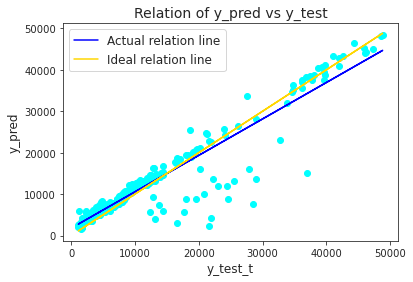

Slope: m= 0.88
Intercept: b= 1772.22


In [31]:
y_pred=model_rmse.predict(X_test)
plt.scatter(y_test, y_pred,  color='cyan')
m, b = np.polyfit(y_test, y_pred, 1) # 1 is the degree of the polynomial to fit.
plt.plot(y_test, m*y_test+b, color='blue', label="Actual relation line")
plt.plot(y_test, y_test, color='gold', label="Ideal relation line")
plt.title("Relation of y_pred vs y_test", fontsize=14)
plt.xlabel("y_test_t", fontsize=12)
plt.ylabel("y_pred", fontsize=12)
plt.legend(fontsize=12)
plt.show()
print("Slope: m=","{:.2f}".format(m))
print("Intercept: b=","{:.2f}".format(b))

In [32]:
#Calculating aspect ratio with correlation coefficient and R^2 between Y_pred and Y_test
correlation_matrix = np.corrcoef(y_test, y_pred)
correlation_xy = correlation_matrix[0,1]
r_squared = correlation_xy**2
print("R-squared between y_pred and y_test: ", "{:.2f}".format(r_squared))

R-squared between y_pred and y_test:  0.87


In [33]:
# Aspect ratio calculation (precision)
AR=(1-correlation_xy)**(0.5-1)
print(" 'Aspect Ratio': ", "{:.2f}".format(AR))

 'Aspect Ratio':  3.91


In [34]:
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))
r2 = r2_score(y_test, y_pred)
print('Testing performance of baseline model')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance of baseline model
RMSE: 4091.89
R2: 0.87
